In [ ]:
from google.colab import drive
import pandas as pd
import os

# 1. Mount Google Drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# User's Choice
## Hardcode them to a fixed True/False value which will speed up the process

In [ ]:
# Ask user for inputs (default = False if blank)
I_WANT_TO_TRAIN = input("Do you want to train? (y/n): ").strip().lower() == "y"
CALCULATE_ALPHAFOLD = input("Do you want to calculate AlphaFold? (y/n): ").strip().lower() == "y"
I_WANT_KABSCH_ALIGN = input("Do you want to run Kabsch alignment? (y/n): ").strip().lower() == "y"

print("Training:", I_WANT_TO_TRAIN)
print("AlphaFold:", CALCULATE_ALPHAFOLD)
print("Kabsch Align:", I_WANT_KABSCH_ALIGN)


# Helper Function

## Save checkpoint

In [ ]:
# Save function
def save_checkpoint(epoch, model, optimizer, scheduler, filename="vq_model_s1_checkpoint.pth"):
    checkpoint = {
        "epoch": epoch,
        "model_state_dict": model.state_dict(),
        "optimizer_state_dict": optimizer.state_dict(),
        "scheduler_state_dict": scheduler.state_dict(),
    }
    torch.save(checkpoint, filename)
    print(f"Checkpoint saved at epoch {epoch}")


## Load Checkpoint

In [ ]:
# Load function
def load_checkpoint(model, optimizer, scheduler, filename="vq_model_s2_checkpoint.pth"):
    checkpoint = torch.load(filename, map_location=device,weights_only=False)
    model.load_state_dict(checkpoint["model_state_dict"])
    optimizer.load_state_dict(checkpoint["optimizer_state_dict"])
    scheduler.load_state_dict(checkpoint["scheduler_state_dict"])
    return checkpoint["epoch"]




## trigger download

In [ ]:
from IPython.display import FileLink, display, HTML, Javascript

def trigger_download(filename, my_id=0):
    # Create the FileLink object
    file_link = FileLink(filename)

    # Get the path of the file
    file_path = file_link.path

    # Create the HTML link
    html = f'<a id="download_link_{file_path}_{my_id}" href="{file_path}" download>{file_path}</a>'

    # Display the HTML link
    display(HTML(html))

    # Create and run the JavaScript to automatically click the link
    js_code = f'''
    var link = document.getElementById('download_link_{file_path}_{my_id}');
    link.click();
    '''
    display(Javascript(js_code))




In [ ]:
# 2. Define the path to your CSV file
csv_path = '/content/drive/MyDrive/Protein/all_proteins_combined.csv'

# # 3. Read the CSV file
df = pd.read_csv(csv_path,low_memory=False)

# # # # 4. Rename columns, drop unwanted column, and save back
# df = df.rename(columns={
#     # "X_y": "X_ideal",
#     # "Y_y": "Y_ideal",
#     # "Z_y": "Z_ideal",
#     "X": "X_true",
#     "Y": "Y_true",
#     "Z": "Z_true",

# })

# # # # Save to same file (overwrite)
# df.to_csv(csv_path, index=False)


In [ ]:
df.head()

,record_name,atom_number,Atom_Name,alt_loc,Residue_Name,Chain,Residue_ID,insertion,X_true,Y_true,Z_true,occupancy,B_Factor,Element,X_ideal,Y_ideal,Z_ideal,protein_id
0,ATOM,1,N,NaN,MET,A,1,NaN,247.540138,-156.654813,8.071997,1.0,0.0,N,-0.522,1.364,0.000,1a03
1,ATOM,2,CA,NaN,MET,A,1,NaN,246.125628,-157.058904,7.942291,1.0,0.0,C,0.000,0.000,0.000,1a03
2,ATOM,3,C,NaN,MET,A,1,NaN,245.981785,-158.256652,7.002017,1.0,0.0,C,1.520,0.000,0.000,1a03
3,ATOM,4,O,NaN,MET,A,1,NaN,246.860924,-158.504873,6.176900,1.0,0.0,O,2.144,0.749,-0.749,1a03
4,ATOM,5,CB,NaN,MET,A,1,NaN,245.256148,-155.880989,7.475735,1.0,0.0,C,-0.507,-0.774,-1.206,1a03


In [ ]:
df.isna().any().any()


np.True_

In [ ]:
# Count NaNs per column
nan_counts = df.isna().sum()

# Show nicely
for col, count in nan_counts.items():
    print(f"{col}: {count}")


record_name: 0
atom_number: 0
Atom_Name: 0
alt_loc: 7696620
Residue_Name: 0
Chain: 0
Residue_ID: 0
insertion: 7697001
X_true: 0
Y_true: 0
Z_true: 0
occupancy: 0
B_Factor: 0
Element: 0
X_ideal: 0
Y_ideal: 0
Z_ideal: 0
protein_id: 0


In [ ]:
df.dropna(subset=['X_ideal', 'Y_ideal', 'Z_ideal'], inplace=True)

In [ ]:
nan_rows = df[df[['X_ideal', 'Y_ideal', 'Z_ideal']].isna().all(axis=1)]
print(nan_rows)


Empty DataFrame
Columns: [record_name, atom_number, Atom_Name, alt_loc, Residue_Name, Chain, Residue_ID, insertion, X_true, Y_true, Z_true, occupancy, B_Factor, Element, X_ideal, Y_ideal, Z_ideal, protein_id]
Index: []


# Kabsch Align Folded to unfolded structure

In [ ]:
import numpy as np
import pandas as pd
from tqdm.auto import tqdm

def kabsch_align(A, B):
    """
    A, B: numpy arrays of shape (N,3)
    Returns R, t such that (A - centroid_A) @ R + centroid_B ≈ B
    """
    centroid_A = A.mean(axis=0)
    centroid_B = B.mean(axis=0)
    AA = A - centroid_A
    BB = B - centroid_B
    H = AA.T @ BB
    U, S, Vt = np.linalg.svd(H)
    R = Vt.T @ U.T
    if np.linalg.det(R) < 0:
        Vt[-1,:] *= -1
        R = Vt.T @ U.T
    t = centroid_B - centroid_A @ R
    return R, t


if I_WANT_KABSCH_ALIGN:
  aligned_df = df.copy()

  for pid in tqdm(df['protein_id'].unique()):
      mask = df['protein_id'] == pid

      # Extract coordinate arrays
      A = df.loc[mask, ['X_true', 'Y_true', 'Z_true']].to_numpy()
      B = df.loc[mask, ['X_ideal', 'Y_ideal', 'Z_ideal']].to_numpy()

      # Compute rotation and translation
      R, t = kabsch_align(A, B)

      # Apply transformation
      A_aligned = (A - A.mean(axis=0)) @ R + B.mean(axis=0)
      # print(B.mean(axis=0))
      # Store back into the aligned DataFrame
      aligned_df.loc[mask, ['X_true', 'Y_true', 'Z_true']] = A_aligned
      # print(pid)
      # break
  df = aligned_df
  df.to_csv(csv_path, index=False)



In [ ]:
# # Compute centroids
# centroid_A_aligned = A_aligned.mean(axis=0)
# centroid_B = B.mean(axis=0)

# print(f"Protein ID: {pid}")
# print("Centroid of A_aligned:", centroid_A_aligned)
# print("Centroid of B (ideal):", centroid_B)
# print("Centroid difference:", centroid_A_aligned - centroid_B)

# # Compute RMSD before and after alignment
# rmsd_before = np.sqrt(np.mean(np.sum((A - B)**2, axis=1)))
# rmsd_after  = np.sqrt(np.mean(np.sum((A_aligned - B)**2, axis=1)))

# print(f"RMSD before alignment: {rmsd_before:.4f}")
# print(f"RMSD after alignment : {rmsd_after:.4f}")


# CSV to PDB string Function

In [ ]:
import pandas as pd

def csv_to_pdb_string(csv_path_or_df,suffix):
    """
    Convert a CSV (or a DataFrame) with columns like the user's PandasPdb 'ATOM' df
    into a PDB-format string (ATOM/HETATM lines).
    Expected columns (but function is forgiving):
      'record_name', 'atom_number', 'atom_name', 'alt_loc',
      'residue_name', 'chain_id', 'residue_number', 'insertion',
      'x_coord','y_coord','z_coord','occupancy','b_factor','element_symbol','charge'
    """
    if isinstance(csv_path_or_df, pd.DataFrame):
        df = csv_path_or_df.copy()
    else:
        df = pd.read_csv(csv_path_or_df)

    def safe_str(val):
        return "" if pd.isna(val) else str(val)

    lines = []
    for _, r in df.iterrows():
        record = safe_str(r.get('record_name', 'ATOM'))[:6].ljust(6)
        try:
            serial = int(r['atom_number'])
        except Exception:
            serial = 0
        name = safe_str(r.get('Atom_Name', ''))[:4].strip()   # 🔹 renamed
        atom_name_field = name.center(4)

        alt_loc = safe_str(r.get('alt_loc', ''))[:1]
        res_name = safe_str(r.get('Residue_Name', ''))[:3].rjust(3)   # 🔹 renamed
        chain_id = safe_str(r.get('Chain', ''))[:1]                   # 🔹 renamed
        try:
            res_seq = int(r['Residue_ID'])                            # 🔹 renamed
        except Exception:
            res_seq = 0
        insertion = safe_str(r.get('insertion', ''))[:1]

        try:
            x = float(r[f'X_{suffix}'])    # 🔹 renamed
        except Exception:
            x = 0.0
        try:
            y = float(r[f'Y_{suffix}'])    # 🔹 renamed
        except Exception:
            y = 0.0
        try:
            z = float(r[f'Z_{suffix}'])    # 🔹 renamed
        except Exception:
            z = 0.0
        try:
            occupancy = float(r.get('occupancy', 1.00))
        except Exception:
            occupancy = 1.00
        try:
            b_factor = float(r.get('B_Factor', 0.00))   # 🔹 renamed
        except Exception:
            b_factor = 0.00

        element = safe_str(r.get('Element', '')).strip()[:2].rjust(2)   # 🔹 renamed

        # charge = safe_str(r.get('charge', '')).strip()[:2].rjust(2)

        # Compose PDB line with fixed-column formatting.
        # Columns explained per PDB spec; this will produce standard-looking ATOM/HETATM rows.
        line = (
            f"{record}"                  # 1-6
            f"{serial:5d} "              # 7-11 + a space (12)
            f"{atom_name_field}"         # 13-16
            f"{alt_loc:1}"               # 17
            f"{res_name:>3}"             # 18-20
            f" "                         # 21 (blank)
            f"{chain_id:1}"              # 22
            f"{res_seq:4d}"              # 23-26
            f"{insertion:1}"             # 27
            f"   "                       # 28-30 (blank)
            f"{x:8.3f}{y:8.3f}{z:8.3f}"  # 31-54 x,y,z
            f"{occupancy:6.2f}{b_factor:6.2f}"  # 55-66 occupancy & tempFactor
            f"          "                # 67-76 (blank)
            f"{element:>2}"              # 77-78 element
            # f"{charge:>2}"               # 79-80 charge
        )
        lines.append(line)

    lines.append("END")
    pdb_str = "\n".join(lines) + "\n"
    return pdb_str

# Example usage:
# df = pd.read_csv("your_saved_pdb.csv")
# pdb_string = csv_to_pdb_string(df)
# print(pdb_string[:1000])


In [ ]:
! pip install py3Dmol

### Visualizaing Unfolded and Folded Protein

In [ ]:
# pip install py3Dmol
import py3Dmol
start=32*3


pdb_str1 = csv_to_pdb_string(df[(df.protein_id=='1a03')],'ideal')  # or pass a DataFrame
pdb_str2 = csv_to_pdb_string(df[df.protein_id=='1a03'],'true')  # or pass a DataFrame

import py3Dmol
view = py3Dmol.view(width=800, height=600)
view.addModel(pdb_str1, "pdb")
view.setStyle({'model': 0}, {'cartoon': {'color': 'blue'}})

view.addModel(pdb_str2, "pdb")
view.setStyle({'model': 1}, {'cartoon': {'color': 'red'}})
view.zoomTo()
view.show()


3Dmol.js failed to load for some reason. Please check your browser console for error messages.

In [ ]:
!pip install biopython py3Dmol

# Protein Tokenization

In [ ]:
df.columns

Index(['record_name', 'atom_number', 'Atom_Name', 'alt_loc', 'Residue_Name',
       'Chain', 'Residue_ID', 'insertion', 'X_true', 'Y_true', 'Z_true',
       'occupancy', 'B_Factor', 'Element', 'X_ideal', 'Y_ideal', 'Z_ideal',
       'protein_id'],
      dtype='object')

In [ ]:
# Group by and count instances
counts = (
    df.groupby(["Residue_ID", "protein_id", "Chain"])
      .size()             # count rows in each group
      .reset_index(name="count")  # move result back into a DataFrame
)

print(counts.head())


   Residue_ID protein_id Chain  count
0           1       1a03     A     19
1           1       1a03     B     19
2           1       1a0n     A     16
3           1       1a0n     B     15
4           1       1a11     A      9


In [ ]:
counts['count'].values.sum()

np.int64(7697292)

In [ ]:
import pandas as pd

# Assuming your dataframe is df

# Count number of residues per protein per chain
residue_counts = (
    df.groupby(["protein_id", "Chain"])["Residue_ID"]
    .nunique()
    .reset_index(name="num_residues")
)

# Get maximum residues per protein
max_residues = residue_counts["num_residues"].max()

print("Maximum number of residues per protein chain:", max_residues)

# If you also want to see which protein/chain has it:
max_entry = residue_counts.loc[residue_counts["num_residues"].idxmax()]
print("Protein with max residues:")
print(max_entry)


Maximum number of residues per protein chain: 388
Protein with max residues:
protein_id      2gve
Chain              A
num_residues     388
Name: 5641, dtype: object


In [ ]:
df[df.protein_id=='2gve'].Chain.nunique()

1

In [ ]:
import pandas as pd

# Assuming df is your dataframe
# Step 1: Get unique (protein_id, Chain, Residue_ID) combinations
unique_residues = df[['protein_id', 'Chain', 'Residue_ID']].drop_duplicates()

# Step 2: Count residues per protein
residue_counts = unique_residues.groupby('protein_id').size()

# Step 3: Get max total residues across proteins
max_residues = residue_counts.max()

print("Maximum total residues in a protein (all chains combined):", max_residues)

# If you also want to see which protein has this max:
max_protein = residue_counts.idxmax()
print("Protein with max residues:", max_protein)


Maximum total residues in a protein (all chains combined): 452
Protein with max residues: 2k8m


In [ ]:
# Group by residue (Residue_ID + protein_id + Chain to be safe)
residue_atom_counts = (
    df.groupby(["Residue_ID", "protein_id", "Chain"])
      .size()  # count atoms per residue
)

# Find maximum number of atoms in a residue
max_atoms = residue_atom_counts.max()

# Optionally: find which residue(s) have this maximum
largest_residues = residue_atom_counts[residue_atom_counts == max_atoms]

print("Maximum number of atoms in a residue:", max_atoms)
print("\nResidues with maximum atoms:\n", largest_residues)


Maximum number of atoms in a residue: 32

Residues with maximum atoms:
 Residue_ID  protein_id  Chain
289         2gve        A        32
dtype: int64


In [ ]:
MAX_NUM_ATOMS=max_atoms

# Tokenization

## Structural Tokenization

In [ ]:
FINAL_LATENT_DIM = 128

#### True Corrdinates

In [ ]:
import numpy as np
import pandas as pd
from tqdm import tqdm

MAX_LEN = MAX_NUM_ATOMS+1

def process_all_residues(df,cols=["X_true", "Y_true", "Z_true"]):
    """
    Vectorized version of process_residue_simple for the whole DataFrame.
    Returns:
        coord_tokens: (n_residues, MAX_LEN, 3)
        mask: (n_residues, MAX_LEN)
        residues: residue info DataFrame
    """
    # Ensure df is ordered so that residues are in sequence order per protein.
    # Uncomment and adapt if needed:
    # df = df.sort_values(["protein_id", "Chain", "Residue_ID", "atom_index"], kind="stable")

    groups = df.groupby(["Residue_ID", "protein_id", "Chain"], sort=False)
    n_residues = len(groups)

    coord_tokens = np.zeros((n_residues, MAX_LEN, 3), dtype=np.float32)
    mask = np.zeros((n_residues, MAX_LEN), dtype=np.float32)

    residues_info = []

    for i, (key, group) in enumerate(tqdm(groups, desc="Processing residues", total=n_residues)):
        coords = group[cols].to_numpy(dtype=np.float32)
        n = min(len(coords), MAX_LEN)

        coord_tokens[i, :n] = coords[:n]
        mask[i, :n] = 1.0
        residues_info.append(key)

    residues = pd.DataFrame(residues_info, columns=["Residue_ID", "protein_id", "Chain"])
    return coord_tokens, mask, residues


In [ ]:
import os
import numpy as np

# Path to Protein folder in your Drive
protein_folder = "/content/drive/MyDrive/Protein"
os.makedirs(protein_folder, exist_ok=True)

x_path = os.path.join(protein_folder, "X_struct.npy")
m_path = os.path.join(protein_folder, "M_struct.npy")

if os.path.exists(x_path) and os.path.exists(m_path):
    # --- Load from saved files ---
    X = np.load(x_path)
    M = np.load(m_path)
    print("Loaded X.npy and M.npy from Protein folder.")
else:
    # --- Process residues ---
    coord_tokens, mask, residues = process_all_residues(df)

    # --- Find residues where the next one is in the same protein ---
    same_protein_next = (residues["protein_id"].shift(-1) == residues["protein_id"])
    indices = np.flatnonzero(same_protein_next.to_numpy())

    # --- Insert the first atom of next residue into last slot ---
    coord_tokens[indices, -1, :] = coord_tokens[indices + 1, 0, :]
    mask[indices, -1] = 1.0

    # --- Shift so first atom is origin and zero out padded positions ---
    shifted = (coord_tokens - coord_tokens[:, 0:1, :]) * mask[:, :, None]
    X, M = shifted, mask

    # Save arrays
    np.save(x_path, X)
    np.save(m_path, M)
    print("Processed and saved X.npy and M.npy in Protein folder.")


Loaded X.npy and M.npy from Protein folder.


In [ ]:
original_struct=X
original_struct_mask=M

In [ ]:
import os
import numpy as np

# Path to Protein folder in your Drive
protein_folder = "/content/drive/MyDrive/Protein"
os.makedirs(protein_folder, exist_ok=True)

i_x_path = os.path.join(protein_folder, "i_X_struct.npy")
i_m_path = os.path.join(protein_folder, "i_M_struct.npy")

if os.path.exists(i_x_path) and os.path.exists(i_m_path):
    # --- Load from saved files ---
    i_X = np.load(i_x_path)
    i_M = np.load(i_m_path)
    print("Loaded i_X.npy and i_M.npy from Protein folder.")
else:
    # --- Process residues ---
    coord_tokens, mask, residues = process_all_residues(df)

    # --- Find residues where the next one is in the same protein ---
    same_protein_next = (residues["protein_id"].shift(-1) == residues["protein_id"])
    indices = np.flatnonzero(same_protein_next.to_numpy())

    # --- Insert the first atom of next residue into last slot ---
    coord_tokens[indices, -1, :] = coord_tokens[indices + 1, 0, :]
    mask[indices, -1] = 1.0

    # --- Shift so first atom is origin and zero out padded positions ---
    shifted = (coord_tokens - coord_tokens[:, 0:1, :]) * mask[:, :, None]
    i_X, i_M = shifted, mask

    # Save arrays
    np.save(i_x_path, i_X)
    np.save(i_m_path, i_M)
    print("Processed and saved X.npy and M.npy in Protein folder.")


Loaded i_X.npy and i_M.npy from Protein folder.


In [ ]:
import numpy as np
import pandas as pd

def invert_shifted_relative(shifted: np.ndarray, mask: np.ndarray, residues: pd.DataFrame):
    """
    Reconstruct coord_tokens relative to per-protein origin (first residue first-atom = [0,0,0]).

    Args:
        shifted:   (n_residues, MAX_LEN, 3) float32 array produced by your pipeline.
        mask:      (n_residues, MAX_LEN) array (0/1 or floats).
        residues:  DataFrame with column "protein_id" in same order as shifted.

    Returns:
        coord_tokens_rel: (n_residues, MAX_LEN, 3) float32 array (relative coords).
        first_atoms_rel:  (n_residues, 3) float32 array of per-residue first-atom positions (relative).
    """
    n_residues = shifted.shape[0]
    # boolean where next residue is in same protein
    same_protein_next = (residues["protein_id"].shift(-1) == residues["protein_id"]).to_numpy()

    # allocate first-atom array (relative to protein origin)
    first_atoms = np.zeros((n_residues, 3), dtype=np.float32)

    # iterate forward building first_atoms relative to protein origin
    for i in tqdm(range(n_residues - 1)):
        if same_protein_next[i]:
            # shifted[i, -1] holds first_{i+1} - first_i
            first_atoms[i + 1] = first_atoms[i] + shifted[i, -1]
        else:
            # protein boundary -> next residue anchored to origin (0,0,0)
            first_atoms[i + 1] = 0.0

    # reconstruct coords by adding per-residue first atom back
    coord_tokens_rel = shifted + first_atoms[:, None, :]

    # mask out padded positions (in case of tiny numerical drift)
    mask_bool = (mask != 0)
    coord_tokens_rel = coord_tokens_rel * mask_bool[:, :, None]

    return coord_tokens_rel.astype(np.float32), first_atoms.astype(np.float32)


### Detokenization: Inverting Tokens back

In [ ]:
import numpy as np

def invert_shifted_relative(shifted: np.ndarray, mask: np.ndarray, residues=None):
    """
    Reconstruct coord_tokens relative to per-protein origin (first residue first-atom = [0,0,0]).
    Instead of using residues DataFrame to check protein boundaries, this version checks the
    mask of the last position: mask[i, -1] == 1 means residue i stores the relative vector
    to residue i+1 in its last slot.

    Args:
        shifted:   (n_residues, MAX_LEN, 3) float32 array produced by your pipeline.
                   Each residue's coordinates are SHIFTED so its own first atom is origin.
                   The last column (or first free column) may contain the next-residue offset.
        mask:      (n_residues, MAX_LEN) array (0/1 or floats); non-zero indicates valid entry.
        residues:  (optional) DataFrame left for API-compatibility; not used here.

    Returns:
        coord_tokens_rel: (n_residues, MAX_LEN, 3) float32 array (absolute/relative to protein origin).
        first_atoms_rel:  (n_residues, 3) float32 array of per-residue first-atom positions (relative).
    """
    try:
        from tqdm import tqdm
    except Exception:
        tqdm = range

    shifted = shifted.astype(np.float32)
    mask = mask.astype(np.float32)

    n_residues = shifted.shape[0]

    # boolean: last slot has data (non-zero) -> indicates the stored next-relative vector exists here
    last_slot_nonzero = (mask[:, -1] != 0)

    # make boolean array same length as n_residues with last element False (no "next" for final residue)
    same_protein_next = np.zeros(n_residues, dtype=bool)
    same_protein_next[:-1] = last_slot_nonzero[:-1]

    # allocate first-atom positions relative to protein origin
    first_atoms = np.zeros((n_residues, 3), dtype=np.float32)
    # first_atoms[0] is already zeros (protein origin)

    # forward pass: build first_atoms cumulatively using the stored relative vectors in last slot
    for i in tqdm(range(n_residues - 1), desc="invert_shifted_relative"):
        if same_protein_next[i]:
            # assume shifted[i, -1] contains (first_{i+1} - first_i)
            rel = shifted[i, -1].astype(np.float32)
            first_atoms[i + 1] = first_atoms[i] + rel
        else:
            # boundary: next residue resets to protein origin
            first_atoms[i + 1] = 0.0

    # reconstruct absolute/relative-to-protein coords by adding per-residue first atoms
    coord_tokens_rel = shifted + first_atoms[:, None, :]

    # mask out padded positions (in case of tiny numerical drift)
    mask_bool = (mask != 0)
    coord_tokens_rel = coord_tokens_rel * mask_bool[:, :, None]

    return coord_tokens_rel.astype(np.float32), first_atoms.astype(np.float32)


In [ ]:
coord_tokens_rel, first_atoms_rel = invert_shifted_relative(original_struct, original_struct_mask)
# remove last residue
coord_trim = coord_tokens_rel[:,:-1]   # shape (N-1, L, 3)
mask_trim  = original_struct_mask[:,:-1].astype(bool)     # shape (N-1, L)

# flatten then boolean-index (works because shapes match when flattened)
all_valid_rows = coord_trim.reshape(-1, 3)[mask_trim.ravel()]

# shapes
print(coord_trim.shape)      # (N-1, L, 3)
print(mask_trim.shape)       # (N-1, L)
print(all_valid_rows.shape)  # (K, 3) where K = sum(mask_trim)


invert_shifted_relative: 100%|██████████| 501617/501617 [00:01<00:00, 403646.32it/s]


(501618, 32, 3)
(501618, 32)
(7697292, 3)


In [ ]:
print(df.shape)

(7697292, 18)


In [ ]:
first_atoms_rel.shape, coord_tokens_rel.shape

((501618, 3), (501618, 33, 3))

In [ ]:
M.shape

(501618, 33)

In [ ]:
# coord_tokens_rel

In [ ]:
df[['X_true','Y_true','Z_true']].values.shape

(7697292, 3)

### Structural Encoder

In [ ]:
from torch.utils.data import Dataset, DataLoader, random_split

import numpy as np
import pandas as pd
from tqdm import tqdm
import torch
import torch.nn as nn

from sklearn.metrics import r2_score
import random

# Autoencoder for residues (25x3 -> latent 32 -> reconstruct)
# Requires: pandas, numpy, torch, sklearn, tqdm


# -----------------------------
# Config
# -----------------------------
MAX_LEN = MAX_NUM_ATOMS+1
LATENT_DIM = FINAL_LATENT_DIM
BATCH_SIZE = 64

LR = 1e-3
SEED = 42
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# reproducibility
torch.manual_seed(SEED)
np.random.seed(SEED)
random.seed(SEED)
# -----------------------------
# PyTorch Dataset
# -----------------------------
class ResidueDataset(Dataset):
    def __init__(self, X_np, M_np):
        # X_np: (N, 25, 3), M_np: (N, 25)
        self.X = torch.from_numpy(X_np).float()
        self.M = torch.from_numpy(M_np).float()
        # flatten target to (25*3) for the model (we will reshape in collate)
        # but keep shape (25,3) for mask usage
    def __len__(self):
        return self.X.shape[0]
    def __getitem__(self, idx):
        # Return input (25,3), mask (25) and target (25,3)
        return self.X[idx], self.M[idx], self.X[idx]  # input and target same (autoencoder)

# -----------------------------
# Model: simple MLP autoencoder
# -----------------------------
import torch
import torch.nn as nn

class AE(nn.Module):
    def __init__(self, max_len=25, INPUT_FEAT=3, latent_dim=32, hidden_dim=256):
        """
        Simple MLP autoencoder for residue features.

        Args:
            max_len: maximum number of atoms per residue (sequence length)
            INPUT_FEAT: number of features per atom
            latent_dim: size of latent vector
            hidden_dim: size of hidden layers in encoder/decoder
        """
        super().__init__()
        self.max_len = max_len
        self.INPUT_FEAT = INPUT_FEAT
        self.latent_dim = latent_dim

        input_dim = max_len * INPUT_FEAT  # flattened input

        # --- Encoder ---
        self.encoder = nn.Sequential(
            nn.Flatten(),               # (batch, max_len*INPUT_FEAT)
            nn.Linear(input_dim, hidden_dim),
            nn.ReLU(inplace=True),
            nn.Linear(hidden_dim, 128),
            nn.ReLU(inplace=True),
            nn.Linear(128, latent_dim)
        )

        # --- Decoder ---
        self.decoder = nn.Sequential(
            nn.Linear(latent_dim, 128),
            nn.ReLU(inplace=True),
            nn.Linear(128, hidden_dim),
            nn.ReLU(inplace=True),
            nn.Linear(hidden_dim, input_dim)  # regression to original features
        )

    def forward(self, x):
        """
        Forward pass.

        Args:
            x: tensor of shape (batch, max_len, INPUT_FEAT)
        Returns:
            out: reconstructed tensor of shape (batch, max_len, INPUT_FEAT)
            z: latent vector of shape (batch, latent_dim)
        """
        z = self.encoder(x)              # encode
        out_flat = self.decoder(z)       # decode
        out = out_flat.view(x.shape[0], self.max_len, self.INPUT_FEAT)
        return out, z



In [ ]:
# import torch
# import torch.nn as nn

# # --- Test AE with random data ---
# MAX_LEN = 25
# INPUT_FEAT = 3
# BATCH_SIZE = 16
# LATENT_DIM = 32

# # Random input tensor
# x = torch.randn(BATCH_SIZE, MAX_LEN, INPUT_FEAT)

# # Instantiate model
# model = AE(max_len=MAX_LEN, INPUT_FEAT=INPUT_FEAT, latent_dim=LATENT_DIM)

# # Forward pass
# recon, latent = model(x)

# print("Input shape:", x.shape)
# # print("Reco


### Structural Dataloader

In [ ]:

# -----------------------------
# Masked MSE loss (averaged over real atoms only)
# -----------------------------
def masked_mse_loss(pred, target, mask):
    # pred, target: (batch, 25, 3)
    # mask: (batch, 25) -> expand to (batch,25,3)
    mask3 = mask.unsqueeze(-1)  # (batch,25,1)
    diff = (pred - target) * mask3
    # sum squared error across coords
    sse = (diff ** 2).sum()
    # number of real elements
    n_real = mask3.sum() * 3.0  # each atom has 3 coords
    # guard
    if n_real.item() == 0:
        return torch.tensor(0.0, device=pred.device)
    mse = sse / n_real
    return mse


In [ ]:
BATCH_SIZE = 64 * 4 * 2
SEED = 42

# -----------------------------
# Dataset / Dataloaders
# -----------------------------
dataset = ResidueDataset(X, M)
N = len(dataset)

train_size = int(0.7 * N)
val_size = int(0.1 * N)
test_size = N - train_size - val_size  # ensures total = N

train_ds, val_ds, test_ds = torch.utils.data.random_split(
    dataset, [train_size, val_size, test_size],
    generator=torch.Generator().manual_seed(SEED)
)

i_dataset = ResidueDataset(i_X, i_M)
N = len(i_dataset)

i_train_size = int(0.8 * N)
i_val_size = int(0.1 * N)
i_test_size = N - i_train_size - i_val_size

i_train_ds, i_val_ds, i_test_ds = torch.utils.data.random_split(
    i_dataset, [i_train_size, i_val_size, i_test_size],
    generator=torch.Generator().manual_seed(SEED)
)

from torch.utils.data import ConcatDataset, DataLoader

# Combine the splits
combined_train_ds = ConcatDataset([train_ds, i_train_ds])
combined_val_ds = ConcatDataset([val_ds, i_val_ds])
combined_test_ds = ConcatDataset([test_ds, i_test_ds])

# Create DataLoaders
train_loader = DataLoader(combined_train_ds, batch_size=BATCH_SIZE, shuffle=True, pin_memory=True)
val_loader = DataLoader(combined_val_ds, batch_size=BATCH_SIZE, shuffle=False, pin_memory=True)
test_loader = DataLoader(combined_test_ds, batch_size=BATCH_SIZE, shuffle=False, pin_memory=True)


In [ ]:
all_target_data = DataLoader(dataset, batch_size=BATCH_SIZE, shuffle=False, pin_memory=True)
all_input_data = DataLoader(i_dataset, batch_size=BATCH_SIZE, shuffle=False, pin_memory=True)

### Declarations

In [ ]:
structural_encoder =  AE(max_len=MAX_LEN, INPUT_FEAT=3, latent_dim=LATENT_DIM).to(DEVICE)
optimizer = torch.optim.Adam(structural_encoder.parameters(), lr=LR)
# optionally a scheduler
# Instead of ReduceLROnPlateau:
# scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, 'min', patience=5, factor=0.5)

# Use StepLR: decay LR by gamma every step_size epochs
step_size = 20   # decay every 10 epochs
gamma = 0.8      # multiply LR by 0.5
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=step_size, gamma=gamma)

In [ ]:
# import torch

# # Example parameters
# BATCH_SIZE = 4   # you can pick any batch size
# # MAX_LEN = 26     # must match what you used
# INPUT_FEAT = 3   # x, y, z
# LATENT_DIM = 128  # whatever you set
# DEVICE = "cuda" if torch.cuda.is_available() else "cpu"

# # Create random input
# x = torch.randn(BATCH_SIZE, MAX_LEN, INPUT_FEAT).to(DEVICE)

# # Forward pass
# structural_encoder = AE(max_len=MAX_LEN, INPUT_FEAT=INPUT_FEAT, latent_dim=LATENT_DIM).to(DEVICE)
# output = structural_encoder(x)

# print("Input shape :", x.shape)
# print("Output type :", type(output))
# if isinstance(output, tuple) or isinstance(output, list):
#     print("Output shapes :", [o.shape for o in output])
# else:
#     print("Output shape :", output.shape)


In [ ]:
if os.path.exists('/content/drive/MyDrive/Protein/best_structural_encoder_final_2.pth'):
  structural_encoder.load_state_dict(torch.load('/content/drive/MyDrive/Protein/best_structural_encoder_final_2.pth'))
  # Evaluate on test after epoch
  structural_encoder.eval()
  test_sse = 0.0
  test_count = 0.0
  all_true = []
  all_pred = []
  with torch.no_grad():
      for batch in tqdm(test_loader, leave=False):
          x_batch, mask_batch, target_batch = batch
          x_batch = x_batch.to(DEVICE)
          mask_batch = mask_batch.to(DEVICE)
          target_batch = target_batch.to(DEVICE)
          pred_batch, _ = structural_encoder(x_batch)
          # accumulate loss for reporting
          diff = (pred_batch - target_batch) * mask_batch.unsqueeze(-1)
          sse_batch = (diff ** 2).sum().item()
          n_real_batch = (mask_batch.sum().item() * 3.0)
          test_sse += sse_batch
          test_count += n_real_batch
          # for R2, gather flattened real coords
          # move to cpu numpy for sklearn r2_score
          mask_np = mask_batch.cpu().numpy()
          pred_np = pred_batch.cpu().numpy()
          target_np = target_batch.cpu().numpy()
          # flatten selecting real elements
          # shape (batch,25,3) -> (batch*25*3,)
          # select positions where mask==1
          bsize = mask_np.shape[0]
          for i in range(bsize):
              m_i = mask_np[i]  # (25,)
              if m_i.sum() == 0:
                  continue
              real_idx = np.where(m_i == 1.0)[0]
              # gather coords for those atom indices
              t_sel = target_np[i, real_idx, :].reshape(-1)  # (n_atoms*3,)
              p_sel = pred_np[i, real_idx, :].reshape(-1)
              all_true.append(t_sel)
              all_pred.append(p_sel)
  best_val_loss = (test_sse / test_count) if test_count > 0 else float("nan")
else:
  best_val_loss=float("inf")

In [ ]:
print("previous best val",best_val_loss)

previous best val 0.00012016111208294956


In [ ]:
device=DEVICE

In [ ]:
if os.path.exists('/content/drive/MyDrive/Protein/checkpoint_structural_encoder_final_2.pth'):

  start_epoch=load_checkpoint(structural_encoder,optimizer,scheduler,'/content/drive/MyDrive/Protein/checkpoint_structural_encoder_final_2.pth')
else:
  start_epoch=0

### Train and testing

In [ ]:

# -----------------------------
# Train loop
# -----------------------------

if I_WANT_TO_TRAIN:
  EPOCHS = 300
else:
  EPOCHS = 0

best_val_loss=float("inf")
for epoch in range(start_epoch, start_epoch+EPOCHS ):
    structural_encoder.train()
    running_loss = 0.0
    pbar = tqdm(train_loader, desc=f"Epoch {epoch}/{(start_epoch+EPOCHS)} [train]", leave=False)
    for batch in pbar:
        x_batch, mask_batch, target_batch = batch  # each is tensor
        x_batch = x_batch.to(DEVICE)
        mask_batch = mask_batch.to(DEVICE)
        target_batch = target_batch.to(DEVICE)
        optimizer.zero_grad()
        pred_batch, _ = structural_encoder(x_batch)
        loss = masked_mse_loss(pred_batch, target_batch, mask_batch)
        loss.backward()
        optimizer.step()
        running_loss += loss.item() * x_batch.size(0)
        pbar.set_postfix({"loss": loss.item()})
    epoch_loss = running_loss / len(train_ds)
    scheduler.step()
    # Evaluate on test after epoch
    structural_encoder.eval()
    test_sse = 0.0
    test_count = 0.0
    all_true = []
    all_pred = []
    with torch.no_grad():
        for batch in tqdm(test_loader, desc=f"Epoch {epoch}/{start_epoch+EPOCHS} [test] ", leave=False):
            x_batch, mask_batch, target_batch = batch
            x_batch = x_batch.to(DEVICE)
            mask_batch = mask_batch.to(DEVICE)
            target_batch = target_batch.to(DEVICE)
            pred_batch, _ = structural_encoder(x_batch)
            # accumulate loss for reporting
            diff = (pred_batch - target_batch) * mask_batch.unsqueeze(-1)
            sse_batch = (diff ** 2).sum().item()
            n_real_batch = (mask_batch.sum().item() * 3.0)
            test_sse += sse_batch
            test_count += n_real_batch
            # for R2, gather flattened real coords
            # move to cpu numpy for sklearn r2_score
            mask_np = mask_batch.cpu().numpy()
            pred_np = pred_batch.cpu().numpy()
            target_np = target_batch.cpu().numpy()
            # flatten selecting real elements
            # shape (batch,25,3) -> (batch*25*3,)
            # select positions where mask==1
            bsize = mask_np.shape[0]
            for i in range(bsize):
                m_i = mask_np[i]  # (25,)
                if m_i.sum() == 0:
                    continue
                real_idx = np.where(m_i == 1.0)[0]
                # gather coords for those atom indices
                t_sel = target_np[i, real_idx, :].reshape(-1)  # (n_atoms*3,)
                p_sel = pred_np[i, real_idx, :].reshape(-1)
                all_true.append(t_sel)
                all_pred.append(p_sel)
    test_mse = (test_sse / test_count) if test_count > 0 else float("nan")
    # compute R2 across concatenated arrays
    if len(all_true) > 0:
        y_true_concat = np.concatenate(all_true)
        y_pred_concat = np.concatenate(all_pred)
        test_r2 = r2_score(y_true_concat, y_pred_concat)
    else:
        test_r2 = float("nan")
    if test_mse < best_val_loss:
        best_val_loss = test_mse
        torch.save(structural_encoder.state_dict(), "/content/drive/MyDrive/Protein/best_structural_encoder_final_2.pth")
    if epoch % 10 == 0:
        save_checkpoint(epoch, structural_encoder, optimizer, scheduler, filename="/content/drive/MyDrive/Protein/checkpoint_structural_encoder_final_2.pth")
    # print epoch summary
    print(f"Epoch {epoch:02d}/{start_epoch+EPOCHS}  Train MSE: {epoch_loss:.6e}  Test MSE: {test_mse:.6e}  Test R2: {test_r2:.4f}")

### Final Eval

In [ ]:
#train for 50 epoch
structural_encoder.load_state_dict(torch.load('/content/drive/MyDrive/Protein/best_structural_encoder_final_2.pth'))

<All keys matched successfully>

In [ ]:

# -----------------------------
# Final evaluation on test set (detailed)
# -----------------------------
structural_encoder.eval()
all_true = []
all_pred = []
with torch.no_grad():
    for batch in tqdm(test_loader, desc="Final test eval"):
        x_batch, mask_batch, target_batch = batch
        x_batch = x_batch.to(DEVICE)
        mask_batch = mask_batch.to(DEVICE)
        target_batch = target_batch.to(DEVICE)
        pred_batch, _ = structural_encoder(x_batch)
        mask_np = mask_batch.cpu().numpy()
        pred_np = pred_batch.cpu().numpy()
        target_np = target_batch.cpu().numpy()
        bsize = mask_np.shape[0]
        for i in range(bsize):
            m_i = mask_np[i]
            if m_i.sum() == 0:
                continue
            inds = np.where(m_i == 1.0)[0]
            all_true.append(target_np[i, inds, :].reshape(-1))
            all_pred.append(pred_np[i, inds, :].reshape(-1))
if len(all_true) > 0:
    y_true = np.concatenate(all_true)
    y_pred = np.concatenate(all_pred)
    final_mse = np.mean((y_true - y_pred) ** 2)
    final_r2 = r2_score(y_true, y_pred)
    print("FINAL TEST MSE:", final_mse)
    print("FINAL TEST R2:", final_r2)
else:
    print("No real atoms in test set? Check mask construction.")

Final test eval: 100%|██████████| 294/294 [00:03<00:00, 84.61it/s]


FINAL TEST MSE: 0.00012016109
FINAL TEST R2: 0.999970018863678


### Converting to structural Tokens

In [ ]:
import os
from tqdm import tqdm

encoded_target_loader = []
encoded_structural_loader = []

if os.path.exists('/content/drive/MyDrive/Protein/best_structural_encoder_final_2.pth'):
    structural_encoder.load_state_dict(
        torch.load('/content/drive/MyDrive/Protein/best_structural_encoder_final_2.pth')
    )
    structural_encoder.eval()

    with torch.no_grad():
        for batch_target, batch_input in tqdm(zip(all_target_data, all_input_data), leave=False):
            # --- Encode target batch ---
            x_batch, mask_batch, target_batch = batch_target
            x_batch = x_batch.to(DEVICE)
            mask_batch = mask_batch.to(DEVICE)
            target_batch = target_batch.to(DEVICE)

            _, encoded_target = structural_encoder(x_batch)
            encoded_target_loader.append(encoded_target.cpu())

            # --- Encode input (structural) batch ---
            x_batch, mask_batch, target_batch = batch_input
            x_batch = x_batch.to(DEVICE)
            mask_batch = mask_batch.to(DEVICE)
            target_batch = target_batch.to(DEVICE)

            _, encoded_structural = structural_encoder(x_batch)
            encoded_structural_loader.append(encoded_structural.cpu())

    # Convert lists to tensors for later usage
    encoded_target_loader = torch.cat(encoded_target_loader, dim=0)
    encoded_structural_loader = torch.cat(encoded_structural_loader, dim=0)

    print("Encoded target loader shape:", encoded_target_loader.shape)
    print("Encoded structural loader shape:", encoded_structural_loader.shape)


Encoded target loader shape: torch.Size([501618, 128])
Encoded structural loader shape: torch.Size([501618, 128])


### PCA

Partial-fitting IncrementalPCA on target tensor...


100%|██████████| 11/11 [00:06<00:00,  1.81it/s]


Partial-fitting IncrementalPCA on structural tensor...


100%|██████████| 11/11 [00:04<00:00,  2.46it/s]


Transforming target tensor...


100%|██████████| 11/11 [00:00<00:00, 37.37it/s]


Transforming structural tensor...


100%|██████████| 11/11 [00:00<00:00, 45.83it/s]


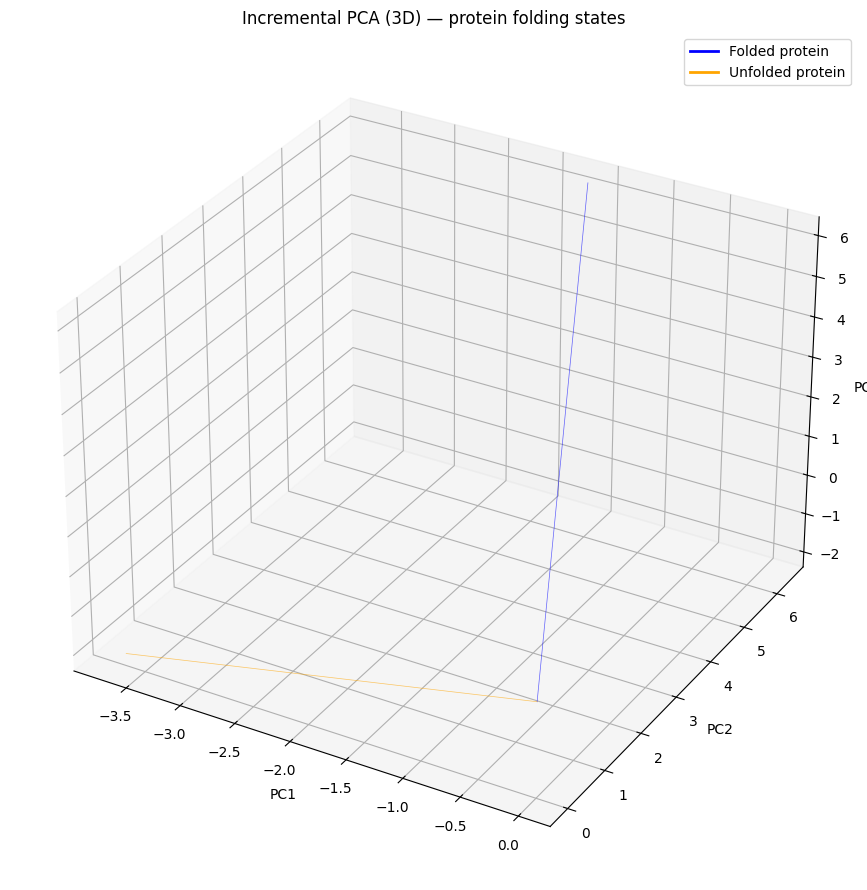

In [ ]:
# Requires: numpy, torch, matplotlib, scikit-learn, tqdm
import numpy as np
import torch
from tqdm import tqdm
import matplotlib.pyplot as plt
from sklearn.decomposition import IncrementalPCA
from mpl_toolkits.mplot3d import Axes3D  # noqa: F401 (needed to enable 3D plotting backend)

def fast_3d_viz_pca(encoded_target_loader,
                    encoded_structural_loader,
                    batch_size=50000,
                    plot_subsample=200000,
                    out_png='pca_3d_viz.png',
                    random_seed=42):
    """
    Stream both tensors through IncrementalPCA(n_components=3), show progress with tqdm,
    and plot a 3D scatter (two colours: target vs structural).

    Parameters
    ----------
    encoded_target_loader, encoded_structural_loader : torch.Tensor (N, D)
        Embeddings (can be on GPU or CPU).
    batch_size : int
        Batch size used for partial_fit and transform.
    plot_subsample : int
        Number of points to plot (subsample from the full projected set if total > plot_subsample).
    out_png : str
        Path to save the PNG image.
    random_seed : int
        Seed for subsampling reproducibility.

    Returns
    -------
    Z : np.ndarray, shape (N_total, 3)
        3D PCA coordinates for all points (kept in memory).
    labels : np.ndarray, shape (N_total,)
        0 for encoded_target_loader, 1 for encoded_structural_loader.
    """
    # convert to numpy (safe for GPU tensors too)
    t = encoded_target_loader.detach().cpu().numpy()
    s = encoded_structural_loader.detach().cpu().numpy()

    n_t = t.shape[0]
    n_s = s.shape[0]
    total = n_t + n_s

    ipca = IncrementalPCA(n_components=3)

    def batch_generator(arr, bsize):
        for i in range(0, arr.shape[0], bsize):
            yield arr[i:i+bsize]

    # 1) partial_fit on combined stream with progress bars
    print("Partial-fitting IncrementalPCA on target tensor...")
    for batch in tqdm(batch_generator(t, batch_size), total=(t.shape[0] + batch_size - 1) // batch_size):
        ipca.partial_fit(batch)
    print("Partial-fitting IncrementalPCA on structural tensor...")
    for batch in tqdm(batch_generator(s, batch_size), total=(s.shape[0] + batch_size - 1) // batch_size):
        ipca.partial_fit(batch)

    # 2) transform in batches (also with progress) and store results
    Z = np.zeros((total, 3), dtype=float)
    labels = np.zeros(total, dtype=int)
    idx = 0
    print("Transforming target tensor...")
    for batch in tqdm(batch_generator(t, batch_size), total=(t.shape[0] + batch_size - 1) // batch_size):
        nb = batch.shape[0]
        Z[idx:idx+nb] = ipca.transform(batch)
        labels[idx:idx+nb] = 0
        idx += nb

    print("Transforming structural tensor...")
    for batch in tqdm(batch_generator(s, batch_size), total=(s.shape[0] + batch_size - 1) // batch_size):
        nb = batch.shape[0]
        Z[idx:idx+nb] = ipca.transform(batch)
        labels[idx:idx+nb] = 1
        idx += nb

    # 3) plotting (subsample if huge)
   # Subsample
    if total > plot_subsample:
        rng = np.random.default_rng(random_seed)
        choice = rng.choice(total, plot_subsample, replace=False)
    else:
        choice = np.arange(total)

    # 3D line plot
    fig = plt.figure(figsize=(10, 9))
    ax = fig.add_subplot(111, projection='3d')

    for i in choice:
        if labels[i] == 0:  # folded
            ax.plot([0, Z[i,0]], [0, Z[i,1]], [0, Z[i,2]],
                    color="blue", alpha=0.6, linewidth=0.5)
        else:  # unfolded
            ax.plot([0, Z[i,0]], [0, Z[i,1]], [0, Z[i,2]],
                    color="orange", alpha=0.6, linewidth=0.5)

    ax.set_xlabel('PC1')
    ax.set_ylabel('PC2')
    ax.set_zlabel('PC3')
    ax.set_title('Incremental PCA (3D) — protein folding states')

    # Legend
    from matplotlib.lines import Line2D
    legend_elements = [
        Line2D([0], [0], color="blue", lw=2, label="Folded protein"),
        Line2D([0], [0], color="orange", lw=2, label="Unfolded protein"),
    ]
    ax.legend(handles=legend_elements, loc="best")

    plt.tight_layout()
    plt.savefig(out_png, dpi=300)
    plt.show()

    return Z, labels

# Example usage:
Z, labels = fast_3d_viz_pca(encoded_target_loader, encoded_structural_loader, batch_size=50000, plot_subsample=2)


In [ ]:
import plotly.graph_objects as go

def visualize_single_pair_2d_points_interactive(Z, labels, pair_index=0, jitter=0.0):
    """
    Interactive 2D scatter (Plotly) for one pair. Hover shows coordinates.
    Returns target_vec2d, structural_vec2d
    """
    Z = np.asarray(Z)
    labels = np.asarray(labels)
    tgt_idxs = np.where(labels == 0)[0]
    str_idxs = np.where(labels == 1)[0]
    if len(tgt_idxs) == 0 or len(str_idxs) == 0:
        raise ValueError("Need at least one target (0) and one structural (1).")

    if len(tgt_idxs) == len(str_idxs) and pair_index < len(tgt_idxs):
        tgt_idx = tgt_idxs[pair_index]
        str_idx = str_idxs[pair_index]
    else:
        tgt_idx = tgt_idxs[min(pair_index, len(tgt_idxs)-1)]
        str_idx = str_idxs[min(pair_index, len(str_idxs)-1)]

    t2 = Z[tgt_idx, :2].astype(float).copy()
    s2 = Z[str_idx, :2].astype(float).copy()

    if jitter > 0:
        rng = np.random.default_rng(0)
        t2 += rng.normal(scale=jitter, size=2)
        s2 += rng.normal(scale=jitter, size=2)

    fig = go.Figure()
    fig.add_trace(go.Scatter(
        x=[s2[0]], y=[s2[1]],
        mode='markers+text',
        marker=dict(size=14, color='orange', line=dict(width=1, color='black')),
        text=['structural'],
        textposition='top center',
        name='structural (unfolded)',
        hovertemplate=f"structural<br>PC1: {s2[0]:.6f}<br>PC2: {s2[1]:.6f}<extra></extra>"
    ))
    fig.add_trace(go.Scatter(
        x=[t2[0]], y=[t2[1]],
        mode='markers+text',
        marker=dict(size=14, color='blue', symbol='square', line=dict(width=1, color='black')),
        text=['target'],
        textposition='bottom center',
        name='target (folded)',
        hovertemplate=f"target<br>PC1: {t2[0]:.6f}<br>PC2: {t2[1]:.6f}<extra></extra>"
    ))

    # optional faint connecting line
    fig.add_trace(go.Scatter(
        x=[s2[0], t2[0]],
        y=[s2[1], t2[1]],
        mode='lines',
        line=dict(color='gray', dash='dash'),
        showlegend=False,
        hoverinfo='none',
        opacity=0.6
    ))

    fig.update_layout(
        title="2D PCA: structural vs target (points)",
        xaxis_title="PC1",
        yaxis_title="PC2",
        width=700, height=700
    )
    fig.write_html("2D_PCA_single_instance.html")

    fig.show()
    return t2, s2


In [ ]:
# static matplotlib points
# t2, s2 = visualize_single_pair_2d_points(Z, labels, pair_index=0, jitter=0.01)

# interactive plotly points
t2, s2 = visualize_single_pair_2d_points_interactive(Z, labels, pair_index=0, jitter=0.01)


## Atomic Tokeniztion


In [ ]:

residue_info=pd.read_csv('/content/drive/MyDrive/Protein/residue_properties.csv')
atomic_info=pd.read_csv('/content/drive/MyDrive/Protein/atomic_properties.csv')

In [ ]:
atomic_info.columns

Index(['symbol', 'atomic_number', 'atomic_weight', 'electronegativity_pauling',
       'covalent_radius (pm)', 'vdw_radius (pm)', 'electron_affinity',
       'valency', 'density (g/cm3)', 'dipole_polarizability',
       'thermal_conductivity', 'neutrons', 'specific heat capacity',
       'atomic_radius'],
      dtype='object')

In [ ]:
df.columns

Index(['record_name', 'atom_number', 'Atom_Name', 'alt_loc', 'Residue_Name',
       'Chain', 'Residue_ID', 'insertion', 'X_true', 'Y_true', 'Z_true',
       'occupancy', 'B_Factor', 'Element', 'X_ideal', 'Y_ideal', 'Z_ideal',
       'protein_id'],
      dtype='object')

In [ ]:
# 1-letter to 3-letter amino acid mapping
aa_map = {
    'A': 'ALA',
    'C': 'CYS',
    'D': 'ASP',
    'E': 'GLU',
    'F': 'PHE',
    'G': 'GLY',
    'H': 'HIS',
    'I': 'ILE',
    'K': 'LYS',
    'L': 'LEU',
    'M': 'MET',
    'N': 'ASN',
    'O': 'PYL',  # Pyrrolysine
    'P': 'PRO',
    'Q': 'GLN',
    'R': 'ARG',
    'S': 'SER',
    'T': 'THR',
    'U': 'SEC',  # Selenocysteine
    'V': 'VAL',
    'W': 'TRP',
    'Y': 'TYR'
}

In [ ]:
residue_info['Residue_Name']=residue_info.amino_acid.map(aa_map)

In [ ]:
# residue_info.index=residue_info['Residue_Name'].values

In [ ]:
residue_info

,amino_acid,molecular_weight,aromaticity,gravy (hydrophobicity),isoelectric_point,Charge,Charge-ph4,Charge-ph10,Residue_Name
0,A,0.077819,0.0,0.700000,0.233117,0.516850,0.001253,0.502850,ALA
1,C,0.255714,0.0,0.777778,0.223596,0.493964,0.001184,0.045679,CYS
2,D,0.321981,0.0,0.111111,0.000000,0.000000,0.048127,0.000000,ASP
3,E,0.399800,0.0,0.111111,0.055018,0.038915,0.326160,0.000924,GLU
4,F,0.499995,1.0,0.811111,0.224858,0.498925,0.001194,0.502486,PHE
5,G,0.000000,0.0,0.455556,0.224858,0.498925,0.001194,0.502486,GLY
6,H,0.444324,0.0,0.144444,0.447974,0.542606,0.989650,0.502534,HIS
7,I,0.311275,0.0,1.000000,0.224858,0.498925,0.001194,0.502486,ILE
8,K,0.394576,0.0,0.066667,0.816541,0.999504,0.999999,0.753731,LYS
9,L,0.311275,0.0,0.922222,0.224858,0.498925,0.001194,0.502486,LEU


In [ ]:
residue_info.drop(columns=['amino_acid'],inplace=True)

In [ ]:
atomic_info.columns,len(atomic_info.columns)

(Index(['symbol', 'atomic_number', 'atomic_weight', 'electronegativity_pauling',
        'covalent_radius (pm)', 'vdw_radius (pm)', 'electron_affinity',
        'valency', 'density (g/cm3)', 'dipole_polarizability',
        'thermal_conductivity', 'neutrons', 'specific heat capacity',
        'atomic_radius'],
       dtype='object'),
 14)

In [ ]:
residue_info.columns

Index(['molecular_weight', 'aromaticity', 'gravy (hydrophobicity)',
       'isoelectric_point', 'Charge', 'Charge-ph4', 'Charge-ph10',
       'Residue_Name'],
      dtype='object')

In [ ]:
# Convert both to string
df['Element'] = df['Element'].astype(str)
atomic_info_reset = atomic_info.reset_index()
# atomic_info_reset['index'] = atomic_info_reset['index'].astype(str)
atomic_info_reset = atomic_info_reset.rename(columns={'symbol': 'Element'}).drop(columns=['index'])

# Merge
merged_df = df.merge(atomic_info_reset, on='Element', how='left')


### Tokenize

In [ ]:
import numpy as np
import pandas as pd
from tqdm import tqdm

MAX_LEN = MAX_NUM_ATOMS
cols = [
    'atomic_number', 'atomic_weight', 'electronegativity_pauling',
    'covalent_radius (pm)', 'vdw_radius (pm)', 'electron_affinity',
    'valency', 'density (g/cm3)', 'dipole_polarizability',
    'thermal_conductivity', 'neutrons', 'specific heat capacity',
    'atomic_radius'
]

# --- Step 1: compute residue group sizes and start indices in original order ---
groupby_obj = merged_df.groupby(['protein_id','Chain','Residue_ID'], sort=False)
group_sizes = groupby_obj.size().to_numpy()
group_starts = np.cumsum(np.concatenate([[0], group_sizes[:-1]]))
group_ends = group_starts + group_sizes
num_residues = len(group_sizes)
num_features = len(cols)

# --- Step 2: preallocate arrays ---
coord_tokens = np.zeros((num_residues, MAX_LEN, num_features), dtype=np.float32)
mask = np.zeros((num_residues, MAX_LEN), dtype=np.float32)

# --- Step 3: convert df to NumPy array once ---
data_array = merged_df[cols].to_numpy(dtype=np.float32)

# --- Step 4: fill coord_tokens and mask without sorting ---
for i, (start, end) in enumerate(tqdm(zip(group_starts, group_ends), total=num_residues, desc="Processing residues")):
    residue_coords = data_array[start:end]
    # shift first atom to origin i.e. Nitrogen to the origin just a design choice
    residue_coords = residue_coords - residue_coords[0]
    n = residue_coords.shape[0]
    if n > MAX_LEN:
        residue_coords = residue_coords[:MAX_LEN]
        n = MAX_LEN
    # The code was reused so the name was not changed
    coord_tokens[i, :n] = residue_coords
    mask[i, :n] = 1.0

print("coord_tokens.shape:", coord_tokens.shape)
print("mask.shape:", mask.shape)
X,M=coord_tokens,mask

Processing residues: 100%|██████████| 501618/501618 [00:02<00:00, 171696.49it/s]

coord_tokens.shape: (501618, 32, 13)
mask.shape: (501618, 32)


### Atomic dataloader

In [ ]:
BATCH_SIZE = 64*4
# -----------------------------
# Dataset / Dataloaders
# -----------------------------
dataset = ResidueDataset(X, M)
N = len(dataset)
train_size = int(0.8 * N)
test_size = N - train_size
train_ds, test_ds = random_split(dataset, [train_size, test_size], generator=torch.Generator().manual_seed(SEED))

# Create DataLoaders
train_loader = DataLoader(train_ds, batch_size=BATCH_SIZE, shuffle=True, pin_memory=True)
test_loader = DataLoader(test_ds, batch_size=BATCH_SIZE, shuffle=False, pin_memory=True)
all_atomic_loader = DataLoader(dataset, batch_size=BATCH_SIZE, shuffle=False, pin_memory=True)

In [ ]:
MAX_LEN = MAX_NUM_ATOMS        # same as coord_tokens.shape[1]
INPUT_FEAT = 13     # number of features per atom (columns)
LATENT_DIM = FINAL_LATENT_DIM



### Declaration

In [ ]:
atomic_encoder = AE(max_len=MAX_LEN, INPUT_FEAT=INPUT_FEAT, latent_dim=LATENT_DIM).to(DEVICE)
optimizer = torch.optim.Adam(atomic_encoder.parameters(), lr=LR)
# optionally a scheduler
# Instead of ReduceLROnPlateau:
# scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, 'min', patience=5, factor=0.5)

# Use StepLR: decay LR by gamma every step_size epochs
step_size = 10   # decay every 10 epochs
gamma = 0.8      # multiply LR by 0.5
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=step_size, gamma=gamma)

### Train and Test

In [ ]:

# -----------------------------
# Train loop
# -----------------------------
if I_WANT_TO_TRAIN:
  EPOCHS = 5
else:
  EPOCHS = 0

best_val_loss=float("inf")
for epoch in range(0,EPOCHS):
    atomic_encoder.train()
    running_loss = 0.0
    pbar = tqdm(train_loader, desc=f"Epoch {epoch}/{(start_epoch+EPOCHS)} [train]", leave=False)
    for batch in pbar:
        x_batch, mask_batch, target_batch = batch  # each is tensor
        x_batch = x_batch.to(DEVICE)
        mask_batch = mask_batch.to(DEVICE)
        target_batch = target_batch.to(DEVICE)
        optimizer.zero_grad()
        pred_batch, _ = atomic_encoder(x_batch)
        loss = masked_mse_loss(pred_batch, target_batch, mask_batch)
        loss.backward()
        optimizer.step()
        running_loss += loss.item() * x_batch.size(0)
        pbar.set_postfix({"loss": loss.item()})
    epoch_loss = running_loss / len(train_ds)
    scheduler.step()
    # Evaluate on test after epoch
    atomic_encoder.eval()
    test_sse = 0.0
    test_count = 0.0
    all_true = []
    all_pred = []
    with torch.no_grad():
        for batch in tqdm(test_loader, desc=f"Epoch {epoch}/{start_epoch+EPOCHS} [test] ", leave=False):
            x_batch, mask_batch, target_batch = batch
            x_batch = x_batch.to(DEVICE)
            mask_batch = mask_batch.to(DEVICE)
            target_batch = target_batch.to(DEVICE)
            pred_batch, _ = atomic_encoder(x_batch)
            # accumulate loss for reporting
            diff = (pred_batch - target_batch) * mask_batch.unsqueeze(-1)
            sse_batch = (diff ** 2).sum().item()
            n_real_batch = (mask_batch.sum().item() * 3.0)
            test_sse += sse_batch
            test_count += n_real_batch
            # for R2, gather flattened real coords
            # move to cpu numpy for sklearn r2_score
            mask_np = mask_batch.cpu().numpy()
            pred_np = pred_batch.cpu().numpy()
            target_np = target_batch.cpu().numpy()
            # flatten selecting real elements
            # shape (batch,25,3) -> (batch*25*3,)
            # select positions where mask==1
            bsize = mask_np.shape[0]
            for i in range(bsize):
                m_i = mask_np[i]  # (25,)
                if m_i.sum() == 0:
                    continue
                real_idx = np.where(m_i == 1.0)[0]
                # gather coords for those atom indices
                t_sel = target_np[i, real_idx, :].reshape(-1)  # (n_atoms*3,)
                p_sel = pred_np[i, real_idx, :].reshape(-1)
                all_true.append(t_sel)
                all_pred.append(p_sel)
    test_mse = (test_sse / test_count) if test_count > 0 else float("nan")
    # compute R2 across concatenated arrays
    if len(all_true) > 0:
        y_true_concat = np.concatenate(all_true)
        y_pred_concat = np.concatenate(all_pred)
        test_r2 = r2_score(y_true_concat, y_pred_concat)
    else:
        test_r2 = float("nan")
    if test_mse < best_val_loss:
        best_val_loss = test_mse
        torch.save(atomic_encoder.state_dict(), "/content/drive/MyDrive/Protein/best_atomic_encoder_final.pth")
    if epoch % 10 == 0:
        save_checkpoint(epoch, atomic_encoder, optimizer, scheduler, filename="/content/drive/MyDrive/Protein/checkpoint_atomic_encoder_final.pth")
    # print epoch summary
    print(f"Epoch {epoch:02d}/{start_epoch+EPOCHS}  Train MSE: {epoch_loss:.6e}  Test MSE: {test_mse:.6e}  Test R2: {test_r2:.4f}")


In [ ]:
import os
from tqdm import tqdm


encoded_atomic_loader = []

if os.path.exists('/content/drive/MyDrive/Protein/best_atomic_encoder_final.pth'):
    atomic_encoder.load_state_dict(
        torch.load('/content/drive/MyDrive/Protein/best_atomic_encoder_final.pth')
    )
    atomic_encoder.eval()

    with torch.no_grad():
        for batch in tqdm(all_atomic_loader, leave=False):
            # --- Encode target batch ---
            x_batch, mask_batch, target_batch = batch
            x_batch = x_batch.to(DEVICE)
            mask_batch = mask_batch.to(DEVICE)
            target_batch = target_batch.to(DEVICE)

            _, encoded_atomic_info = atomic_encoder(x_batch)
            encoded_atomic_loader.append(encoded_atomic_info.cpu())



    # Convert lists to tensors for later usage
    encoded_atomic_loader = torch.cat(encoded_atomic_loader, dim=0)


    print("Encoded atomic info loader shape:", encoded_atomic_loader.shape)



Encoded atomic info loader shape: torch.Size([501618, 128])


## Residue Encoding

In [ ]:
residue_info

,molecular_weight,aromaticity,gravy (hydrophobicity),isoelectric_point,Charge,Charge-ph4,Charge-ph10,Residue_Name
0,0.077819,0.0,0.700000,0.233117,0.516850,0.001253,0.502850,ALA
1,0.255714,0.0,0.777778,0.223596,0.493964,0.001184,0.045679,CYS
2,0.321981,0.0,0.111111,0.000000,0.000000,0.048127,0.000000,ASP
3,0.399800,0.0,0.111111,0.055018,0.038915,0.326160,0.000924,GLU
4,0.499995,1.0,0.811111,0.224858,0.498925,0.001194,0.502486,PHE
5,0.000000,0.0,0.455556,0.224858,0.498925,0.001194,0.502486,GLY
6,0.444324,0.0,0.144444,0.447974,0.542606,0.989650,0.502534,HIS
7,0.311275,0.0,1.000000,0.224858,0.498925,0.001194,0.502486,ILE
8,0.394576,0.0,0.066667,0.816541,0.999504,0.999999,0.753731,LYS
9,0.311275,0.0,0.922222,0.224858,0.498925,0.001194,0.502486,LEU


In [ ]:
residue_torch=torch.tensor(residue_info[['molecular_weight', 'aromaticity', 'gravy (hydrophobicity)',
       'isoelectric_point', 'Charge', 'Charge-ph4', 'Charge-ph10',]].values).unsqueeze(1)

In [ ]:
residue_torch.shape

torch.Size([22, 1, 7])

In [ ]:
residue_encoder = AE(max_len=1, INPUT_FEAT=7, latent_dim=LATENT_DIM).to(DEVICE)
optimizer = torch.optim.Adam(residue_encoder.parameters(), lr=LR)
# optionally a scheduler
# Instead of ReduceLROnPlateau:
# scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, 'min', patience=5, factor=0.5)

# Use StepLR: decay LR by gamma every step_size epochs
step_size = 10   # decay every 10 epochs
gamma = 0.8      # multiply LR by 0.5
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=step_size, gamma=gamma)

In [ ]:
residue_torch = residue_torch.float()

residue_torch = residue_torch.to(DEVICE)
residue_encoder = residue_encoder.to(DEVICE)

for i in tqdm(range(100)):
    recon, _ = residue_encoder(residue_torch)
    loss = torch.mean((residue_torch - recon)**2)
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()


100%|██████████| 100/100 [00:00<00:00, 253.27it/s]


In [ ]:
_,encoded_residue=residue_encoder(residue_torch)

In [ ]:
encoded_residue.shape

torch.Size([22, 128])

In [ ]:
# Drop duplicates just to be safe
unique_residues = df[['protein_id', 'Chain', 'Residue_ID']].drop_duplicates()

# Count residues per protein & chain
counts = unique_residues.groupby(['protein_id', 'Chain']).size().reset_index(name='length')

# Get the max length per protein
max_lengths = counts.groupby('protein_id')['length'].max().reset_index(name='max_length')

print(max(max_lengths))


protein_id


In [ ]:
residue_info['index']=residue_info.index

In [ ]:
np.max(max_lengths.max_length.values)

np.int64(388)

In [ ]:
import pandas as pd


# Just convert directly
unique_residues = df[['protein_id', 'Chain', 'Residue_ID', 'Residue_Name',]].drop_duplicates()
unique_residues2=unique_residues.merge(residue_info,on=['Residue_Name'])


In [ ]:
residue_info.loc[[1,2,3,1,2]]

,molecular_weight,aromaticity,gravy (hydrophobicity),isoelectric_point,Charge,Charge-ph4,Charge-ph10,Residue_Name,index
1,0.255714,0.0,0.777778,0.223596,0.493964,0.001184,0.045679,CYS,1
2,0.321981,0.0,0.111111,0.000000,0.000000,0.048127,0.000000,ASP,2
3,0.399800,0.0,0.111111,0.055018,0.038915,0.326160,0.000924,GLU,3
1,0.255714,0.0,0.777778,0.223596,0.493964,0.001184,0.045679,CYS,1
2,0.321981,0.0,0.111111,0.000000,0.000000,0.048127,0.000000,ASP,2


In [ ]:
unique_residues2['index'].values

array([10,  0, 16, ...,  2,  5, 21])

In [ ]:
residue_info.loc[unique_residues2['index'].values]

,molecular_weight,aromaticity,gravy (hydrophobicity),isoelectric_point,Charge,Charge-ph4,Charge-ph10,Residue_Name,index
10,0.411351,0.0,0.711111,0.178996,0.368771,0.000512,0.501404,MET,10
0,0.077819,0.0,0.700000,0.233117,0.516850,0.001253,0.502850,ALA,0
16,0.166583,0.0,0.411111,0.172572,0.348623,0.000337,0.501330,SER,16
13,0.222272,0.0,0.322222,0.303745,0.598353,0.001466,0.512156,PRO,13
9,0.311275,0.0,0.922222,0.224858,0.498925,0.001194,0.502486,LEU,9
...,...,...,...,...,...,...,...,...,...
2,0.321981,0.0,0.111111,0.000000,0.000000,0.048127,0.000000,ASP,2
2,0.321981,0.0,0.111111,0.000000,0.000000,0.048127,0.000000,ASP,2
2,0.321981,0.0,0.111111,0.000000,0.000000,0.048127,0.000000,ASP,2
5,0.000000,0.0,0.455556,0.224858,0.498925,0.001194,0.502486,GLY,5


# Make Sequences

In [ ]:
import torch
import pandas as pd

def split_and_pad(encoded_structural_loader, df, max_len=400):
    """
    encoded_structural_loader: torch.Tensor of shape (N, d) where N = total residues
    df: DataFrame with column 'protein_id' for each residue
    max_len: int, padding length
    """
    device = encoded_structural_loader.device
    d = encoded_structural_loader.shape[1]

    # Split indices by protein_id
    groups = df.groupby("protein_id").indices

    sequences, masks = [], []

    for _, idx in groups.items():
        idx = list(idx)
        seq = encoded_structural_loader[idx]   # (L, d)
        L = seq.shape[0]

        if L > max_len:
            seq = seq[:max_len]  # truncate
            mask = torch.ones(max_len, dtype=torch.bool, device=device)
        else:
            pad_len = max_len - L
            pad = torch.zeros(pad_len, d, device=device)
            seq = torch.cat([seq, pad], dim=0)
            mask = torch.cat([
                torch.ones(L, dtype=torch.bool, device=device),
                torch.zeros(pad_len, dtype=torch.bool, device=device)
            ])

        sequences.append(seq.unsqueeze(0))  # (1, max_len, d)
        masks.append(mask.unsqueeze(0))     # (1, max_len)

    # Stack all
    sequences = torch.cat(sequences, dim=0)  # (num_proteins, max_len, d)
    masks = torch.cat(masks, dim=0)          # (num_proteins, max_len)

    return sequences, masks


# Example usage:
# encoded_structural_loader: torch.Tensor (N, d)
# df: pandas.DataFrame with "protein_id"
sequences_struct_input, input_masks = split_and_pad(encoded_structural_loader, unique_residues, max_len=400)
sequences_struct_target, target_masks = split_and_pad(encoded_target_loader, unique_residues, max_len=400)
sequences_atomic_input, atomic_masks = split_and_pad(encoded_atomic_loader, unique_residues, max_len=400)

print(sequences_struct_input.shape)  # (num_proteins, 400, d)
print(input_masks.shape)      # (num_proteins, 400)


torch.Size([5548, 400, 128])
torch.Size([5548, 400])


In [ ]:
unique_residue=df[['protein_id', 'Chain', 'Residue_ID','Residue_Name']].drop_duplicates()

In [ ]:
import torch

# Step 1: create the boolean tensor for chain changes
def make_chain_change_tensor(df, device="cpu"):
    """
    df: DataFrame with ['protein_id', 'Chain'] columns (rows = residues)
    Returns: torch.BoolTensor (N,) where N = total residues
             True if previous residue is from a different chain
    """
    N = len(df)
    flags = torch.zeros(N, dtype=torch.bool, device=device)

    # Iterate by protein_id to avoid cross-protein comparisons
    for pid, idx in df.groupby("protein_id").indices.items():
        idx = list(idx)
        chains = df.iloc[idx]["Chain"].tolist()
        for i in range(1, len(idx)):
            if chains[i] != chains[i-1]:
                flags[idx[i]] = True

    return flags

# Example: create chain-change tensor
chain_change_tensor = make_chain_change_tensor(unique_residue, device=encoded_structural_loader.device)

# Step 2: use your existing split_and_pad on this tensor
# (reshape into (N,1) so it behaves like a feature tensor)
chain_change_tensor = chain_change_tensor.float().unsqueeze(1)

sequences_chain_flags, chain_masks = split_and_pad(chain_change_tensor, unique_residue, max_len=400)

print(sequences_chain_flags.shape)  # (num_proteins, 400, 1)
print(chain_masks.shape)            # (num_proteins, 400)


torch.Size([5548, 400, 1])
torch.Size([5548, 400])


In [ ]:
encoded_structural_loader.shape

torch.Size([501618, 128])

In [ ]:
import torch
import numpy as np

def reverse_split_and_pad(sequences_padded: torch.Tensor,
                          masks_padded: torch.Tensor,
                          df: "pd.DataFrame",
                          groupby_key="protein_id"):
    """
    Reverse of split_and_pad.

    Args:
        sequences_padded: torch.Tensor of shape (num_proteins, max_len, d)
        masks_padded:     torch.Tensor of shape (num_proteins, max_len) (bool or 0/1)
        df:               DataFrame used to create the padded sequences (one row per residue)
                          Must contain the grouping key column used in split_and_pad.
        groupby_key:      column name used for grouping in split_and_pad (default "protein_id")

    Returns:
        flat_seq: torch.Tensor shape (N, d) where N = len(df). Rows filled where data exists.
        flat_mask: torch.BoolTensor shape (N,) True = restored from padded data (not padding)
    """
    device = sequences_padded.device
    dtype = sequences_padded.dtype
    num_proteins, max_len, d = sequences_padded.shape

    # Get the same groups mapping used in split_and_pad
    groups = df.groupby(groupby_key).indices  # dict: protein_id -> list/array of row indices
    items = list(groups.items())   # keep deterministic ordering

    # sanity check
    if len(items) != num_proteins:
        # Warn but continue: maybe some proteins had zero residues etc.
        # We will map as many groups as min(num_proteins, len(items))
        n_map = min(len(items), num_proteins)
    else:
        n_map = num_proteins

    total_rows = len(df)
    flat_seq = torch.zeros((total_rows, d), dtype=dtype, device=device)
    flat_mask = torch.zeros((total_rows,), dtype=torch.bool, device=device)

    for i in range(n_map):
        prot_id, idx = items[i]
        idx = list(idx)  # indices into df rows for this protein (original order)
        L = len(idx)
        seq_tensor = sequences_padded[i]   # (max_len, d)
        mask_tensor = masks_padded[i].bool()  # (max_len,)

        # find valid positions within padded sequence
        valid_pos = torch.nonzero(mask_tensor, as_tuple=False).squeeze(1)  # indices of valid entries
        if valid_pos.numel() == 0:
            continue

        # how many residues we can restore (limited by both available valid_pos and actual indices count)
        restore_count = min(valid_pos.numel(), L)

        # slice arrays accordingly
        restored = seq_tensor[valid_pos[:restore_count]]    # (restore_count, d)
        assign_idx = idx[:restore_count]                    # which rows in the flattened output to fill

        # assign
        flat_seq[assign_idx] = restored
        flat_mask[assign_idx] = True

    return flat_seq, flat_mask

# ---------------------------
# Example usage (matching your code above)
# ---------------------------
# sequences_struct_input: (num_proteins, 400, d)
# input_masks: (num_proteins, 400)
# unique_residues: DataFrame used in split_and_pad

flat_struct_input, flat_struct_mask = reverse_split_and_pad(sequences_struct_input, input_masks, unique_residues, groupby_key="protein_id")
flat_struct_target, flat_target_mask = reverse_split_and_pad(sequences_struct_target, target_masks, unique_residues, groupby_key="protein_id")
flat_atomic_input, flat_atomic_mask = reverse_split_and_pad(sequences_atomic_input, atomic_masks, unique_residues, groupby_key="protein_id")

print("flat_struct_input.shape:", flat_struct_input.shape)   # (N_residues, d)
print("flat_struct_mask.sum():", flat_struct_mask.sum().item())


flat_struct_input.shape: torch.Size([501618, 128])
flat_struct_mask.sum(): 501513


In [ ]:
unique_residue=df[['protein_id', 'Chain', 'Residue_ID','Residue_Name']].drop_duplicates()

# Translation

## Translation model

### Working Model

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import TensorDataset, DataLoader, random_split
from sklearn.metrics import r2_score
import numpy as np
from tqdm import tqdm
from torch.optim.lr_scheduler import ReduceLROnPlateau
import copy

# ---------------------------
# Model blocks that return attention weights
# ---------------------------
class EncoderLayerWithAttn(nn.Module):
    def __init__(self, d_model=32, nhead=4, dim_feedforward=128, dropout=0.1):
        super().__init__()
        self.self_attn = nn.MultiheadAttention(d_model, nhead, dropout=dropout, batch_first=True)
        self.norm1 = nn.LayerNorm(d_model)
        self.ff = nn.Sequential(
            nn.Linear(d_model, dim_feedforward),
            nn.ReLU(),
            nn.Dropout(dropout),
            nn.Linear(dim_feedforward, d_model)
        )
        self.norm2 = nn.LayerNorm(d_model)
        self.dropout = nn.Dropout(dropout)

    def forward(self, x, key_padding_mask=None):
        # x: (B, L, D)
        attn_out, attn_w = self.self_attn(x, x, x, key_padding_mask=key_padding_mask, need_weights=True)
        x = self.norm1(x + self.dropout(attn_out))
        ff_out = self.ff(x)
        x = self.norm2(x + self.dropout(ff_out))
        return x, attn_w  # attn_w shape: (B, L, L)


class DecoderLayerWithAttn(nn.Module):
    def __init__(self, d_model=32, nhead=4, dim_feedforward=128, dropout=0.1):
        super().__init__()
        self.self_attn = nn.MultiheadAttention(d_model, nhead, dropout=dropout, batch_first=True)
        self.norm1 = nn.LayerNorm(d_model)

        self.cross_attn = nn.MultiheadAttention(d_model, nhead, dropout=dropout, batch_first=True)
        self.norm2 = nn.LayerNorm(d_model)

        self.ff = nn.Sequential(
            nn.Linear(d_model, dim_feedforward),
            nn.ReLU(),
            nn.Dropout(dropout),
            nn.Linear(dim_feedforward, d_model)
        )
        self.norm3 = nn.LayerNorm(d_model)
        self.dropout = nn.Dropout(dropout)

    def forward(self, tgt, memory, tgt_key_padding_mask=None, memory_key_padding_mask=None):
        # tgt: (B,L,D), memory: (B,S,D)
        self_out, self_attn_w = self.self_attn(tgt, tgt, tgt, key_padding_mask=tgt_key_padding_mask, need_weights=True)
        tgt = self.norm1(tgt + self.dropout(self_out))

        cross_out, cross_attn_w = self.cross_attn(tgt, memory, memory,
                                                 key_padding_mask=memory_key_padding_mask,
                                                 need_weights=True)
        tgt = self.norm2(tgt + self.dropout(cross_out))

        ff_out = self.ff(tgt)
        tgt = self.norm3(tgt + self.dropout(ff_out))

        return tgt, self_attn_w, cross_attn_w


# ---------------------------
# Stacked encoder/decoder with attention return
# ---------------------------
class DualTransformerWithAttn(nn.Module):
    def __init__(self, embed_dim=32, nhead=4, enc_layers=3, dec_layers=3, ff_dim=128, dropout=0.1, max_len=400):
        super().__init__()
        self.pos_embedding = nn.Embedding(max_len, embed_dim)
        self.encoder_layers = nn.ModuleList([EncoderLayerWithAttn(embed_dim, nhead, ff_dim, dropout) for _ in range(enc_layers)])
        self.decoder_layers = nn.ModuleList([DecoderLayerWithAttn(embed_dim, nhead, ff_dim, dropout) for _ in range(dec_layers)])
        self.output_proj = nn.Linear(embed_dim, embed_dim)

    def forward(self, src, src_mask, tgt_inp, tgt_mask):
        # src, tgt_inp: (B, L, D); src_mask, tgt_mask: (B, L) boolean (True=valid)
        B, L, D = src.shape
        device = src.device
        pos = torch.arange(L, device=device).unsqueeze(0).expand(B, L)
        src = src + self.pos_embedding(pos)
        tgt = tgt_inp + self.pos_embedding(pos)

        # key_padding_mask expects True for padded positions => invert
        enc_kpm = ~src_mask.bool()
        dec_kpm = ~tgt_mask.bool()

        # encoder forward
        memory = src
        enc_self_attns = []
        for layer in self.encoder_layers:
            memory, att = layer(memory, key_padding_mask=enc_kpm)
            enc_self_attns.append(att)  # list of (B,L,L)

        # decoder forward
        dec = tgt
        dec_self_attns = []
        dec_cross_attns = []
        for layer in self.decoder_layers:
            dec, self_att, cross_att = layer(dec, memory, tgt_key_padding_mask=dec_kpm, memory_key_padding_mask=enc_kpm)
            dec_self_attns.append(self_att)      # (B,L,L)
            dec_cross_attns.append(cross_att)    # (B,L,L_mem)

        out = self.output_proj(dec)  # (B,L,D)
        # return output and attention maps
        attn_maps = {
            "enc_self": enc_self_attns,
            "dec_self": dec_self_attns,
            "dec_cross": dec_cross_attns
        }
        return out, attn_maps


# ---------------------------
# Data -> DataLoader
# ---------------------------
import torch
from torch.utils.data import TensorDataset, DataLoader, random_split

def make_dataloaders(batch_size=32, val_split=0.1, test_split=0.1, seed=42, shuffle=True):
    # Ensure tensors are torch tensors and correct dtype
    X_src = torch.as_tensor(sequences_atomic_input, dtype=torch.float32)
    M_src = torch.as_tensor(atomic_masks, dtype=torch.bool)

    X_tgt_in = torch.as_tensor(sequences_struct_input, dtype=torch.float32)
    M_tgt_in = torch.as_tensor(input_masks, dtype=torch.bool)

    Y_tgt = torch.as_tensor(sequences_struct_target, dtype=torch.float32)
    M_tgt = torch.as_tensor(target_masks, dtype=torch.bool)

    dataset = TensorDataset(X_src, M_src, X_tgt_in, M_tgt_in, Y_tgt, M_tgt)
    n = len(dataset)

    # Calculate split sizes
    n_test = int(n * test_split)
    n_val = int(n * val_split)
    n_train = n - n_val - n_test

    torch.manual_seed(seed)
    train_set, val_set, test_set = random_split(dataset, [n_train, n_val, n_test])

    # DataLoaders
    train_loader = DataLoader(train_set, batch_size=batch_size, shuffle=shuffle, drop_last=False)
    val_loader = DataLoader(val_set, batch_size=batch_size, shuffle=False, drop_last=False)
    test_loader = DataLoader(test_set, batch_size=batch_size, shuffle=False, drop_last=False)

    return train_loader, val_loader, test_loader



# ---------------------------
# Masked MSE and utilities
# ---------------------------
def masked_mse(pred, target, mask):
    # pred, target: (B,L,D), mask: (B,L) boolean where True=valid
    mask_exp = mask.unsqueeze(-1).expand_as(pred)
    diff = (pred - target) * mask_exp
    mse = (diff ** 2).sum() / mask_exp.sum().clamp(min=1)
    return mse

def masked_r2(pred, target, mask):
    # compute R2 per-element across all valid positions
    mask_exp = mask.unsqueeze(-1).expand_as(pred)
    pred_v = pred[mask_exp].cpu().numpy().ravel()
    targ_v = target[mask_exp].cpu().numpy().ravel()
    if pred_v.size == 0:
        return float('nan')
    return r2_score(targ_v, pred_v)


# ---------------------------
# Training routine (batched, with tqdm)
# ---------------------------
def train_transformer_batches(
    model,
    train_loader,
    val_loader,
    device,
    optimizer,
    scheduler,
    epochs=10,
    save_attn_samples=2,  # how many val batches to collect attention for analysis


):
    model = model.to(device)
    best_model=copy.deepcopy(model).to(device)
    best_val = float('inf')
    attn_samples = []
    # Scheduler (Reduce LR on Plateau)
    if os.path.exists('/content/drive/MyDrive/Protein/best_translation_model_final_2.pth'):
      best_model.load_state_dict(torch.load('/content/drive/MyDrive/Protein/best_translation_model_final_2.pth'))
      val_count=0
      val_loss=0
      model.eval()
      with torch.no_grad():
            vbar = tqdm(val_loader, desc=f"Val", leave=False)
            for i, batch in enumerate(vbar):
                src, src_m, tgt_in, tgt_in_m, y, y_m = [b.to(device) for b in batch]
                out, attn_maps = best_model(src, src_m, tgt_in, tgt_in_m)
                loss = masked_mse(out, y, y_m)

                val_loss += loss.item() * src.size(0)
                val_count += src.size(0)
      val_loss /= max(val_count, 1)
      best_val_loss=val_loss
    else:
      best_val_loss = float('inf')
    if os.path.exists('/content/drive/MyDrive/Protein/translation_model_checkpoint_final.pth'):
      start_epoch=load_checkpoint(model,optimizer,scheduler,"/content/drive/MyDrive/Protein/translation_model_checkpoint_final.pth")
    else:
      start_epoch=0
    # best_model = None
    for epoch in range(start_epoch, start_epoch+epochs):
        model.train()
        train_loss = 0.0
        train_count = 0
        pbar = tqdm(train_loader, desc=f"Epoch {epoch} Train", leave=False)
        for batch in pbar:
            src, src_m, tgt_in, tgt_in_m, y, y_m = [b.to(device) for b in batch]
            optimizer.zero_grad()
            out, _ = model(src, src_m, tgt_in, tgt_in_m)
            loss = masked_mse(out, y, y_m)
            loss.backward()
            optimizer.step()

            train_loss += loss.item() * src.size(0)
            train_count += src.size(0)
            pbar.set_postfix({'batch_loss': loss.item()})
        train_loss /= max(train_count, 1)

        # Validation
        model.eval()
        val_loss = 0.0
        val_count = 0
        all_r2 = []
        attn_samples = []  # reset per epoch
        with torch.no_grad():
            vbar = tqdm(val_loader, desc=f"Epoch {epoch} Val", leave=False)
            for i, batch in enumerate(vbar):
                src, src_m, tgt_in, tgt_in_m, y, y_m = [b.to(device) for b in batch]
                out, attn_maps = model(src, src_m, tgt_in, tgt_in_m)
                loss = masked_mse(out, y, y_m)

                val_loss += loss.item() * src.size(0)
                val_count += src.size(0)

                r2 = masked_r2(out, y, y_m)
                all_r2.append(r2)

                # optionally keep a couple attention samples (first few batches)
                if i < save_attn_samples:
                    # move to cpu for inspection later
                    sample = {
                        'out': out.cpu(), 'y': y.cpu(), 'mask': y_m.cpu(),
                        'attn': {k: [a.cpu() for a in v] for k, v in attn_maps.items()}
                    }
                    attn_samples.append(sample)

        val_loss /= max(val_count, 1)
        mean_r2 = np.nanmean([x for x in all_r2 if not np.isnan(x)])
        # 🔑 Reduce LR if val_loss doesn't improve
        scheduler.step(val_loss)

        if best_val_loss > val_loss:
            best_val_loss = val_loss
            # best_model = model.state_dict()
            torch.save(model.state_dict(), '/content/drive/MyDrive/Protein/best_translation_model_final_2.pth')
            print("new best val loss:",val_loss)
        if epoch % 10 == 0:
            # print(f"Epoch {epoch}: Train MSE={train_loss:.6f}, Val MSE={val_loss:.6f}, Val R2={mean_r2:.6f}")
            save_checkpoint(epoch,model,optimizer,scheduler,"/content/drive/MyDrive/Protein/translation_model_checkpoint_final.pth")

        print(f"Epoch {epoch}: Train MSE={train_loss:.6f}, Val MSE={val_loss:.6f}, Val R2={mean_r2:.6f}")

    return model, attn_samples


# ---------------------------
# Run everything
# ---------------------------
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
batch_size = 32
train_loader, val_loader, test_loader = make_dataloaders(batch_size=batch_size, test_split=0.2)
scheduler_patience=20,  # wait N epochs with no improvement before reducing LR
scheduler_factor=0.8,  # multiply LR by this factor when reducing
min_lr=1e-7            # stop reducing LR below this
model = DualTransformerWithAttn(embed_dim=FINAL_LATENT_DIM, nhead=4, enc_layers=2, dec_layers=2, ff_dim=128*4, dropout=0.1, max_len=400)
optimizer = optim.Adam(model.parameters(), lr=1e-4)

scheduler = ReduceLROnPlateau(
    optimizer,
    mode="min",          # minimize validation loss
    patience=20,
    factor=0.8,
    # verbose=True         # logs LR reduction
)


In [ ]:
from torch.optim.lr_scheduler import ReduceLROnPlateau



#### Training

In [ ]:
if I_WANT_TO_TRAIN:
  trained_model, attn_examples = train_transformer_batches(model, train_loader, val_loader, device,optimizer,scheduler, epochs=100)
# trained_model, attn_examples = train_transformer_batches(model, train_loader, val_loader, device,optimizer,scheduler, epochs=10)

# # attn_examples contains a few saved validation batches with attention maps for inspection
# print("Done. Collected attention examples:", len(attn_examples))

In [ ]:
model.load_state_dict(torch.load('/content/drive/MyDrive/Protein/best_translation_model_final_2.pth'))

<All keys matched successfully>

In [ ]:
model

DualTransformerWithAttn(
  (pos_embedding): Embedding(400, 128)
  (encoder_layers): ModuleList(
    (0-1): 2 x EncoderLayerWithAttn(
      (self_attn): MultiheadAttention(
        (out_proj): NonDynamicallyQuantizableLinear(in_features=128, out_features=128, bias=True)
      )
      (norm1): LayerNorm((128,), eps=1e-05, elementwise_affine=True)
      (ff): Sequential(
        (0): Linear(in_features=128, out_features=512, bias=True)
        (1): ReLU()
        (2): Dropout(p=0.1, inplace=False)
        (3): Linear(in_features=512, out_features=128, bias=True)
      )
      (norm2): LayerNorm((128,), eps=1e-05, elementwise_affine=True)
      (dropout): Dropout(p=0.1, inplace=False)
    )
  )
  (decoder_layers): ModuleList(
    (0-1): 2 x DecoderLayerWithAttn(
      (self_attn): MultiheadAttention(
        (out_proj): NonDynamicallyQuantizableLinear(in_features=128, out_features=128, bias=True)
      )
      (norm1): LayerNorm((128,), eps=1e-05, elementwise_affine=True)
      (cross_attn

In [ ]:
trained_model=model

In [ ]:
best_model = trained_model
all_r2=[]
if os.path.exists('/content/drive/MyDrive/Protein/best_translation_model_final_2.pth'):
    # Load weights
    best_model.load_state_dict(torch.load(
        '/content/drive/MyDrive/Protein/best_translation_model_final_2.pth',
        map_location=device  # ensures loading on correct device
    ))
    best_model = best_model.to(device)  # <--- move model to GPU/CPU

    val_count = 0
    val_loss = 0
    best_model.eval()

    with torch.no_grad():
        vbar = tqdm(test_loader, desc=f"Val", leave=False)
        for i, batch in enumerate(vbar):
            src, src_m, tgt_in, tgt_in_m, y, y_m = [b.to(device) for b in batch]
            out, attn_maps = best_model(src, src_m, tgt_in, tgt_in_m)
            loss = masked_mse(out, y, y_m)

            val_loss += loss.item() * src.size(0)
            val_count += src.size(0)
            r2 = masked_r2(out, y, y_m)
            all_r2.append(r2)
    mean_r2 = np.nanmean([x for x in all_r2 if not np.isnan(x)])
    val_loss /= max(val_count, 1)
    best_val_loss = val_loss
    print("Best val loss:", best_val_loss)
    print("Best R2 score:",mean_r2)


Best val loss: 0.000964526382387877
Best R2 score: 0.9994855165481568


# Anlysing Atomic Properties

In [ ]:
checkpoint = torch.load(
    '/content/drive/MyDrive/Protein/best_translation_model_final_2.pth',
    map_location="cpu"  # force everything to CPU first
)
best_model.load_state_dict(checkpoint)
best_model = best_model.to(device)   # now move to GPU

## Phase 1: Collecting  grad×input using embedding

In [ ]:
import os
import torch
import pickle
from tqdm import tqdm

# --- Config ---
OUT_PKL = "/content/drive/MyDrive/Protein/src_token_level_gradients.pkl"
STORE_EMBEDDINGS = True   # set False if you don't want embeddings saved
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# --- Load & prepare model ---
best_model = trained_model
if os.path.exists('/content/drive/MyDrive/Protein/best_translation_model_final_2.pth'):
    best_model.load_state_dict(
        torch.load(
            '/content/drive/MyDrive/Protein/best_translation_model_final_2.pth',
            map_location=device
        )
    )
best_model = best_model.to(device)
best_model.eval()

# --- Prepare containers ---
src_grad_list = []
cursor = 0

# Ensure dataset indices exist
if not hasattr(test_loader.dataset, "indices"):
    raise RuntimeError(
        "test_loader.dataset must provide .indices (e.g., Subset) so we can map batches to global rows."
    )
global_indices = list(test_loader.dataset.indices)

# --- Iterate and collect grads ---
vbar = tqdm(test_loader, desc="Collecting src gradients (masked)", leave=False)
for i, batch in enumerate(vbar):
    # Unpack and move to device
    batch_tensors = [b.to(device) for b in batch]
    if len(batch_tensors) >= 6:
        src, src_m, tgt_in, tgt_in_m, y, y_m = batch_tensors[:6]
    elif len(batch_tensors) >= 4:
        src, src_m, tgt_in, tgt_in_m = batch_tensors[:4]
    else:
        raise RuntimeError(
            "test_loader batch format not recognized. Expected at least 4 tensors (src, src_m, tgt_in, tgt_in_m)."
        )

    B = src.size(0)

    # require grads
    src_req = src.clone().detach().to(device).requires_grad_(True)
    tgt_req = tgt_in.clone().detach().to(device).requires_grad_(True)

    # forward

    # Forward pass
    out, _ = best_model(src_req, src_m, tgt_req, tgt_in_m)

    # Ensure y and y_m are available (from batch)
    if 'y' not in locals() or 'y_m' not in locals():
        raise RuntimeError("Batch must include y and y_m for loss computation.")

    # Define masked MSE loss (recommended)
    mask = y_m.unsqueeze(-1).float()  # (B, L_tgt, 1), assuming y_m is bool or int
    valid_mask_sum = mask.sum()
    if valid_mask_sum == 0:
        raise RuntimeError("No valid positions in mask.")
    error = (out - y) ** 2 * mask
    loss_like = error.sum() / valid_mask_sum  # Or use .mean() if you prefer averaged loss

    # Alternatively: Masked Cosine Similarity Loss (negative for minimization)
    # import torch.nn.functional as F
    # cos_sim = F.cosine_similarity(out, y, dim=-1)  # (B, L_tgt)
    # masked_cos = cos_sim * y_m.float()
    # loss_like = -masked_cos.sum() / y_m.sum().float()  # Negative to maximize similarity

    # Compute gradients (same as before, but now wrt meaningful loss)
    grad_src, grad_tgt = torch.autograd.grad(
        loss_like, [src_req, tgt_req], retain_graph=False, create_graph=False
    )



    # ensure mask is boolean
    if src_m is None:
        src_mask_bool = torch.ones((B, src.size(1)), dtype=torch.bool, device=device)
    else:
        src_mask_bool = src_m.to(dtype=torch.bool, device=device)

    # get batch global indices
    batch_global_idxs = global_indices[cursor: cursor + B]
    if len(batch_global_idxs) != B:
        raise RuntimeError(
            f"Batch-global-index length mismatch: B={B} vs slice length={len(batch_global_idxs)}"
        )

    # collect per-sample grads
    for b in range(B):
        valid_mask = src_mask_bool[b]               # (L_src,) boolean
        if valid_mask.sum().item() == 0:
            grad_valid = torch.zeros((0, grad_src.size(2)), device=device)
            emb_valid = torch.zeros((0, src.size(2)), device=device) if STORE_EMBEDDINGS else None
        else:
            grad_valid = grad_src[b][valid_mask]   # (n_valid, D)
            emb_valid = src[b][valid_mask] if STORE_EMBEDDINGS else None

        entry = {
            'index': int(batch_global_idxs[b]),
            'grad': grad_valid.detach().cpu().numpy()   # convert before saving
        }
        if STORE_EMBEDDINGS:
            entry['emb'] = emb_valid.detach().cpu().numpy()

        src_grad_list.append(entry)

    cursor += B

# final cursor check
if cursor != len(global_indices):
    print(f"Warning: consumed {cursor} samples but expected {len(global_indices)}.")

# --- Save results ---
with open(OUT_PKL, "wb") as f:
    pickle.dump(src_grad_list, f)

print(f"Saved {len(src_grad_list)} per-sequence entries to: {OUT_PKL}")


Saved 1109 per-sequence entries to: /content/drive/MyDrive/Protein/src_token_level_gradients.pkl


In [ ]:
import pickle, numpy as np, pandas as pd
with open("/content/drive/MyDrive/Protein/src_token_level_gradients.pkl", "rb") as f:
    src_grad_list = pickle.load(f)

print("Entries saved:", len(src_grad_list))
# show a few examples
for e in src_grad_list[:5]:
    print("index:", e.get('index'), "grad_shape:", None if e.get('grad') is None else np.array(e['grad']).shape,
          "has_emb:", 'emb' in e)

# build a DataFrame view
df_g = pd.DataFrame([{'index': e.get('index'),
                      'grad_len': None if e.get('grad') is None else np.array(e['grad']).shape,
                      'has_emb': 'emb' in e}
                     for e in src_grad_list])
print(df_g.head())
print("index min/max:", df_g['index'].min(), df_g['index'].max())
print("unique index count:", df_g['index'].nunique())
print("sample grad lengths (counter):", df_g['grad_len'].value_counts(dropna=False).head(10))


Entries saved: 1109
index: 978 grad_shape: (39, 128) has_emb: True
index: 1640 grad_shape: (20, 128) has_emb: True
index: 70 grad_shape: (62, 128) has_emb: True
index: 5270 grad_shape: (220, 128) has_emb: True
index: 419 grad_shape: (115, 128) has_emb: True
   index    grad_len  has_emb
0    978   (39, 128)     True
1   1640   (20, 128)     True
2     70   (62, 128)     True
3   5270  (220, 128)     True
4    419  (115, 128)     True
index min/max: 4 5541
unique index count: 1109
sample grad lengths (counter): grad_len
(46, 128)     25
(76, 128)     16
(77, 128)     14
(124, 128)    13
(28, 128)     13
(62, 128)     12
(37, 128)     12
(86, 128)     12
(71, 128)     12
(87, 128)     11
Name: count, dtype: int64


In [ ]:
import pandas as pd

# Turn list of dicts into DataFrame, storing numpy arrays
src_grad_df = pd.DataFrame([
    {
        "index": entry["index"],
        "grad": entry["grad"],  # (n_residues, 128) numpy/torch
        "emb": entry["emb"]     # (n_residues, 128) numpy/torch
    }
    for entry in src_grad_list
])

print(src_grad_df.head())


   index                                               grad  \
0    978  [[-4.299976e-07, 7.4592555e-07, -2.766334e-07,...   
1   1640  [[9.866153e-07, 7.819356e-07, -3.0681267e-07, ...   
2     70  [[-1.6896257e-07, 4.11964e-07, -2.9154106e-07,...   
3   5270  [[-1.2379611e-05, -2.0725052e-05, -1.6590058e-...   
4    419  [[-7.229694e-07, -6.699472e-07, 1.5296197e-07,...   

                                                 emb  
0  [[0.15617597, 0.057931423, 0.40932927, -0.1291...  
1  [[-0.32026592, -0.03895192, 0.3887816, -0.4628...  
2  [[-0.3703525, 0.17843679, 0.19723879, -0.35819...  
3  [[-0.30490783, 0.07171929, 0.25927433, -0.3130...  
4  [[-0.08486482, -0.034463555, 0.32721224, -0.37...  


In [ ]:
# Map indices from src_grad_df back to protein IDs
protein_ids = merged_df.protein_id.unique()
src_grad_df["protein_id"] = protein_ids[src_grad_df["index"].to_numpy()]


## Recollecting the atomic properties

In [ ]:
import numpy as np
import pandas as pd
from tqdm import tqdm
from collections import defaultdict

test_merged_df = merged_df[merged_df.protein_id.isin(src_grad_df.protein_id.unique())]
MAX_LEN = MAX_NUM_ATOMS
cols = [
    'atomic_number', 'atomic_weight', 'electronegativity_pauling',
    'covalent_radius (pm)', 'vdw_radius (pm)', 'electron_affinity',
    'valency', 'density (g/cm3)', 'dipole_polarizability',
    'thermal_conductivity', 'neutrons', 'specific heat capacity',
    'atomic_radius'
]

# --- Step 1: group by residue (keep original appearance order) ---
groupby_obj = test_merged_df.groupby(['protein_id','Chain','Residue_ID'], sort=False)

# collect residue-level keys in order and the protein_id for each residue
group_keys = []
residue_protein_ids = []
for key, _subdf in groupby_obj:
    # key is (protein_id, Chain, Residue_ID)
    group_keys.append(key)
    residue_protein_ids.append(key[0])

# residue-level sizes and start/end indices (same-order as group_keys)
group_sizes = groupby_obj.size().to_numpy()
group_starts = np.cumsum(np.concatenate([[0], group_sizes[:-1]]))
group_ends = group_starts + group_sizes
num_residues = len(group_sizes)
num_features = len(cols)

# --- Step 2: preallocate residue-level arrays ---
coord_tokens = np.zeros((num_residues, MAX_LEN, num_features), dtype=np.float32)
mask = np.zeros((num_residues, MAX_LEN), dtype=np.float32)

# --- Step 3: convert df to NumPy array once ---
data_array = test_merged_df[cols].to_numpy()

# --- Step 4: fill coord_tokens and mask without sorting ---
for i, (start, end) in enumerate(tqdm(zip(group_starts, group_ends), total=num_residues, desc="Processing residues")):
    residue_coords = data_array[start:end].astype(np.float32)
    # shift first atom to origin i.e. Nitrogen to the origin just a design choice
    residue_coords = residue_coords - residue_coords[0]
    n = residue_coords.shape[0]
    if n > MAX_LEN:
        residue_coords = residue_coords[:MAX_LEN]
        n = MAX_LEN
    coord_tokens[i, :n] = residue_coords
    mask[i, :n] = 1.0

print("Residue-level shapes --> coord_tokens:", coord_tokens.shape, "mask:", mask.shape)

# keep residue-level outputs (backwards compatible)
X_atomic_new, M_atomic_new = coord_tokens, mask

# --- Step 5: cluster residues back to proteins ---
# build mapping protein_id -> list of residue indices (preserving order)
protein_to_inds = defaultdict(list)
for idx, pid in enumerate(residue_protein_ids):
    protein_to_inds[pid].append(idx)

# preserve order of first appearance of proteins
proteins_in_order = pd.unique(residue_protein_ids).tolist()

X_by_protein = []
M_by_protein = []
for pid in proteins_in_order:
    inds = protein_to_inds[pid]
    # slice out the residues for this protein
    X_by_protein.append(coord_tokens[inds])  # shape: (num_residues_for_protein, MAX_LEN, num_features)
    M_by_protein.append(mask[inds])          # shape: (num_residues_for_protein, MAX_LEN)

# create DataFrame with list/array columns
protein_df = pd.DataFrame({
    'protein_id': proteins_in_order,
    'X': X_by_protein,
    'M': M_by_protein
})

# quick info
print("Number of proteins:", len(protein_df))
print("Example protein row shapes -> X:", protein_df.loc[0, 'X'].shape, "M:", protein_df.loc[0, 'M'].shape)

# now you have:
# - residue-level arrays: X_atomic_new (num_residues, MAX_LEN, num_features), M_atomic_new (num_residues, MAX_LEN)
# - protein-level DataFrame: protein_df with columns ['protein_id', 'X', 'M']


Processing residues: 100%|██████████| 100136/100136 [00:00<00:00, 147684.03it/s]
/tmp/ipython-input-2781981483.py:65: FutureWarning:

unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.



Residue-level shapes --> coord_tokens: (100136, 32, 13) mask: (100136, 32)
Number of proteins: 1109
Example protein row shapes -> X: (13, 32, 13) M: (13, 32)


In [ ]:
src_grad_df.columns

Index(['index', 'grad', 'emb', 'protein_id'], dtype='object')

In [ ]:
protein_df.columns

Index(['protein_id', 'X', 'M'], dtype='object')

In [ ]:
atomic_info.head()

,symbol,atomic_number,atomic_weight,electronegativity_pauling,covalent_radius (pm),vdw_radius (pm),electron_affinity,valency,density (g/cm3),dipole_polarizability,thermal_conductivity,neutrons,specific heat capacity,atomic_radius
0,C,0.151515,0.141131,0.282258,0.511905,0.7500,0.765614,0.6,0.457466,0.278478,1.000000,0.130435,0.027748,0.500000
1,H,0.000000,0.000000,0.000000,0.000000,0.0000,0.619537,0.0,0.000000,0.000000,0.099425,0.000000,1.000000,0.000000
2,N,0.181818,0.166733,0.677419,0.464286,0.5625,0.000000,0.8,0.000221,0.118596,0.000000,0.152174,0.051420,0.444444
3,O,0.212121,0.192284,1.000000,0.369048,0.5250,0.822844,1.0,0.000255,0.032505,0.000639,0.173913,0.042695,0.388889
4,S,0.454545,0.398291,0.306452,0.845238,0.8750,1.000000,1.0,0.430433,0.610542,0.156010,0.347826,0.027676,0.833333


## Phase 2: Jacobian-Vector Product (JVP)

In [ ]:
import numpy as np
import pandas as pd
from collections import defaultdict
from tqdm import tqdm
import torch

# Inputs you should already have
# merged_df: full per-atom DataFrame (columns include protein_id, Chain, Residue_ID, Element, and property cols)
# src_grad_df: DataFrame with columns ['protein_id','grad', 'emb'...] where 'grad' is (n_residues, D) per protein
# protein_df: DataFrame with 'protein_id','X','M' as you built earlier (or we'll rebuild grouping below)
# cols: list of atomic property names in the same order used to build X
# atomic_encoder, DEVICE

device = DEVICE
atomic_encoder.to(device).eval()
print('starting.......')
# Filter merged_df to only proteins we processed
selected_proteins = src_grad_df['protein_id'].unique()
test_merged_df = merged_df[merged_df['protein_id'].isin(selected_proteins)]

# Group residues in the same order you used before
groupby_obj = test_merged_df.groupby(['protein_id', 'Chain', 'Residue_ID'], sort=False)

# Build per-residue group list and mapping protein -> list of groups (preserve order)
residue_groups = []             # list of (protein_id, Chain, Residue_ID, subdf)
protein_to_residue_groups = defaultdict(list)
residue_protein_ids = []

for (pid, ch, rid), subdf in groupby_obj:
    subdf = subdf.reset_index(drop=True)  # ensure 0..n-1 indexing inside residue
    residue_groups.append((pid, ch, rid, subdf))
    protein_to_residue_groups[pid].append(subdf)
    residue_protein_ids.append(pid)

proteins_in_order = list(pd.unique(residue_protein_ids))

# Prepare container for flat rows
flat_rows = []
prop_cols = cols  # property column names
P = len(prop_cols)
MAX_LEN = protein_df.loc[0, 'X'].shape[1] if ('protein_df' in globals() and len(protein_df)>0) else None
# If MAX_LEN unknown, infer from the first residue group lengths:
if MAX_LEN is None:
    # fallback: max number of atoms per residue found
    MAX_LEN = max([g.shape[0] for _,_,_,g in residue_groups])

# Build grad_map for quick access
grad_map = {row['protein_id']: np.asarray(row['grad']) for _, row in src_grad_df.iterrows()}

# Iterate proteins in order and compute grad_x_input per protein, then flatten
for pid in tqdm(proteins_in_order, desc="Flattening per-atom gradxinput"):
    # Find protein_df row if available (X and M arrays)
    # If you have protein_df constructed earlier:
    if 'protein_df' in globals() and pid in protein_df['protein_id'].values:
        prow = protein_df[protein_df['protein_id']==pid].iloc[0]
        X_np = prow['X']   # (R, MAX_LEN, P)
        M_np = prow['M']   # (R, MAX_LEN)
    else:
        # reconstruct for this protein using the residue groups
        groups = protein_to_residue_groups[pid]
        R = len(groups)
        # allocate arrays
        X_np = np.zeros((R, MAX_LEN, P), dtype=np.float32)
        M_np = np.zeros((R, MAX_LEN), dtype=np.float32)
        for r_idx, subdf in enumerate(groups):
            arr = subdf[ prop_cols ].to_numpy(dtype=np.float32)
            n = min(arr.shape[0], MAX_LEN)
            X_np[r_idx, :n, :] = arr[:n]
            M_np[r_idx, :n] = 1.0

    # grad for this protein (per residue)
    if pid not in grad_map:
        # no grad available — skip
        continue
    grad_enc_np = grad_map[pid]   # (R, D)

    # Move to torch, compute VJP (same as your earlier code)
    x = torch.from_numpy(X_np).float().to(device)            # (R, MAX_LEN, P)
    mask = torch.from_numpy(M_np).to(device)                 # (R, MAX_LEN)
    grad_enc = torch.from_numpy(grad_enc_np).float().to(device)  # (R, D)

    x = x.clone().detach().requires_grad_(True)

    enc_out = atomic_encoder(x)
    if isinstance(enc_out, (tuple, list)):
        encoded = enc_out[1] if len(enc_out) > 1 else enc_out[0]
    else:
        encoded = enc_out

    # Normalize encoded to (R, D)
    if encoded.dim() == 3:
        # If shape (R, L, D), collapse token dim (mean) — matches earlier fallback
        if encoded.size(1) != 1:
            encoded = encoded.mean(dim=1)
        else:
            encoded = encoded.squeeze(1)
    if encoded.dim() != 2:
        raise RuntimeError(f"Unexpected encoded shape {encoded.shape} for protein {pid}")

    R_enc, D = encoded.shape
    # ensure grad_enc matches residues count (pad/truncate if needed)
    if grad_enc.size(0) != R_enc:
        if grad_enc.size(0) > R_enc:
            grad_enc = grad_enc[:R_enc]
        else:
            pad = torch.zeros((R_enc - grad_enc.size(0), D), device=grad_enc.device, dtype=grad_enc.dtype)
            grad_enc = torch.cat([grad_enc, pad], dim=0)

    grads_raw = torch.autograd.grad(outputs=encoded, inputs=x, grad_outputs=grad_enc,
                                    retain_graph=False, create_graph=False, allow_unused=True)[0]
    if grads_raw is None:
        grads_raw = torch.zeros_like(x, device=device)

    grad_x_input = (grads_raw * x).detach().cpu().numpy()   # shape (R, MAX_LEN, P)
    mask_np = mask.detach().cpu().numpy().astype(bool)

    # Now flatten: iterate residues and within residue atoms
    groups = protein_to_residue_groups[pid]
    for r_idx, subdf in enumerate(groups):
        n_atoms = subdf.shape[0]
        n_use = min(n_atoms, MAX_LEN)
        for atom_j in range(n_use):
            if not mask_np[r_idx, atom_j]:
                continue  # padded
            elem = subdf.iloc[atom_j]['Element'] if 'Element' in subdf.columns else None
            row_dict = {
                'protein_id': pid,
                'Chain': subdf.iloc[atom_j]['Chain'] if 'Chain' in subdf.columns else None,
                'Residue_ID': subdf.iloc[atom_j]['Residue_ID'] if 'Residue_ID' in subdf.columns else None,
                'atom_idx_within_residue': atom_j,
                'Element': elem
            }
            # add property columns (row-wise grad*input)
            atom_vals = grad_x_input[r_idx, atom_j, :]  # length P
            for k, cname in enumerate(prop_cols):
                row_dict[cname + "_gradxinput"] = float(atom_vals[k])
            flat_rows.append(row_dict)

# Convert to DataFrame and save
flat_df = pd.DataFrame(flat_rows)

out_csv = "/content/drive/MyDrive/Protein/atom_level_gradxinput_flat.csv"
flat_df.to_csv(out_csv, index=False)
print("Saved atom-level gradxinput to:", out_csv)


starting.......


/tmp/ipython-input-4143251985.py:35: FutureWarning:

unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.

Flattening per-atom gradxinput: 100%|██████████| 1109/1109 [04:06<00:00,  4.50it/s]


Saved atom-level gradxinput to: /content/drive/MyDrive/Protein/atom_level_gradxinput_flat.csv


## Visualization. Please treat collect and mean interpretation differently
###### the researchers should aware of which visualization they are using for a better interpretation.

##### Visualizing Mean grad x input
###### This mean of grad x input so this is not the collective influence

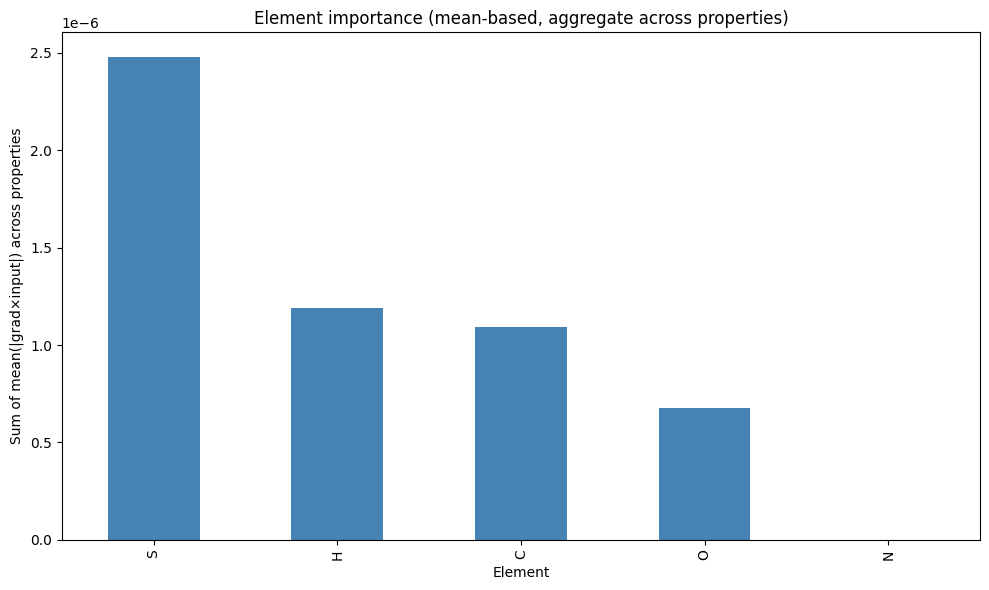

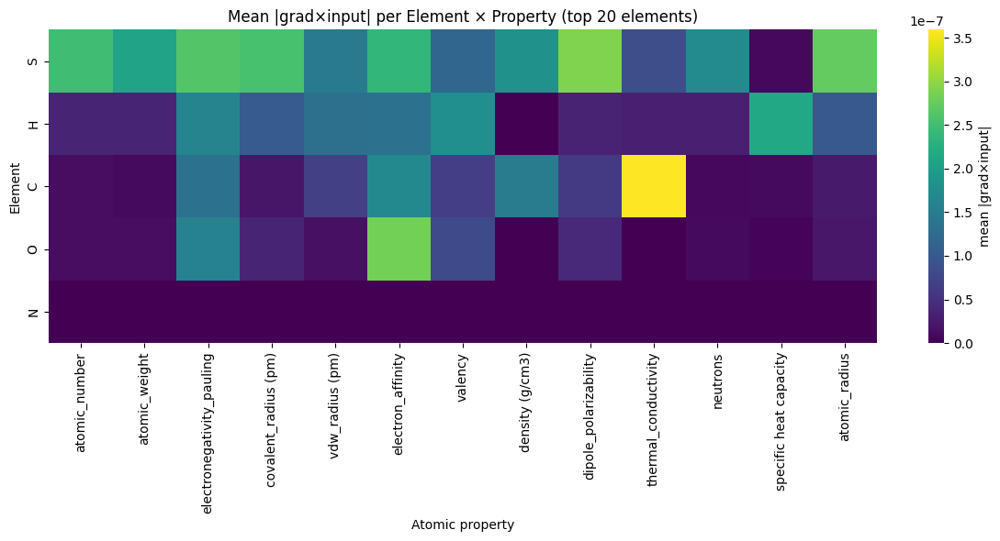

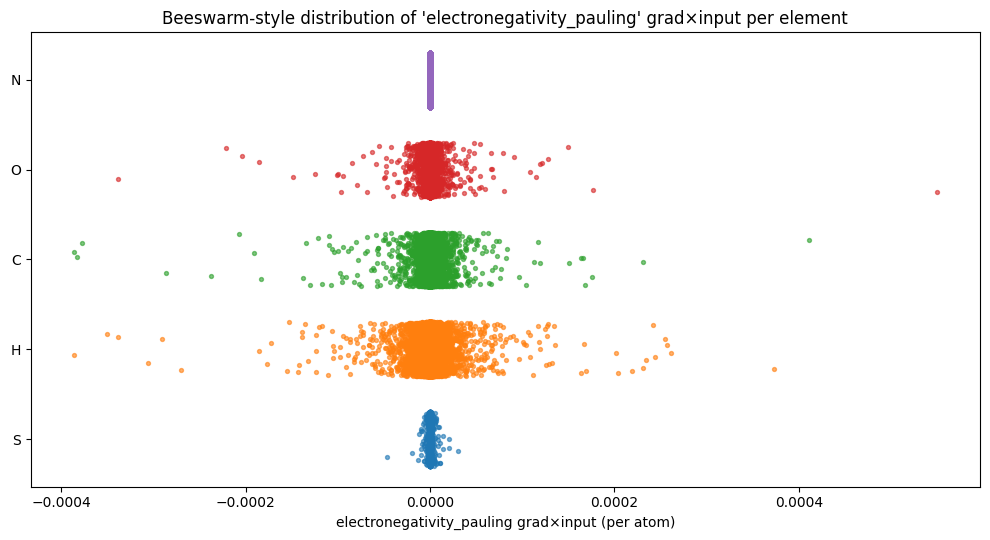

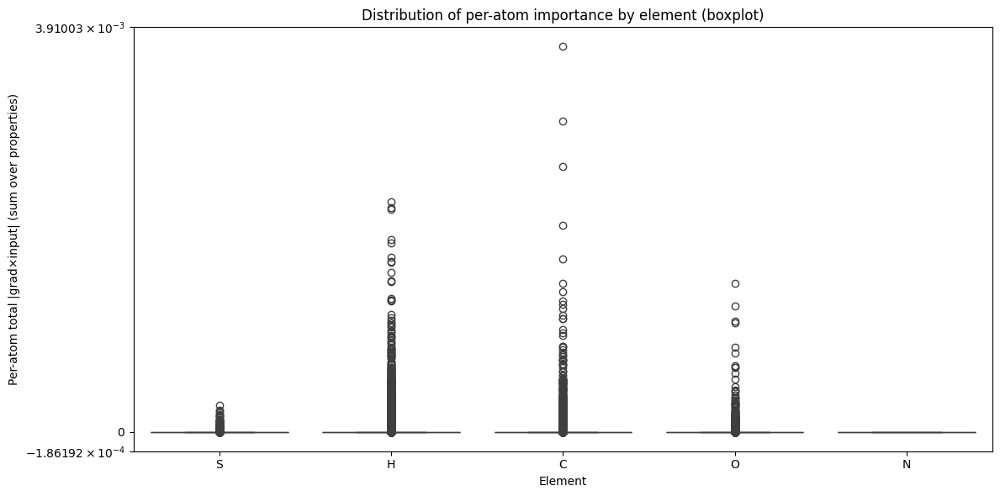

Saved figures and aggregated table to: /content/drive/MyDrive/Protein/element_figures/


In [ ]:
# element_importance_visuals.py
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm

# --- User paths / settings ---
FLAT_CSV = "/content/drive/MyDrive/Protein/atom_level_gradxinput_flat.csv"
OUT_DIR = "/content/drive/MyDrive/Protein/element_figures/"
os.makedirs(OUT_DIR, exist_ok=True)

# load flat_df (if you already have flat_df in memory, skip this and set flat_df variable)
flat_df = pd.read_csv(FLAT_CSV)

# detect property gradxinput columns (assumes suffix "_gradxinput")
gradx_cols = [c for c in flat_df.columns if c.endswith("_gradxinput")]
props = [c[:-len("_gradxinput")] for c in gradx_cols]

# --- 1) per-element aggregated importance (sum over properties of mean abs) ---
# compute mean absolute gradxinput per property per element
e# --- 1) per-element aggregated importance (mean-based) ---
elem_prop_meanabs = flat_df.groupby("Element")[gradx_cols].agg(lambda s: np.nanmean(np.abs(s.values))).fillna(0.0)

# total mean-importance across all properties
elem_prop_meanabs['mean_total_importance'] = elem_prop_meanabs.sum(axis=1)

# sort by mean importance
elem_prop_meanabs = elem_prop_meanabs.sort_values('mean_total_importance', ascending=False)

plt.figure(figsize=(10,6))
elem_prop_meanabs['mean_total_importance'].plot(kind='bar', color="steelblue")
plt.ylabel("Sum of mean(|grad×input|) across properties")
plt.title("Element importance (mean-based, aggregate across properties)")
plt.tight_layout()
plt.savefig(os.path.join(OUT_DIR, "element_mean_total_importance_bar.png"), dpi=300)
plt.show()


# --- 2) heatmap element x property (top K elements) ---
TOP_K_ELEMENTS = 20
top_elements = elem_prop_meanabs.index[:TOP_K_ELEMENTS].tolist()
heat_df = elem_prop_meanabs.loc[top_elements, gradx_cols]
# rename columns to show property names (without suffix)
heat_df.columns = [c[:-len("_gradxinput")] for c in heat_df.columns]

plt.figure(figsize=(12, max(6, 0.25 * len(top_elements) + 2)))
sns.heatmap(heat_df, annot=False, cmap="viridis", cbar_kws={'label':'mean |grad×input|'})
plt.xlabel("Atomic property")
plt.ylabel("Element")
plt.title(f"Mean |grad×input| per Element × Property (top {TOP_K_ELEMENTS} elements)")
plt.tight_layout()
plt.savefig(os.path.join(OUT_DIR, f"element_property_heatmap_top{TOP_K_ELEMENTS}.png"), dpi=300)
plt.show()

# --- 3) beeswarm-style per-element (for chosen property) ---
prop_to_inspect = "electronegativity_pauling"  # change if desired
colname = prop_to_inspect + "_gradxinput"
if colname not in flat_df.columns:
    raise RuntimeError(f"{colname} not found in flat_df columns. Available gradx columns: {gradx_cols}")

# Choose elements to plot: top N by total importance, or specific list
elements_to_plot = top_elements[:8]  # plot top 8 elements
plt.figure(figsize=(10, len(elements_to_plot)*0.7 + 2))
ax = plt.gca()
for i, el in enumerate(elements_to_plot):
    vals = flat_df.loc[flat_df['Element']==el, colname].dropna().values
    if vals.size == 0:
        continue
    y = np.ones_like(vals) * i
    jitter = (np.random.rand(vals.size) - 0.5) * 0.6
    ax.scatter(vals, y + jitter, s=8, alpha=0.6, label=el)
ax.set_yticks(range(len(elements_to_plot)))
ax.set_yticklabels(elements_to_plot)
ax.set_xlabel(f"{prop_to_inspect} grad×input (per atom)")
ax.set_title(f"Beeswarm-style distribution of '{prop_to_inspect}' grad×input per element")
plt.tight_layout()
plt.savefig(os.path.join(OUT_DIR, f"beeswarm_{prop_to_inspect}_per_element.png"), dpi=300)
plt.show()

# --- 4) boxplot of per-atom total importance per element ---
# compute per-atom total importance (sum abs over properties) and attach to flat_df
flat_df['total_abs_gradxinput'] = flat_df[[c for c in flat_df.columns if c.endswith("_gradxinput")]].abs().sum(axis=1)

# We will plot boxplots for top elements (avoid plotting too many)
box_elements = top_elements[:20]
plt.figure(figsize=(12,6))
sns.boxplot(x='Element', y='total_abs_gradxinput', data=flat_df[flat_df['Element'].isin(box_elements)], order=box_elements)
plt.yscale('symlog' if flat_df['total_abs_gradxinput'].max() / flat_df['total_abs_gradxinput'].median() > 100 else 'linear')
plt.xlabel("Element")
plt.ylabel("Per-atom total |grad×input| (sum over properties)")
plt.title("Distribution of per-atom importance by element (boxplot)")
plt.tight_layout()
plt.savefig(os.path.join(OUT_DIR, "element_boxplot_total_abs_gradxinput.png"), dpi=300)
plt.show()

# --- 5) Save aggregated table for reporting ---
elem_prop_meanabs.reset_index(inplace=True)
elem_prop_meanabs.rename(columns={c: c for c in elem_prop_meanabs.columns}, inplace=True)
elem_prop_meanabs.to_csv(os.path.join(OUT_DIR, "element_property_meanabs_table.csv"), index=False)

print("Saved figures and aggregated table to:", OUT_DIR)


In [ ]:
flat_df.columns

Index(['protein_id', 'Chain', 'Residue_ID', 'atom_idx_within_residue',
       'Element', 'atomic_number_gradxinput', 'atomic_weight_gradxinput',
       'electronegativity_pauling_gradxinput',
       'covalent_radius (pm)_gradxinput', 'vdw_radius (pm)_gradxinput',
       'electron_affinity_gradxinput', 'valency_gradxinput',
       'density (g/cm3)_gradxinput', 'dipole_polarizability_gradxinput',
       'thermal_conductivity_gradxinput', 'neutrons_gradxinput',
       'specific heat capacity_gradxinput', 'atomic_radius_gradxinput'],
      dtype='object')

##### Proportion of each element

Element Count Summary:
Total atoms: 1534276
  H: 753733 atoms (49.1%)
  C: 488860 atoms (31.9%)
  O: 150482 atoms (9.8%)
  N: 136331 atoms (8.9%)
  S: 4870 atoms (0.3%)

Most abundant element: H (753,733 atoms)
Least abundant element: S (4,870 atoms)


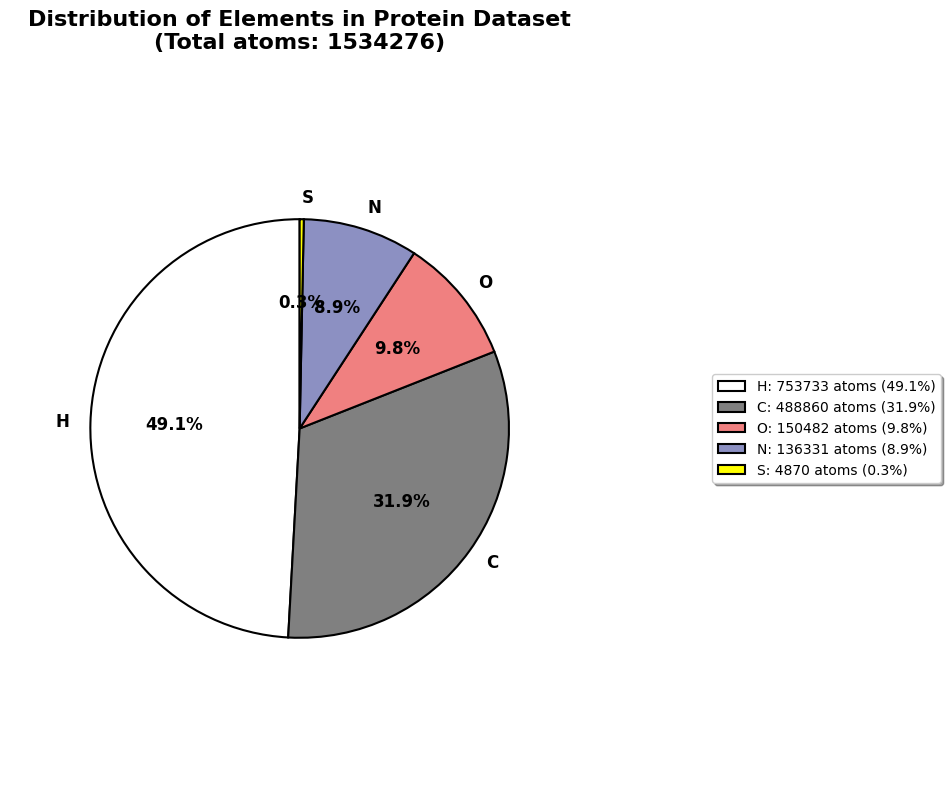

<Figure size 640x480 with 0 Axes>

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# --- Calculate element counts ---
element_counts = flat_df['Element'].value_counts()

# --- Define CPK colors for elements ---
element_colors = {
    'H': '#FFFFFF',    # White
    'C': '#808080',    # Gray
    'N': '#8C90C2',    # Blue
    'O': '#F08080',    # Red
    'S': '#FFFF00'     # Yellow
}

# --- Create pie chart ---
plt.figure(figsize=(10, 8))

# Get the colors for existing elements
colors = [element_colors.get(el, '#cccccc') for el in element_counts.index]

# Create the pie chart
wedges, texts, autotexts = plt.pie(
    element_counts.values,
    labels=element_counts.index,
    colors=colors,
    autopct='%1.1f%%',
    startangle=90,
    textprops={'fontsize': 12, 'fontweight': 'bold'},
    wedgeprops={'edgecolor': 'black', 'linewidth': 1.5}
)

# Customize the title
plt.title("Distribution of Elements in Protein Dataset\n(Total atoms: {})".format(len(flat_df)),
          fontsize=16, fontweight='bold', pad=20)

# Add a legend showing element symbols with colors
element_symbols = element_counts.index.tolist()
legend_elements = [plt.Rectangle((0,0),1,1, facecolor=element_colors.get(sym, '#cccccc'),
                                edgecolor='black', linewidth=1.5, label=f'{sym}')
                  for sym in element_symbols]

plt.legend(handles=legend_elements,
           labels=[f'{sym}: {count} atoms ({count/len(flat_df)*100:.1f}%)'
                   for sym, count in zip(element_symbols, element_counts.values)],
           loc='center left',
           bbox_to_anchor=(1.2, 0.5),
           frameon=True,
           fancybox=True,
           shadow=True,
           fontsize=10)

# Equal aspect ratio ensures that pie is drawn as a circle
plt.axis('equal')

# Print summary statistics
print("Element Count Summary:")
print(f"Total atoms: {len(flat_df)}")
for element, count in element_counts.items():
    percentage = (count / len(flat_df)) * 100
    print(f"  {element}: {count} atoms ({percentage:.1f}%)")

print(f"\nMost abundant element: {element_counts.index[0]} ({element_counts.iloc[0]:,} atoms)")
print(f"Least abundant element: {element_counts.index[-1]} ({element_counts.iloc[-1]:,} atoms)")

plt.tight_layout()
plt.show()

# Optional: Save the figure
plt.savefig("element_distribution_pie_chart.png", dpi=300, bbox_inches='tight')

In [ ]:
gradxinput_cols

['atomic_number_gradxinput',
 'atomic_weight_gradxinput',
 'electronegativity_pauling_gradxinput',
 'covalent_radius (pm)_gradxinput',
 'vdw_radius (pm)_gradxinput',
 'electron_affinity_gradxinput',
 'valency_gradxinput',
 'density (g/cm3)_gradxinput',
 'dipole_polarizability_gradxinput',
 'thermal_conductivity_gradxinput',
 'neutrons_gradxinput',
 'specific heat capacity_gradxinput',
 'atomic_radius_gradxinput',
 'total_abs_gradxinput']

##### Box plot Mean absolute grad x input

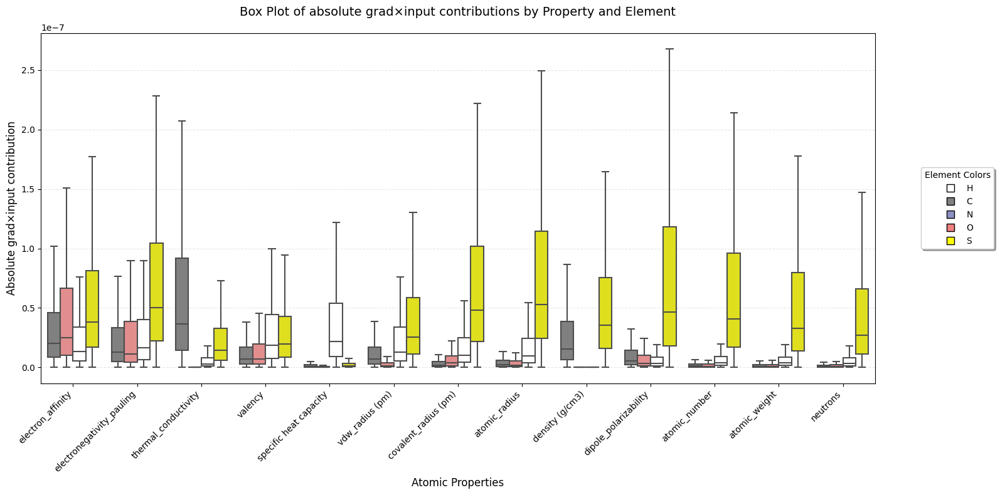

Data Summary:
Total number of atom observations: 18015899
Number of properties: 13
Elements present: ['C' 'O' 'H' 'S']
Overall mean |grad×input|: 0.000000
Overall std |grad×input|: 0.000002

Top 3 most important properties (mean |grad×input|):


/tmp/ipython-input-1166055288.py:125: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



  electron_affinity: 0.000000
  electronegativity_pauling: 0.000000
  thermal_conductivity: 0.000000


<Figure size 640x480 with 0 Axes>

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.lines import Line2D
import pandas as pd

# --- Prepare the data from flat_df ---
# Extract Element and all gradxinput columns
element_col = 'Element'
gradxinput_cols = [col for col in flat_df.columns if col.endswith('_gradxinput')]
gradxinput_cols=set(gradxinput_cols)-set(['total_abs_gradxinput'])
gradxinput_cols=list(gradxinput_cols)
# Melt the dataframe to long format
# First, create a copy and select only relevant columns
df_long = flat_df[['Element'] + gradxinput_cols].copy()

# Melt to long format
df_long = pd.melt(
    df_long,
    id_vars=['Element'],
    value_vars=gradxinput_cols,
    var_name='Property',
    value_name='gradxinput'
)

# Clean property names (remove '_gradxinput' suffix)
df_long['Property'] = df_long['Property'].str.replace('_gradxinput', '')

# Filter out any invalid values
df_long = df_long.dropna()
df_long = df_long[df_long['gradxinput'].abs() > 1e-12]  # Remove near-zero values

# Use absolute values for visualization
df_long['Abs_gradxinput'] = df_long['gradxinput'].abs()

# Sort properties by global mean contribution
prop_order = (
    df_long.groupby("Property")["Abs_gradxinput"]
    .mean()
    .sort_values(ascending=False)
    .index.tolist()
)

# Convert Property into categorical with sorted order
df_long["Property"] = pd.Categorical(df_long["Property"], categories=prop_order, ordered=True)

# --- Define element colors (CPK colors) ---
element_colors = {
    'H': '#FFFFFF',    # White
    'C': '#808080',    # Gray
    'N': '#8C90C2',    # Blue
    'O': '#F08080',    # Red
    'S': '#FFFF00'     # Yellow
}

# --- Create box plot ---
plt.figure(figsize=(16, 8))
ax = sns.boxplot(
    data=df_long,
    x="Property",
    y="Abs_gradxinput",
    hue="Element",
    palette=element_colors,  # Use CPK colors
    order=prop_order,  # Ensure sorted order
    showfliers=False,  # Hide outliers for cleaner plot
    linewidth=1.5,
    width=0.8
)

# Rotate labels
plt.xticks(rotation=45, ha="right")
plt.ylabel("Absolute grad×input contribution", fontsize=12)
plt.xlabel("Atomic Properties", fontsize=12)
plt.title("Box Plot of absolute grad×input contributions by Property and Element",
          fontsize=14, pad=20)

# Customize legend
plt.legend(
    bbox_to_anchor=(1.05, 1),
    loc="upper left",
    title="Element",
    frameon=True,
    fancybox=True,
    shadow=True,
    fontsize=10
)

# Add a custom legend with clearer element symbols and colors
element_symbols = ['H', 'C', 'N', 'O', 'S']
legend_elements = [Line2D([0], [0], color='none', marker='s',
                         markersize=8, markerfacecolor=element_colors[sym],
                         markeredgecolor='black', markeredgewidth=1,
                         label=f'{sym}')
                  for sym in element_symbols]

# Create a separate legend for element colors
legend2 = plt.legend(handles=legend_elements,
                     labels=element_symbols,
                     title="Element Colors",
                     bbox_to_anchor=(1.05, 0.5),
                     loc="center left",
                     frameon=True,
                     fancybox=True,
                     shadow=True,
                     fontsize=10)

# Add grid for better readability
plt.grid(axis='y', alpha=0.3, linestyle='--')

# Adjust layout to accommodate legends
plt.tight_layout()

# Show the plot with both legends
plt.show()

# Print summary statistics
print("Data Summary:")
print(f"Total number of atom observations: {len(df_long)}")
print(f"Number of properties: {len(prop_order)}")
print(f"Elements present: {df_long['Element'].unique()}")
print(f"Overall mean |grad×input|: {df_long['Abs_gradxinput'].mean():.6f}")
print(f"Overall std |grad×input|: {df_long['Abs_gradxinput'].std():.6f}")

# Show top 3 most important properties
print(f"\nTop 3 most important properties (mean |grad×input|):")
top_props = df_long.groupby("Property")["Abs_gradxinput"].mean().sort_values(ascending=False).head(3)
for prop, mean_val in top_props.items():
    print(f"  {prop}: {mean_val:.6f}")

# Optional: Save the figure
plt.savefig("element_boxplot_flat_df.png", dpi=300, bbox_inches='tight',
            bbox_extra_artists=[legend2])

##### Mean grad x input stratifying the positive and negative grad x input

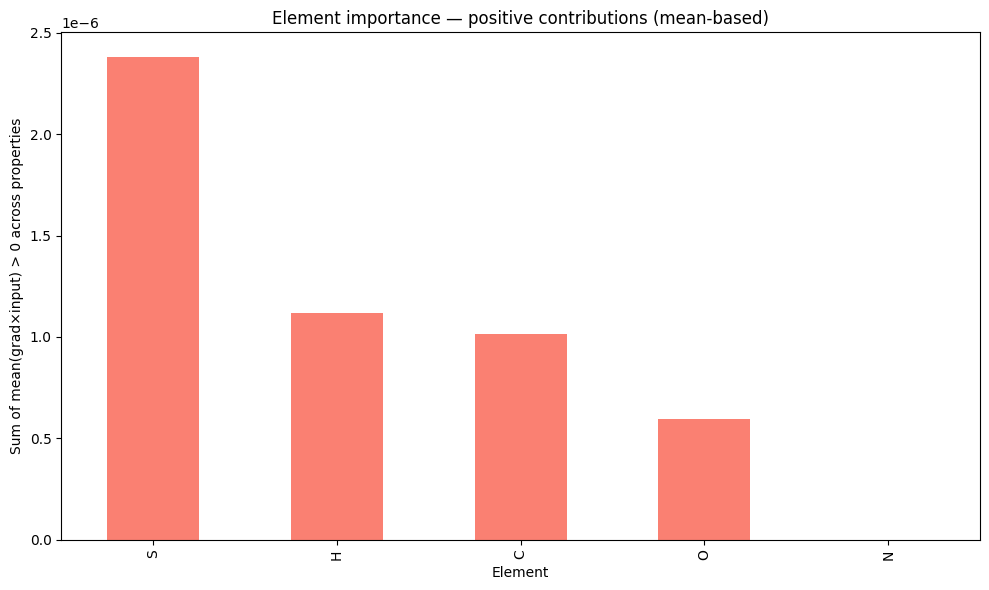

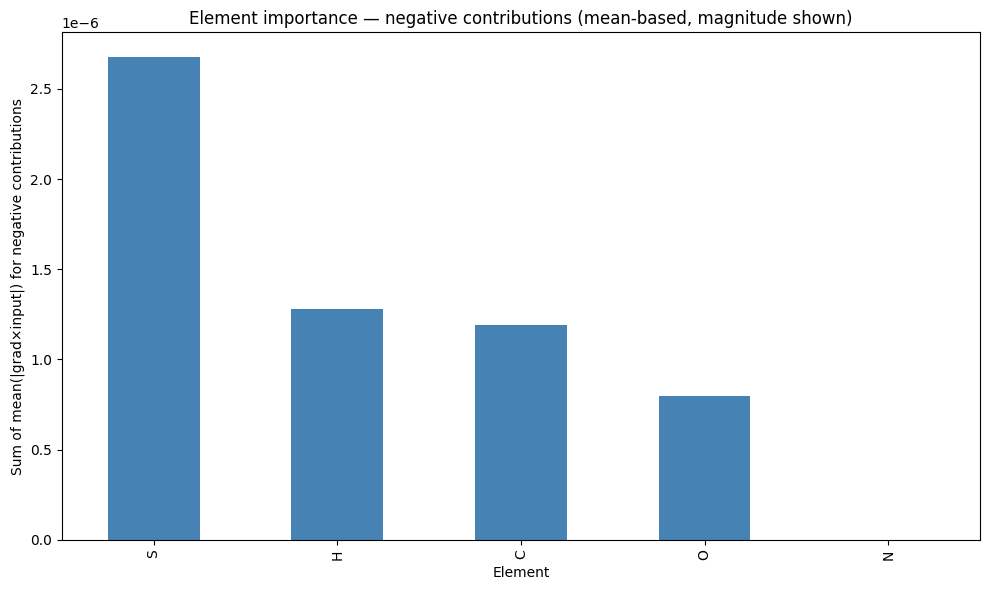

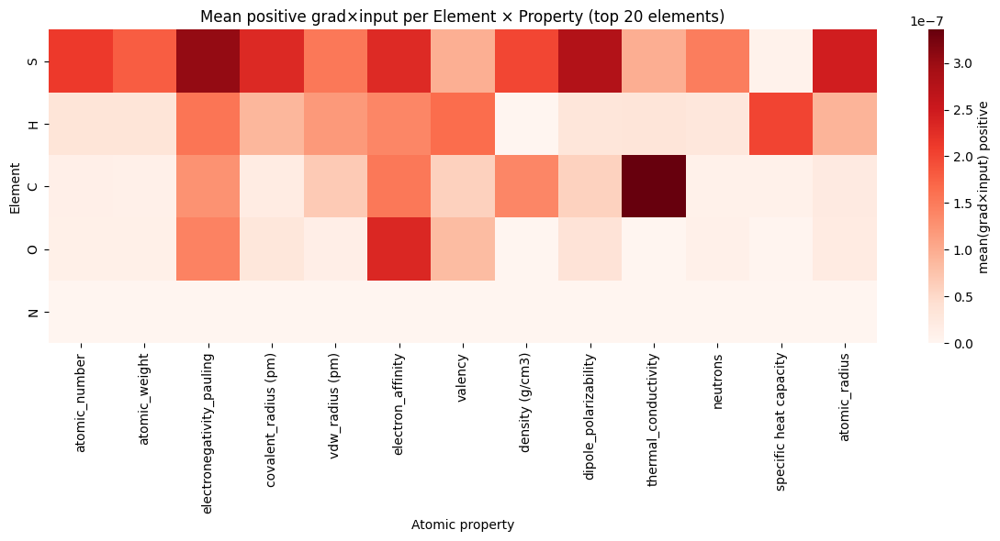

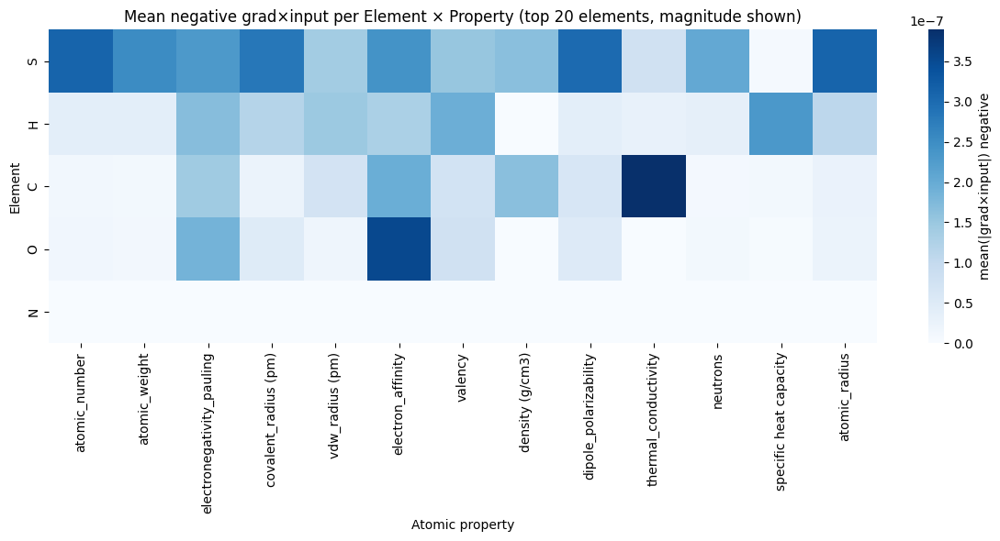

In [ ]:
# element_importance_positive_negative.py
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm

# --- User paths / settings ---
FLAT_CSV = "/content/drive/MyDrive/Protein/atom_level_gradxinput_flat.csv"
OUT_DIR = "/content/drive/MyDrive/Protein/element_figures_pos_neg/"
os.makedirs(OUT_DIR, exist_ok=True)

# load flat_df
flat_df = pd.read_csv(FLAT_CSV)

# detect property gradxinput columns (assumes suffix "_gradxinput")
gradx_cols = [c for c in flat_df.columns if c.endswith("_gradxinput")]
props = [c[:-len("_gradxinput")] for c in gradx_cols]

# helper: safe mean of positives / negatives per series
def mean_positive(arr):
    pos = arr[arr > 0]
    return np.nanmean(pos) if pos.size > 0 else 0.0

def mean_negative(arr):
    neg = arr[arr < 0]
    return np.nanmean(neg) if neg.size > 0 else 0.0  # note: negative number (<=0) or 0 if none

# --- 1) per-element aggregated importance (mean of positives & mean of negatives) ---
# compute per-element x property mean(positive) and mean(negative)
elem_pos = flat_df.groupby("Element")[gradx_cols].agg(lambda s: mean_positive(s.values)).fillna(0.0)
elem_neg = flat_df.groupby("Element")[gradx_cols].agg(lambda s: mean_negative(s.values)).fillna(0.0)

# For sorting we use total mean magnitude (pos + abs(neg)) to get top elements
elem_prop_combined_mag = elem_pos.abs().sum(axis=1) + elem_neg.abs().sum(axis=1)
elem_order = elem_prop_combined_mag.sort_values(ascending=False)

# attach totals for bar plots (sum across properties)
elem_pos['mean_total_positive'] = elem_pos.sum(axis=1)
elem_neg['mean_total_negative'] = elem_neg.abs().sum(axis=1)  # use abs for visual magnitude

# sort rows
elem_pos = elem_pos.loc[elem_order.index]
elem_neg = elem_neg.loc[elem_order.index]

# Barplots: positive
plt.figure(figsize=(10,6))
elem_pos['mean_total_positive'].plot(kind='bar', color="salmon")
plt.ylabel("Sum of mean(grad×input) > 0 across properties")
plt.title("Element importance — positive contributions (mean-based)")
plt.tight_layout()
plt.savefig(os.path.join(OUT_DIR, "element_mean_total_positive_bar.png"), dpi=300)
plt.show()

# Barplots: negative (plot magnitude)
plt.figure(figsize=(10,6))
elem_neg['mean_total_negative'].plot(kind='bar', color="steelblue")
plt.ylabel("Sum of mean(|grad×input|) for negative contributions")
plt.title("Element importance — negative contributions (mean-based, magnitude shown)")
plt.tight_layout()
plt.savefig(os.path.join(OUT_DIR, "element_mean_total_negative_bar.png"), dpi=300)
plt.show()

# --- 2) heatmap element x property (top K elements) ---
TOP_K_ELEMENTS = 20
top_elements = elem_order.index[:TOP_K_ELEMENTS].tolist()

# prepare heatmaps (rename columns to property names)
heat_pos = elem_pos.loc[top_elements, gradx_cols].copy()
heat_neg = elem_neg.loc[top_elements, gradx_cols].copy()
heat_pos.columns = [c[:-len("_gradxinput")] for c in heat_pos.columns]
heat_neg.columns = [c[:-len("_gradxinput")] for c in heat_neg.columns]

plt.figure(figsize=(12, max(6, 0.25 * len(top_elements) + 2)))
sns.heatmap(heat_pos, annot=False, cmap="Reds", cbar_kws={'label':'mean(grad×input) positive'} )
plt.xlabel("Atomic property")
plt.ylabel("Element")
plt.title(f"Mean positive grad×input per Element × Property (top {TOP_K_ELEMENTS} elements)")
plt.tight_layout()
plt.savefig(os.path.join(OUT_DIR, f"element_property_heatmap_positive_top{TOP_K_ELEMENTS}.png"), dpi=300)
plt.show()

plt.figure(figsize=(12, max(6, 0.25 * len(top_elements) + 2)))
# show magnitude for negatives to make color scale readable
sns.heatmap(np.abs(heat_neg), annot=False, cmap="Blues", cbar_kws={'label':'mean(|grad×input|) negative'} )
plt.xlabel("Atomic property")
plt.ylabel("Element")
plt.title(f"Mean negative grad×input per Element × Property (top {TOP_K_ELEMENTS} elements, magnitude shown)")
plt.tight_layout()
plt.savefig(os.path.join(OUT_DIR, f"element_property_heatmap_negative_top{TOP_K_ELEMENTS}.png"), dpi=300)
plt.show()

# # --- 3) beeswarm-style per-element for chosen property (positive / negative separately) ---
# prop_to_inspect = "electronegativity_pauling"  # change if needed
# colname = prop_to_inspect + "_gradxinput"
# if colname not in flat_df.columns:
#     raise RuntimeError(f"{colname} not found in flat_df columns. Available gradx columns: {gradx_cols}")

# elements_to_plot = top_elements[:8]  # choose top 8 elements
# jitter_strength = 0.12
# rng = np.random.default_rng(0)

# # Positive beeswarm
# plt.figure(figsize=(10, len(elements_to_plot)*0.7 + 2))
# ax = plt.gca()
# for i, el in enumerate(elements_to_plot):
#     vals = flat_df.loc[flat_df['Element']==el, colname].dropna().values
#     pos_vals = vals[vals > 0]
#     if pos_vals.size == 0:
#         continue
#     y = np.ones_like(pos_vals) * i
#     jitter = rng.normal(scale=jitter_strength, size=pos_vals.shape)
#     ax.scatter(pos_vals, y + jitter, s=8, alpha=0.7, color='salmon', edgecolors='k', linewidths=0.2)
# ax.set_yticks(range(len(elements_to_plot)))
# ax.set_yticklabels(elements_to_plot)
# ax.set_xlabel(f"{prop_to_inspect} grad×input (positive values)")
# ax.set_title(f"Beeswarm: positive '{prop_to_inspect}' grad×input per element")
# plt.tight_layout()
# plt.savefig(os.path.join(OUT_DIR, f"beeswarm_{prop_to_inspect}_positive_per_element.png"), dpi=300)
# plt.show()

# # Negative beeswarm (plot negative values)
# plt.figure(figsize=(10, len(elements_to_plot)*0.7 + 2))
# ax = plt.gca()
# for i, el in enumerate(elements_to_plot):
#     vals = flat_df.loc[flat_df['Element']==el, colname].dropna().values
#     neg_vals = vals[vals < 0]
#     if neg_vals.size == 0:
#         continue
#     y = np.ones_like(neg_vals) * i
#     jitter = rng.normal(scale=jitter_strength, size=neg_vals.shape)
#     ax.scatter(neg_vals, y + jitter, s=8, alpha=0.7, color='steelblue', edgecolors='k', linewidths=0.2)
# ax.set_yticks(range(len(elements_to_plot)))
# ax.set_yticklabels(elements_to_plot)
# ax.set_xlabel(f"{prop_to_inspect} grad×input (negative values)")
# ax.set_title(f"Beeswarm: negative '{prop_to_inspect}' grad×input per element")
# plt.tight_layout()
# plt.savefig(os.path.join(OUT_DIR, f"beeswarm_{prop_to_inspect}_negative_per_element.png"), dpi=300)
# plt.show()

# # --- 4) boxplot of per-atom total positive and total negative importance per element ---
# # per-atom positive total and negative total (abs)
# pos_cols = [c for c in flat_df.columns if c.endswith("_gradxinput")]
# neg_cols = pos_cols  # same columns used, we'll separate sign per-atom

# # compute per-atom totals
# flat_df['total_pos_gradxinput'] = flat_df[pos_cols].apply(lambda row: np.nansum(np.where(row>0, row, 0.0)), axis=1)
# flat_df['total_neg_gradxinput'] = flat_df[pos_cols].apply(lambda row: np.nansum(np.where(row<0, np.abs(row), 0.0)), axis=1)

# # choose elements to plot
# box_elements = top_elements[:20]

# # Positive boxplot
# plt.figure(figsize=(12,6))
# sns.boxplot(x='Element', y='total_pos_gradxinput', data=flat_df[flat_df['Element'].isin(box_elements)], order=box_elements)
# plt.yscale('symlog' if flat_df['total_pos_gradxinput'].max() / (flat_df['total_pos_gradxinput'].median()+1e-12) > 100 else 'linear')
# plt.xlabel("Element")
# plt.ylabel("Per-atom total positive grad×input (sum over properties)")
# plt.title("Distribution of per-atom positive importance by element (boxplot)")
# plt.tight_layout()
# plt.savefig(os.path.join(OUT_DIR, "element_boxplot_total_pos_gradxinput.png"), dpi=300)
# plt.show()

# # Negative boxplot
# plt.figure(figsize=(12,6))
# sns.boxplot(x='Element', y='total_neg_gradxinput', data=flat_df[flat_df['Element'].isin(box_elements)], order=box_elements)
# plt.yscale('symlog' if flat_df['total_neg_gradxinput'].max() / (flat_df['total_neg_gradxinput'].median()+1e-12) > 100 else 'linear')
# plt.xlabel("Element")
# plt.ylabel("Per-atom total negative grad×input (sum of |negatives| over properties)")
# plt.title("Distribution of per-atom negative importance by element (boxplot)")
# plt.tight_layout()
# plt.savefig(os.path.join(OUT_DIR, "element_boxplot_total_neg_gradxinput.png"), dpi=300)
# plt.show()

# # --- 5) Save aggregated tables ---
# elem_pos.reset_index(inplace=True)
# elem_pos.rename(columns={c: c for c in elem_pos.columns}, inplace=True)
# elem_pos.to_csv(os.path.join(OUT_DIR, "element_property_mean_positive_table.csv"), index=False)

# elem_neg.reset_index(inplace=True)
# elem_neg.rename(columns={c: c for c in elem_neg.columns}, inplace=True)
# elem_neg.to_csv(os.path.join(OUT_DIR, "element_property_mean_negative_table.csv"), index=False)

# print("Saved positive/negative figures and aggregated tables to:", OUT_DIR)


##### Collective grad x input visualization (important)

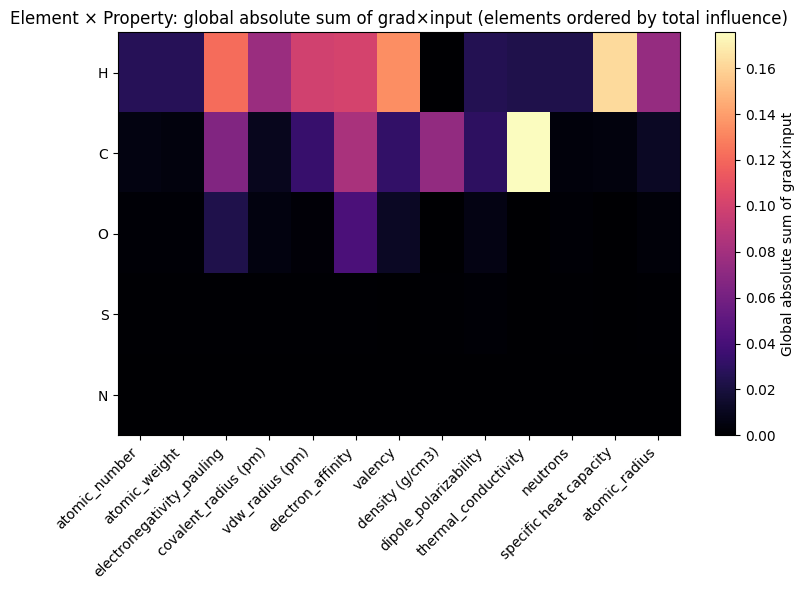

In [ ]:
# --- Heatmap: global absolute sum of contributions per Element x Property ---
elem_sum_abs = flat_df.groupby("Element")[gradx_cols].apply(lambda df: df.abs().sum()).fillna(0.0)

# order elements by total absolute contribution
elem_order = (elem_sum_abs.sum(axis=1)).sort_values(ascending=False).index.tolist()
heat_df = elem_sum_abs.loc[elem_order, gradx_cols]

# rename columns to property names (drop "_gradxinput")
heat_df.columns = [c[:-len("_gradxinput")] for c in heat_df.columns]

mat = heat_df.values.astype(float)

plt.figure(figsize=(max(8, mat.shape[1]*0.3), max(6, mat.shape[0]*0.15)))
im = plt.imshow(mat, aspect='auto', interpolation='nearest', cmap="magma")
plt.colorbar(im, label='Global absolute sum of grad×input')
plt.yticks(np.arange(len(elem_order)), elem_order)
plt.xticks(np.arange(len(heat_df.columns)), heat_df.columns, rotation=45, ha='right')
plt.title("Element × Property: global absolute sum of grad×input (elements ordered by total influence)")
plt.tight_layout()

heatmap_path = os.path.join(OUT_DIR, "element_property_global_abs_sum_heatmap.png")
plt.savefig(heatmap_path, dpi=300, bbox_inches='tight')
plt.show()

# save table too
heat_df.reset_index(inplace=True)
heat_df.to_csv(os.path.join(OUT_DIR, "element_property_global_abs_sum_table.csv"), index=False)


##### Histogram Element wise collective grad x input (important)

/tmp/ipython-input-216759723.py:48: UserWarning:

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.



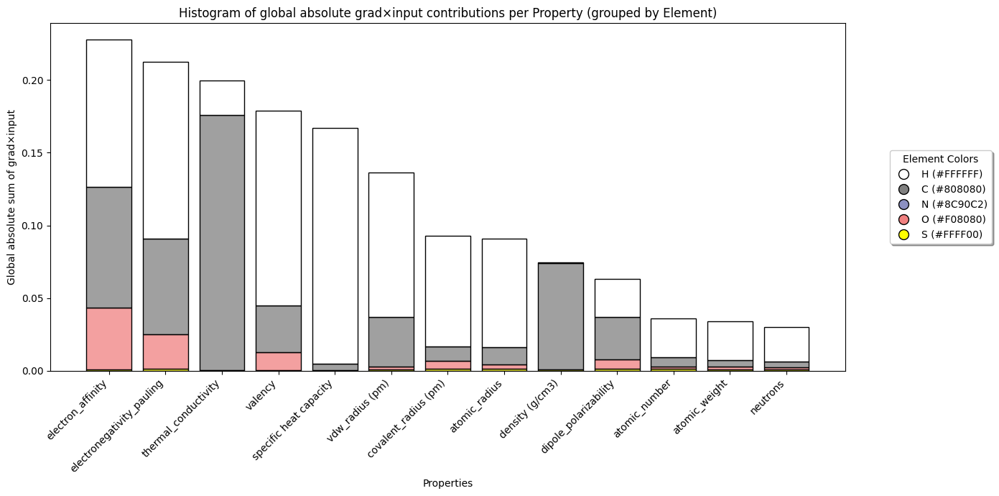

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.lines import Line2D

# --- Melt into long format ---
long_heat = heat_df.melt(id_vars="Element", var_name="Property", value_name="AbsContribution")

# Sort properties by global mean contribution
prop_order = (
    long_heat.groupby("Property")["AbsContribution"]
    .mean()
    .sort_values(ascending=False)
    .index.tolist()
)

# Convert Property into categorical with sorted order
long_heat["Property"] = long_heat["Property"].astype("category")
long_heat["Property"] = long_heat["Property"].cat.set_categories(prop_order, ordered=True)

# --- Define element colors (CPK colors) ---
element_colors = {
    'H': '#FFFFFF',    # White
    'C': '#808080',    # Gray
    'N': '#8C90C2',    # Blue
    'O': '#F08080',    # Red
    'S': '#FFFF00'     # Yellow
}

# --- Plot histogram ---
plt.figure(figsize=(14, 7))
ax = sns.histplot(
    data=long_heat,
    x="Property",
    weights="AbsContribution",
    hue="Element",
    palette=element_colors,  # Use CPK colors
    multiple="stack",   # stacked bars
    shrink=0.8
)

# Rotate labels
plt.xticks(rotation=45, ha="right")
plt.ylabel("Global absolute sum of grad×input")
plt.xlabel("Properties")
plt.title("Histogram of global absolute grad×input contributions per Property (grouped by Element)")

# Customize legend
plt.legend(
    bbox_to_anchor=(1.05, 1),
    loc="upper left",
    title="Element",
    frameon=True,
    fancybox=True,
    shadow=True
)

# Add a custom legend with clearer element symbols and colors
element_symbols = ['H', 'C', 'N', 'O', 'S']
legend_elements = [Line2D([0], [0], color='none', marker='o',
                         markersize=10, markerfacecolor=element_colors[sym],
                         markeredgecolor='black', markeredgewidth=1,
                         label=f'{sym} ({element_colors[sym]})')
                  for sym in element_symbols]

# Get current legend and replace with custom one
handles, labels = ax.get_legend_handles_labels()
ax.legend(handles=legend_elements, labels=[f'{sym} ({element_colors[sym]})' for sym in element_symbols],
          title="Element Colors",
          bbox_to_anchor=(1.05, 0.5),
          loc="center left",
          frameon=True,
          fancybox=True,
          shadow=True)

plt.tight_layout()
plt.show()

##### Collective grad x input stratifying the positive and negative grad x input

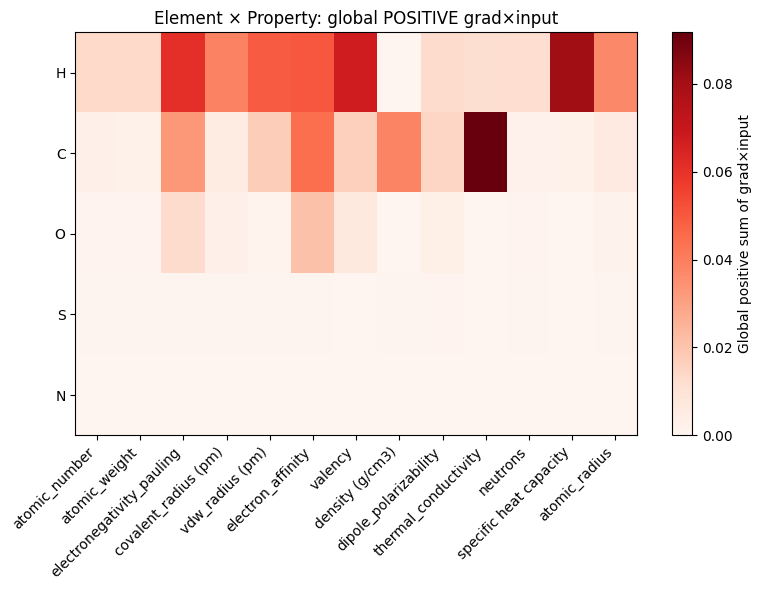

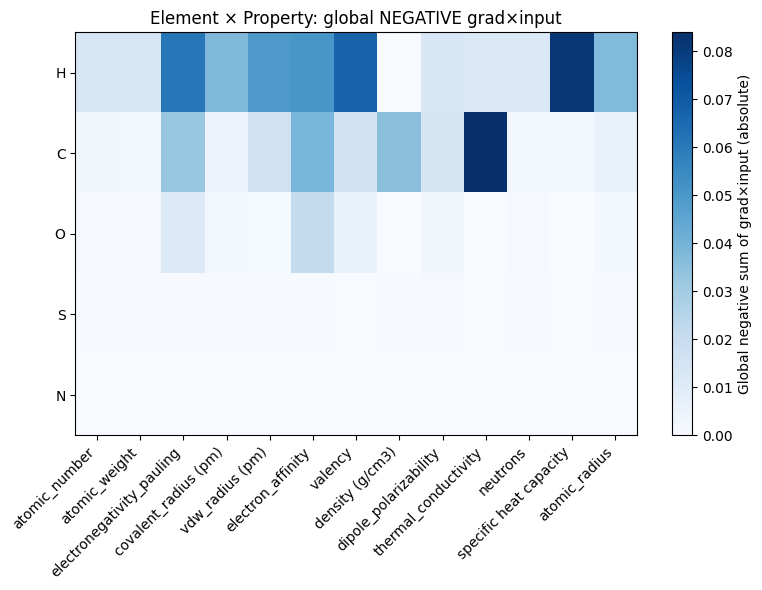

In [ ]:
# --- Split into positive-only and negative-only contributions ---

# sum of positive contributions
elem_sum_pos = flat_df.groupby("Element")[gradx_cols].apply(
    lambda df: df.where(df > 0, 0).sum()
).fillna(0.0)

# sum of negative contributions (take absolute values for magnitudes)
elem_sum_neg = flat_df.groupby("Element")[gradx_cols].apply(
    lambda df: (-df.where(df < 0, 0)).sum()
).fillna(0.0)

# Order elements by total absolute contribution (pos+neg)
elem_order = (elem_sum_pos.sum(axis=1) + elem_sum_neg.sum(axis=1)) \
                .sort_values(ascending=False).index.tolist()

# Drop "_gradxinput" suffix for readability
rename_cols = [c[:-len("_gradxinput")] for c in gradx_cols]
elem_sum_pos.columns = rename_cols
elem_sum_neg.columns = rename_cols

# ---------------- Heatmap: Positive contributions ----------------
mat_pos = elem_sum_pos.loc[elem_order, rename_cols].values.astype(float)

plt.figure(figsize=(max(8, mat_pos.shape[1]*0.3), max(6, mat_pos.shape[0]*0.15)))
im = plt.imshow(mat_pos, aspect='auto', interpolation='nearest', cmap="Reds")
plt.colorbar(im, label='Global positive sum of grad×input')
plt.yticks(np.arange(len(elem_order)), elem_order)
plt.xticks(np.arange(len(rename_cols)), rename_cols, rotation=45, ha='right')
plt.title("Element × Property: global POSITIVE grad×input")
plt.tight_layout()

out_pos = os.path.join(OUT_DIR, "element_property_global_pos_sum_heatmap.png")
plt.savefig(out_pos, dpi=300, bbox_inches='tight')
plt.show()

elem_sum_pos.reset_index().to_csv(
    os.path.join(OUT_DIR, "element_property_global_pos_sum_table.csv"), index=False
)

# ---------------- Heatmap: Negative contributions ----------------
mat_neg = elem_sum_neg.loc[elem_order, rename_cols].values.astype(float)

plt.figure(figsize=(max(8, mat_neg.shape[1]*0.3), max(6, mat_neg.shape[0]*0.15)))
im = plt.imshow(mat_neg, aspect='auto', interpolation='nearest', cmap="Blues")
plt.colorbar(im, label='Global negative sum of grad×input (absolute)')
plt.yticks(np.arange(len(elem_order)), elem_order)
plt.xticks(np.arange(len(rename_cols)), rename_cols, rotation=45, ha='right')
plt.title("Element × Property: global NEGATIVE grad×input")
plt.tight_layout()

out_neg = os.path.join(OUT_DIR, "element_property_global_neg_sum_heatmap.png")
plt.savefig(out_neg, dpi=300, bbox_inches='tight')
plt.show()

elem_sum_neg.reset_index().to_csv(
    os.path.join(OUT_DIR, "element_property_global_neg_sum_table.csv"), index=False
)


##### Shap Like visualization


100%|██████████| 5/5 [00:04<00:00,  1.06it/s]


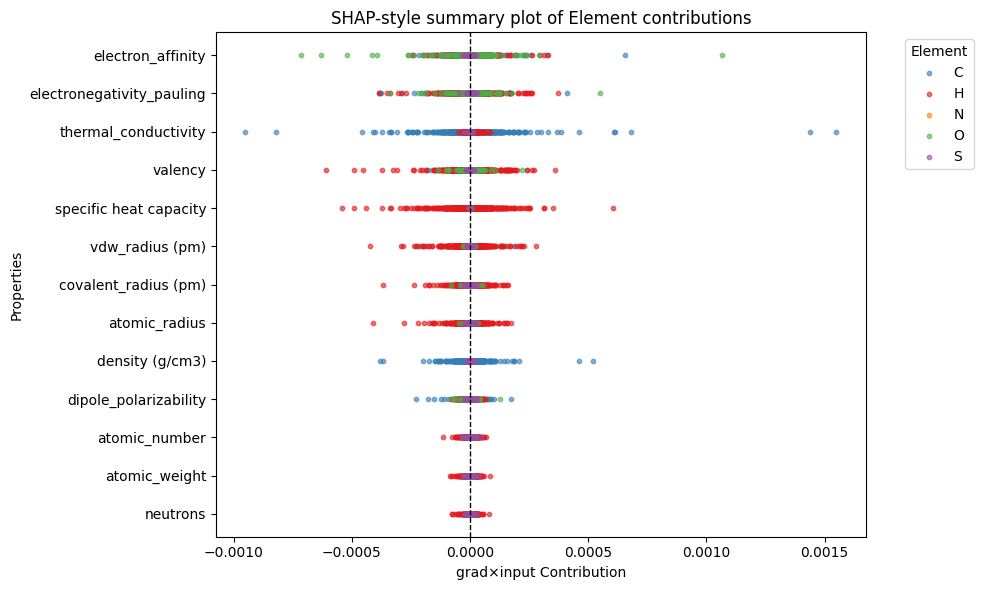

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd

# Assume flat_df has the raw per-protein per-property grad×input values
# and `gradx_cols` are the property columns ending with "_gradxinput"

# melt into long format
long_df = flat_df.melt(id_vars=["Element"], value_vars=gradx_cols,
                       var_name="Property", value_name="Contribution")

# strip "_gradxinput" suffix for clarity
long_df["Property"] = long_df["Property"].str.replace("_gradxinput", "", regex=False)

# order properties by overall variance/importance (like SHAP)
prop_order = long_df.groupby("Property")["Contribution"].apply(lambda x: x.abs().mean()).sort_values().index.tolist()

# assign colors based on element order (top 4 elements)
palette = sns.color_palette("Set1", n_colors=len(elem_order))  # discrete palette
elem_to_color = {elem: palette[i] for i, elem in enumerate(elem_order)}

# map to dataframe
long_df["Color"] = long_df["Element"].map(elem_to_color)

plt.figure(figsize=(10, 6))

# scatter plot
for elem, subdf in tqdm(long_df.groupby("Element")):
    plt.scatter(
        subdf["Contribution"],
        subdf["Property"].map({p:i for i,p in enumerate(prop_order)}),
        color=elem_to_color.get(elem, "grey"),
        s=10, alpha=0.6, label=elem
    )

plt.yticks(range(len(prop_order)), prop_order)
plt.axvline(0, color="black", linestyle="--", linewidth=1)
plt.xlabel("grad×input Contribution")
plt.ylabel("Properties")
plt.title("SHAP-style summary plot of Element contributions")

plt.legend(title="Element", bbox_to_anchor=(1.05, 1), loc="upper left")
plt.tight_layout()
plt.show()


##### Mean Boxplot-1

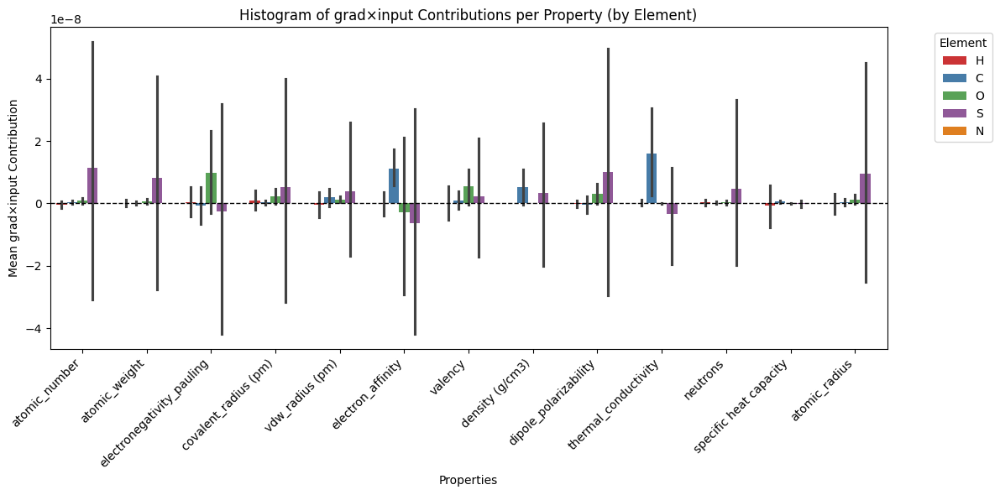

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# melt into long format
long_df = flat_df.melt(
    id_vars=["Element"],
    value_vars=gradx_cols,
    var_name="Property",
    value_name="Contribution"
)

# strip suffix for readability
long_df["Property"] = long_df["Property"].str.replace("_gradxinput", "", regex=False)

# order properties by average absolute contribution
prop_order = (
    long_df.groupby("Property")["Contribution"]
    .apply(lambda x: x.abs().mean())
    .sort_values(ascending=False)
    .index.tolist()
)

# assign colors based on element order
palette = sns.color_palette("Set1", n_colors=len(elem_order))
elem_to_color = {elem: palette[i] for i, elem in enumerate(elem_order)}

plt.figure(figsize=(12, 6))

sns.barplot(
    data=long_df,
    x="Property", y="Contribution",
    hue="Element",
    hue_order=elem_order,  # consistent order
    palette=elem_to_color,
    estimator=lambda x: x.mean()  # average contribution per property
)

plt.axhline(0, color="black", linestyle="--", linewidth=1)
plt.xticks(rotation=45, ha="right")
plt.ylabel("Mean grad×input Contribution")
plt.xlabel("Properties")
plt.title("Histogram of grad×input Contributions per Property (by Element)")
plt.legend(title="Element", bbox_to_anchor=(1.05, 1), loc="upper left")
plt.tight_layout()
plt.show()


##### Mean histogram-1

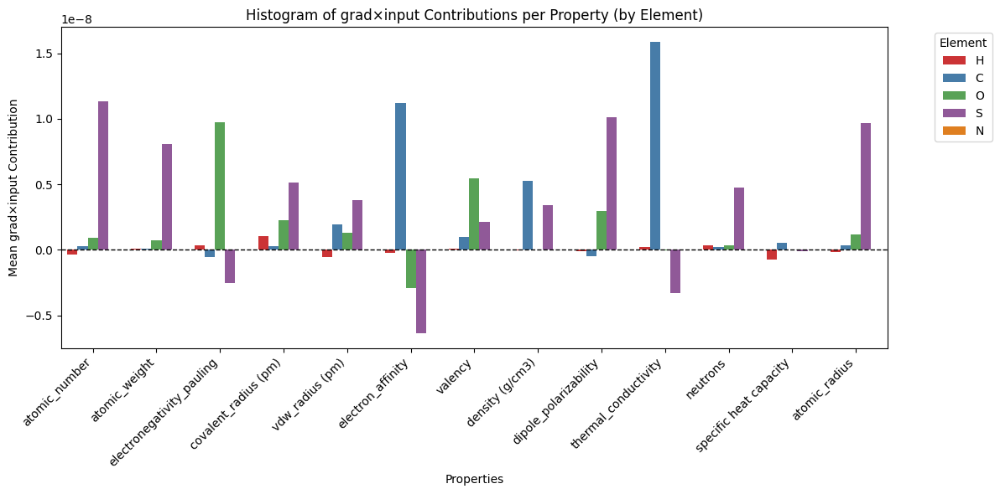

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# --- Step 1: Pre-aggregate to reduce data size ---
# Remove "_gradxinput" suffix for property names
prop_names = [c.replace("_gradxinput", "") for c in gradx_cols]
df_small = flat_df[["Element"] + gradx_cols].copy()
df_small.columns = ["Element"] + prop_names

# Compute mean contribution directly (faster than melt+groupby later)
mean_contrib = df_small.groupby("Element")[prop_names].mean().reset_index()

# --- Step 2: Convert to long format (already reduced size) ---
long_df = mean_contrib.melt(id_vars="Element", var_name="Property", value_name="Contribution")

# --- Step 3: Order properties by overall influence ---
prop_order = (
    long_df.groupby("Property")["Contribution"]
    .apply(lambda x: abs(x).mean())
    .sort_values(ascending=False)
    .index.tolist()
)

# --- Step 4: Color palette for elements ---
palette = sns.color_palette("Set1", n_colors=len(elem_order))
elem_to_color = {elem: palette[i] for i, elem in enumerate(elem_order)}

# --- Step 5: Plot ---
plt.figure(figsize=(12, 6))
sns.barplot(
    data=long_df,
    x="Property", y="Contribution",
    hue="Element",
    hue_order=elem_order,
    palette=elem_to_color
)

plt.axhline(0, color="black", linestyle="--", linewidth=1)
plt.xticks(rotation=45, ha="right")
plt.ylabel("Mean grad×input Contribution")
plt.xlabel("Properties")
plt.title("Histogram of grad×input Contributions per Property (by Element)")
plt.legend(title="Element", bbox_to_anchor=(1.05, 1), loc="upper left")
plt.tight_layout()
plt.show()


##### Mean histogram-2

/tmp/ipython-input-3896371339.py:23: FutureWarning:

DataFrame.applymap has been deprecated. Use DataFrame.map instead.



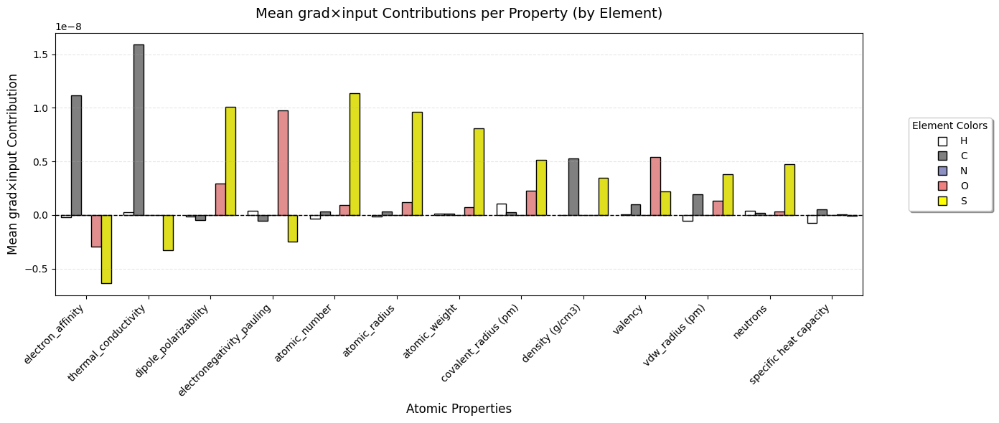

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from matplotlib.lines import Line2D

# --- Step 0: Define element order and colors ---
elem_order = ['H', 'C', 'N', 'O', 'S']  # elements to include
elem_colors = {
    'H': '#FFFFFF',  # White
    'C': '#808080',  # Gray
    'N': '#8C90C2',  # Blue
    'O': '#F08080',  # Red
    'S': '#FFFF00'   # Yellow
}

# --- Step 1: Pre-aggregate to reduce data size ---
# Remove "_gradxinput" suffix for property names
prop_names = [c.replace("_gradxinput", "") for c in gradx_cols]
df_small = flat_df[["Element"] + gradx_cols].copy()
df_small.columns = ["Element"] + prop_names

# Filter near-zero values for robustness
df_small[prop_names] = df_small[prop_names].applymap(lambda x: x if abs(x) > 1e-12 else 0.0)

# Compute mean contribution per element
mean_contrib = df_small.groupby("Element")[prop_names].mean().reset_index()

# --- Step 2: Convert to long format (already reduced size) ---
long_df = mean_contrib.melt(id_vars="Element", var_name="Property", value_name="Contribution")

# --- Step 3: Order properties by overall mean absolute contribution ---
prop_order = (
    long_df.groupby("Property")["Contribution"]
    .apply(lambda x: x.abs().mean())
    .sort_values(ascending=False)
    .index.tolist()
)
long_df["Property"] = pd.Categorical(long_df["Property"], categories=prop_order, ordered=True)

# --- Step 4: Plot ---
plt.figure(figsize=(14, 6))
sns.barplot(
    data=long_df,
    x="Property", y="Contribution",
    hue="Element",
    hue_order=elem_order,
    palette=elem_colors,
    edgecolor='black'
)

# Horizontal zero line for positive/negative visualization
plt.axhline(0, color="black", linestyle="--", linewidth=1)

# Rotate labels and adjust
plt.xticks(rotation=45, ha="right")
plt.xlabel("Atomic Properties", fontsize=12)
plt.ylabel("Mean grad×input Contribution", fontsize=12)
plt.title("Mean grad×input Contributions per Property (by Element)", fontsize=14, pad=15)

# --- Step 5: Custom legend ---
legend_elements = [
    Line2D([0], [0], color='none', marker='s',
           markersize=8, markerfacecolor=elem_colors[e],
           markeredgecolor='black', markeredgewidth=1,
           label=e)
    for e in elem_order
]
plt.legend(handles=legend_elements,
           title="Element Colors",
           bbox_to_anchor=(1.05, 0.5),
           loc="center left",
           frameon=True,
           fancybox=True,
           shadow=True,
           fontsize=10)

# Add grid for clarity
plt.grid(axis='y', alpha=0.3, linestyle='--')
plt.tight_layout()
plt.show()


##### Mean histogram-3

/tmp/ipython-input-1697574404.py:62: FutureWarning:

DataFrame.applymap has been deprecated. Use DataFrame.map instead.

/tmp/ipython-input-1697574404.py:111: FutureWarning:



The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.




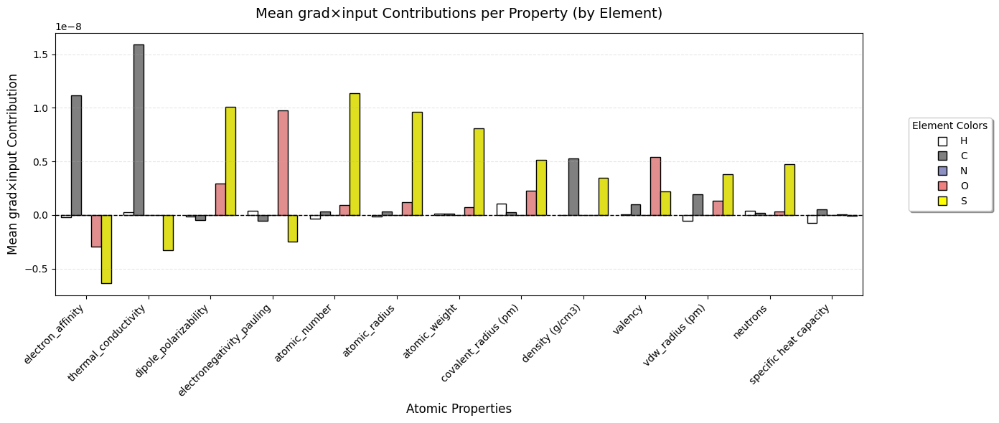

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from matplotlib.lines import Line2D
from typing import List, Dict

def plot_mean_gradxinput(
    flat_df: pd.DataFrame,
    gradx_cols: List[str],
    elem_order: List[str] = ['H', 'C', 'N', 'O', 'S'],
    elem_colors: Dict[str, str] = None,
    zero_tol: float = 1e-12,
    figsize=(14, 6)
):
    """
    Plot mean grad×input contributions per property, colored by element.

    Parameters
    ----------
    flat_df : pd.DataFrame
        DataFrame containing an "Element" column and `gradx_cols` columns (names might include "_gradxinput").
    gradx_cols : list[str]
        List of column names in `flat_df` that contain grad×input values (may include suffixes like "_gradxinput").
    elem_order : list[str]
        Order of elements to appear in the legend / hue.
    elem_colors : dict
        Mapping element -> color hex string. If None, a default mapping is used.
    zero_tol : float
        Values with absolute magnitude <= zero_tol will be set to 0.0 for robustness.
    figsize : tuple
        Matplotlib figure size.
    """
    # --- defaults ---
    if elem_colors is None:
        elem_colors = {
            'H': '#FFFFFF',  # White
            'C': '#808080',  # Gray
            'N': '#8C90C2',  # Blue
            'O': '#F08080',  # Red
            'S': '#FFFF00'   # Yellow
        }

    # Basic checks
    if 'Element' not in flat_df.columns:
        raise ValueError("flat_df must contain an 'Element' column.")
    missing_cols = [c for c in gradx_cols if c not in flat_df.columns]
    if missing_cols:
        raise ValueError(f"The following gradx_cols are missing from flat_df: {missing_cols}")

    # --- Step 0: normalize property names (remove suffixes) ---
    prop_names = [c.replace("_gradxinput", "") for c in gradx_cols]

    # Create a small df with Element + properties
    df_small = flat_df.loc[:, ["Element"] + gradx_cols].copy()
    df_small.columns = ["Element"] + prop_names

    # Convert property columns to numeric, coerce errors to NaN then fill with 0
    for p in prop_names:
        df_small[p] = pd.to_numeric(df_small[p], errors='coerce').fillna(0.0)

    # Filter tiny near-zero values for robustness
    df_small[prop_names] = df_small[prop_names].applymap(lambda x: x if abs(x) > zero_tol else 0.0)

    # --- Compute mean contribution per element ---
    mean_contrib = (
        df_small
        .groupby("Element")[prop_names]
        .mean()
        .reset_index()  # Element + mean columns
    )

    # If no elements present, abort
    if mean_contrib.shape[0] == 0:
        raise ValueError("No elements found after grouping; check 'Element' values in flat_df.")

    # --- Convert to long format ---
    long_df = mean_contrib.melt(
        id_vars="Element",
        var_name="Property",
        value_name="Contribution"
    )

    # Drop properties that are entirely zero (optional)
    prop_nonzero = (
        long_df.groupby("Property")["Contribution"]
        .apply(lambda x: x.abs().sum() > 0)
    )
    nonzero_props = prop_nonzero[prop_nonzero].index.tolist()
    if len(nonzero_props) == 0:
        raise ValueError("All properties are zero after filtering; nothing to plot.")
    long_df = long_df[long_df["Property"].isin(nonzero_props)].copy()

    # --- Order properties by overall mean absolute contribution ---
    prop_order = (
        long_df.groupby("Property")["Contribution"]
        .apply(lambda x: x.abs().mean())
        .sort_values(ascending=False)
        .index.tolist()
    )
    long_df["Property"] = pd.Categorical(long_df["Property"], categories=prop_order, ordered=True)

    # --- Prepare palette: only include elements that exist in data and in elem_colors ---
    present_elems = [e for e in elem_order if e in long_df["Element"].unique()]
    palette = {e: elem_colors.get(e, '#333333') for e in present_elems}  # fallback dark grey if missing color

    # --- Plot ---
    plt.figure(figsize=figsize)
    ax = plt.gca()

    # Use sns.barplot. We already computed means, so set ci=None to avoid internal agg.
    sns.barplot(
        data=long_df,
        x="Property",
        y="Contribution",
        hue="Element",
        hue_order=present_elems,
        palette=palette,
        ci=None,
        dodge=True,
        ax=ax,
        edgecolor='black'  # seaborn will pass to matplotlib patch artists
    )

    # Horizontal zero line
    ax.axhline(0, color="black", linestyle="--", linewidth=1)

    # Rotate x labels
    plt.xticks(rotation=45, ha="right")
    plt.xlabel("Atomic Properties", fontsize=12)
    plt.ylabel("Mean grad×input Contribution", fontsize=12)
    plt.title("Mean grad×input Contributions per Property (by Element)", fontsize=14, pad=15)

    # --- Custom legend (ensures white marker is visible) ---
    legend_elements = [
        Line2D([0], [0], color='none', marker='s',
               markersize=8, markerfacecolor=palette[e],
               markeredgecolor='black', markeredgewidth=1,
               label=e)
        for e in present_elems
    ]
    ax.legend(handles=legend_elements,
              title="Element Colors",
              bbox_to_anchor=(1.05, 0.5),
              loc="center left",
              frameon=True,
              fancybox=True,
              shadow=True,
              fontsize=10)

    # Grid & layout
    ax.grid(axis='y', alpha=0.3, linestyle='--')
    plt.tight_layout()
    plt.show()


# -------------------------
# Example usage:
# -------------------------
plot_mean_gradxinput(flat_df, gradx_cols)
#
# where:
# - flat_df is your DataFrame containing "Element" and the gradx columns
# - gradx_cols is a list like ['polarizability_gradxinput', 'electronegativity_gradxinput', ...]
#
# If your gradx column names already do not have "_gradxinput" suffix, pass them as-is;
# the function will simply use the provided names as property names.


In [ ]:
# import matplotlib.pyplot as plt
# import seaborn as sns
# import pandas as pd

# # --- Step 1: Reshape only once ---
# # Remove "_gradxinput" suffix for clarity
# long_df = flat_df.melt(
#     id_vars=["Element"],
#     value_vars=gradx_cols,
#     var_name="Property", value_name="Contribution"
# )
# long_df["Property"] = long_df["Property"].str.replace("_gradxinput", "", regex=False)

# # --- Step 2: Order properties by global influence (mean absolute contribution) ---
# prop_order = (
#     long_df.groupby("Property")["Contribution"]
#     .apply(lambda x: x.abs().sum())
#     .sort_values(ascending=False)
#     .index.tolist()
# )

# # --- Step 3: Define element colors ---
# palette = sns.color_palette("Set1", n_colors=len(elem_order))
# elem_to_color = {elem: palette[i] for i, elem in enumerate(elem_order)}

# # --- Step 4: Plot ---
# plt.figure(figsize=(14, 7))
# sns.boxplot(
#     data=long_df,
#     x="Property", y="Contribution",
#     hue="Element",
#     hue_order=elem_order,
#     palette=elem_to_color,
#     showfliers=False  # hide extreme outliers for clarity
# )

# plt.axhline(0, color="black", linestyle="--", linewidth=1)
# plt.xticks(range(len(prop_order)), prop_order, rotation=45, ha="right")
# plt.ylabel("grad×input Contribution")
# plt.xlabel("Properties")
# plt.title("Boxplot of grad×input Contributions per Property (grouped by Element)")
# plt.legend(title="Element", bbox_to_anchor=(1.05, 1), loc="upper left")
# plt.tight_layout()
# plt.show()


##### Mean Boxplot-2

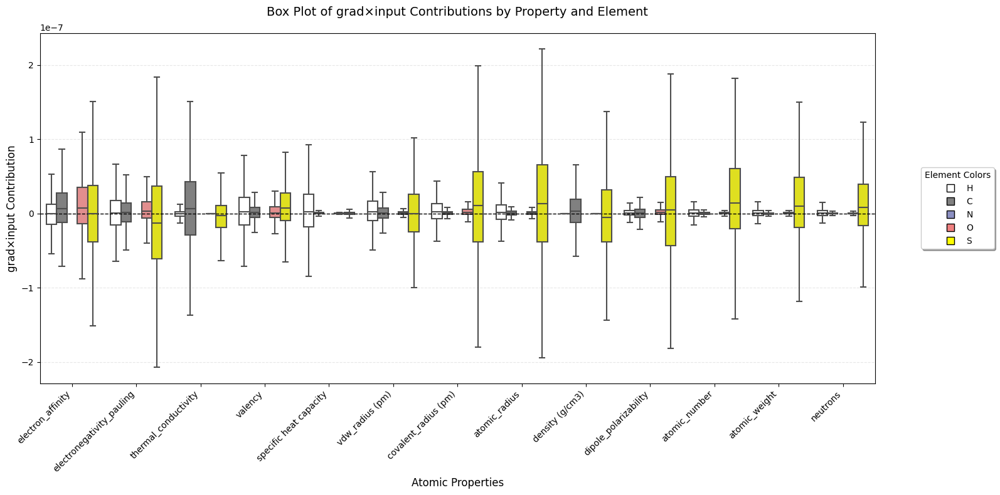

Data Summary:
Total atom observations: 18015899
Number of properties: 13
Elements present: ['C' 'O' 'H' 'S']
Overall mean |grad×input|: 0.000000
Overall std |grad×input|: 0.000002


/tmp/ipython-input-3376404740.py:103: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.




Top 3 most important properties (mean |grad×input|):
  electron_affinity: 0.000000
  electronegativity_pauling: 0.000000
  thermal_conductivity: 0.000000


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from matplotlib.lines import Line2D

# --- Step 0: Define element order and colors ---
elem_order = ['H', 'C', 'N', 'O', 'S']  # Specify elements you want to show
# Custom CPK-style colors
elem_colors = {
    'H': '#FFFFFF',  # White
    'C': '#808080',  # Gray
    'N': '#8C90C2',  # Blue
    'O': '#F08080',  # Red
    'S': '#FFFF00'   # Yellow
}

# --- Step 1: Melt the dataframe ---
gradx_cols = [col for col in flat_df.columns if col.endswith('_gradxinput')]
gradx_cols = list(set(gradx_cols) - set(['total_abs_gradxinput']))  # exclude totals

long_df = flat_df.melt(
    id_vars=["Element"],
    value_vars=gradx_cols,
    var_name="Property",
    value_name="Contribution"
)

# Remove '_gradxinput' suffix
long_df["Property"] = long_df["Property"].str.replace("_gradxinput", "", regex=False)

# --- Step 2: Filter near-zero values ---
long_df = long_df.dropna()
long_df = long_df[long_df["Contribution"].abs() > 1e-12]

# --- Step 3: Order properties by global absolute influence ---
prop_order = (
    long_df.groupby("Property")["Contribution"]
    .apply(lambda x: x.abs().mean())  # use mean absolute value
    .sort_values(ascending=False)
    .index.tolist()
)

# Convert Property to categorical for proper order
long_df["Property"] = pd.Categorical(long_df["Property"], categories=prop_order, ordered=True)

# --- Step 4: Plot ---
plt.figure(figsize=(16, 8))
ax = sns.boxplot(
    data=long_df,
    x="Property",
    y="Contribution",
    hue="Element",
    order=prop_order,
    hue_order=elem_order,
    palette=elem_colors,
    showfliers=False,  # hide extreme outliers
    linewidth=1.5,
    width=0.8
)

# Horizontal zero line
plt.axhline(0, color="black", linestyle="--", linewidth=1)

# Rotate x-axis labels
plt.xticks(rotation=45, ha="right")
plt.xlabel("Atomic Properties", fontsize=12)
plt.ylabel("grad×input Contribution", fontsize=12)
plt.title("Box Plot of grad×input Contributions by Property and Element", fontsize=14, pad=20)

# --- Step 5: Custom legend ---
legend_elements = [
    Line2D([0], [0], color='none', marker='s',
           markersize=8, markerfacecolor=elem_colors[e],
           markeredgecolor='black', markeredgewidth=1,
           label=e)
    for e in elem_order
]
plt.legend(handles=legend_elements,
           title="Element Colors",
           bbox_to_anchor=(1.05, 0.5),
           loc="center left",
           frameon=True,
           fancybox=True,
           shadow=True,
           fontsize=10)

# --- Step 6: Add grid and adjust layout ---
plt.grid(axis='y', alpha=0.3, linestyle='--')
plt.tight_layout()

# Show plot
plt.show()

# --- Step 7: Summary statistics ---
print("Data Summary:")
print(f"Total atom observations: {len(long_df)}")
print(f"Number of properties: {len(prop_order)}")
print(f"Elements present: {long_df['Element'].unique()}")
print(f"Overall mean |grad×input|: {long_df['Contribution'].abs().mean():.6f}")
print(f"Overall std |grad×input|: {long_df['Contribution'].abs().std():.6f}")

# Top 3 properties by mean absolute contribution
top_props = long_df.groupby("Property")["Contribution"].apply(lambda x: x.abs().mean()).sort_values(ascending=False).head(3)
print("\nTop 3 most important properties (mean |grad×input|):")
for prop, mean_val in top_props.items():
    print(f"  {prop}: {mean_val:.6f}")


In [ ]:
flat_df.columns

Index(['protein_id', 'Chain', 'Residue_ID', 'atom_idx_within_residue',
       'Element', 'atomic_number_gradxinput', 'atomic_weight_gradxinput',
       'electronegativity_pauling_gradxinput',
       'covalent_radius (pm)_gradxinput', 'vdw_radius (pm)_gradxinput',
       'electron_affinity_gradxinput', 'valency_gradxinput',
       'density (g/cm3)_gradxinput', 'dipole_polarizability_gradxinput',
       'thermal_conductivity_gradxinput', 'neutrons_gradxinput',
       'specific heat capacity_gradxinput', 'atomic_radius_gradxinput'],
      dtype='object')

## Single Protein Atomic Property Visualization

PDB serials parsed: 205
flat_df atoms for protein: 205
Using index-based 1:1 mapping between flat_df rows and PDB atom serials.
Applied styles to 205 atoms; skipped 0 atoms (examples): []


/tmp/ipython-input-2717630553.py:52: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.

/tmp/ipython-input-2717630553.py:148: UserWarning:

Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.



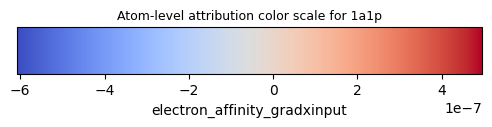

Saved interactive HTML to: thermal_1a1p_both.html


3Dmol.js failed to load for some reason. Please check your browser console for error messages.

In [ ]:
import numpy as np
import pandas as pd
import py3Dmol
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.colors as mcolors
import warnings

def _parse_pdb_serial_list(pdb_str):
    serials = []
    for line in pdb_str.splitlines():
        if line.startswith("ATOM  ") or line.startswith("HETATM"):
            try:
                serials.append(int(line[6:11].strip()))
            except:
                continue
    return serials

def visualize_atoms_safe(flat_df, protein_id, pdb_str,
                         attr_col="electronegativity_pauling_gradxinput",
                         cmap_name="coolwarm",
                         atom_style="both",   # 'sphere', 'stick', or 'both'
                         sphere_scale=0.35,
                         stick_radius=0.12,
                         cartoon_alpha=0.25,
                         out_html=None,
                         verbose=True):
    """
    Safe atom-level coloring (per-serial) with option to draw sphere, stick, or both for each atom.
    """
    prot_df = flat_df[flat_df["protein_id"] == protein_id].reset_index(drop=True)
    if prot_df.empty:
        raise ValueError(f"No atoms for protein_id={protein_id} in flat_df")

    if attr_col not in prot_df.columns:
        raise ValueError(f"Attribute column '{attr_col}' not found in flat_df. Columns: {list(prot_df.columns)[:20]}")

    # parse serials from pdb
    serials_list = _parse_pdb_serial_list(pdb_str)
    if verbose:
        print("PDB serials parsed:", len(serials_list))
        print("flat_df atoms for protein:", len(prot_df))

    values = prot_df[attr_col].astype(float).to_numpy()
    if np.all(np.isnan(values)):
        raise ValueError("All attribution values are NaN for this protein/column")

    vmin, vmax = np.nanmin(values), np.nanmax(values)
    if vmin == vmax:
        vmin -= 1e-8; vmax += 1e-8
    norm = mcolors.Normalize(vmin=vmin, vmax=vmax)
    cmap = cm.get_cmap(cmap_name)

    view = py3Dmol.view(width=900, height=600)
    view.addModel(pdb_str, 'pdb')
    view.setBackgroundColor('white')
    view.setStyle({'cartoon': {'color': 'spectrum', 'opacity': cartoon_alpha}})

    applied = 0
    skipped = []

    def _make_style(color_hex):
        """Return style dict depending on atom_style."""
        style = {}
        if atom_style in ('sphere', 'both'):
            style['sphere'] = {'color': color_hex, 'scale': sphere_scale}
        if atom_style in ('stick', 'both'):
            style['stick'] = {'color': color_hex, 'radius': stick_radius}
        return style

    # Primary: if lengths match, do 1:1 mapping by index -> serial
    if len(serials_list) == len(prot_df):
        if verbose:
            print("Using index-based 1:1 mapping between flat_df rows and PDB atom serials.")
        for i, row in prot_df.iterrows():
            serial = serials_list[i]
            color = mcolors.to_hex(cmap(norm(float(row[attr_col]))))
            selection = {'serial': int(serial)}
            style = _make_style(color)
            view.setStyle(selection, style)
            applied += 1
    else:
        # Fallback mapping (chain/resSeq/atom_idx)
        if verbose:
            print("Index counts differ; attempting fallback mapping (chain/residue/atom_idx).")
        mapping = {}
        cnt = {}
        for line in pdb_str.splitlines():
            if not (line.startswith("ATOM  ") or line.startswith("HETATM")):
                continue
            try:
                serial = int(line[6:11].strip())
            except:
                continue
            chain = line[21].strip() or None
            resSeq = line[22:26].strip()
            key = (chain, resSeq)
            idx = cnt.get(key, 0)
            mapping[(chain, resSeq, idx)] = serial
            cnt[key] = idx + 1

        if verbose:
            print("Built mapping entries:", len(mapping))

        for i, row in prot_df.iterrows():
            chain = row.get('Chain', None)
            res_id = str(row['Residue_ID'])
            atom_idx = int(row['atom_idx_within_residue']) if 'atom_idx_within_residue' in row else None

            serial = None
            if atom_idx is not None:
                candidate = (chain, res_id, atom_idx)
                if candidate in mapping:
                    serial = mapping[candidate]
            if serial is None and atom_idx is not None:
                candidate2 = (None, res_id, atom_idx)
                if candidate2 in mapping:
                    serial = mapping[candidate2]

            if serial is None:
                serials_for_res = [s for (ch, rs, idx), s in mapping.items()
                                   if str(rs) == str(res_id) and (ch == chain or (ch is None and chain is None))]
                serials_for_res = sorted(serials_for_res)
                if atom_idx is not None and atom_idx < len(serials_for_res):
                    serial = serials_for_res[atom_idx]

            if serial is None:
                skipped.append((i, chain, res_id, atom_idx))
                continue

            color = mcolors.to_hex(cmap(norm(float(row[attr_col]))))
            selection = {'serial': int(serial)}
            style = _make_style(color)
            view.setStyle(selection, style)
            applied += 1

    if verbose:
        print(f"Applied styles to {applied} atoms; skipped {len(skipped)} atoms (examples): {skipped[:10]}")

    view.zoomTo()

    # colorbar
    sm = cm.ScalarMappable(norm=norm, cmap=cmap)
    sm.set_array(values)
    fig, ax = plt.subplots(figsize=(6,0.6))
    fig.colorbar(sm, cax=ax, orientation='horizontal').set_label(attr_col)
    ax.set_title(f"Atom-level attribution color scale for {protein_id}", fontsize=9)
    plt.tight_layout()
    plt.show()

    if out_html:
        html = view._make_html()
        with open(out_html, 'w') as f:
            f.write(html)
        if verbose:
            print("Saved interactive HTML to:", out_html)

    return view


In [ ]:

# ---------------------------
# Example usage:
# ---------------------------
protein_id = "1a1p"
attr_col = "electron_affinity_gradxinput"
pdb_str = csv_to_pdb_string(df[df.protein_id==protein_id], 'true')  # your helper
view = visualize_atoms_safe(flat_df, protein_id, pdb_str,
                            attr_col=attr_col,
                            atom_style='both',         # now draws stick+ball per atom
                            sphere_scale=0.30,
                            stick_radius=0.10,
                            out_html=f"{attr_col}_{protein_id}_both.html",
                            verbose=True)
view.show()


In [ ]:
df[(df.protein_id==protein_id)][['Residue_ID','Residue_Name']].drop_duplicates()

,Residue_ID,Residue_Name
4630,1,ILE
4651,2,CYS
4661,3,VAL
4677,4,VAL
4693,5,GLN
4710,6,ASP
4722,7,TRP
4746,8,GLY
4753,9,HIS
4770,10,HIS


In [ ]:
flat_df[(flat_df.protein_id==protein_id)&(flat_df.electron_affinity_gradxinput<0)].sort_values(by=['electron_affinity_gradxinput'])

,protein_id,Chain,Residue_ID,atom_idx_within_residue,Element,atomic_number_gradxinput,atomic_weight_gradxinput,electronegativity_pauling_gradxinput,covalent_radius (pm)_gradxinput,vdw_radius (pm)_gradxinput,electron_affinity_gradxinput,valency_gradxinput,density (g/cm3)_gradxinput,dipole_polarizability_gradxinput,thermal_conductivity_gradxinput,neutrons_gradxinput,specific heat capacity_gradxinput,atomic_radius_gradxinput
87,1a1p,A,6,7,O,1.286411e-08,1.284350e-08,2.000189e-07,2.605595e-08,1.220237e-08,-6.074714e-07,1.341779e-07,-2.640489e-11,5.379276e-08,-6.861535e-10,7.242327e-09,5.768637e-10,3.381591e-09
122,1a1p,A,8,6,H,-6.166986e-08,-2.179587e-08,1.078834e-08,8.637130e-09,2.431199e-08,-3.804149e-07,-2.724214e-08,4.746489e-11,1.095554e-08,-3.522031e-08,-3.536632e-08,5.064687e-08,5.403250e-08
28,1a1p,A,2,7,H,3.118335e-09,5.013484e-09,3.753426e-07,-7.469496e-08,-1.323085e-07,-2.624431e-07,1.139926e-07,-1.458241e-10,-6.678931e-08,4.585293e-08,1.144888e-08,5.647787e-08,-3.125513e-08
38,1a1p,A,3,7,H,-5.744204e-08,-4.616908e-08,-3.298565e-07,-6.594193e-09,1.520910e-07,-2.371855e-07,-3.394403e-07,7.486496e-11,4.203732e-08,-5.760740e-08,-4.493486e-08,-1.122023e-08,-2.017468e-09
189,1a1p,A,12,8,H,9.293162e-09,-1.131285e-08,-1.407572e-09,-3.111704e-08,7.988130e-09,-2.367917e-07,-6.480534e-08,8.756701e-11,-1.173943e-09,-1.878860e-08,1.185351e-08,-5.338063e-08,7.091065e-09
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
194,1a1p,A,13,3,O,9.094930e-11,-1.754230e-09,1.552186e-08,-2.189165e-08,2.076967e-09,-3.643673e-09,-2.843471e-09,-3.390159e-12,-9.065645e-09,-1.574950e-10,1.025931e-09,-9.847269e-10,-4.579245e-09
159,1a1p,A,11,2,C,-4.587628e-10,-9.155424e-10,-1.964936e-08,-5.043299e-10,-6.196262e-09,-2.593645e-09,-1.337706e-08,-1.047381e-08,-2.342423e-10,-5.483588e-08,-1.458041e-09,4.839317e-10,2.196517e-09
174,1a1p,A,11,17,H,-2.010605e-08,8.722285e-09,3.007467e-09,2.958237e-08,-4.596340e-09,-1.771836e-09,5.992650e-08,1.903647e-12,6.546591e-09,2.981833e-09,1.237173e-09,8.680379e-08,-1.211232e-08
46,1a1p,A,3,15,H,-2.101628e-10,-1.939801e-08,4.044628e-08,-2.182809e-08,2.579926e-08,-1.518926e-09,-5.904509e-08,-5.487013e-12,1.698407e-08,9.672820e-09,5.090637e-09,1.487865e-08,-2.009414e-09


In [ ]:
flat_df[(flat_df.protein_id==protein_id)&(flat_df.electronegativity_pauling_gradxinput<0)].sort_values(by=['electronegativity_pauling_gradxinput'])

,protein_id,Chain,Residue_ID,atom_idx_within_residue,Element,atomic_number_gradxinput,atomic_weight_gradxinput,electronegativity_pauling_gradxinput,covalent_radius (pm)_gradxinput,vdw_radius (pm)_gradxinput,electron_affinity_gradxinput,valency_gradxinput,density (g/cm3)_gradxinput,dipole_polarizability_gradxinput,thermal_conductivity_gradxinput,neutrons_gradxinput,specific heat capacity_gradxinput,atomic_radius_gradxinput
26,1a1p,A,2,5,S,-6.622003e-08,-6.614268e-08,-4.115135e-07,-2.553078e-07,-1.162821e-07,2.994179e-07,1.059229e-07,-2.464477e-07,-4.870184e-07,-1.625641e-08,-4.538462e-08,7.671212e-09,-2.765862e-07
38,1a1p,A,3,7,H,-5.744204e-08,-4.616908e-08,-3.298565e-07,-6.594193e-09,1.520910e-07,-2.371855e-07,-3.394403e-07,7.486496e-11,4.203732e-08,-5.760740e-08,-4.493486e-08,-1.122023e-08,-2.017468e-09
36,1a1p,A,3,5,C,1.295383e-08,7.955478e-09,-2.721392e-07,-3.728994e-08,-6.727125e-08,-5.754423e-08,-2.595665e-08,-1.619767e-07,-1.212801e-07,-1.604071e-07,7.886897e-09,1.022661e-09,-4.440126e-08
150,1a1p,A,10,10,H,-5.690791e-08,-5.898221e-08,-2.706596e-07,-1.005496e-07,-3.038102e-07,-2.709697e-08,-2.320951e-07,-1.359019e-10,-5.177428e-08,2.905337e-08,-5.191950e-08,-3.395811e-07,-1.367903e-07
9,1a1p,A,1,9,H,6.955234e-09,-5.227153e-08,-2.283238e-07,-1.668129e-07,-1.550462e-07,-1.198948e-07,-3.568407e-07,-1.735673e-10,-5.591459e-08,2.709787e-08,-4.602789e-08,-6.645280e-07,-1.698654e-07
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4,1a1p,A,1,4,C,-1.581948e-09,2.442872e-09,-2.555630e-09,5.472137e-09,4.861518e-09,4.706837e-08,1.698982e-08,-3.752299e-09,1.161681e-08,-6.648958e-08,-4.673941e-09,-4.455719e-09,-1.010479e-09
109,1a1p,A,7,17,H,-4.775700e-09,5.234718e-09,-1.903754e-09,6.355587e-08,8.228096e-09,7.190071e-09,5.838818e-08,9.325823e-12,-6.234901e-10,9.770420e-10,-6.310376e-09,9.065089e-08,-2.588255e-08
15,1a1p,A,1,15,H,1.345789e-08,-1.239055e-08,-1.531315e-09,-1.049039e-08,-1.542320e-07,-5.201354e-09,1.197890e-07,1.397304e-11,3.181281e-10,-2.191388e-08,-1.900416e-08,4.292801e-08,-9.776799e-08
189,1a1p,A,12,8,H,9.293162e-09,-1.131285e-08,-1.407572e-09,-3.111704e-08,7.988130e-09,-2.367917e-07,-6.480534e-08,8.756701e-11,-1.173943e-09,-1.878860e-08,1.185351e-08,-5.338063e-08,7.091065e-09


In [ ]:
flat_df[(flat_df.protein_id==protein_id)&(flat_df.thermal_conductivity_gradxinput<0)].sort_values(by=['thermal_conductivity_gradxinput'])

,protein_id,Chain,Residue_ID,atom_idx_within_residue,Element,atomic_number_gradxinput,atomic_weight_gradxinput,electronegativity_pauling_gradxinput,covalent_radius (pm)_gradxinput,vdw_radius (pm)_gradxinput,electron_affinity_gradxinput,valency_gradxinput,density (g/cm3)_gradxinput,dipole_polarizability_gradxinput,thermal_conductivity_gradxinput,neutrons_gradxinput,specific heat capacity_gradxinput,atomic_radius_gradxinput
147,1a1p,A,10,7,C,-1.203557e-08,-5.030497e-09,-1.707003e-07,9.518218e-09,4.802314e-09,-2.317035e-07,-8.347078e-08,-2.102334e-07,-2.386566e-08,-5.521922e-07,-8.681414e-09,-1.136812e-09,6.212759e-10
6,1a1p,A,1,6,C,-2.356858e-08,-1.126000e-08,-9.815989e-08,2.370473e-08,1.458124e-08,-2.123466e-07,-9.799634e-08,-6.021919e-08,3.370200e-08,-3.348921e-07,-9.624336e-09,-1.284882e-09,1.815812e-08
99,1a1p,A,7,7,C,-6.190037e-09,-5.316029e-09,-1.209168e-07,-1.283155e-09,-5.488701e-08,-1.106744e-07,-5.059039e-08,-1.626912e-07,-5.225512e-08,-3.082348e-07,-2.300105e-09,-4.399021e-10,-7.338207e-09
118,1a1p,A,8,2,C,-7.870025e-11,-5.591152e-09,-8.357185e-08,-8.044842e-09,2.032506e-08,-2.702897e-08,1.055284e-08,-1.394901e-07,-2.145390e-08,-3.075039e-07,-1.528019e-09,1.221823e-09,-1.918711e-09
165,1a1p,A,11,8,C,2.530574e-09,2.722526e-09,1.109341e-08,-1.022218e-08,-4.460292e-08,-7.248487e-08,2.660362e-10,-1.071110e-07,-4.588989e-08,-2.474017e-07,2.003569e-09,-4.515135e-09,-1.299165e-08
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
34,1a1p,A,3,3,O,-6.921059e-10,-9.152730e-10,-2.735708e-08,-5.349856e-11,-3.472498e-09,-4.186288e-08,-1.190865e-08,9.998242e-13,-9.856385e-10,-8.535586e-11,-4.450055e-10,-1.738135e-10,-5.328070e-09
160,1a1p,A,11,3,O,1.858116e-09,-1.024595e-09,-3.249063e-08,-3.830407e-09,-2.563167e-09,4.233342e-08,3.848406e-09,-1.429121e-12,-3.477704e-09,-4.189034e-11,2.857050e-11,5.113622e-10,1.566013e-09
119,1a1p,A,8,3,O,1.940512e-09,-4.511362e-09,-3.228121e-08,-1.170751e-08,-9.732451e-09,-4.387280e-08,-1.801116e-08,1.952309e-12,2.866632e-09,-3.850662e-11,-4.081236e-10,-6.331420e-10,-5.954369e-10
95,1a1p,A,7,3,O,-1.218068e-09,-2.621541e-09,-2.362052e-08,-3.829823e-09,-4.628679e-09,-3.940283e-08,-9.710925e-09,1.094408e-12,-5.002213e-09,-1.760012e-11,-1.773622e-09,-2.839770e-10,1.100378e-09


## Comparing the importance of Atomic and Structural Properties

In [ ]:
best_model = trained_model

if os.path.exists('/content/drive/MyDrive/Protein/best_translation_model_final_2.pth'):
    # Load weights
    best_model.load_state_dict(torch.load(
        '/content/drive/MyDrive/Protein/best_translation_model_final_2.pth',
        map_location=device
    ))
    best_model = best_model.to(device)
    best_model.eval()

    src_importances_list = []
    tgt_importances_list = []

    vbar = tqdm(test_loader, desc="Compute sequence importance", leave=False)
    for i, batch in enumerate(vbar):
        # Unpack & send to device
        src, src_m, tgt_in, tgt_in_m, y, y_m = [b.to(device) for b in batch]

        # ensure gradients are tracked for both inputs
        src = src.clone().detach().requires_grad_(True)
        tgt_in = tgt_in.clone().detach().requires_grad_(True)

        # forward pass
        out, _ = best_model(src, src_m, tgt_in, tgt_in_m)

        # make a scalar "loss-like" target to backprop from (you were using sum)
        loss_like = out.sum()

        # get gradients wrt both src and tgt_in
        grads = torch.autograd.grad(loss_like, [src, tgt_in], retain_graph=False, create_graph=False)
        grad_src, grad_tgt = grads  # shapes (B, L_src, D), (B, L_tgt, D)

        # convert masks to float (assumes masks are 1 for real tokens, 0 for pads)
        src_mask = src_m.float() if src_m is not None else torch.ones(src.shape[:2], device=device)
        tgt_mask = tgt_in_m.float() if tgt_in_m is not None else torch.ones(tgt_in.shape[:2], device=device)

        # per-token importance = sum over embedding dim
        per_token_src = grad_src.abs().sum(dim=2)   # shape (B, L_src)
        per_token_tgt = grad_tgt.abs().sum(dim=2)   # shape (B, L_tgt)

        # zero out padded tokens using mask
        per_token_src = per_token_src * src_mask
        per_token_tgt = per_token_tgt * tgt_mask

        # per-sequence importance: sum over tokens (L)
        seq_imp_src = per_token_src.sum(dim=1)  # (B,)
        seq_imp_tgt = per_token_tgt.sum(dim=1)  # (B,)

        # collect (move to cpu)
        src_importances_list.append(seq_imp_src.detach().cpu())
        tgt_importances_list.append(seq_imp_tgt.detach().cpu())

    # concat all batches -> shape (N_total,)
    src_all = torch.cat(src_importances_list, dim=0)
    tgt_all = torch.cat(tgt_importances_list, dim=0)

    # totals and averages
    total_src = src_all.sum().item()
    total_tgt = tgt_all.sum().item()
    avg_src = src_all.mean().item()
    avg_tgt = tgt_all.mean().item()

    # Percent contribution of each (of the combined importance)
    combined = total_src + total_tgt + 1e-9
    pct_src = 100.0 * total_src / combined
    pct_tgt = 100.0 * total_tgt / combined

    # Differences
    pct_diff_points = pct_src - pct_tgt  # percentage points
    ratio = (total_src / (total_tgt + 1e-9))

    # Print / report
    print(f"Num sequences evaluated: {src_all.shape[0]}")
    print(f"Average per-sequence importance -> src: {avg_src:.6f}, tgt_in: {avg_tgt:.6f}")
    print(f"Total importance -> src: {total_src:.6f}, tgt_in: {total_tgt:.6f}")
    print(f"Percent of combined importance -> src: {pct_src:.2f}%, tgt_in: {pct_tgt:.2f}%")
    if pct_src > pct_tgt:
        print(f"Source (src) is more important by {pct_diff_points:.2f} percentage points ({ratio:.2f}x).")
    elif pct_tgt > pct_src:
        print(f"Target input (tgt_in) is more important by {abs(pct_diff_points):.2f} percentage points ({(1/ratio if ratio>0 else float('inf')):.2f}x).")
    else:
        print("Both have equal importance (within numerical precision).")

    # Optional: show the first few sequence importances (relative % of each sequence among combined)
    # combine per sequence
    per_sequence_pct_src = 100.0 * src_all / (src_all + tgt_all + 1e-9)
    per_sequence_pct_tgt = 100.0 * tgt_all / (src_all + tgt_all + 1e-9)
    print("Example per-sequence breakdown for first 5 sequences (src_pct, tgt_pct):")
    for i in range(min(5, src_all.shape[0])):
        print(f"  seq {i}: {per_sequence_pct_src[i]:.2f}% vs {per_sequence_pct_tgt[i]:.2f}%")


Num sequences evaluated: 1109
Average per-sequence importance -> src: 6803.030273, tgt_in: 17402.074219
Total importance -> src: 7544560.500000, tgt_in: 19298900.000000
Percent of combined importance -> src: 28.11%, tgt_in: 71.89%
Target input (tgt_in) is more important by 43.79 percentage points (2.56x).
Example per-sequence breakdown for first 5 sequences (src_pct, tgt_pct):
  seq 0: 42.96% vs 57.04%
  seq 1: 46.24% vs 53.76%
  seq 2: 33.37% vs 66.63%
  seq 3: 17.29% vs 82.71%
  seq 4: 24.80% vs 75.20%


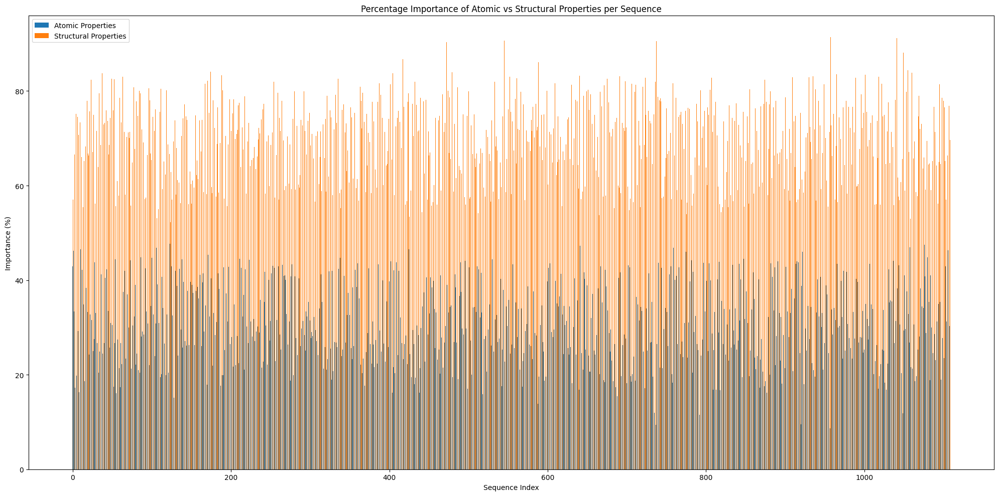

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Number of sequences
n_seq = per_sequence_pct_src.shape[0]
indices = np.arange(n_seq)

# Bar width
width = 0.4

plt.figure(figsize=(20, 10))

# Bars
plt.bar(indices - width/2, per_sequence_pct_src.numpy(), width, label="Atomic Properties")
plt.bar(indices + width/2, per_sequence_pct_tgt.numpy(), width, label="Structural Properties")

# Labels & titles
plt.xlabel("Sequence Index")
plt.ylabel("Importance (%)")
plt.title("Percentage Importance of Atomic vs Structural Properties per Sequence")
plt.legend()

# X-axis ticks
# plt.xticks(indices, [f"Seq {i}" for i in range(n_seq)], rotation=90)

plt.tight_layout()
plt.savefig("input_sequence_importance_comparison.png")
plt.show()


In [ ]:
# torch.save(trained_model.state_dict(), '/content/drive/MyDrive/Protein/best_translation_model_final_2.pth')

In [ ]:
# Original indices of the validation set
if hasattr(val_loader.dataset, "indices"):
    val_indices = val_loader.dataset.indices
    print("Validation indices:", val_indices)

Validation indices: [544, 3098, 1047, 5414, 223, 3429, 3965, 3899, 4087, 2534, 3093, 1732, 2859, 3269, 661, 3637, 47, 5141, 5379, 656, 3784, 2792, 229, 1089, 3424, 1264, 285, 2349, 1694, 3170, 3030, 1604, 5003, 1142, 3018, 3707, 1980, 1886, 398, 5401, 4761, 2411, 4353, 5508, 3116, 462, 1571, 3000, 4404, 3787, 2437, 4649, 4481, 4694, 4323, 2934, 2166, 1887, 3044, 1658, 2144, 2309, 549, 4504, 4216, 2473, 1535, 5385, 5494, 44, 673, 5358, 723, 946, 5292, 3609, 1910, 4302, 3043, 3599, 4294, 5238, 4553, 4129, 1443, 4775, 3991, 1176, 270, 845, 3916, 277, 1806, 3773, 529, 1803, 2487, 4297, 1861, 4607, 1804, 4883, 1383, 5530, 1525, 3113, 3485, 5171, 5, 4241, 5179, 5335, 4680, 4533, 5529, 3553, 1995, 55, 3103, 1147, 4886, 3403, 2873, 2578, 491, 211, 3863, 2236, 214, 3164, 4486, 256, 2115, 789, 1250, 2235, 54, 4167, 4240, 4289, 4674, 5196, 602, 2042, 3545, 3762, 3847, 1099, 1018, 1715, 2845, 196, 21, 5047, 5161, 4731, 802, 3439, 4957, 3785, 2125, 4549, 710, 585, 4676, 174, 4933, 4034, 3107, 1221,

# Converting to original Coordinates

In [ ]:
def get_all_dataloaders(batch_size=32, val_split=0.2, seed=42, shuffle=True):
    # Ensure tensors are torch tensors and correct dtype
    X_src = torch.as_tensor(sequences_atomic_input, dtype=torch.float32)
    M_src = torch.as_tensor(atomic_masks, dtype=torch.bool)

    X_tgt_in = torch.as_tensor(sequences_struct_input, dtype=torch.float32)
    M_tgt_in = torch.as_tensor(input_masks, dtype=torch.bool)

    Y_tgt = torch.as_tensor(sequences_struct_target, dtype=torch.float32)
    M_tgt = torch.as_tensor(target_masks, dtype=torch.bool)

    dataset = TensorDataset(X_src, M_src, X_tgt_in, M_tgt_in, Y_tgt, M_tgt)

    all_loader = DataLoader(dataset, batch_size=batch_size, shuffle=False, drop_last=False)

    return all_loader

## infering all the protein structure

In [ ]:
import torch
from tqdm import tqdm

# make sure loader is deterministic (no shuffle)
all_loader = get_all_dataloaders(batch_size=32, val_split=0.0, seed=42, shuffle=False)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = trained_model.to(device)   # or whatever your model variable is
model.eval()

pred_chunks = []
mask_chunks = []

with torch.no_grad():
    for batch in tqdm(all_loader, desc="Infer all batches"):
        # batch = (X_src, M_src, X_tgt_in, M_tgt_in, Y_tgt, M_tgt)
        X_src, M_src, X_tgt_in, M_tgt_in, Y_tgt, M_tgt = batch

        # move to device
        X_src = X_src.to(device)          # (B, 400, d)
        M_src = M_src.to(device)          # (B, 400)
        X_tgt_in = X_tgt_in.to(device)    # (B, 400, d)
        M_tgt_in = M_tgt_in.to(device)    # (B, 400)
        # Y_tgt, M_tgt are available if needed

        # forward pass — adapt call signature to your model
        # If your model signature was: out = model(src, src_mask, tgt_in, tgt_mask)
        out = model(X_src, M_src, X_tgt_in, M_tgt_in)
        # if your model returns (out, attn_maps) use: out, _ = model(...)
        if isinstance(out, tuple):
            out = out[0]

        # move preds and masks to cpu and collect
        pred_chunks.append(out.cpu())        # (B, 400, d)
        mask_chunks.append(M_tgt.cpu())      # (B, 400)  -- use target mask (valid positions)

# concatenate to full padded-per-protein arrays
sequences_pred_padded = torch.cat(pred_chunks, dim=0)  # (num_proteins, 400, d)
masks_pred_padded = torch.cat(mask_chunks, dim=0)      # (num_proteins, 400)

print("padded pred shape:", sequences_pred_padded.shape)
print("padded mask shape:", masks_pred_padded.shape)

# --- reverse back to flattened per-residue predictions ---
# requires your reverse_split_and_pad function from earlier
flat_pred, flat_pred_mask = reverse_split_and_pad(sequences_pred_padded, masks_pred_padded, unique_residues, groupby_key="protein_id")

print("flat_pred.shape:", flat_pred.shape)       # (N_residues, d)
print("flat_pred_mask.sum():", flat_pred_mask.sum().item())

# # Optionally attach back to the unique_residues DataFrame:
# # convert flat_pred to numpy and create columns feature_0 .. feature_{d-1}
# d = flat_pred.shape[1]
# flat_np = flat_pred.cpu().numpy()
# for j in range(d):
#     unique_residues[f"pred_feat_{j}"] = flat_np[:, j]

# # add mask column
# unique_residues["pred_valid"] = flat_pred_mask.cpu().numpy().astype(int)

# # Save if desired
# # unique_residues.to_csv("predicted_flat_per_residue.csv", index=False)


Infer all batches: 100%|██████████| 174/174 [00:06<00:00, 25.86it/s]


padded pred shape: torch.Size([5548, 400, 128])
padded mask shape: torch.Size([5548, 400])
flat_pred.shape: torch.Size([501618, 128])
flat_pred_mask.sum(): 501513


In [ ]:
dataset = TensorDataset(flat_pred, flat_pred_mask)

all_flat_pred_loader = DataLoader(dataset, batch_size=batch_size, shuffle=False, drop_last=False)

In [ ]:
pred_struct_chunks = []
for batch in tqdm(all_flat_pred_loader):
  x, m = batch
  x=x.to(DEVICE)
  out_flat=structural_encoder.decoder(x)
  out = out_flat.view(x.shape[0], structural_encoder.max_len, structural_encoder.INPUT_FEAT)
  pred_struct_chunks.append(out.cpu())

100%|██████████| 15676/15676 [00:09<00:00, 1650.26it/s]


In [ ]:
pred_struct=torch.cat(pred_struct_chunks, dim=0)

In [ ]:
masked_pred_struct=pred_struct.detach().numpy()*original_struct_mask[:,:,None]

## converting back to coordinates

In [ ]:
coord_tokens_rel, first_atoms_rel = invert_shifted_relative(masked_pred_struct, original_struct_mask)
# remove last residue
coord_trim = coord_tokens_rel[:,:-1]   # shape (N-1, L, 3)
mask_trim  = original_struct_mask[:,:-1].astype(bool)     # shape (N-1, L)



invert_shifted_relative: 100%|██████████| 501617/501617 [00:00<00:00, 525527.78it/s]


In [ ]:

# flatten then boolean-index (works because shapes match when flattened)
all_valid_rows = coord_trim.reshape(-1, 3)[mask_trim.ravel()]

# shapes
print(coord_trim.shape)      # (N-1, L, 3)
print(mask_trim.shape)       # (N-1, L)
print(all_valid_rows.shape)  # (K, 3) where K = sum(mask_trim)

(501618, 32, 3)
(501618, 32)
(7697292, 3)


In [ ]:
df[['X_pred','Y_pred','Z_pred']]=all_valid_rows

## Converting original coordinates

In [ ]:
coord_tokens_rel, first_atoms_rel = invert_shifted_relative(original_struct, original_struct_mask)
# remove last residue
coord_trim = coord_tokens_rel[:,:-1]   # shape (N-1, L, 3)
mask_trim  = original_struct_mask[:,:-1].astype(bool)     # shape (N-1, L)


invert_shifted_relative: 100%|██████████| 501617/501617 [00:00<00:00, 523920.09it/s]


In [ ]:

# flatten then boolean-index (works because shapes match when flattened)
all_valid_rows = coord_trim.reshape(-1, 3)[mask_trim.ravel()]

# shapes
print(coord_trim.shape)      # (N-1, L, 3)
print(mask_trim.shape)       # (N-1, L)
print(all_valid_rows.shape)  # (K, 3) where K = sum(mask_trim)

df[['X_shifted','Y_shifted','Z_shifted']]=all_valid_rows

(501618, 32, 3)
(501618, 32)
(7697292, 3)


In [ ]:
df.to_csv('/content/drive/MyDrive/Protein/finalized_data_with_pred_final.csv',index=False)

In [ ]:
np.save('/content/drive/MyDrive/Protein/val_indices.npy',val_loader.dataset.indices)
np.save('/content/drive/MyDrive/Protein/test_indices.npy',test_loader.dataset.indices)
np.save('/content/drive/MyDrive/Protein/train_indices.npy',train_loader.dataset.indices)

# Use CPU from here

## Mount Drive

In [ ]:
from google.colab import drive
import pandas as pd
import os

# 1. Mount Google Drive
drive.mount('/content/drive')


Mounted at /content/drive


## Load data

In [ ]:
df=pd.read_csv("/content/drive/MyDrive/Protein/finalized_data_with_pred_final.csv",low_memory=False)




In [ ]:
df.columns

Index(['record_name', 'atom_number', 'Atom_Name', 'alt_loc', 'Residue_Name',
       'Chain', 'Residue_ID', 'insertion', 'X_true', 'Y_true', 'Z_true',
       'occupancy', 'B_Factor', 'Element', 'X_ideal', 'Y_ideal', 'Z_ideal',
       'protein_id', 'X_pred', 'Y_pred', 'Z_pred', 'X_shifted', 'Y_shifted',
       'Z_shifted'],
      dtype='object')

In [ ]:
import numpy as np
train_indices=np.load('/content/drive/MyDrive/Protein/train_indices.npy')
train_protein=df.protein_id.unique()[train_indices]
val_indices=np.load('/content/drive/MyDrive/Protein/val_indices.npy')
val_protein=df.protein_id.unique()[val_indices]
test_indices=np.load('/content/drive/MyDrive/Protein/test_indices.npy')
test_protein=df.protein_id.unique()[test_indices]

In [ ]:
set(['1hel']).intersection(set(df.protein_id.unique().tolist()))

set()

# Visualizing Protein

In [ ]:
! pip install  py3Dmol

### Save all

In [ ]:
import py3Dmol
from tqdm import tqdm
import os

def save_py3dmol_html(pdb_str1, pdb_str2, out_path):
    """Save two pdb structures (pred vs shifted) into an interactive py3Dmol HTML file."""
    view = py3Dmol.view(width=800, height=600)
    view.addModel(pdb_str1, "pdb")
    view.setStyle({'model': 0}, {'cartoon': {'color': 'blue'}})   # Predicted = Blue

    view.addModel(pdb_str2, "pdb")
    view.setStyle({'model': 1}, {'cartoon': {'color': 'red'}})    # Shifted (true) = Red

    view.zoomTo()

    # Export HTML
    with open(out_path, "w") as f:
        f.write(view._make_html())
    return out_path


# === Run for all protein IDs ===
output_dir = "/content/drive/MyDrive/Protein/combined_protein_visualizations"
os.makedirs(output_dir, exist_ok=True)

protein_ids = df["protein_id"].unique()

for pid in tqdm(protein_ids, desc="Generating visualizations"):
    out_file = os.path.join(output_dir, f"{pid}_pred_vs_true.html")
    if os.path.exists(out_file):
        continue
    df_first = df[df.protein_id == pid].drop(columns=['X_ideal', 'Y_ideal', 'Z_ideal','protein_id'])
    df_ideal = df[df.protein_id == pid].drop(columns=['X_true', 'Y_true', 'Z_true','protein_id'])

    pdb_str1 = csv_to_pdb_string(df_first, 'pred')     # Predicted structure
    pdb_str2 = csv_to_pdb_string(df_first, 'shifted')  # True structure (shifted)


    save_py3dmol_html(pdb_str1, pdb_str2, out_file)


Generating visualizations: 100%|██████████| 5548/5548 [00:00<00:00, 9716.35it/s]


In [ ]:
df.protein_id.unique()[1368]

'1k2h'

### Single Instance

In [ ]:
instances_i_want=['2g46','1ezp','2gve','2ezq','1iez']
# instances_i_want=['1ubq']

In [ ]:
test_protein=df.protein_id.unique()[test_loader.dataset.indices]


In [ ]:
set(instances_i_want).intersection(set(test_protein))

{'1ezp', '1iez', '2ezq', '2g46', '2gve'}

In [ ]:
for p in reversed(instances_i_want):
  print(p)

1iez
2ezq
2gve
1ezp
2g46


In [ ]:
df[df.protein_id=='1ten']

,record_name,atom_number,Atom_Name,alt_loc,Residue_Name,Chain,Residue_ID,insertion,X_true,Y_true,...,X_ideal,Y_ideal,Z_ideal,protein_id,X_pred,Y_pred,Z_pred,X_shifted,Y_shifted,Z_shifted


In [ ]:
import py3Dmol

for types in ['base','true','pred']:
  for protein_id in instances_i_want:

    # protein_id='1klc'
    df_ideal=df[df.protein_id==protein_id].drop(columns=['X_true', 'Y_true', 'Z_true','protein_id'])
    df_first=df[df.protein_id==protein_id].drop(columns=['X_ideal', 'Y_ideal', 'Z_ideal','protein_id'])

    # Example usage
    pdb_str1 = csv_to_pdb_string(df_first,'pred')
    pdb_str2 = csv_to_pdb_string(df_first,'shifted')
    # print(pdb_str2)
    view = py3Dmol.view(width=800, height=600)

    if types=='base' or types=='pred':
      view.addModel(pdb_str1, "pdb")
      view.setStyle({'model': 0}, {'cartoon': {'color': 'blue'}})

    if types=='base' or types=='true':
      model_num=1
      if types=='true':
        model_num=0
      view.addModel(pdb_str2, "pdb")
      view.setStyle({'model': model_num}, {'cartoon': {'color': 'red'}})



    view.zoomTo()
    view.show()
    out_path=f'{protein_id}_{types}.html'
    with open(out_path, "w") as f:
          f.write(view._make_html())

    # Google download the out_path file
    from google.colab import files
    files.download(out_path)

3Dmol.js failed to load for some reason. Please check your browser console for error messages.

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

3Dmol.js failed to load for some reason. Please check your browser console for error messages.

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

3Dmol.js failed to load for some reason. Please check your browser console for error messages.

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

3Dmol.js failed to load for some reason. Please check your browser console for error messages.

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

3Dmol.js failed to load for some reason. Please check your browser console for error messages.

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

3Dmol.js failed to load for some reason. Please check your browser console for error messages.

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

3Dmol.js failed to load for some reason. Please check your browser console for error messages.

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

3Dmol.js failed to load for some reason. Please check your browser console for error messages.

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

3Dmol.js failed to load for some reason. Please check your browser console for error messages.

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

3Dmol.js failed to load for some reason. Please check your browser console for error messages.

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

3Dmol.js failed to load for some reason. Please check your browser console for error messages.

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

3Dmol.js failed to load for some reason. Please check your browser console for error messages.

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

3Dmol.js failed to load for some reason. Please check your browser console for error messages.

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

3Dmol.js failed to load for some reason. Please check your browser console for error messages.

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

3Dmol.js failed to load for some reason. Please check your browser console for error messages.

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
import py3Dmol
for protein_id in ['1gb1','1srl']:

  # protein_id='1klc'
  df_ideal=df[df.protein_id==protein_id].drop(columns=['X_true', 'Y_true', 'Z_true','protein_id'])
  df_first=df[df.protein_id==protein_id].drop(columns=['X_ideal', 'Y_ideal', 'Z_ideal','protein_id'])

  # Example usage
  pdb_str1 = csv_to_pdb_string(df_first,'pred')
  pdb_str2 = csv_to_pdb_string(df_first,'shifted')
  # print(pdb_str2)
  view = py3Dmol.view(width=800, height=600)
  view.addModel(pdb_str1, "pdb")
  view.setStyle({'model': 0}, {'cartoon': {'color': 'red'}})

  view.addModel(pdb_str2, "pdb")
  view.setStyle({'model': 1}, {'cartoon': {'color': 'blue'}})
  view.zoomTo()
  view.show()
  out_path=f'{protein_id}_true.html'
  # with open(out_path, "w") as f:
  #       f.write(view._make_html())

  # # Google download the out_path file
  # from google.colab import files
  # files.download(out_path)

3Dmol.js failed to load for some reason. Please check your browser console for error messages.

3Dmol.js failed to load for some reason. Please check your browser console for error messages.

In [ ]:
stop

NameError: name 'stop' is not defined

# Data distribution

## Sequence Lenght calculation

In [ ]:
# count length of df.groupby(by=['protein_id]) i.e. length of each protein sequence
# Ensure Residue_ID is numeric (avoid duplicates due to strings like "1 " vs "1")
df["Residue_ID"] = df["Residue_ID"].astype(str).str.strip()

# Group by protein_id and Chain, count unique residues
seq_lengths = (
    df.groupby(["protein_id", "Chain"])["Residue_ID"]
      .nunique()
      .reset_index(name="sequence_length")
)
# Now add the Chains for each protein id to get the total length:
seq_lengths['total_length'] = seq_lengths.groupby('protein_id')['sequence_length'].transform('sum')

print(seq_lengths.head())


In [ ]:
seq_lengths[seq_lengths.protein_id.isin(instances_i_want)]

## Visualizing the data distribution

In [ ]:
val_seq_len=seq_lengths[seq_lengths.protein_id.isin(val_protein)]
test_seq_len=seq_lengths[seq_lengths.protein_id.isin(test_protein)]
train_seq_len=seq_lengths[~seq_lengths.protein_id.isin(train_protein)]

In [ ]:
from matplotlib import pyplot as plt

# Validation and training sets
val_data = val_seq_len['sequence_length']
train_data = train_seq_len['sequence_length']
test_data = test_seq_len['sequence_length']

# Plot both distributions
plt.hist(train_data, bins=20, alpha=0.5, label="Train")
plt.hist(val_data, bins=20, alpha=0.5, label="Validation")
plt.hist(test_data, bins=20, alpha=0.5, label="Test")

# Titles, labels, and clean look
plt.title("Distribution of Chain Lengths")
plt.xlabel("Chain Length")
plt.ylabel("Frequency")
plt.legend()
plt.gca().spines[['top', 'right']].set_visible(False)
plt.savefig("chain_length.png")
plt.show()


In [ ]:
from matplotlib import pyplot as plt

# Validation and training sets
val_data = val_seq_len['total_length']
train_data = train_seq_len['total_length']
test_data = test_seq_len['total_length']

# Plot both distributions
plt.hist(train_data, bins=20, alpha=0.5, label="Train")
plt.hist(val_data, bins=20, alpha=0.5, label="Validation")
plt.hist(test_data, bins=20, alpha=0.5, label="Test")

# Titles, labels, and clean look
plt.title("Distribution of Total Lengths ")
plt.xlabel("Total Length")
plt.ylabel("Frequency")
plt.legend()
plt.gca().spines[['top', 'right']].set_visible(False)
plt.savefig("total_length.png")
plt.show()


# Metrics Calculation

In [ ]:
df[df.protein_id=='1srl'][['Chain','Residue_ID','Residue_Name']].drop_duplicates().Residue_Name.tolist()

In [ ]:
folding_hotspot_pdbs = [
    "1lmb",  # λ-repressor domain
    "1ris",  # Protein L
    "1srl",  # Protein L variant
    "1stf",  # Staphylococcal nuclease
    "1enh",  # Engrailed homeodomain
    "1pin",  # Protein G B1 domain
    "2ci2",  # Chymotrypsin Inhibitor 2 (CI2)
    "1fnf",  # Fibronectin type III domain
    "1aye",  # Ubiquitin
    "1hz6",  # Ubiquitin variant
    "1gb1",  # GB1 domain (Protein G)
    "1mjc",  # Myoglobin
    "1ubq"   # Ubiquitin (canonical entry)
]


In [ ]:
df[df.protein_id.isin(folding_hotspot_pdbs)].protein_id.unique()

In [ ]:
protein_l_pdb_ids = [
    "1hz5", "1hz6", "2ptl",
    "1hez", "1mhh", "1k50", "1k51", "1k52", "1k53",
    "1xct", "1ymh"
]


In [ ]:
protein_g_pdb_ids = [
    "1pga",  # Protein G (B1 domain, classic)
    "2gb1",  # GB1 domain (high-resolution NMR)
    "1gb1",  # GB1 domain (NMR structure, very widely studied)
    "3gb1",  # GB1 mutants/variants
    "5gb1"   # engineered/stabilized GB1
]


In [ ]:
df[df.protein_id.isin(protein_l_pdb_ids)].protein_id.unique()

In [ ]:
df.protein_id.nunique()

In [ ]:
df.columns

In [ ]:
! pip install biopython

In [ ]:
import os
os.path.exists('/content/drive/MyDrive/Protein/Fasta')
# out_folder='/content/drive/MyDrive/Protein/Fasta'

In [ ]:
# os.makedirs(out_folder, exist_ok=True)

In [ ]:
import numpy as np

val_indices=np.load('/content/drive/MyDrive/Protein/val_indices.npy')
val_prot=df.protein_id.unique()[val_indices].tolist()

In [ ]:
val_unique_residues=df[df.protein_id.isin(val_prot)][['protein_id','Chain','Residue_Name','Residue_ID']].drop_duplicates()

In [ ]:
import os, sys, traceback
from Bio.Seq import Seq
from Bio.SeqRecord import SeqRecord
from Bio import SeqIO
from tqdm.auto import tqdm

# === CONFIG ===
# use an absolute path; if you're in Colab it should be '/content/drive/MyDrive/...' (note leading slash)
out_folder = "/content/drive/MyDrive/Protein/Fasta"   # <- EDIT if needed
# If you want a safe local fallback, this will be used if out_folder isn't writable:
fallback_folder = os.path.abspath("./fasta_debug_output")

# === Sanity prints ===
print("Current working directory:", os.getcwd())
print("Python executable:", sys.executable)
print("Target out_folder (as given):", out_folder)
out_folder_abs = os.path.abspath(out_folder)
print("Target out_folder (absolute):", out_folder_abs)

# === Create/check folder ===
try:
    os.makedirs(out_folder, exist_ok=True)
except Exception as e:
    print("os.makedirs raised:", repr(e))

print("Exists:", os.path.exists(out_folder))
print("Is dir:", os.path.isdir(out_folder))
print("Writable (os.access):", os.access(out_folder, os.W_OK))
try:
    # list parent dir to help debug permission/mount problems
    parent = os.path.dirname(out_folder) or "/"
    print(f"Parent dir ({parent}) exists: {os.path.exists(parent)}; listing (first 20):")
    try:
        print(os.listdir(parent)[:20])
    except Exception as e:
        print("Could not list parent dir:", repr(e))
except Exception:
    pass

# === quick test write to target folder ===
test_path = os.path.join(out_folder, ".__write_test__.txt")
try:
    with open(test_path, "w") as fh:
        fh.write("test\n")
    print("Test write succeeded, size:", os.path.getsize(test_path))
    os.remove(test_path)
except Exception as e:
    print("Test write failed:", repr(e))
    # try fallback (local) folder
    os.makedirs(fallback_folder, exist_ok=True)
    test2 = os.path.join(fallback_folder, ".__write_test__.txt")
    try:
        with open(test2, "w") as fh:
            fh.write("test\n")
        print("Fallback write succeeded at", fallback_folder, "size:", os.path.getsize(test2))
        os.remove(test2)
        print("→ Will write output into fallback folder instead.")
        out_folder = fallback_folder
    except Exception as e2:
        print("Fallback write also failed:", repr(e2))
        raise RuntimeError("Cannot write to target or fallback folder. Fix mount/permissions first.") from e2

# === Prepare input: ensure you still have `unique_residues` or create from df ===
# The code below expects `unique_residues` dataframe: columns ['protein_id','Chain','Residue_ID','insertion','Residue_Name_3']
# If you only have `df`, uncomment and adapt the normalization lines:
#
# df['Residue_Name_3'] = df['Residue_Name'].astype(str).str.strip().str.upper().str[:3]
# if 'insertion' not in df.columns:
#     df['insertion'] = ''
# unique_residues = df[['protein_id','Chain','Residue_ID','insertion','Residue_Name_3']].drop_duplicates()

# sanity check presence:
if 'val_unique_residues' not in globals():
    raise RuntimeError("val_unique_residues dataframe not found in namespace. Create it (see comments) and re-run.")

print("val_unique_residues rows:", len(val_unique_residues))
print("Sample rows (first 5):")
print(val_unique_residues.head(5))

# 3-letter -> 1-letter map (keep as in previous script)
three_to_one = {
    'ALA':'A', 'ARG':'R', 'ASN':'N', 'ASP':'D', 'CYS':'C',
    'GLU':'E', 'GLN':'Q', 'GLY':'G', 'HIS':'H', 'ILE':'I',
    'LEU':'L', 'LYS':'K', 'MET':'M', 'PHE':'F', 'PRO':'P',
    'SER':'S', 'THR':'T', 'TRP':'W', 'TYR':'Y', 'VAL':'V',
    'SEC':'U', 'PYL':'O'
}

# === Group & write with diagnostics ===
groups = list(val_unique_residues.groupby(['protein_id','Chain']))
print("Groups to process:", len(groups))

written = []
errors = []
for (protein_id, chain), group in tqdm(groups):
    try:
        group = group.sort_values(['Chain','Residue_ID','insertion'])
        seq_chars = [three_to_one.get(res, 'X') for res in group['Residue_Name_3']]
        sequence = ''.join(seq_chars)
        if not sequence:
            continue
        record_id = f"{protein_id}_{chain}"
        record = SeqRecord(Seq(sequence), id=record_id, description=f"protein:{protein_id} chain:{chain}")
        # sanitize file name components
        safe_chain = str(chain).replace("/", "_").replace("\\", "_").replace(" ", "_")
        fname = f"{protein_id}_{safe_chain}.fasta"
        fasta_path = os.path.join(out_folder, fname)
        # write and verify
        with open(fasta_path, "w") as fh:
            n = SeqIO.write([record], fh, "fasta")
        if n >= 1 and os.path.exists(fasta_path):
            size = os.path.getsize(fasta_path)
            written.append((fasta_path, size))
        else:
            errors.append((fasta_path, "SeqIO.write returned 0 or file missing"))
    except Exception as e:
        tb = traceback.format_exc()
        errors.append((protein_id, chain, str(e), tb))

# === Summary ===
print("=== WRITE SUMMARY ===")
print("Output folder used:", os.path.abspath(out_folder))
print("Files written:", len(written))
for f,p in written[:20]:
    print(" +", f, "-", p, "bytes")
if errors:
    print("\nErrors encountered:", len(errors))
    for err in errors[:10]:
        print(" -", err)
print("\nFinal listing (first 50) of output folder:")
try:
    print(os.listdir(out_folder)[:50])
except Exception as e:
    print("Could not list final output folder:", repr(e))

print("\nDone.")


In [ ]:
! ls '/content/drive/MyDrive/Protein/'

In [ ]:
import numpy as np

val_indices=np.load('/content/drive/MyDrive/Protein/val_indices.npy')

In [ ]:
len(set(val_indices).intersection(set(test_loader.dataset.indices))),len(val_indices),len(test_loader.dataset.indices)

In [ ]:
# for p in df.protein_id.unique()[val_indices].tolist():
#   print(p)

In [ ]:
items = [
    "1iez",
    "1l6n",
    "2eyz",
    "1oqy",
    "1ezp",
    "2gve",
    "1xna",
    "1lui",
    "1aa9",
    "1trl",
    "2h8b",
    "1vsq",
    "2adn",
    '1ah2',
    "1n3j",
    "2ezq",
    "2g46",
    "1klc"
]


## DockQ

In [ ]:
import numpy as np
import pandas as pd
from itertools import combinations
from tqdm.auto import tqdm

# ---------- helper math functions ----------
def kabsch(P, Q):
    """
    Kabsch algorithm that returns rotation R and translation t such that R @ P + t ~= Q.
    P and Q must be (N,3) and correspond in order.
    """
    assert P.shape == Q.shape and P.ndim == 2 and P.shape[1] == 3
    # centroid
    Pc = P.mean(axis=0)
    Qc = Q.mean(axis=0)
    P_center = P - Pc
    Q_center = Q - Qc
    # covariance
    C = P_center.T @ Q_center
    # SVD
    V, S, Wt = np.linalg.svd(C)
    d = np.sign(np.linalg.det(V @ Wt))
    D = np.diag([1.0, 1.0, d])
    R = V @ D @ Wt
    t = Qc - (R @ Pc)
    return R, t

def rmsd_between(A, B):
    """RMSD between two (N,3) arrays (already in same frame)."""
    if len(A) == 0:
        return np.nan
    diffs = A - B
    return np.sqrt(np.mean(np.sum(diffs * diffs, axis=1)))

# ---------- main DockQ calculator ----------
def dockq_per_protein(df,
                      protein_col='protein_id',
                      chain_col='Chain',
                      rescol='Residue_ID',
                      atomcol='Atom_Name',
                      elemcol='Element',
                      coords_native=('X_shifted','Y_shifted','Z_shifted'),
                      coords_model=('X_pred','Y_pred','Z_pred'),
                      contact_cutoff=5.0,          # for Fnat (atom-atom)
                      interface_cutoff=10.0,       # for interface residues (atoms)
                      backbone_atoms=('N','CA','C','O'),
                      d1=8.5, d2=1.5):
    """
    df : pandas.DataFrame with atom records for both native and model coords (per row).
    Returns DataFrame with columns: protein_id, DockQ, Fnat, LRMSD, iRMSD, receptor_chain, ligand_chains
    """
    out = []
    # process per protein
    for pid, g in tqdm(df.groupby(protein_col)):
        # Build two dictionaries for coordinates keyed by (chain, resid, atom)
        native_coords = {}
        model_coords = {}
        # Also keep residue->list of (atomname, coord, element)
        residues_native = {}
        residues_model = {}
        for _, row in g.iterrows():
            key = (row[chain_col], row[rescol], row[atomcol])
            ncoord = np.array([row[coords_native[0]], row[coords_native[1]], row[coords_native[2]]], dtype=float)
            mcoord = np.array([row[coords_model[0]], row[coords_model[1]], row[coords_model[2]]], dtype=float)
            native_coords[key] = ncoord
            model_coords[key] = mcoord
            res_key = (row[chain_col], row[rescol])
            residues_native.setdefault(res_key, []).append((row[atomcol], ncoord, row.get(elemcol, '')))
            residues_model.setdefault(res_key, []).append((row[atomcol], mcoord, row.get(elemcol, '')))
        chains = sorted({c for (c,_) in {r[:1][0] for r in residues_native.keys()}}) if False else sorted({r[0] for r in residues_native.keys()})
        # If residues_model lacks some residues (possible), also include chains from model
        chains_model = sorted({r[0] for r in residues_model.keys()})
        if set(chains_model) - set(chains):
            chains = sorted(set(chains) | set(chains_model))

        # If only two chains, try both receptor/ligand orderings; if >2, try receptor being each chain and ligand others
        best = {'DockQ': -1, 'Fnat': np.nan, 'LRMSD': np.nan, 'iRMSD': np.nan, 'receptor': None, 'ligand_chains': None}
        # build list of receptor candidates (single chain)
        receptor_candidates = chains

        for receptor_chain in receptor_candidates:
            ligand_chains = [c for c in chains if c != receptor_chain]
            if len(ligand_chains) == 0:
                continue

            # Build lists of residues belonging to receptor and ligand (native)
            rec_res_native = [r for r in residues_native.keys() if r[0] == receptor_chain]
            lig_res_native = [r for r in residues_native.keys() if r[0] in ligand_chains]
            rec_res_model = [r for r in residues_model.keys() if r[0] == receptor_chain]
            lig_res_model = [r for r in residues_model.keys() if r[0] in ligand_chains]

            # --- Fnat: compute native contacts (residue pairs) using heavy atoms within contact_cutoff (5A)
            def is_hydrogen(atomname, element):
                if isinstance(element, str) and element.strip():
                    el = str(element).strip()
                    return el.upper().startswith('H')
                # fallback: atom name starting with H
                return str(atomname).strip().upper().startswith('H')

            native_contacts = set()
            for r1 in rec_res_native:
                atoms1 = residues_native.get(r1, [])
                for r2 in lig_res_native:
                    atoms2 = residues_native.get(r2, [])
                    contact = False
                    for a1_name, a1_coord, a1_elem in atoms1:
                        if is_hydrogen(a1_name, a1_elem):
                            continue
                        for a2_name, a2_coord, a2_elem in atoms2:
                            if is_hydrogen(a2_name, a2_elem):
                                continue
                            if np.linalg.norm(a1_coord - a2_coord) <= contact_cutoff:
                                native_contacts.add((r1, r2))
                                contact = True
                                break
                        if contact:
                            break

            # model contacts (predicted coords)
            model_contacts = set()
            for r1 in rec_res_model:
                atoms1 = residues_model.get(r1, [])
                for r2 in lig_res_model:
                    atoms2 = residues_model.get(r2, [])
                    contact = False
                    for a1_name, a1_coord, a1_elem in atoms1:
                        if is_hydrogen(a1_name, a1_elem):
                            continue
                        for a2_name, a2_coord, a2_elem in atoms2:
                            if is_hydrogen(a2_name, a2_elem):
                                continue
                            if np.linalg.norm(a1_coord - a2_coord) <= contact_cutoff:
                                model_contacts.add((r1, r2))
                                contact = True
                                break
                        if contact:
                            break

            if len(native_contacts) == 0:
                Fnat = 0.0
            else:
                # fraction of native contacts retrieved
                Fnat = len(native_contacts.intersection(model_contacts)) / float(len(native_contacts))

            # --- LRMSD: superpose receptor (backbone atoms) then compute ligand backbone RMSD
            # gather matched backbone atom coords lists for receptor and ligand (only atoms present in both native & model)
            def gather_matched_atoms(res_list_native, res_list_model, atom_names):
                """Return pair of arrays (native_pts, model_pts) for matched atoms in the given residue lists."""
                native_pts = []
                model_pts = []
                for res in res_list_native:
                    chain, resid = res
                    # For this residue, for each atom name in atom_names, check presence in native & model
                    for an in atom_names:
                        key = (chain, resid, an)
                        if key in native_coords and key in model_coords:
                            native_pts.append(native_coords[key])
                            model_pts.append(model_coords[key])
                if len(native_pts) == 0:
                    return np.zeros((0,3)), np.zeros((0,3))
                return np.vstack(native_pts), np.vstack(model_pts)

            rec_native_pts, rec_model_pts = gather_matched_atoms(rec_res_native, rec_res_model, backbone_atoms)
            lig_native_pts, lig_model_pts = gather_matched_atoms(lig_res_native, lig_res_model, backbone_atoms)

            LRMSD = np.nan
            if len(rec_native_pts) >= 3 and len(lig_native_pts) > 0:
                # superpose model receptor onto native receptor (so transform model->native frame)
                try:
                    R_rec, t_rec = kabsch(rec_model_pts, rec_native_pts)
                    # apply to model ligand atoms (only those matching by backbone atom names)
                    lig_model_transformed = (lig_model_pts @ R_rec.T) + t_rec
                    # compute RMSD only on positions where both native & model ligand backbone atoms exist (we used gather_matched_atoms)
                    LRMSD = rmsd_between(lig_native_pts, lig_model_transformed)
                except Exception:
                    LRMSD = np.nan
            else:
                # fallback: if not enough receptor backbone atoms, attempt using CA only
                # gather CA only
                rec_native_ca, rec_model_ca = gather_matched_atoms(rec_res_native, rec_res_model, ('CA',))
                lig_native_ca, lig_model_ca = gather_matched_atoms(lig_res_native, lig_res_model, ('CA',))
                if len(rec_native_ca) >= 3 and len(lig_native_ca) > 0:
                    R_rec, t_rec = kabsch(rec_model_ca, rec_native_ca)
                    lig_model_transformed = (lig_model_ca @ R_rec.T) + t_rec
                    LRMSD = rmsd_between(lig_native_ca, lig_model_transformed)
                else:
                    LRMSD = np.nan

            # --- iRMSD: determine interface residues (native) using interface_cutoff (10A)
            interface_residues = set()
            for r1 in rec_res_native:
                atoms1 = residues_native.get(r1, [])
                for r2 in lig_res_native:
                    atoms2 = residues_native.get(r2, [])
                    found = False
                    for a1_name, a1_coord, a1_elem in atoms1:
                        if is_hydrogen(a1_name, a1_elem):
                            continue
                        for a2_name, a2_coord, a2_elem in atoms2:
                            if is_hydrogen(a2_name, a2_elem):
                                continue
                            if np.linalg.norm(a1_coord - a2_coord) <= interface_cutoff:
                                interface_residues.add(r1)
                                interface_residues.add(r2)
                                found = True
                                break
                        if found:
                            break

            # gather backbone coords for interface residues (matching atoms)
            interface_native_pts = []
            interface_model_pts = []
            for res in interface_residues:
                chain, resid = res
                for an in backbone_atoms:
                    k = (chain, resid, an)
                    if k in native_coords and k in model_coords:
                        interface_native_pts.append(native_coords[k])
                        interface_model_pts.append(model_coords[k])
            interface_native_pts = np.vstack(interface_native_pts) if len(interface_native_pts) else np.zeros((0,3))
            interface_model_pts = np.vstack(interface_model_pts) if len(interface_model_pts) else np.zeros((0,3))

            iRMSD = np.nan
            if len(interface_native_pts) >= 3:
                try:
                    R_int, t_int = kabsch(interface_model_pts, interface_native_pts)
                    int_model_trans = (interface_model_pts @ R_int.T) + t_int
                    iRMSD = rmsd_between(interface_native_pts, int_model_trans)
                except Exception:
                    iRMSD = np.nan
            else:
                # fallback to CA only if available
                interface_native_ca = []
                interface_model_ca = []
                for res in interface_residues:
                    chain, resid = res
                    k = (chain, resid, 'CA')
                    if k in native_coords and k in model_coords:
                        interface_native_ca.append(native_coords[k])
                        interface_model_ca.append(model_coords[k])
                if len(interface_native_ca) >= 3:
                    int_native_ca = np.vstack(interface_native_ca)
                    int_model_ca = np.vstack(interface_model_ca)
                    R_int, t_int = kabsch(int_model_ca, int_native_ca)
                    int_model_trans = (int_model_ca @ R_int.T) + t_int
                    iRMSD = rmsd_between(int_native_ca, int_model_trans)
                else:
                    iRMSD = np.nan

            # compute scaled RMS values and DockQ
            def rms_scaled(rms, d):
                if rms is None or (isinstance(rms, float) and np.isnan(rms)):
                    return 0.0
                return 1.0 / (1.0 + (rms / d) ** 2)

            lr_scaled = rms_scaled(LRMSD, d1) if not np.isnan(LRMSD) else 0.0
            ir_scaled = rms_scaled(iRMSD, d2) if not np.isnan(iRMSD) else 0.0

            DockQ = (Fnat + lr_scaled + ir_scaled) / 3.0

            # update best if better
            if DockQ > best['DockQ']:
                best.update({
                    'DockQ': float(DockQ),
                    'Fnat': float(Fnat),
                    'LRMSD': float(LRMSD) if not np.isnan(LRMSD) else np.nan,
                    'iRMSD': float(iRMSD) if not np.isnan(iRMSD) else np.nan,
                    'receptor': receptor_chain,
                    'ligand_chains': ligand_chains
                })

        out.append({
            'protein_id': pid,
            'DockQ': best['DockQ'],
            'Fnat': best['Fnat'],
            'LRMSD': best['LRMSD'],
            'iRMSD': best['iRMSD'],
            'receptor_chain': best['receptor'],
            'ligand_chains': ','.join(best['ligand_chains']) if best['ligand_chains'] else ''
        })

    return pd.DataFrame(out)


### Calculate Dock Q

In [ ]:
dockq_df.dropna().describe()

In [ ]:
if os.path.exists("/content/drive/MyDrive/Protein/dockq_per_protein_final.csv"):
    dockq_df=pd.read_csv("/content/drive/MyDrive/Protein/dockq_per_protein_final.csv")
else:
  dockq_df=dockq_per_protein(df[df.protein_id.isin(test_protein)])
  dockq_df.to_csv("/content/drive/MyDrive/Protein/dockq_per_protein_final.csv", index=False)

In [ ]:
non_na_dock_df=dockq_df.dropna()

In [ ]:
non_na_dock_df[non_na_dock_df.protein_id.isin(instances_i_want)]

In [ ]:
non_na_dock_df.describe()

In [ ]:
print(len(non_na_dock_df[non_na_dock_df.DockQ > 0.23]) / len(non_na_dock_df))

### DockQ analysis

In [ ]:

test_dockq=dockq_df
non_na_dock_df=test_dockq.dropna()
# index of max DockQ in non_na_dock_df
max_dockq_index = non_na_dock_df['DockQ'].idxmax()
# index of max top 5 DockQ in non_na_dock_df
top_10_max_dockq_indices = non_na_dock_df.nlargest(60, 'DockQ').index
# percentage of non_na_dock_df.DockQ that is greater than 0.23

from matplotlib import pyplot as plt

from matplotlib import pyplot as plt
non_na_dock_df['DockQ'].plot(kind='hist', bins=20, alpha=0.2,edgecolor='black',linewidth=1.5)
plt.gca().spines[['top', 'right',]].set_visible(False)
plt.savefig("dockq_hist.png")
plt.show()

In [ ]:
non_na_dock_df.groupby('receptor_chain').size()

In [ ]:
import seaborn as sns
non_na_dock_df.groupby('receptor_chain').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)
plt.savefig("receptor_chain_hist.png")
plt.show()

In [ ]:
! pip install biopython

In [ ]:
df.columns

## Per Chain Metrics

In [ ]:
import numpy as np
import pandas as pd
from scipy.spatial.distance import cdist
from tqdm import tqdm

# ------------------------
# Metric Functions
# ------------------------

def rmsd(pred, true):
    """Root Mean Square Deviation"""
    return np.sqrt(np.mean(np.sum((pred - true) ** 2, axis=1)))

def gdt_score(pred, true, cutoffs=[1, 2, 4, 8]):
    """GDT score: fraction of residues under distance thresholds"""
    dists = np.linalg.norm(pred - true, axis=1)
    return np.mean([np.mean(dists < c) for c in cutoffs]) * 100

def tm_score(pred, true, d0=None):
    """Approximate TM-score"""
    dists = np.linalg.norm(pred - true, axis=1)
    L = len(dists)
    if d0 is None:
        d0 = 1.24 * (L - 15)**(1/3) - 1.8
    return np.mean(1 / (1 + (dists / d0)**2))

def lddt_score(pred, true, cutoff=15.0, thresholds=[0.5, 1, 2, 4]):
    """Simplified Local Distance Difference Test (per-atom)."""
    d_pred = cdist(pred, pred)
    d_true = cdist(true, true)
    mask = (d_true < cutoff) & (d_true > 0)

    if mask.sum() == 0:
        return np.nan

    frac = [np.sum((np.abs(d_pred - d_true) < th) & mask) / mask.sum() for th in thresholds]
    return np.mean(frac)

# ------------------------
# Compute chain-wise metrics
# ------------------------

def compute_chainwise_metrics(df):
    results = []

    for (pid, chain), group in tqdm(df.groupby(["protein_id", "Chain"]), desc="Computing chain-wise metrics"):
        pred = group[["X_pred", "Y_pred", "Z_pred"]].to_numpy()
        true = group[["X_shifted", "Y_shifted", "Z_shifted"]].to_numpy()

        # shift chain to origin (based on true coords centroid)
        true_center = true.mean(axis=0)
        pred_center = pred.mean(axis=0)

        true_shifted = true - true_center
        pred_shifted = pred - pred_center

        results.append({
            "protein_id": pid,
            "chain_id": chain,
            "RMSD": rmsd(pred_shifted, true_shifted),
            "GDT_TS": gdt_score(pred_shifted, true_shifted),
            "TM_score": tm_score(pred_shifted, true_shifted),
            "LDDT": lddt_score(pred_shifted, true_shifted)
        })

    return pd.DataFrame(results)

# ------------------------
# Example usage
# ------------------------



In [ ]:
if os.path.exists("/content/drive/MyDrive/Protein/per_chain_metrics_final.csv"):
    per_chain_metrics_df=pd.read_csv("/content/drive/MyDrive/Protein/per_chain_metrics_final.csv")
else:
    per_chain_metrics_df = compute_chainwise_metrics(df)
    print(per_chain_metrics_df)
    per_chain_metrics_df.to_csv("/content/drive/MyDrive/Protein/per_chain_metrics_final.csv")

In [ ]:
per_chain_metrics_df[per_chain_metrics_df.protein_id.isin(instances_i_want)]

In [ ]:
import pandas as pd
import numpy as np

# Example: metrics_df already exists
# Extract a numeric token (handles e.g. "0.9944+0j", "(0.9944+0j)", "0.9944", "0.9944e-3", etc.)
per_chain_metrics_df["TM_score"] = (
    per_chain_metrics_df["TM_score"]
    .astype(str)  # ensure strings
    .str.extract(r'([-+]?\d*\.?\d+(?:[eE][-+]?\d+)?)')[0]  # capture first numeric token
    .astype(float)
)


In [ ]:
per_chain_metrics_df.drop(columns=['chain_id','protein_id']).describe()

## Entire Protein Metrics

In [ ]:
import numpy as np
import pandas as pd
from scipy.spatial.distance import cdist
from tqdm import tqdm

# ------------------------
# Metric Functions
# ------------------------

def rmsd(pred, true):
    """Root Mean Square Deviation"""
    return np.sqrt(np.mean(np.sum((pred - true) ** 2, axis=1)))

def gdt_score(pred, true, cutoffs=[1, 2, 4, 8]):
    """GDT score: fraction of residues under distance thresholds"""
    dists = np.linalg.norm(pred - true, axis=1)
    return np.mean([np.mean(dists < c) for c in cutoffs]) * 100

def tm_score(pred, true, d0=None):
    """Approximate TM-score"""
    dists = np.linalg.norm(pred - true, axis=1)
    L = len(dists)
    if d0 is None:
        d0 = 1.24 * (L - 15)**(1/3) - 1.8
    return np.mean(1 / (1 + (dists / d0)**2))

def lddt_score(pred, true, cutoff=15.0, thresholds=[0.5, 1, 2, 4]):
    """Simplified Local Distance Difference Test (per-atom)."""
    # Compute pairwise distances once
    d_pred = cdist(pred, pred)
    d_true = cdist(true, true)
    mask = (d_true < cutoff) & (d_true > 0)  # exclude self-distances

    if mask.sum() == 0:
        return np.nan

    # Compute fraction under thresholds
    frac = [np.sum((np.abs(d_pred - d_true) < th) & mask) / mask.sum() for th in thresholds]
    return np.mean(frac)

# ------------------------
# Compute metrics per protein
# ------------------------

def compute_metrics(df):
    results = []

    for pid, group in tqdm(df.groupby("protein_id"), desc="Computing metrics"):
        pred = group[["X_pred", "Y_pred", "Z_pred"]].to_numpy()
        true = group[["X_shifted", "Y_shifted", "Z_shifted"]].to_numpy()

        results.append({
            "protein_id": pid,
            "RMSD": rmsd(pred, true),
            "GDT_TS": gdt_score(pred, true),
            "TM_score": tm_score(pred, true),
            "LDDT": lddt_score(pred, true)
        })

    return pd.DataFrame(results)

# ------------------------
# Example usage
# ------------------------

metrics_df = compute_metrics(df)
print(metrics_df)


In [ ]:
metrics_df.to_csv("whole_protein_metrics.csv")

In [ ]:
# Assuming you have:
# metrics_df with columns ["protein_id", "RMSD", "GDT_TS", "TM_score", "LDDT"]
# val_indices: list of indices of the validation set

# Select only validation proteins
val_metrics = metrics_df.iloc[val_indices]

# Compute average metrics over the validation set
avg_metrics = val_metrics[["RMSD", "GDT_TS", "TM_score", "LDDT"]].mean()

print("Average metrics on validation set:")
print(avg_metrics)


## Analysing the Metrics

In [ ]:
# per_chain_metrics=pd.read_csv('/content/drive/MyDrive/Protein/Metrics/per_chain_metrics.csv')
test_per_chain_metrics_df=test_seq_len.merge(per_chain_metrics_df.rename(columns={'chain_id':"Chain"}),on=['protein_id','Chain'])


In [ ]:
test_per_chain_metrics_df['TM_score'] = test_per_chain_metrics_df['TM_score'].apply(lambda x: complex(x).real)

In [ ]:
import matplotlib.pyplot as plt

# Make sure LDDT is numeric (fix strings if not already done)
test_per_chain_metrics_df['LDDT'] = test_per_chain_metrics_df['LDDT'].apply(lambda x: complex(x).real if isinstance(x, str) else x)

# Define bins
conditions = {
    "Chain length < 100": test_per_chain_metrics_df[test_per_chain_metrics_df['sequence_length'] < 100],
    "100 ≤ Chain length < 200": test_per_chain_metrics_df[(test_per_chain_metrics_df['sequence_length'] >= 100) & (test_per_chain_metrics_df['sequence_length'] < 200)],
    "Chain length > 300": test_per_chain_metrics_df[test_per_chain_metrics_df['sequence_length'] > 300],
    "All chains": test_per_chain_metrics_df
}

metrics = ['RMSD', 'GDT_TS', 'TM_score', 'LDDT']

# Create subplots
fig, axes = plt.subplots(len(metrics), 4, figsize=(20, 12))
fig.suptitle("Per-chain Metrics by Sequence Length", fontsize=18, y=1.02)

for i, metric in enumerate(metrics):
    for j, (title, subset) in enumerate(conditions.items()):
        axes[i, j].hist(subset[metric], bins=30, color='skyblue', edgecolor='black')
        axes[i, j].set_title(f"{metric} - {title}", fontsize=10)
        axes[i, j].set_xlabel(metric)
        axes[i, j].set_ylabel("Count")

plt.tight_layout()
plt.show()


In [ ]:
import matplotlib.pyplot as plt

# Ensure LDDT is numeric
test_per_chain_metrics_df['LDDT'] = test_per_chain_metrics_df['LDDT'].apply(lambda x: complex(x).real if isinstance(x, str) else x)

# Define bins
conditions = {
    "Chain length < 100": test_per_chain_metrics_df[test_per_chain_metrics_df['sequence_length'] < 100],
    "100 ≤ Chain length < 200": test_per_chain_metrics_df[(test_per_chain_metrics_df['sequence_length'] >= 100) & (test_per_chain_metrics_df['sequence_length'] < 200)],
    "Chain length > 300": test_per_chain_metrics_df[test_per_chain_metrics_df['sequence_length'] > 300],
    "All chains": test_per_chain_metrics_df
}

metrics = ['RMSD', 'GDT_TS', 'TM_score', 'LDDT']
colors = ['red', 'blue', 'green', 'orange']

# Plot one figure per metric
for metric in metrics:
    plt.figure(figsize=(8, 5))
    for (label, subset), color in zip(conditions.items(), colors):
        plt.hist(subset[metric], bins=30, alpha=0.5, label=label, color=color, edgecolor='black')

    plt.title(f"Distribution of {metric}", fontsize=14)
    plt.xlabel(metric, fontsize=12)
    plt.ylabel("Count", fontsize=12)
    plt.legend()
    plt.grid(True, linestyle='--', alpha=0.6)
    plt.show()


In [ ]:
import matplotlib.pyplot as plt

# Ensure LDDT is numeric
test_per_chain_metrics_df['LDDT'] = test_per_chain_metrics_df['LDDT'].apply(lambda x: complex(x).real if isinstance(x, str) else x)

# Define bins
conditions = {
    "Chain length < 100": test_per_chain_metrics_df[test_per_chain_metrics_df['sequence_length'] < 100],
    "100 ≤ Chain length < 200": test_per_chain_metrics_df[(test_per_chain_metrics_df['sequence_length'] >= 100) & (test_per_chain_metrics_df['sequence_length'] < 200)],
    "Chain length > 300": test_per_chain_metrics_df[test_per_chain_metrics_df['sequence_length'] > 300],
    "All chains": test_per_chain_metrics_df
}

metrics = ['RMSD', 'GDT_TS', 'TM_score', 'LDDT']

# Plot one figure per metric
for metric in metrics:
    plt.figure(figsize=(9, 5))
    data = [subset[metric].dropna() for subset in conditions.values()]  # drop NaNs
    labels = list(conditions.keys())

    plt.boxplot(data, labels=labels, patch_artist=True,
                boxprops=dict(facecolor="skyblue", alpha=0.7),
                medianprops=dict(color="red", linewidth=2))

    # plt.title(f"Boxplot of {metric}", fontsize=14)
    plt.ylabel(metric, fontsize=12)
    plt.grid(True, linestyle='--', alpha=0.6, axis='y')
    plt.savefig(f"{metric}_boxplot.png")
    plt.show()


In [ ]:
import matplotlib.pyplot as plt

# Ensure LDDT is numeric
test_per_chain_metrics_df['LDDT'] = test_per_chain_metrics_df['LDDT'].apply(
    lambda x: complex(x).real if isinstance(x, str) else x
)

# Define bins
conditions = {
    "Chain length < 100": test_per_chain_metrics_df[test_per_chain_metrics_df['sequence_length'] < 100],
    "100 ≤ Chain length < 300": test_per_chain_metrics_df[
        (test_per_chain_metrics_df['sequence_length'] >= 100) &
        (test_per_chain_metrics_df['sequence_length'] < 300)
    ],
    "Chain length ≥ 300": test_per_chain_metrics_df[test_per_chain_metrics_df['sequence_length'] >= 300],
    "All chains": test_per_chain_metrics_df
}

metrics = ['RMSD', 'GDT_TS', 'TM_score', 'LDDT']

# Plot one figure per metric
for metric in metrics:
    plt.figure(figsize=(9, 5))
    data = [subset[metric].dropna() for subset in conditions.values()]  # drop NaNs
    labels = list(conditions.keys())

    # violin plot instead of boxplot
    parts = plt.violinplot(data, showmeans=False, showmedians=True, showextrema=False)

    # Customize violins
    for pc in parts['bodies']:
        pc.set_facecolor("skyblue")
        pc.set_alpha(0.7)

    if 'cmedians' in parts:
        parts['cmedians'].set_color("red")
        parts['cmedians'].set_linewidth(2)

    # X-axis labels
    plt.xticks(range(1, len(labels) + 1), labels)

    plt.ylabel(metric, fontsize=12)
    plt.grid(True, linestyle='--', alpha=0.6, axis='y')
    plt.savefig(f"{metric}_violin.png")
    plt.show()


In [ ]:
conditions = {
    "Chain length < 100": test_per_chain_metrics_df[test_per_chain_metrics_df['sequence_length'] < 100],
    "100 ≤ Chain length < 300": test_per_chain_metrics_df[
        (test_per_chain_metrics_df['sequence_length'] >= 100) &
        (test_per_chain_metrics_df['sequence_length'] < 300)
    ],
    "Chain length ≥ 300": test_per_chain_metrics_df[test_per_chain_metrics_df['sequence_length'] >= 300],
    "All chains": test_per_chain_metrics_df
}

In [ ]:
conditions['Chain length < 100'].describe()

In [ ]:
conditions['100 ≤ Chain length < 300'].describe()

In [ ]:
conditions['Chain length ≥ 300'].describe()

In [ ]:
conditions['All chains'].describe()

In [ ]:
len(val_indices)

In [ ]:
test_per_chain_metrics_df.columns

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
metrics_df=per_chain_metrics_df[per_chain_metrics_df.protein_id.isin(test_protein)]
# -----------------------------
# Prepare chain-wise DataFrame
# -----------------------------
# Combine protein_id and chain_id for x-axis labels
metrics_df["prot_chain"] = metrics_df["protein_id"].astype(str) + "_" + metrics_df["chain_id"].astype(str)

# Normalize GDT_TS to [0,1] for plotting
metrics_df["GDT_TS_norm"] = metrics_df["GDT_TS"] / 100.0

# Sort by RMSD
metrics_df_sorted = metrics_df.sort_values("RMSD").reset_index(drop=True)

# -----------------------------
# Plot
# -----------------------------
fig, ax1 = plt.subplots(figsize=(16, 7))

# Barplot for RMSD
sns.barplot(
    x="prot_chain",
    y="RMSD",
    data=metrics_df_sorted,
    color="skyblue",
    label="RMSD",
    ax=ax1
)
ax1.set_ylabel("RMSD (Å)")
ax1.set_xticklabels(ax1.get_xticklabels(), rotation=90)

# Secondary axis for other metrics
ax2 = ax1.twinx()

sns.lineplot(
    x="prot_chain", y="GDT_TS_norm",
    data=metrics_df_sorted, color="orange", marker="o", label="GDT_TS (norm)", ax=ax2
)
sns.lineplot(
    x="prot_chain", y="TM_score",
    data=metrics_df_sorted, color="green", marker="s", label="TM_score", ax=ax2
)
sns.lineplot(
    x="prot_chain", y="LDDT",
    data=metrics_df_sorted, color="red", marker="^", label="LDDT", ax=ax2
)

ax2.set_ylabel("Scores (0–1 scale)")
ax2.set_ylim(0, 1.05)
ax2.set_yticks([0, 0.25, 0.5, 0.75, 1.0])

# Legends: combine both axes
h1, l1 = ax1.get_legend_handles_labels()
h2, l2 = ax2.get_legend_handles_labels()
ax1.legend(h1 + h2, l1 + l2, loc="upper right")

plt.title("Protein Folding Metrics per Chain")
plt.tight_layout()
plt.show()


# Explanation (Needs GPU to first calculate if calculated then no need of GPU)

In [ ]:
import torch
import numpy as np
from torch.utils.data import TensorDataset, Subset, DataLoader

# def make_dataloaders_same_val_indices(
#     batch_size=32,
#     val_split=0.2,
#     seed=42,
#     shuffle=True,
#     save_indices_path=None,   # e.g. "val_indices.npy"
# ):
#     # build dataset exactly as you did originally
#     X_src = torch.as_tensor(sequences_atomic_input, dtype=torch.float32)
#     M_src = torch.as_tensor(atomic_masks, dtype=torch.bool)
#     X_tgt_in = torch.as_tensor(sequences_struct_input, dtype=torch.float32)
#     M_tgt_in = torch.as_tensor(input_masks, dtype=torch.bool)
#     Y_tgt = torch.as_tensor(sequences_struct_target, dtype=torch.float32)
#     M_tgt = torch.as_tensor(target_masks, dtype=torch.bool)

#     dataset = TensorDataset(X_src, M_src, X_tgt_in, M_tgt_in, Y_tgt, M_tgt)
#     n = len(dataset)
#     n_val = int(n * val_split)
#     n_train = n - n_val

#     # reproducible permutation
#     g = torch.Generator()
#     g.manual_seed(seed)
#     perm = torch.randperm(n, generator=g).tolist()
#     train_idx = perm[:n_train]
#     val_idx = perm[n_train:]

#     # make subsets and dataloaders
#     train_set = Subset(dataset, train_idx)
#     val_set = Subset(dataset, val_idx)
#     train_loader = DataLoader(train_set, batch_size=batch_size, shuffle=shuffle, drop_last=False)
#     val_loader = DataLoader(val_set, batch_size=batch_size, shuffle=False, drop_last=False)

#     if save_indices_path:
#         np.save(save_indices_path, np.array(val_idx))

#     return train_loader, val_loader, train_idx, val_idx

# # usage
# train_loader, val_loader, train_idx, val_idx = make_dataloaders_same_val_indices(
#     batch_size=32, val_split=0.2, seed=42,
# )
unique_residue=df[['protein_id','Chain','Residue_ID','Residue_Name']].drop_duplicates()
val_residues=unique_residue.iloc[val_indices]


## Atention Map

In [ ]:
import os
from pathlib import Path
import torch
import numpy as np
import pandas as pd
from tqdm import tqdm
from torch.utils.data import DataLoader, ConcatDataset

def to_avg_attn(att):
    if att is None:
        return None
    if att.dim() == 3:
        return att  # (B, L, S)
    if att.dim() == 4:
        return att.mean(dim=1)  # avg heads -> (B, L, S)
    raise ValueError(f"Unsupported attn shape: {att.shape}")


def collect_attention_by_residue(model, device, unique_residue,
                                 OUT_PATH="/content/drive/MyDrive/Protein/all_residue_attention.csv"):
    """
    Collects attention maps for all residues in the dataset and saves as a CSV,
    but skips execution if OUT_PATH already exists.
    """

    OUT_PATH = Path(OUT_PATH)
    if OUT_PATH.exists():
        print(f"File already exists at {OUT_PATH}, skipping execution.")
        return pd.read_csv(OUT_PATH)

    # --- Build loader ---
    if 'all_loader' in globals() and all_loader is not None:
        loader = all_loader
        print('all loader exists.')
    else:
        datasets = []
        if 'train_loader' in globals() and train_loader is not None:
            try:
                datasets.append(train_loader.dataset)
            except Exception:
                pass
        if 'val_loader' in globals() and val_loader is not None:
            try:
                datasets.append(val_loader.dataset)
            except Exception:
                pass

        if len(datasets) == 2:
            all_dataset = ConcatDataset(datasets)
            if 'val_loader' in globals() and val_loader is not None:
                batch_size = getattr(val_loader, 'batch_size', 32)
                num_workers = getattr(val_loader, 'num_workers', 0)
                collate_fn = getattr(val_loader, 'collate_fn', None)
            else:
                batch_size = 32
                num_workers = 0
                collate_fn = None
            loader = DataLoader(all_dataset, batch_size=batch_size, shuffle=False,
                                num_workers=num_workers, collate_fn=collate_fn)
        else:
            if 'val_loader' in globals() and val_loader is not None:
                base_ds = val_loader.dataset
                base_loader = val_loader
            elif 'train_loader' in globals() and train_loader is not None:
                base_ds = train_loader.dataset
                base_loader = train_loader
            else:
                raise RuntimeError("Cannot find any loader/dataset.")
            batch_size = getattr(base_loader, 'batch_size', 32)
            num_workers = getattr(base_loader, 'num_workers', 0)
            collate_fn = getattr(base_loader, 'collate_fn', None)
            loader = DataLoader(base_ds, batch_size=batch_size, shuffle=False,
                                num_workers=num_workers, collate_fn=collate_fn)

    # --- Build index mapping for whole dataset ---
    try:
        if hasattr(loader.dataset, "indices"):
            all_indices = list(loader.dataset.indices)
        else:
            all_indices = list(range(len(loader.dataset)))
    except Exception:
        all_indices = list(range(len(loader.dataset)))

    unique_proteins = unique_residue[['protein_id']].drop_duplicates().reset_index(drop=True)

    rows = []
    offset = 0

    model = model.to(device)
    model.eval()

    with torch.no_grad():
        try:
            total_batches = len(loader)
        except Exception:
            total_batches = None

        pbar = tqdm(enumerate(loader), total=total_batches, desc="Collecting attention on ALL set")
        for batch_i, batch in pbar:
            src, src_m, tgt_in, tgt_in_m, y, y_m = [b.to(device) for b in batch]
            B, L, D = src.shape

            out, attn_maps = model(src, src_m, tgt_in, tgt_in_m)
            enc_layer_atts = attn_maps.get("enc_self", [])
            if len(enc_layer_atts) == 0:
                raise RuntimeError("No encoder attention found in model output (key 'enc_self').")

            enc_stack = torch.stack([to_avg_attn(a).cpu() for a in enc_layer_atts], dim=0)
            enc_mean_attn = enc_stack.mean(dim=0)
            enc_per_layer_cpu = [to_avg_attn(a).cpu() for a in enc_layer_atts]

            batch_indices = all_indices[offset: offset + B]
            if len(batch_indices) < B:
                fallback = list(range(offset, offset + B))
                batch_indices = list(batch_indices) + [v for v in fallback[len(batch_indices):]]

            offset += B
            src_m_cpu = src_m.cpu()

            for b in range(B):
                global_idx = int(batch_indices[b])
                try:
                    prot_id = unique_proteins.iloc[int(global_idx)]['protein_id']
                except Exception:
                    prot_id = global_idx

                prot_res_df = unique_residue[unique_residue['protein_id'] == prot_id].copy()
                if 'Residue_ID' in prot_res_df.columns:
                    prot_res_df = prot_res_df.sort_values('Residue_ID').reset_index(drop=True)

                res_chain = prot_res_df['Chain'].astype(str).tolist() if 'Chain' in prot_res_df.columns else [''] * len(prot_res_df)
                res_id = prot_res_df['Residue_ID'].astype(str).tolist() if 'Residue_ID' in prot_res_df.columns else [''] * len(prot_res_df)
                res_name = prot_res_df['Residue_Name'].astype(str).tolist() if 'Residue_Name' in prot_res_df.columns else [''] * len(prot_res_df)

                pad_len = max(0, L - len(res_name))
                res_chain_padded = res_chain + [''] * pad_len
                res_id_padded    = res_id + [''] * pad_len
                res_name_padded  = res_name + [''] * pad_len
                res_label_padded = [f"{rn}{rid}({ch})" if (rn or rid or ch) else 'PAD'
                                    for rn, rid, ch in zip(res_name_padded, res_id_padded, res_chain_padded)]

                valid_pos = torch.nonzero(src_m_cpu[b]).squeeze(-1).tolist()
                if isinstance(valid_pos, int):
                    valid_pos = [valid_pos]
                if len(valid_pos) == 0:
                    continue

                A = enc_mean_attn[b].clone().numpy()
                valid_mask = src_m_cpu[b].numpy().astype(bool)
                A_masked = A.copy()
                invalid = ~valid_mask
                A_masked[invalid, :] = 0.0
                A_masked[:, invalid] = 0.0
                row_sums = A_masked.sum(axis=1, keepdims=True)
                row_sums[row_sums == 0] = 1.0
                A_masked = A_masked / row_sums

                layer_mats = []
                for Lmat in enc_per_layer_cpu:
                    M = Lmat[b].numpy().copy()
                    M[invalid, :] = 0.0
                    M[:, invalid] = 0.0
                    M += np.eye(L)
                    rs = M.sum(axis=1, keepdims=True)
                    rs[rs == 0] = 1.0
                    M = M / rs
                    layer_mats.append(M)
                joint = layer_mats[0]
                for mat in layer_mats[1:]:
                    joint = mat @ joint

                for i in valid_pos:
                    attn_row = A_masked[i, valid_mask]
                    attn_given = float(attn_row.sum())
                    attn_received = float(A_masked[valid_mask, i].sum())
                    rollout_received = float(joint[:, i].sum())

                    rows.append({
                        "dataset_idx": int(global_idx),
                        "pos": int(i),
                        "attn_given": attn_given,
                        "attn_received": attn_received,
                        "rollout_received": rollout_received,
                        "protein_id": prot_id,
                        "Chain": res_chain_padded[i],
                        "Residue_ID": res_id_padded[i],
                        "Residue_Name": res_name_padded[i],
                        "res_label": res_label_padded[i]
                    })

            pbar.set_postfix({"offset": offset, "rows": len(rows)})

        pbar.close()

    attn_df = pd.DataFrame(rows)
    attn_df.to_csv(OUT_PATH, index=False)
    print(f"Wrote attention-by-residue CSV to: {OUT_PATH}")

    if len(attn_df) > 0:
        print(attn_df.head())
    else:
        print("No valid residue rows collected.")

    return attn_df

unique_residue=df[['protein_id','Chain','Residue_ID','Residue_Name']].drop_duplicates()
# Example usage:
attn_df = collect_attention_by_residue(model, device, unique_residue)


In [ ]:
len(attn_df.protein_id.unique())

In [ ]:
# train_loader

In [ ]:
attn_df=pd.read_csv("/content/drive/MyDrive/Protein/all_residue_attention.csv")

In [ ]:
len(set(attn_df.protein_id.unique()).intersection(set(df.protein_id.unique()))),len(set(attn_df.protein_id.unique())),len(set(df.protein_id.unique()))

## Visualizing Attention Map


In [ ]:

import py3Dmol
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.colors as mcolors
import warnings

def _parse_pdb_residue_list(pdb_str):
    residues = []
    seen = set()
    for line in pdb_str.splitlines():
        if line.startswith(("ATOM  ", "HETATM")):
            chain = line[21].strip() or None
            resSeq = line[22:26].strip()
            iCode = line[26].strip() or ''
            key = (chain, resSeq, iCode)
            if key not in seen:
                seen.add(key)
                residues.append({'chain': chain, 'resSeq': resSeq, 'iCode': iCode})
    return residues

def visualize_protein_attn_py3dmol(attn_df,
                                   protein_id,
                                   pdb_str,
                                   pos_col="pos",
                                   attn_col="attn_received",
                                   cmap_name="viridis",
                                   top_k=None,
                                   cartoon_style_kwargs=None,
                                   assume_pos_zero_based=False):
    """
    Visualize per-residue 'attn_received' values (assumed normalized to [0,1])
    on a 3D structure using py3Dmol.

    Args:
        attn_df: DataFrame containing at least ['protein_id', pos_col, attn_col]
        protein_id: ID to filter rows by (attn_df["protein_id"] == protein_id)
        pdb_str: PDB content as a string
        pos_col: column name for residue positions (default "pos")
        attn_col: column name for attention values (default "attn_received")
        cmap_name: matplotlib colormap name
        top_k: if set, restrict to top_k rows after sorting by pos
        cartoon_style_kwargs: extra cartoon kwargs (opacity etc.)
        assume_pos_zero_based: if True treat pos as 0-based index (default False → 1-based)
    Returns:
        py3Dmol view object (renders in notebook)
    """
    # select rows
    prot_df = attn_df[attn_df["protein_id"] == protein_id].sort_values(pos_col)
    if prot_df.empty:
        available = attn_df["protein_id"].unique().tolist()
        raise ValueError(f"No rows found for protein_id='{protein_id}'. Available examples: {available[:10]} ...")

    if top_k:
        prot_df = prot_df.head(top_k)

    prot_df[attn_col] = (
        (prot_df[attn_col] - prot_df[attn_col].min()) /
        (prot_df[attn_col].max() - prot_df[attn_col].min())
    )
    prot_df = prot_df.copy()
    # ensure integer positions
    prot_df[pos_col] = prot_df[pos_col].astype(int)

    # extract values and positions, fill NaN with 0
    values = prot_df[attn_col].fillna(0).astype(float).tolist()
    positions = prot_df[pos_col].tolist()

    if len(values) == 0:
        raise ValueError(f"No values found in column '{attn_col}' for protein {protein_id}.")

    # parse pdb residues
    residues = _parse_pdb_residue_list(pdb_str)
    if len(residues) == 0:
        raise ValueError("No residues found in PDB string (no ATOM/HETATM lines).")

    # enforce normalization range [0,1] for color mapping
    # if your values slightly exceed bounds due to numeric noise, clip them
    values_clipped = [max(0.0, min(1.0, float(v))) for v in values]
    vmin, vmax = 0.0, 1.0

    norm = mcolors.Normalize(vmin=vmin, vmax=vmax)
    cmap = cm.get_cmap(cmap_name)
    hex_colors = [mcolors.to_hex(cmap(norm(v))) for v in values_clipped]

    # prepare viewer
    view = py3Dmol.view(width=900, height=600)
    view.addModel(pdb_str, "pdb")
    view.setBackgroundColor('white')

    cartoon_style_kwargs = cartoon_style_kwargs or {}

    skipped = []
    applied_positions = []
    for pos, color in zip(positions, hex_colors):
        idx = pos if assume_pos_zero_based else (pos - 1)
        if idx < 0 or idx >= len(residues):
            skipped.append(pos)
            continue
        res = residues[idx]
        selection = {"resi": res['resSeq']}
        if res['chain'] is not None:
            selection["chain"] = res['chain']
        style = {"cartoon": {"color": color}}
        if cartoon_style_kwargs:
            style["cartoon"].update(cartoon_style_kwargs)
        view.setStyle(selection, style)
        applied_positions.append(pos)

    if skipped:
        warnings.warn(
            f"Skipped {len(skipped)} positions (out of range for PDB residues). "
            f"Example skipped: {skipped[:10]}"
        )

    view.zoomTo()

    # colorbar: show [0,1] scale
    sm = cm.ScalarMappable(norm=norm, cmap=cmap)
    sm.set_array([0.0, 1.0])
    fig, ax = plt.subplots(figsize=(6, 0.6))
    cbar = fig.colorbar(sm, cax=ax, orientation='horizontal')
    cbar.set_label(attn_col + " (normalized 0→1)")
    ax.set_title(f"{attn_col} color scale for {protein_id}", fontsize=9)
    plt.tight_layout()
    plt.show()

    # optionally print a short summary
    print(f"Applied colors to {len(applied_positions)} residues; skipped {len(skipped)} positions.")
    return view

# -----------------------------
# Example usage:
# pdb_str = csv_to_pdb_string(df_first, 'pred')
protein_id='1srl'
for protein_id in ['1aaf']:
  df_ideal=df[df.protein_id==protein_id].drop(columns=['X_true', 'Y_true', 'Z_true','protein_id'])
  df_first=df[df.protein_id==protein_id].drop(columns=['X_ideal', 'Y_ideal', 'Z_ideal','protein_id'])

  for col in ['rollout_received','attn_given','attn_received']:
    # df_first=df_first.merge(attn_df[attn_df.protein_id==protein_id], on=['Residue_ID','Chain','Residue_Name'])
    # Example usage
    pdb_str = csv_to_pdb_string(df_first,'pred')
    view = visualize_protein_attn_py3dmol(attn_df, protein_id=protein_id, pdb_str=pdb_str,attn_col=col)

    # view.save(f"{col}_{protein_id}.html")
    # trigger_download(f"{col}_{protein_id}.html")

    from IPython.display import HTML

    # Save interactive view as HTML
    with open(f"{col}_{protein_id}.html", "w") as f:
        f.write(view._make_html())
    out_path=f"{col}_{protein_id}.html"
    view.show()
    from google.colab import files
    files.download(out_path)



## Gradient Based Explanation

### Gradient x Input

In [ ]:
import os
import torch
import pandas as pd
import numpy as np
from tqdm import tqdm
from torch.utils.data import DataLoader, ConcatDataset
from pathlib import Path
import os
import torch
import pandas as pd
import numpy as np
from tqdm import tqdm
from torch.utils.data import DataLoader, ConcatDataset
from pathlib import Path


def compute_residue_shap_by_token(
    model,
    device,
    unique_residue,
    MODEL_PATH="/content/drive/MyDrive/Protein/best_translation_model_final_2.pth",
    OUT_CSV="/content/drive/MyDrive/Protein/all_residue_shap_by_token_gradient_input.csv",
    NSAMPLES=200,
    MAX_SAMPLES_TO_EXPLAIN=None,
    AGG_METHOD="abs_sum",
):
    """
    Compute Grad*Input attributions by residue and save to CSV.
    Gradients are computed w.r.t. the masked MSE between model output and y,
    using y_m as the mask (only masked positions are used to compute MSE).
    This version is robust to common shape mismatches between out and y_m.
    """

    OUT_CSV = Path(OUT_CSV)
    if OUT_CSV.exists():
        print(f"File already exists at {OUT_CSV}, skipping execution.")
        return pd.read_csv(OUT_CSV)

    # --- load (or reuse) model ---
    if not os.path.exists(MODEL_PATH):
        raise FileNotFoundError(f"Model file not found at {MODEL_PATH}")
    state = torch.load(MODEL_PATH, map_location=device)
    model.load_state_dict(state)
    model = model.to(device)
    model.eval()

    # --- Prepare all_loader ---
    if "all_loader" in globals() and all_loader is not None:
        loader = all_loader
    else:
        datasets = []
        if "train_loader" in globals() and train_loader is not None:
            try:
                datasets.append(train_loader.dataset)
            except Exception:
                pass
        if "val_loader" in globals() and val_loader is not None:
            try:
                datasets.append(val_loader.dataset)
            except Exception:
                pass

        if len(datasets) == 2:
            all_dataset = ConcatDataset(datasets)
            base_loader = (
                val_loader
                if "val_loader" in globals() and val_loader is not None
                else train_loader
            )
            batch_size = getattr(base_loader, "batch_size", 32)
            num_workers = getattr(base_loader, "num_workers", 0)
            collate_fn = getattr(base_loader, "collate_fn", None)
            loader = DataLoader(
                all_dataset,
                batch_size=batch_size,
                shuffle=False,
                num_workers=num_workers,
                collate_fn=collate_fn,
            )
        elif len(datasets) == 1:
            base_loader = (
                val_loader
                if "val_loader" in globals() and val_loader is not None
                else train_loader
            )
            batch_size = getattr(base_loader, "batch_size", 32)
            num_workers = getattr(base_loader, "num_workers", 0)
            collate_fn = getattr(base_loader, "collate_fn", None)
            loader = DataLoader(
                datasets[0],
                batch_size=batch_size,
                shuffle=False,
                num_workers=num_workers,
                collate_fn=collate_fn,
            )
        else:
            raise RuntimeError(
                "Cannot find all_loader or train/val loaders to build an 'all' loader."
            )

    # --- Index mapping ---
    try:
        if hasattr(loader.dataset, "indices"):
            all_indices = list(loader.dataset.indices)
        else:
            all_indices = list(range(len(loader.dataset)))
    except Exception:
        all_indices = list(range(len(loader.dataset)))

    unique_proteins = unique_residue[["protein_id"]].drop_duplicates().reset_index(
        drop=True
    )

    # --- attribution loop ---
    rows = []
    offset = 0
    explained = 0

    try:
        total_batches = len(loader)
    except Exception:
        total_batches = None

    pbar = tqdm(
        enumerate(loader),
        total=total_batches,
        desc="Batches (GradXInput)",
        unit="batch",
    )

    eps = 1e-8  # small value to avoid division by zero

    for batch_i, batch in pbar:
        # Unpack batch (keeps them on the same device)
        src, src_m, tgt_in, tgt_in_m, y, y_m = [b.to(device) for b in batch]
        B, L, D = src.shape
        src.requires_grad_(True)

        out, _ = model(src, src_m, tgt_in, tgt_in_m)  # out on device

        # --- compute masked per-sample MSE robustly ---
        # squared error
        se = (out - y) ** 2  # shape depends on model; keep on device

        # prepare mask on same device and dtype
        y_m_float = y_m.float().to(device)
        print(se.shape,y_m_float.shape)
        try:
            # If mask already matches out, use directly
            if y_m_float.shape == out.shape:
                mask_for_se = y_m_float
            # common case: mask is (B, L) and out is (B, L, C)
            elif y_m_float.dim() == 2 and out.dim() == 3 and y_m_float.shape == out.shape[:2]:
                mask_for_se = y_m_float.unsqueeze(-1).expand_as(out)
            else:
                # fallback: operate on flattened per-sample vectors
                out_flat = out.view(B, -1)
                mask_flat = y_m_float.view(B, -1)

                out_flat_len = out_flat.size(1)
                mask_flat_len = mask_flat.size(1)

                if mask_flat_len == out_flat_len:
                    mask_for_se = mask_flat.view_as(out_flat).view_as(out)
                elif mask_flat_len > 0 and out_flat_len % mask_flat_len == 0:
                    # repeat each mask element k times along flattened dimension
                    k = out_flat_len // mask_flat_len
                    # repeat_interleave along last dim
                    mask_repeated = mask_flat.unsqueeze(-1).repeat(1, 1, k).view(B, out_flat_len)
                    mask_for_se = mask_repeated.view_as(out_flat).view_as(out)
                else:
                    raise RuntimeError(
                        f"Cannot broadcast y_m to out. out.shape={tuple(out.shape)}, y_m.shape={tuple(y_m.shape)}. "
                        "If y_m is a mask over tokens, ensure it aligns with the model output dimensions "
                        "(e.g. if out is (B,L,C) then y_m should be (B,L) or (B,L,C))."
                    )

            # mask_for_se now has same shape as out
            masked_se = se * mask_for_se

            # flatten and reduce per-sample
            masked_se_flat = masked_se.view(B, -1).sum(dim=1)  # sum of squared errors over masked positions
            mask_count = mask_for_se.view(B, -1).sum(dim=1)

            denom = torch.clamp(mask_count, min=eps)
            per_sample_mse = masked_se_flat / denom  # shape (B,)
        except Exception as e:
            # re-raise with helpful info
            raise RuntimeError(
                f"While preparing masked MSE encountered an error: {e}\n"
                f"Shapes: out.shape={tuple(out.shape)}, y.shape={tuple(y.shape)}, y_m.shape={tuple(y_m.shape)}"
            )

        # compute gradients (sum over batch to make a scalar)
        grads = torch.autograd.grad(outputs=per_sample_mse.sum(), inputs=src, retain_graph=False)[0]

        attr = (grads * src).detach().cpu().numpy()
        src_m_cpu = src_m.detach().cpu().numpy()

        if all_indices is not None:
            batch_indices = all_indices[offset : offset + B]
            if len(batch_indices) < B:
                fallback = list(range(offset, offset + B))
                batch_indices = list(batch_indices) + fallback[len(batch_indices) :]
        else:
            batch_indices = list(range(offset, offset + B))

        for b in range(B):
            global_idx = int(batch_indices[b])
            if global_idx < 0:
                continue

            try:
                prot_id = unique_proteins.iloc[global_idx]["protein_id"]
            except Exception:
                prot_id = global_idx

            prot_res_df = unique_residue[
                unique_residue["protein_id"] == prot_id
            ].copy()
            if "Residue_ID" in prot_res_df.columns:
                prot_res_df = prot_res_df.sort_values("Residue_ID").reset_index(
                    drop=True
                )

            res_chain = (
                prot_res_df["Chain"].astype(str).tolist()
                if "Chain" in prot_res_df.columns
                else [""] * len(prot_res_df)
            )
            res_id = (
                prot_res_df["Residue_ID"].astype(str).tolist()
                if "Residue_ID" in prot_res_df.columns
                else [""] * len(prot_res_df)
            )
            res_name = (
                prot_res_df["Residue_Name"].astype(str).tolist()
                if "Residue_Name" in prot_res_df.columns
                else [""] * len(prot_res_df)
            )

            pad_len = max(0, L - len(res_name))
            res_chain_padded = res_chain + [""] * pad_len
            res_id_padded = res_id + [""] * pad_len
            res_name_padded = res_name + [""] * pad_len
            res_label_padded = [
                f"{rn}{rid}({ch})" if (rn or rid or ch) else "PAD"
                for rn, rid, ch in zip(res_name_padded, res_id_padded, res_chain_padded)
            ]

            if AGG_METHOD == "sum":
                token_attr = attr[b].sum(axis=1)
            elif AGG_METHOD == "abs_sum":
                token_attr = np.abs(attr[b]).sum(axis=1)
            elif AGG_METHOD == "mean":
                token_attr = attr[b].mean(axis=1)
            else:
                token_attr = attr[b].sum(axis=1)

            valid_pos = np.where(src_m_cpu[b].astype(bool))[0].tolist()
            for i in valid_pos:
                rows.append(
                    {
                        "dataset_idx": int(global_idx),
                        "pos": int(i),
                        "token_attr": float(token_attr[i]),
                        "protein_id": prot_id,
                        "Chain": res_chain_padded[i],
                        "Residue_ID": res_id_padded[i],
                        "Residue_Name": res_name_padded[i],
                        "res_label": res_label_padded[i],
                    }
                )

            explained += 1
            if MAX_SAMPLES_TO_EXPLAIN is not None and explained >= MAX_SAMPLES_TO_EXPLAIN:
                break

        offset += B
        pbar.set_postfix(
            {"explained_samples": explained, "offset": offset, "rows": len(rows)}
        )

        if MAX_SAMPLES_TO_EXPLAIN is not None and explained >= MAX_SAMPLES_TO_EXPLAIN:
            break

    pbar.close()

    importance_df = pd.DataFrame(rows)
    importance_df.to_csv(OUT_CSV, index=False)
    print(
        f"Wrote attribution CSV to: {OUT_CSV}  "
        f"(rows={len(importance_df)}, samples_explained={explained})"
    )

    return importance_df



# Example usage:
importance_df_grad_x_input = compute_residue_shap_by_token(model, device, unique_residue)


SyntaxError: invalid syntax (ipython-input-1177181405.py, line 188)

In [ ]:
import os
import torch
import pandas as pd
import numpy as np
from tqdm import tqdm
from torch.utils.data import DataLoader, ConcatDataset
from pathlib import Path

import os
import torch
import pandas as pd
import numpy as np
from tqdm import tqdm
from torch.utils.data import DataLoader, ConcatDataset
from pathlib import Path


def compute_residue_shap_by_token(
    model,
    device,
    unique_residue,
    MODEL_PATH="/content/drive/MyDrive/Protein/best_translation_model_final_2.pth",
    OUT_CSV="/content/drive/MyDrive/Protein/all_residue_shap_by_token_gradient_input.csv",
    NSAMPLES=200,
    MAX_SAMPLES_TO_EXPLAIN=None,
    AGG_METHOD="sum",  # default changed as requested
):
    """
    Compute Grad*Input attributions by residue and save to CSV.
    Gradients are computed w.r.t. the masked MSE between model output and y,
    using y_m as the mask (only masked positions are used to compute MSE).
    """

    OUT_CSV = Path(OUT_CSV)
    # if OUT_CSV.exists():
    #     print(f"File already exists at {OUT_CSV}, skipping execution.")
    #     return pd.read_csv(OUT_CSV)

    # --- load (or reuse) model ---
    if not os.path.exists(MODEL_PATH):
        raise FileNotFoundError(f"Model file not found at {MODEL_PATH}")
    state = torch.load(MODEL_PATH, map_location=device)
    model.load_state_dict(state)
    model = model.to(device)
    model.eval()

    # --- Prepare all_loader ---
    if "all_loader" in globals() and all_loader is not None:
        loader = all_loader
    else:
        datasets = []
        if "train_loader" in globals() and train_loader is not None:
            try:
                datasets.append(train_loader.dataset)
            except Exception:
                pass
        if "val_loader" in globals() and val_loader is not None:
            try:
                datasets.append(val_loader.dataset)
            except Exception:
                pass

        if len(datasets) == 2:
            all_dataset = ConcatDataset(datasets)
            base_loader = (
                val_loader
                if "val_loader" in globals() and val_loader is not None
                else train_loader
            )
            batch_size = getattr(base_loader, "batch_size", 32)
            num_workers = getattr(base_loader, "num_workers", 0)
            collate_fn = getattr(base_loader, "collate_fn", None)
            loader = DataLoader(
                all_dataset,
                batch_size=batch_size,
                shuffle=False,
                num_workers=num_workers,
                collate_fn=collate_fn,
            )
        elif len(datasets) == 1:
            base_loader = (
                val_loader
                if "val_loader" in globals() and val_loader is not None
                else train_loader
            )
            batch_size = getattr(base_loader, "batch_size", 32)
            num_workers = getattr(base_loader, "num_workers", 0)
            collate_fn = getattr(base_loader, "collate_fn", None)
            loader = DataLoader(
                datasets[0],
                batch_size=batch_size,
                shuffle=False,
                num_workers=num_workers,
                collate_fn=collate_fn,
            )
        else:
            raise RuntimeError(
                "Cannot find all_loader or train/val loaders to build an 'all' loader."
            )

    # --- Index mapping ---
    try:
        if hasattr(loader.dataset, "indices"):
            all_indices = list(loader.dataset.indices)
        else:
            all_indices = list(range(len(loader.dataset)))
    except Exception:
        all_indices = list(range(len(loader.dataset)))

    unique_proteins = unique_residue[["protein_id"]].drop_duplicates().reset_index(
        drop=True
    )

    # --- attribution loop ---
    rows = []
    offset = 0
    explained = 0

    try:
        total_batches = len(loader)
    except Exception:
        total_batches = None

    pbar = tqdm(
        enumerate(loader),
        total=total_batches,
        desc="Batches (GradXInput)",
        unit="batch",
    )

    eps = 1e-8  # small value to avoid division by zero

    for batch_i, batch in pbar:
        # Expect batch to unpack to src, src_m, tgt_in, tgt_in_m, y, y_m
        src, src_m, tgt_in, tgt_in_m, y, y_m = [b.to(device) for b in batch]
        B, L, D = src.shape
        src.requires_grad_(True)

        out, _ = model(src, src_m, tgt_in, tgt_in_m)  # model output on device

        # --- ensure y and y_m are on same device as out and broadcast to out.shape as needed ---
        y = y.to(out.device)
        y_m = y_m.to(out.device)

        # Align y to out's shape:
        try:
            if y.shape == out.shape:
                y_aligned = y
            elif y.dim() == 2 and out.dim() == 3 and y.shape == out.shape[:2]:
                # common case: y is (B, L) and out is (B, L, C) -> broadcast
                y_aligned = y.unsqueeze(-1).expand_as(out)
            else:
                # fallback: flattened align if compatible by repetition
                out_flat_len = out.reshape(B, -1).size(1)
                y_flat_len = y.reshape(B, -1).size(1)
                if y_flat_len == out_flat_len:
                    y_aligned = y.reshape(B, -1).reshape_as(out)
                elif y_flat_len > 0 and out_flat_len % y_flat_len == 0:
                    k = out_flat_len // y_flat_len
                    y_flat = y.reshape(B, -1)
                    y_rep = y_flat.unsqueeze(-1).repeat(1, 1, k).reshape(B, out_flat_len)
                    y_aligned = y_rep.reshape_as(out)
                else:
                    raise RuntimeError(
                        f"Cannot broadcast y to out. out.shape={tuple(out.shape)}, y.shape={tuple(y.shape)}. "
                        "If y is token-level, make it shape (B,L) to match out (B,L,C)."
                    )
        except Exception as e:
            raise RuntimeError(
                f"Error aligning y to out: {e}\nShapes: out={tuple(out.shape)}, y={tuple(y.shape)}"
            )

        # compute squared error AFTER alignment
        se = (out - y_aligned) ** 2

        # --- prepare mask_for_se with same shape as out (broadcasting similar to y) ---
        y_m_float = y_m.float().to(out.device)
        try:
            if y_m_float.shape == out.shape:
                mask_for_se = y_m_float
            elif y_m_float.dim() == 2 and out.dim() == 3 and y_m_float.shape == out.shape[:2]:
                mask_for_se = y_m_float.unsqueeze(-1).expand_as(out)
            else:
                out_flat = out.reshape(B, -1)
                mask_flat = y_m_float.reshape(B, -1)

                out_flat_len = out_flat.size(1)
                mask_flat_len = mask_flat.size(1)

                if mask_flat_len == out_flat_len:
                    mask_for_se = mask_flat.reshape_as(out_flat).reshape_as(out)
                elif mask_flat_len > 0 and out_flat_len % mask_flat_len == 0:
                    k = out_flat_len // mask_flat_len
                    mask_repeated = mask_flat.unsqueeze(-1).repeat(1, 1, k).reshape(B, out_flat_len)
                    mask_for_se = mask_repeated.reshape_as(out_flat).reshape_as(out)
                else:
                    raise RuntimeError(
                        f"Cannot broadcast y_m to out. out.shape={tuple(out.shape)}, y_m.shape={tuple(y_m.shape)}."
                    )
        except Exception as e:
            raise RuntimeError(
                f"Error preparing mask_for_se: {e}\nShapes: out={tuple(out.shape)}, y_m={tuple(y_m.shape)}"
            )

        # Now compute masked squared error and per-sample MSE
        masked_se = se * mask_for_se
        masked_se_flat = masked_se.reshape(B, -1).sum(dim=1)  # use reshape (safe for non-contiguous)
        mask_count = mask_for_se.reshape(B, -1).sum(dim=1)
        per_sample_mse = masked_se_flat / torch.clamp(mask_count, min=eps)  # shape: (B,)

        # compute gradients of sum(per_sample_mse) w.r.t. src
        grads = torch.autograd.grad(outputs=per_sample_mse.sum(), inputs=src, retain_graph=False)[0]

        attr = (grads * src).detach().cpu().numpy()
        src_m_cpu = src_m.detach().cpu().numpy()

        if all_indices is not None:
            batch_indices = all_indices[offset : offset + B]
            if len(batch_indices) < B:
                fallback = list(range(offset, offset + B))
                batch_indices = list(batch_indices) + fallback[len(batch_indices) :]
        else:
            batch_indices = list(range(offset, offset + B))

        for b in range(B):
            global_idx = int(batch_indices[b])
            if global_idx < 0:
                continue

            try:
                prot_id = unique_proteins.iloc[global_idx]["protein_id"]
            except Exception:
                prot_id = global_idx

            prot_res_df = unique_residue[
                unique_residue["protein_id"] == prot_id
            ].copy()
            if "Residue_ID" in prot_res_df.columns:
                prot_res_df = prot_res_df.sort_values("Residue_ID").reset_index(
                    drop=True
                )

            res_chain = (
                prot_res_df["Chain"].astype(str).tolist()
                if "Chain" in prot_res_df.columns
                else [""] * len(prot_res_df)
            )
            res_id = (
                prot_res_df["Residue_ID"].astype(str).tolist()
                if "Residue_ID" in prot_res_df.columns
                else [""] * len(prot_res_df)
            )
            res_name = (
                prot_res_df["Residue_Name"].astype(str).tolist()
                if "Residue_Name" in prot_res_df.columns
                else [""] * len(prot_res_df)
            )

            pad_len = max(0, L - len(res_name))
            res_chain_padded = res_chain + [""] * pad_len
            res_id_padded = res_id + [""] * pad_len
            res_name_padded = res_name + [""] * pad_len
            res_label_padded = [
                f"{rn}{rid}({ch})" if (rn or rid or ch) else "PAD"
                for rn, rid, ch in zip(res_name_padded, res_id_padded, res_chain_padded)
            ]

            if AGG_METHOD == "sum":
                token_attr = attr[b].sum(axis=1)
            elif AGG_METHOD == "abs_sum":
                token_attr = np.abs(attr[b]).sum(axis=1)
            elif AGG_METHOD == "mean":
                token_attr = attr[b].mean(axis=1)
            else:
                token_attr = attr[b].sum(axis=1)

            valid_pos = np.where(src_m_cpu[b].astype(bool))[0].tolist()
            for i in valid_pos:
                rows.append(
                    {
                        "dataset_idx": int(global_idx),
                        "pos": int(i),
                        "token_attr": float(token_attr[i]),
                        "protein_id": prot_id,
                        "Chain": res_chain_padded[i],
                        "Residue_ID": res_id_padded[i],
                        "Residue_Name": res_name_padded[i],
                        "res_label": res_label_padded[i],
                    }
                )

            explained += 1
            if MAX_SAMPLES_TO_EXPLAIN is not None and explained >= MAX_SAMPLES_TO_EXPLAIN:
                break

        offset += B
        pbar.set_postfix(
            {"explained_samples": explained, "offset": offset, "rows": len(rows)}
        )

        if MAX_SAMPLES_TO_EXPLAIN is not None and explained >= MAX_SAMPLES_TO_EXPLAIN:
            break

    pbar.close()

    importance_df = pd.DataFrame(rows)
    importance_df.to_csv(OUT_CSV, index=False)
    print(
        f"Wrote attribution CSV to: {OUT_CSV}  "
        f"(rows={len(importance_df)}, samples_explained={explained})"
    )

    return importance_df


# Example usage (uncomment and adapt paths/variables as needed):
importance_df_grad_x_input = compute_residue_shap_by_token(model, device, unique_residue)


Batches (GradXInput): 100%|██████████| 139/139 [02:58<00:00,  1.28s/batch, explained_samples=4439, offset=4439, rows=401406]


Wrote attribution CSV to: /content/drive/MyDrive/Protein/all_residue_shap_by_token_gradient_input.csv  (rows=401406, samples_explained=4439)


In [ ]:
import os
import torch
import pandas as pd
import numpy as np
from tqdm import tqdm
from torch.utils.data import DataLoader, ConcatDataset
from pathlib import Path


def compute_residue_shap_by_token(
    model,
    device,
    unique_residue,
    MODEL_PATH="/content/drive/MyDrive/Protein/best_translation_model_final_2.pth",
    OUT_CSV="/content/drive/MyDrive/Protein/all_residue_shap_by_token_gradient_input.csv",
    NSAMPLES=200,
    MAX_SAMPLES_TO_EXPLAIN=None,
    AGG_METHOD="sum",  # default changed as requested
    EXCLUDE_PAD=True,      # when True, exclude padded tokens (src_m==0) from MSE and mask counts
):
    """
    Compute Grad*Input attributions by residue and save to CSV.
    Gradients are computed w.r.t. the masked MSE between model output and y,
    using y_m as the mask (only masked positions are used to compute MSE).
    Additionally (EXCLUDE_PAD=True) the source padding mask `src_m` is used to
    remove padded tokens from the loss/gradient computation so PAD tokens do not
    contribute to attribution.

    Supports common shapes:
      - out: (B, L, C), y: (B, L, C) or (B, L) (broadcasted)
      - y_m: (B, L, C) or (B, L)
    """

    OUT_CSV = Path(OUT_CSV)
    # if OUT_CSV.exists():
    #     print(f"File already exists at {OUT_CSV}, skipping execution.")
    #     return pd.read_csv(OUT_CSV)

    # --- load (or reuse) model ---
    if not os.path.exists(MODEL_PATH):
        raise FileNotFoundError(f"Model file not found at {MODEL_PATH}")
    state = torch.load(MODEL_PATH, map_location=device)
    model.load_state_dict(state)
    model = model.to(device)
    model.eval()

    # --- Prepare all_loader ---
    if "all_loader" in globals() and all_loader is not None:
        loader = all_loader
    else:
        datasets = []
        if "train_loader" in globals() and train_loader is not None:
            try:
                datasets.append(train_loader.dataset)
            except Exception:
                pass
        if "val_loader" in globals() and val_loader is not None:
            try:
                datasets.append(val_loader.dataset)
            except Exception:
                pass

        if len(datasets) == 2:
            all_dataset = ConcatDataset(datasets)
            base_loader = (
                val_loader
                if "val_loader" in globals() and val_loader is not None
                else train_loader
            )
            batch_size = getattr(base_loader, "batch_size", 32)
            num_workers = getattr(base_loader, "num_workers", 0)
            collate_fn = getattr(base_loader, "collate_fn", None)
            loader = DataLoader(
                all_dataset,
                batch_size=batch_size,
                shuffle=False,
                num_workers=num_workers,
                collate_fn=collate_fn,
            )
        elif len(datasets) == 1:
            base_loader = (
                val_loader
                if "val_loader" in globals() and val_loader is not None
                else train_loader
            )
            batch_size = getattr(base_loader, "batch_size", 32)
            num_workers = getattr(base_loader, "num_workers", 0)
            collate_fn = getattr(base_loader, "collate_fn", None)
            loader = DataLoader(
                datasets[0],
                batch_size=batch_size,
                shuffle=False,
                num_workers=num_workers,
                collate_fn=collate_fn,
            )
        else:
            raise RuntimeError(
                "Cannot find all_loader or train/val loaders to build an 'all' loader."
            )

    # --- Index mapping ---
    try:
        if hasattr(loader.dataset, "indices"):
            all_indices = list(loader.dataset.indices)
        else:
            all_indices = list(range(len(loader.dataset)))
    except Exception:
        all_indices = list(range(len(loader.dataset)))

    unique_proteins = unique_residue[["protein_id"]].drop_duplicates().reset_index(
        drop=True
    )

    # --- attribution loop ---
    rows = []
    offset = 0
    explained = 0

    try:
        total_batches = len(loader)
    except Exception:
        total_batches = None

    pbar = tqdm(
        enumerate(loader),
        total=total_batches,
        desc="Batches (GradXInput)",
        unit="batch",
    )

    eps = 1e-8  # small value to avoid division by zero

    for batch_i, batch in pbar:
        # Expect batch to unpack to src, src_m, tgt_in, tgt_in_m, y, y_m
        src, src_m, tgt_in, tgt_in_m, y, y_m = [b.to(device) for b in batch]
        B, L, D = src.shape
        src.requires_grad_(True)

        out, _ = model(src, src_m, tgt_in, tgt_in_m)  # model output on device

        # --- Align y to out shape (broadcast if needed) ---
        y = y.to(out.device)
        y_m = y_m.to(out.device)
        src_m = src_m.to(out.device)

        # Align y -> y_aligned with same shape as out
        try:
            if y.shape == out.shape:
                y_aligned = y
            elif y.dim() == 2 and out.dim() == 3 and y.shape == out.shape[:2]:
                y_aligned = y.unsqueeze(-1).expand_as(out)
            else:
                # fallback: flattened repeat strategy
                out_flat_len = out.reshape(B, -1).size(1)
                y_flat_len = y.reshape(B, -1).size(1)
                if y_flat_len == out_flat_len:
                    y_aligned = y.reshape(B, -1).reshape_as(out)
                elif y_flat_len > 0 and out_flat_len % y_flat_len == 0:
                    k = out_flat_len // y_flat_len
                    y_flat = y.reshape(B, -1)
                    y_rep = y_flat.unsqueeze(-1).repeat(1, 1, k).reshape(B, out_flat_len)
                    y_aligned = y_rep.reshape_as(out)
                else:
                    raise RuntimeError(
                        f"Cannot broadcast y to out. out.shape={tuple(out.shape)}, y.shape={tuple(y.shape)}."
                    )
        except Exception as e:
            raise RuntimeError(
                f"Error aligning y to out: {e}\nShapes: out={tuple(out.shape)}, y={tuple(y.shape)}"
            )

        # compute squared error AFTER alignment
        se = (out - y_aligned) ** 2

        # --- Prepare y_m mask aligned to out.shape ---
        try:
            if y_m.shape == out.shape:
                mask_y = y_m.float()
            elif y_m.dim() == 2 and out.dim() == 3 and y_m.shape == out.shape[:2]:
                mask_y = y_m.float().unsqueeze(-1).expand_as(out)
            else:
                # fallback flatten strategy
                out_flat_len = out.reshape(B, -1).size(1)
                mask_flat_len = y_m.reshape(B, -1).size(1)
                if mask_flat_len == out_flat_len:
                    mask_y = y_m.reshape(B, -1).reshape_as(out)
                elif mask_flat_len > 0 and out_flat_len % mask_flat_len == 0:
                    k = out_flat_len // mask_flat_len
                    mask_flat = y_m.reshape(B, -1)
                    mask_rep = mask_flat.unsqueeze(-1).repeat(1, 1, k).reshape(B, out_flat_len)
                    mask_y = mask_rep.reshape_as(out)
                else:
                    raise RuntimeError(
                        f"Cannot broadcast y_m to out. out.shape={tuple(out.shape)}, y_m.shape={tuple(y_m.shape)}."
                    )
        except Exception as e:
            raise RuntimeError(
                f"Error preparing y_m mask: {e}\nShapes: out={tuple(out.shape)}, y_m={tuple(y_m.shape)}"
            )

        # --- Prepare src padding mask aligned to out.shape (if EXCLUDE_PAD) ---
        if EXCLUDE_PAD:
            try:
                src_m_float = src_m.float()
                if src_m_float.shape == out.shape:
                    mask_src = src_m_float
                elif src_m_float.dim() == 2 and out.dim() == 3 and src_m_float.shape == out.shape[:2]:
                    mask_src = src_m_float.unsqueeze(-1).expand_as(out)
                else:
                    # fallback flattened strategy for src_m
                    out_flat_len = out.reshape(B, -1).size(1)
                    src_flat_len = src_m_float.reshape(B, -1).size(1)
                    if src_flat_len == out_flat_len:
                        mask_src = src_m_float.reshape(B, -1).reshape_as(out)
                    elif src_flat_len > 0 and out_flat_len % src_flat_len == 0:
                        k = out_flat_len // src_flat_len
                        src_flat = src_m_float.reshape(B, -1)
                        src_rep = src_flat.unsqueeze(-1).repeat(1, 1, k).reshape(B, out_flat_len)
                        mask_src = src_rep.reshape_as(out)
                    else:
                        # If we cannot align src_m to out shape, default to all-ones (do not exclude)
                        mask_src = torch.ones_like(out, device=out.device, dtype=src_m_float.dtype)
                # ensure dtype float
                mask_src = mask_src.float()
            except Exception as e:
                raise RuntimeError(
                    f"Error preparing src_m mask: {e}\nShapes: out={tuple(out.shape)}, src_m={tuple(src_m.shape)}"
                )
        else:
            # if not excluding pad, use an all-ones mask
            mask_src = torch.ones_like(out, device=out.device, dtype=out.dtype)

        # --- Combine masks: use only positions where both y_m and src_m allow contribution ---
        mask_for_se = (mask_y.float() * mask_src.float())

        # Now compute masked squared error and per-sample MSE
        masked_se = se * mask_for_se
        masked_se_flat = masked_se.reshape(B, -1).sum(dim=1)  # safe reshape for non-contiguous
        mask_count = mask_for_se.reshape(B, -1).sum(dim=1)
        per_sample_mse = masked_se_flat / torch.clamp(mask_count, min=eps)  # shape: (B,)

        # compute gradients of sum(per_sample_mse) w.r.t. src
        grads = torch.autograd.grad(outputs=per_sample_mse.sum(), inputs=src, retain_graph=False)[0]

        attr = (grads * src).detach().cpu().numpy()
        src_m_cpu = src_m.detach().cpu().numpy()

        if all_indices is not None:
            batch_indices = all_indices[offset : offset + B]
            if len(batch_indices) < B:
                fallback = list(range(offset, offset + B))
                batch_indices = list(batch_indices) + fallback[len(batch_indices) :]
        else:
            batch_indices = list(range(offset, offset + B))

        for b in range(B):
            global_idx = int(batch_indices[b])
            if global_idx < 0:
                continue

            try:
                prot_id = unique_proteins.iloc[global_idx]["protein_id"]
            except Exception:
                prot_id = global_idx

            prot_res_df = unique_residue[
                unique_residue["protein_id"] == prot_id
            ].copy()
            if "Residue_ID" in prot_res_df.columns:
                prot_res_df = prot_res_df.sort_values("Residue_ID").reset_index(
                    drop=True
                )

            res_chain = (
                prot_res_df["Chain"].astype(str).tolist()
                if "Chain" in prot_res_df.columns
                else [""] * len(prot_res_df)
            )
            res_id = (
                prot_res_df["Residue_ID"].astype(str).tolist()
                if "Residue_ID" in prot_res_df.columns
                else [""] * len(prot_res_df)
            )
            res_name = (
                prot_res_df["Residue_Name"].astype(str).tolist()
                if "Residue_Name" in prot_res_df.columns
                else [""] * len(prot_res_df)
            )

            pad_len = max(0, L - len(res_name))
            res_chain_padded = res_chain + [""] * pad_len
            res_id_padded = res_id + [""] * pad_len
            res_name_padded = res_name + [""] * pad_len
            res_label_padded = [
                f"{rn}{rid}({ch})" if (rn or rid or ch) else "PAD"
                for rn, rid, ch in zip(res_name_padded, res_id_padded, res_chain_padded)
            ]

            if AGG_METHOD == "sum":
                token_attr = attr[b].sum(axis=1)
            elif AGG_METHOD == "abs_sum":
                token_attr = np.abs(attr[b]).sum(axis=1)
            elif AGG_METHOD == "mean":
                token_attr = attr[b].mean(axis=1)
            else:
                token_attr = attr[b].sum(axis=1)

            # Only record positions that are valid in src_m (so PAD tokens are not in the CSV)
            valid_pos = np.where(src_m_cpu[b].astype(bool))[0].tolist()
            for i in valid_pos:
                rows.append(
                    {
                        "dataset_idx": int(global_idx),
                        "pos": int(i),
                        "token_attr": float(token_attr[i]),
                        "protein_id": prot_id,
                        "Chain": res_chain_padded[i],
                        "Residue_ID": res_id_padded[i],
                        "Residue_Name": res_name_padded[i],
                        "res_label": res_label_padded[i],
                    }
                )

            explained += 1
            if MAX_SAMPLES_TO_EXPLAIN is not None and explained >= MAX_SAMPLES_TO_EXPLAIN:
                break

        offset += B
        pbar.set_postfix(
            {"explained_samples": explained, "offset": offset, "rows": len(rows)}
        )

        if MAX_SAMPLES_TO_EXPLAIN is not None and explained >= MAX_SAMPLES_TO_EXPLAIN:
            break

    pbar.close()

    importance_df = pd.DataFrame(rows)
    importance_df.to_csv(OUT_CSV, index=False)
    print(
        f"Wrote attribution CSV to: {OUT_CSV}  "
        f"(rows={len(importance_df)}, samples_explained={explained})"
    )

    return importance_df

# Example usage (uncomment and adapt paths/variables as needed):
importance_df_grad_x_input = compute_residue_shap_by_token(model, device, unique_residue)

Batches (GradXInput): 100%|██████████| 139/139 [03:00<00:00,  1.30s/batch, explained_samples=4439, offset=4439, rows=401406]


Wrote attribution CSV to: /content/drive/MyDrive/Protein/all_residue_shap_by_token_gradient_input.csv  (rows=401406, samples_explained=4439)


In [ ]:
importance_df_grad_x_input=pd.read_csv("/content/drive/MyDrive/Protein/all_residue_shap_by_token_gradient_input.csv")

## HeatMap of gradient

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

def _make_matrix_from_df(df, row_key, col_key="pos", val_key="token_attr", agg="mean"):
    """
    Convert long-format importance df to a 2D matrix (rows=row_key values, cols=positions).
    Returns (matrix, row_labels, col_positions). Missing cells are left as np.nan.
    """
    pivot = pd.pivot_table(df, values=val_key, index=row_key, columns=col_key, aggfunc=agg)
    pivot = pivot.reindex(sorted(pivot.columns), axis=1)
    matrix = pivot.values.astype(float)
    row_labels = pivot.index.tolist()
    col_positions = pivot.columns.tolist()
    return matrix, row_labels, col_positions

def plot_heatmap_matrix(matrix, row_labels, col_positions, title=None, figsize=(12,6), cmap=None, vmax=None, vmin=None, show_colorbar=True):
    """
    Draw heatmap of a numpy matrix where rows correspond to row_labels and columns to col_positions.
    """
    fig, ax = plt.subplots(1,1, figsize=figsize)
    im = ax.imshow(matrix, aspect='auto', interpolation='nearest', origin='lower', vmin=vmin, vmax=vmax)

    ax.set_xlabel("Residue position (pos)")
    if title:
        ax.set_title(title)

    # X ticks: show every nth label to avoid crowding
    if len(col_positions) <= 40:
        ax.set_xticks(np.arange(len(col_positions)))
        ax.set_xticklabels(col_positions, rotation=90)
    else:
        stride = max(1, len(col_positions)//40)
        ticks = np.arange(0, len(col_positions), stride)
        ax.set_xticks(ticks)
        ax.set_xticklabels([col_positions[i] for i in ticks], rotation=90)

    # Y ticks handled by caller (here we leave them as-is)
    if show_colorbar:
        cbar = fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
        cbar.set_label("token_attr (aggregated)")

    # Make NaNs appear white
    if cmap is None:
        cmap = plt.cm.coolwarm
    cmap = cmap.copy()
    cmap.set_bad(color='white')
    im.set_cmap(cmap)

    plt.tight_layout()
    return fig, ax

def plot_heatmap_by_protein(importance_df, protein_id, agg="mean", figsize=(12,6), vmax=None, vmin=None):
    """
    Detailed heatmap for a single protein.
    Rows = dataset_idx (samples), Columns = residues (pos).
    Drops positions where res_label == 'PAD' before plotting.
    Uses res_label for x-axis labels and hides y-axis ticks.
    """
    dfp = importance_df[importance_df["protein_id"] == protein_id].copy()
    if dfp.empty:
        raise ValueError(f"No rows found for protein_id={protein_id}")

    # Identify positions whose res_label is PAD (use first appearance per pos)
    pos_label_series = dfp.groupby("pos")["res_label"].first()
    valid_positions = pos_label_series[pos_label_series != "PAD"].index.tolist()

    # Filter out PAD positions
    dfp_nopad = dfp[dfp["pos"].isin(valid_positions)].copy()
    if dfp_nopad.empty:
        raise ValueError(f"After dropping PAD positions, nothing left to plot for protein_id={protein_id}")

    # Make matrix where each row is a dataset_idx (sample) and columns are pos (PAD dropped)
    matrix, row_labels, col_positions = _make_matrix_from_df(dfp_nopad, row_key="dataset_idx", col_key="pos", val_key="token_attr", agg=agg)

    # Build res_label list aligned to col_positions (non-PAD only)
    label_map = dfp_nopad.groupby("pos")["res_label"].first().to_dict()
    res_labels = [label_map.get(pos, "") for pos in col_positions]

    title = f"Attribution heatmap — protein_id={protein_id} (rows: dataset_idx, cols: pos, agg={agg})"
    fig, ax = plot_heatmap_matrix(matrix, row_labels, col_positions, title=title, figsize=figsize, vmax=vmax, vmin=vmin)

    # Replace x tick labels with res_labels (may be long; rotate)
    if len(res_labels) <= 40:
        ax.set_xticks(np.arange(len(res_labels)))
        ax.set_xticklabels(res_labels, rotation=90, fontsize=5)
    else:
        stride = max(1, len(res_labels)//40)
        ticks = np.arange(0, len(res_labels), stride)
        ax.set_xticks(ticks)
        ax.set_xticklabels([res_labels[i] for i in ticks], rotation=90, fontsize=8)

    # Hide y ticks as requested
    plt.yticks([], [])

    return fig, ax

def plot_heatmap_protein_summary(importance_df, protein_ids=None, agg="mean", figsize=(12,8), vmax=None, vmin=None):
    """
    Overview heatmap (rows = protein_id, cols = pos). Uses aggregated token_attr per protein-pos.
    (This function does not drop PAD columns globally; you can filter input df if desired.)
    """
    if protein_ids is None:
        proteins = importance_df["protein_id"].unique().tolist()
    else:
        proteins = protein_ids

    agg_df = importance_df.groupby(["protein_id", "pos"])["token_attr"].agg(agg).reset_index()
    agg_df = agg_df[agg_df["protein_id"].isin(proteins)].copy()
    matrix, row_labels, col_positions = _make_matrix_from_df(agg_df, row_key="protein_id", col_key="pos", val_key="token_attr", agg=agg)
    title = f"Protein summary heatmap (rows: protein_id, cols: pos, agg={agg})"
    fig, ax = plot_heatmap_matrix(matrix, row_labels, col_positions, title=title, figsize=figsize, vmax=vmax, vmin=vmin)
    return fig, ax


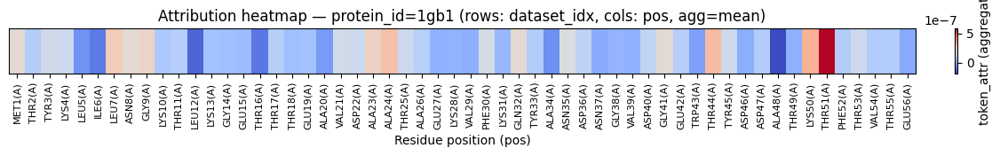

In [ ]:
importance_df = pd.read_csv("/content/drive/MyDrive/Protein/all_residue_shap_by_token_gradient_input.csv")
fig, ax = plot_heatmap_by_protein(importance_df, protein_id="1gb1", agg="mean", figsize=(12,1.5))
plt.show()


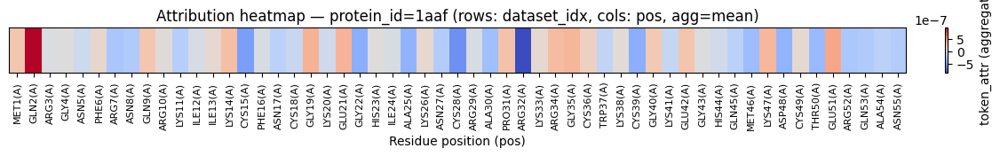

In [ ]:
importance_df = pd.read_csv("/content/drive/MyDrive/Protein/all_residue_shap_by_token_gradient_input.csv")
fig, ax = plot_heatmap_by_protein(importance_df, protein_id="1aaf", agg="mean", figsize=(12,1.5))
plt.show()


In [ ]:
df[df.protein_id=='1a1p'][['Chain','Residue_ID']].drop_duplicates().shape

(13, 2)

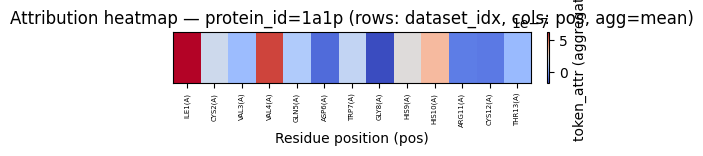

In [ ]:
importance_df = pd.read_csv("/content/drive/MyDrive/Protein/all_residue_shap_by_token_gradient_input.csv")
fig, ax = plot_heatmap_by_protein(importance_df, protein_id="1a1p", agg="mean", figsize=(5,1.5))
plt.show()


## Visualizing Grad * Input

In [ ]:
import py3Dmol
import matplotlib.cm as cm
import matplotlib.colors as mcolors
import py3Dmol
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.colors as mcolors
import warnings

def _parse_pdb_residue_list(pdb_str):
    """
    Returns an ordered list of residues found in the PDB string as dictionaries:
      [{'chain': chain, 'resSeq': resSeq, 'iCode': iCode}, ...]
    This preserves the order residues appear in ATOM/HETATM records so we can map
    sequence index (1-based) -> residue entry.
    """
    residues = []
    seen = set()
    for line in pdb_str.splitlines():
        if line.startswith(("ATOM  ", "HETATM")):
            # standard PDB columns: chain at 21, resSeq at 22:26, iCode at 26
            chain = line[21].strip() or None
            resSeq = line[22:26].strip()
            iCode = line[26].strip() or ''
            key = (chain, resSeq, iCode)
            if key not in seen:
                seen.add(key)
                residues.append({'chain': chain, 'resSeq': resSeq, 'iCode': iCode})
    return residues
import py3Dmol
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.colors as mcolors
import warnings

def _parse_pdb_residue_list(pdb_str):
    residues = []
    seen = set()
    for line in pdb_str.splitlines():
        if line.startswith(("ATOM  ", "HETATM")):
            chain = line[21].strip() or None
            resSeq = line[22:26].strip()
            iCode = line[26].strip() or ''
            key = (chain, resSeq, iCode)
            if key not in seen:
                seen.add(key)
                residues.append({'chain': chain, 'resSeq': resSeq, 'iCode': iCode})
    return residues

def visualize_protein_py3dmol(df, protein_id, pdb_str,
                             scheme="coolwarm", pos_col="pos",
                             attr_col="token_attr", top_k=None,
                             cartoon_style_kwargs=None):
    """
    Robust py3Dmol visualization of per-residue attributions.
    (Fixed: uses ScalarMappable + fig.colorbar instead of matplotlib.colors.ColorbarBase)
    """
    prot_df = df[df["protein_id"] == protein_id].sort_values(pos_col)
    if prot_df.empty:
        available = df["protein_id"].unique().tolist()
        raise ValueError(
            f"No attribution rows found for protein_id='{protein_id}'. "
            f"Available protein_id examples: {available[:10]}..."
        )

    if top_k:
        prot_df = prot_df.head(top_k)

    prot_df = prot_df.copy()
    prot_df[pos_col] = prot_df[pos_col].astype(int)
    values = prot_df[attr_col].tolist()
    positions = prot_df[pos_col].tolist()

    if len(values) == 0:
        raise ValueError(f"No attribution values found in column '{attr_col}' for {protein_id}.")

    residues = _parse_pdb_residue_list(pdb_str)
    if len(residues) == 0:
        raise ValueError("No residues found in provided PDB string (no ATOM/HETATM lines).")

    # guard for constant values
    vmin, vmax = min(values), max(values)
    if vmin == vmax:
        vmin -= 1e-8
        vmax += 1e-8

    norm = mcolors.Normalize(vmin=vmin, vmax=vmax)
    cmap = cm.get_cmap(scheme)
    hex_colors = [mcolors.to_hex(cmap(norm(v))) for v in values]

    view = py3Dmol.view(width=900, height=600)
    view.addModel(pdb_str, "pdb")
    view.setBackgroundColor('white')

    cartoon_style_kwargs = cartoon_style_kwargs or {}

    skipped = []
    applied = 0
    for pos, color in zip(positions, hex_colors):
        idx = pos - 1
        if idx < 0 or idx >= len(residues):
            skipped.append(pos)
            continue
        res = residues[idx]
        selection = {"resi": res['resSeq']}
        if res['chain'] is not None:
            selection["chain"] = res['chain']
        style = {"cartoon": {"color": color}}
        if cartoon_style_kwargs:
            style["cartoon"].update(cartoon_style_kwargs)
        view.setStyle(selection, style)
        applied += 1

    if skipped:
        warnings.warn(
            f"Skipped {len(skipped)} positions because they were out of range for the PDB residue list. "
            f"Skipped positions (examples): {skipped[:10]}"
        )

    view.zoomTo()

    # --- fixed colorbar code: use ScalarMappable + fig.colorbar ---
    sm = cm.ScalarMappable(norm=norm, cmap=cmap)
    sm.set_array(values)   # required for colorbar to work
    fig, ax = plt.subplots(figsize=(6, 0.6))
    # Use fig.colorbar with our ScalarMappable; place it into the small axis
    cbar = fig.colorbar(sm, cax=ax, orientation='horizontal')
    cbar.set_label('Attribution')
    ax.set_title(f"Attribution color scale for {protein_id}", fontsize=9)
    plt.tight_layout()
    plt.show()

    return view


# Example usage (assuming you have a PDB string from your df or from RCSB)
# pdb_str = open("1a03.pdb").read()  # or fetch from RCSB
protein_id='1srl'
for protein_id in ['1srl','1gb1']:
  df_ideal=df[df.protein_id==protein_id].drop(columns=['X_true', 'Y_true', 'Z_true','protein_id'])
  df_first=df[df.protein_id==protein_id].drop(columns=['X_ideal', 'Y_ideal', 'Z_ideal','protein_id'])

  # Example usage
  pdb_str = csv_to_pdb_string(df_first,'pred')
  view=visualize_protein_py3dmol(importance_df_grad_x_input, protein_id=protein_id, pdb_str=pdb_str)

  from IPython.display import HTML

  # Save interactive view as HTML
  with open(f"gradient_{protein_id}.html", "w") as f:
      f.write(view._make_html())
  view.show()
  out_path=f'gradient_{protein_id}.html'
  # Google download the out_path file
  from google.colab import files
  files.download(out_path)

## Heat Map and other graphs of Attention

In [ ]:
# Visualization toolkit for attn_df (uses columns you specified)
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.io as pio
import networkx as nx

# --- config ---
ATTN_MATRICES_PATH = "/content/drive/MyDrive/Protein/attn_saved/val_attn_matrices.npz"  # change if needed
OUT_DIR = "/content/drive/MyDrive/Protein/attn_viz"
os.makedirs(OUT_DIR, exist_ok=True)

# --- helper functions ---
def ensure_attn_df_ok(df):
    expected = {'dataset_idx','pos','attn_given','attn_received','rollout_received','res_label'}
    if not expected.issubset(set(df.columns)):
        missing = expected - set(df.columns)
        raise ValueError(f"attn_df is missing expected columns: {missing}")

def topk_bar(df, metric='rollout_received', topk=30, savepath=None, figsize=(8,10)):
    # aggregate across same residue label (mean)
    agg = df.groupby('res_label')[metric].mean().sort_values(ascending=False).head(topk)
    labels = agg.index[::-1]
    vals = agg.values[::-1]
    plt.figure(figsize=figsize)
    plt.barh(range(len(labels)), vals)
    plt.yticks(range(len(labels)), labels)
    plt.xlabel(metric)
    plt.title(f"Top {topk} residues by {metric}")
    plt.tight_layout()
    if savepath:
        plt.savefig(savepath, dpi=200)
    plt.show()

def scatter_compare(df, x='attn_received', y='rollout_received', top_n_labels=30, save_html=None):
    # scatter (one point per residue label aggregated)
    agg = df.groupby('res_label')[[x,y]].mean().reset_index()
    fig = px.scatter(agg, x=x, y=y, hover_name='res_label', title=f"{y} vs {x} per residue (mean)")
    # annotate top_n_labels by y
    top = agg.sort_values(y, ascending=False).head(top_n_labels)
    for _, r in top.iterrows():
        fig.add_annotation(x=r[x], y=r[y], text=r['res_label'], showarrow=True, arrowhead=1, ax=20, ay=-20)
    fig.update_traces(marker=dict(size=8))
    if save_html:
        pio.write_html(fig, save_html, auto_open=False)
    fig.show()

def load_attn_matrices(npz_path):
    if not os.path.exists(npz_path):
        return None
    data = np.load(npz_path, allow_pickle=True)
    # keys are strings of dataset_idx, values are LxL arrays
    return {int(k): data[k] for k in data.files}

def build_approx_matrix_from_attn_df(df_sample):
    """
    Approximate pairwise attention matrix for a sample from per-token metrics.
    Idea (approx): token i's attention distribution = attn_given_i (we treat as 1.0) distributed
    proportionally to other tokens' attn_received scores. This is only an approximation.
    Returns LxL numpy array where row i sums to 1 across valid tokens.
    """
    # df_sample: rows for single sample sorted by pos
    df_sample = df_sample.sort_values('pos').reset_index(drop=True)
    L = len(df_sample)
    if L == 0:
        return np.zeros((0,0))
    recv = df_sample['attn_received'].to_numpy().astype(float)
    # add small epsilon to avoid all zeros
    if recv.sum() == 0:
        recv = np.ones_like(recv)
    # normalized weights for keys
    key_weights = recv / recv.sum()
    # each query i distributes attention by key_weights (rows identical)
    A = np.tile(key_weights.reshape(1,-1), (L,1))
    # ensure rows sum to 1
    row_sums = A.sum(axis=1, keepdims=True)
    A = A / row_sums
    return A

def plot_heatmap(A, labels, title=None, savepath=None, vmax=None, vmin=None, figsize=(10,8)):
    plt.figure(figsize=figsize)
    im = plt.imshow(A, aspect='auto', interpolation='nearest', vmin=vmin, vmax=vmax)
    plt.colorbar(im, label='attention weight')
    plt.xticks(np.arange(len(labels)), labels, rotation=90, fontsize=8)
    plt.yticks(np.arange(len(labels)), labels, fontsize=8)
    if title:
        plt.title(title)
    plt.tight_layout()
    if savepath:
        plt.savefig(savepath, dpi=200)
    plt.show()

def plot_attn_graph(A, labels, topk_edges=60, figsize=(10,10), savepath=None):
    L = A.shape[0]
    G = nx.DiGraph()
    node_weight = A.sum(axis=0)  # attention received
    for i, lab in enumerate(labels):
        G.add_node(i, label=lab, weight=float(node_weight[i]))
    # add top edges
    flat_idx = np.dstack(np.unravel_index(np.argsort(A.ravel())[::-1], (L, L)))[0]
    added = 0
    for (q, k) in flat_idx:
        if added >= topk_edges:
            break
        w = float(A[int(q), int(k)])
        if w <= 0:
            continue
        G.add_edge(int(q), int(k), weight=w)
        added += 1
    pos = nx.spring_layout(G, seed=42)
    node_sizes = [300 + 3000*(G.nodes[n]['weight'] / (node_weight.max()+1e-9)) for n in G.nodes()]
    edge_widths = [G[u][v]['weight']*5 for u,v in G.edges()]
    plt.figure(figsize=figsize)
    nx.draw_networkx_nodes(G, pos, node_size=node_sizes)
    nx.draw_networkx_edges(G, pos, width=edge_widths, arrowsize=12, arrowstyle='->')
    nx.draw_networkx_labels(G, pos, labels={n: G.nodes[n]['label'] for n in G.nodes()}, font_size=8)
    plt.title("Attention graph (nodes sized by received attention)")
    plt.axis('off')
    if savepath:
        plt.savefig(savepath, dpi=200)
    plt.show()

# --- main routine ---
ensure_attn_df_ok(attn_df)

# 1) Top-K bars
print("Plotting top residues by rollout_received and attn_received...")
topk_bar(attn_df, metric='rollout_received', topk=30, savepath=os.path.join(OUT_DIR,'top30_rollout_received.png'))
topk_bar(attn_df, metric='attn_received', topk=30, savepath=os.path.join(OUT_DIR,'top30_attn_received.png'))

# 2) Scatter compare
print("Plotting interactive scatter: attn_received vs rollout_received (saves HTML)...")
scatter_compare(attn_df, x='attn_received', y='rollout_received', top_n_labels=25, save_html=os.path.join(OUT_DIR,'attn_vs_rollout.html'))

# 3) Choose a sample to visualize pairwise attention
# pick dataset_idx with largest mean rollout_received (most "influential" sample)
ds_group = attn_df.groupby('dataset_idx')['rollout_received'].mean()
best_ds = int(ds_group.idxmax())
print(f"Selected dataset_idx for detailed viz: {best_ds}")

# rows for that sample
sample_rows = attn_df[attn_df['dataset_idx'] == best_ds].sort_values('pos').reset_index(drop=True)
labels = sample_rows['res_label'].fillna('').tolist()

# 4) Load true per-sample matrices if available
matrices = load_attn_matrices(ATTN_MATRICES_PATH)
if matrices is not None and best_ds in matrices:
    print("Found saved attention matrices — using real matrix for heatmap & graph.")
    A = matrices[best_ds]  # expected shape LxL
    # If dimensions don't match, fallback to approximate with warning
    if A.shape[0] != len(labels):
        print("Warning: saved matrix length != number of pos labels. Falling back to approximate matrix.")
        A = build_approx_matrix_from_attn_df(sample_rows)
        note = "APPROXIMATE (saved matrix shape mismatch)"
    else:
        note = "REAL (saved matrices)"
else:
    print("No saved per-sample matrices found — using APPROXIMATE pairwise matrix built from attn_df.")
    A = build_approx_matrix_from_attn_df(sample_rows)
    note = "APPROXIMATE (constructed from per-token metrics)"

# 5) Plot heatmap + graph
title = f"Attention matrix for dataset_idx={best_ds} ({note})"
plot_heatmap(A, labels, title=title, savepath=os.path.join(OUT_DIR, f"heatmap_ds{best_ds}.png"))

# also produce an interactive Plotly heatmap
fig = px.imshow(A, x=labels, y=labels, labels=dict(x="key residue", y="query residue", color="attn"),
                title=title)
fig.update_layout(xaxis_tickangle=90, width=900, height=900)
pio.write_html(fig, os.path.join(OUT_DIR, f"heatmap_ds{best_ds}_interactive.html"), auto_open=False)
fig.show()

# 6) Attention graph (directed)
plot_attn_graph(A, labels, topk_edges=60, savepath=os.path.join(OUT_DIR, f"attn_graph_ds{best_ds}.png"))

# 7) Small table summary: top residues in this sample
top_sample = sample_rows.sort_values('rollout_received', ascending=False).head(30)[['pos','res_label','attn_received','rollout_received']]
print("Top residues in selected sample (by rollout_received):")
display(top_sample)

print(f"Saved outputs to {OUT_DIR}. Note: if you used APPROXIMATE matrix, heatmap/graph are only approximations — to get exact pairwise heatmaps save the encoder attention matrices during model evaluation (I can provide that code).")


In [ ]:
attn_df.protein_id.unique()

In [ ]:
attn_df[attn_df.protein_id=='1bdd'].Chain.unique()

## Targeted heatmaps

In [ ]:
['1gb1', '1srl']

In [ ]:
# --- Select a specific protein ---
target_protein_id = "1gb1"  # <-- put your protein_id here

# get dataset_idx values corresponding to that protein
target_ds = attn_df.loc[attn_df["protein_id"] == target_protein_id, "dataset_idx"].unique()

if len(target_ds) == 0:
    raise ValueError(f"No rows found in attn_df for protein_id={target_protein_id}")

# choose one dataset_idx (if multiple entries for same protein_id)
best_ds = int(target_ds[0])
print(f"Selected protein_id={target_protein_id} (dataset_idx={best_ds})")

# --- restrict to that sample ---
sample_rows = attn_df[attn_df['dataset_idx'] == best_ds].sort_values('pos').reset_index(drop=True)
labels = sample_rows['res_label'].fillna('').tolist()

# --- downstream plots remain the same ---
matrices = load_attn_matrices(ATTN_MATRICES_PATH)
if matrices is not None and best_ds in matrices:
    print("Found saved attention matrices — using real matrix for heatmap & graph.")
    A = matrices[best_ds]
    if A.shape[0] != len(labels):
        print("Warning: saved matrix length != number of pos labels. Falling back to approximate matrix.")
        A = build_approx_matrix_from_attn_df(sample_rows)
        note = "APPROXIMATE (saved matrix shape mismatch)"
    else:
        note = "REAL (saved matrices)"
else:
    print("No saved per-sample matrices found — using APPROXIMATE pairwise matrix built from attn_df.")
    A = build_approx_matrix_from_attn_df(sample_rows)
    note = "APPROXIMATE (constructed from per-token metrics)"



# 1) Top-K bars
print("Plotting top residues by rollout_received and attn_received...")
# topk_bar(attn_df, metric='rollout_received', topk=30, savepath=os.path.join(OUT_DIR,'top30_rollout_received.png'))
# topk_bar(attn_df, metric='attn_received', topk=30, savepath=os.path.join(OUT_DIR,'top30_attn_received.png'))

# Heatmap
plot_heatmap(A, labels,
             title=f"Attention matrix for protein_id={target_protein_id} (ds={best_ds}, {note})",
             savepath=os.path.join(OUT_DIR, f"heatmap_{target_protein_id}.png"))



# also produce an interactive Plotly heatmap
fig = px.imshow(A, x=labels, y=labels, labels=dict(x="key residue", y="query residue", color="attn"),
                title=title)
fig.update_layout(xaxis_tickangle=90, width=900, height=900)
pio.write_html(fig, os.path.join(OUT_DIR, f"heatmap_ds{best_ds}_interactive.html"), auto_open=False)
fig.show()
# Graph
plot_attn_graph(A, labels, topk_edges=60,
                savepath=os.path.join(OUT_DIR, f"attn_graph_{target_protein_id}.png"))

# Top residues table
top_sample = sample_rows.sort_values('rollout_received', ascending=False).head(30)[
    ['pos','res_label','attn_received','rollout_received']
]
print(f"Top residues in protein_id={target_protein_id}:")
display(top_sample)


In [ ]:
import matplotlib.pyplot as plt

# Sort and take top 10 by attn_received
top10 = top_sample.sort_values("attn_received", ascending=False).head(10)

plt.figure(figsize=(8,6))
plt.barh(top10["res_label"], top10["attn_received"], color="red", alpha=0.3,edgecolor='gray',linewidth=1.5)
plt.xlabel("Attention Received")
plt.ylabel("Residue Label")
plt.title(f"Top 10 Residues by Attention Received ({target_protein_id})")
plt.gca().invert_yaxis()  # highest at top
plt.grid(axis="x", alpha=0.3)
plt.savefig(os.path.join(OUT_DIR, f"top10_attn_received_{target_protein_id}.png"), dpi=300)
plt.show()


In [ ]:
os.path.join(OUT_DIR, f"heatmap_{target_protein_id}.png")

In [ ]:
attn_df.res_label

In [ ]:
# --- Select a specific protein ---
target_protein_id = "1aaf"  # <-- put your protein_id here

# get dataset_idx values corresponding to that protein
target_ds = attn_df.loc[attn_df["protein_id"] == target_protein_id, "dataset_idx"].unique()

if len(target_ds) == 0:
    raise ValueError(f"No rows found in attn_df for protein_id={target_protein_id}")

# choose one dataset_idx (if multiple entries for same protein_id)
best_ds = int(target_ds[0])
print(f"Selected protein_id={target_protein_id} (dataset_idx={best_ds})")

# --- restrict to that sample ---
sample_rows = attn_df[attn_df['dataset_idx'] == best_ds].sort_values('pos').reset_index(drop=True)
labels = sample_rows['res_label'].fillna('').tolist()

# --- downstream plots remain the same ---
matrices = load_attn_matrices(ATTN_MATRICES_PATH)
if matrices is not None and best_ds in matrices:
    print("Found saved attention matrices — using real matrix for heatmap & graph.")
    A = matrices[best_ds]
    if A.shape[0] != len(labels):
        print("Warning: saved matrix length != number of pos labels. Falling back to approximate matrix.")
        A = build_approx_matrix_from_attn_df(sample_rows)
        note = "APPROXIMATE (saved matrix shape mismatch)"
    else:
        note = "REAL (saved matrices)"
else:
    print("No saved per-sample matrices found — using APPROXIMATE pairwise matrix built from attn_df.")
    A = build_approx_matrix_from_attn_df(sample_rows)
    note = "APPROXIMATE (constructed from per-token metrics)"

# Heatmap
plot_heatmap(A, labels,
             title=f"Attention matrix for protein_id={target_protein_id} (ds={best_ds}, {note})",
             savepath=os.path.join(OUT_DIR, f"heatmap_{target_protein_id}.png"))



# also produce an interactive Plotly heatmap
fig = px.imshow(A, x=labels, y=labels, labels=dict(x="key residue", y="query residue", color="attn"),
                title=title)
fig.update_layout(xaxis_tickangle=90, width=900, height=900)
pio.write_html(fig, os.path.join(OUT_DIR, f"heatmap_ds{best_ds}_interactive.html"), auto_open=False)
fig.show()
# Graph
# Graph
plot_attn_graph(A, labels, topk_edges=60,
                savepath=os.path.join(OUT_DIR, f"attn_graph_{target_protein_id}.png"))

# Top residues table
top_sample = sample_rows.sort_values('rollout_received', ascending=False).head(30)[
    ['pos','res_label','attn_received','rollout_received']
]
print(f"Top residues in protein_id={target_protein_id}:")
display(top_sample)


In [ ]:
import matplotlib.pyplot as plt

# Sort and take top 10 by attn_received
top10 = top_sample.sort_values("attn_received", ascending=False).head(10)

plt.figure(figsize=(8,6))
plt.barh(top10["res_label"], top10["attn_received"], color="red", alpha=0.3,edgecolor='gray',linewidth=1.5)
plt.xlabel("Attention Received")
plt.ylabel("Residue Label")
plt.title(f"Top 10 Residues by Attention Received ({target_protein_id})")
plt.gca().invert_yaxis()  # highest at top
plt.grid(axis="x", alpha=0.3)
plt.savefig(os.path.join(OUT_DIR, f"top10_attn_received_{target_protein_id}.png"), dpi=300)
plt.show()


In [ ]:
#  Function to shift residue numbers by +8
def shift_resnum(label, shift=8):
    import re
    # Match: residue name (letters), residue number (digits), and chain (inside parentheses)
    match = re.match(r"([A-Z]+)(\d+)\((\w)\)", label)
    if match:
        res, num, chain = match.groups()
        return f"{res}{int(num) + shift}({chain})"
    return label


In [ ]:
# --- Select a specific protein ---
target_protein_id = "1srl"  # <-- put your protein_id here

# get dataset_idx values corresponding to that protein
target_ds = attn_df.loc[attn_df["protein_id"] == target_protein_id, "dataset_idx"].unique()

if len(target_ds) == 0:
    raise ValueError(f"No rows found in attn_df for protein_id={target_protein_id}")

# choose one dataset_idx (if multiple entries for same protein_id)
best_ds = int(target_ds[0])
print(f"Selected protein_id={target_protein_id} (dataset_idx={best_ds})")

# --- restrict to that sample ---
sample_rows = attn_df[attn_df['dataset_idx'] == best_ds].sort_values('pos').reset_index(drop=True)
labels = sample_rows['res_label'].apply(shift_resnum).fillna('').tolist()

# --- downstream plots remain the same ---
matrices = load_attn_matrices(ATTN_MATRICES_PATH)
if matrices is not None and best_ds in matrices:
    print("Found saved attention matrices — using real matrix for heatmap & graph.")
    A = matrices[best_ds]
    if A.shape[0] != len(labels):
        print("Warning: saved matrix length != number of pos labels. Falling back to approximate matrix.")
        A = build_approx_matrix_from_attn_df(sample_rows)
        note = "APPROXIMATE (saved matrix shape mismatch)"
    else:
        note = "REAL (saved matrices)"
else:
    print("No saved per-sample matrices found — using APPROXIMATE pairwise matrix built from attn_df.")
    A = build_approx_matrix_from_attn_df(sample_rows)
    note = "APPROXIMATE (constructed from per-token metrics)"

# Heatmap
plot_heatmap(A, labels,
             title=f"Attention matrix for protein_id={target_protein_id} (ds={best_ds}, {note})",
             savepath=os.path.join(OUT_DIR, f"heatmap_{target_protein_id}.png"))



# also produce an interactive Plotly heatmap
fig = px.imshow(A, x=labels, y=labels, labels=dict(x="key residue", y="query residue", color="attn"),
                title=title)
fig.update_layout(xaxis_tickangle=90, width=900, height=900)
pio.write_html(fig, os.path.join(OUT_DIR, f"heatmap_ds{best_ds}_interactive.html"), auto_open=False)
fig.show()
# Graph
# Graph
plot_attn_graph(A, labels, topk_edges=60,
                savepath=os.path.join(OUT_DIR, f"attn_graph_{target_protein_id}.png"))

# Top residues table
top_sample = sample_rows.sort_values('rollout_received', ascending=False).head(30)[
    ['pos','res_label','attn_received','rollout_received']
]
print(f"Top residues in protein_id={target_protein_id}:")
display(top_sample)


In [ ]:
import matplotlib.pyplot as plt

# Sort and take top 10 by attn_received
top10 = top_sample.sort_values("attn_received", ascending=False).head(10)

plt.figure(figsize=(8,6))
plt.barh(top10["res_label"].apply(shift_resnum), top10["attn_received"], color="red", alpha=0.3,edgecolor='gray',linewidth=1.5)
plt.xlabel("Attention Received")
plt.ylabel("Residue Label")
plt.title(f"Top 10 Residues by Attention Received ({target_protein_id})")
plt.gca().invert_yaxis()  # highest at top
plt.grid(axis="x", alpha=0.3)
plt.savefig(os.path.join(OUT_DIR, f"top10_attn_received_{target_protein_id}.png"), dpi=300)
plt.show()


In [ ]:
OUT_DIR

In [ ]:
top_sample.columns

# Calculating Anchor Regions (location of interest)
### Please researcher understand that by anchor the authors meant the location of interest.

In [ ]:
import os
import pandas as pd
import numpy as np
from tqdm.auto import tqdm

OUT_DIR = "/content/drive/MyDrive/Protein/attn_viz_summary"
os.makedirs(OUT_DIR, exist_ok=True)

def compute_anchor_top_percentages(attn_df,
                                   protein_list=None,
                                   anchor_ranges=None,
                                   auto_window=2,
                                   min_samples_threshold=1,
                                   out_csv=os.path.join(OUT_DIR, "anchor_top_stats.csv")):
    """
    For each protein in protein_list (or all proteins in attn_df if None),
    compute:
      - fraction (%) of samples where the top attn_received residue lies in anchor region
      - fraction (%) of samples where the top rollout_received residue lies in anchor region

    Parameters
    ----------
    attn_df : pd.DataFrame
        must contain columns: ['dataset_idx','pos','attn_given','attn_received','rollout_received',
                               'protein_id','Chain','Residue_ID','Residue_Name','res_label']
        Residue_ID should be integer-like.
    protein_list : list or None
        list of protein_id values to analyze (if None, analyze all proteins in attn_df)
    anchor_ranges : dict or None
        optional mapping {protein_id: (anchor_start, anchor_end)}. If missing for a protein,
        the function will auto-derive an anchor using heuristic described below.
    auto_window : int
        window radius applied around auto-derived pivot residue (default ±2)
    min_samples_threshold : int
        ignore proteins with fewer than this many samples (dataset_idx) if >1. Default 1 (include all).
    out_csv : str
        path to write summary CSV

    Returns
    -------
    summary_df : pd.DataFrame
    """

    # basic checks
    required = {'dataset_idx','attn_received','rollout_received','protein_id','Residue_ID'}
    if not required.issubset(attn_df.columns):
        raise ValueError(f"attn_df missing required columns: {required - set(attn_df.columns)}")

    # ensure Residue_ID ints
    tmp = attn_df.copy()
    tmp['Residue_ID'] = pd.to_numeric(tmp['Residue_ID'], errors='coerce').astype('Int64')

    proteins = sorted(tmp['protein_id'].unique()) if protein_list is None else list(protein_list)

    results = []
    for pid in tqdm(proteins):
        sub = tmp[tmp['protein_id'] == pid]
        if sub.empty:
            # no data for this protein
            results.append({
                'protein_id': pid,
                'n_samples': 0,
                'anchor_start': np.nan,
                'anchor_end': np.nan,
                'anchor_method': 'missing_data',
                'top_attn_in_anchor_count': 0,
                'top_attn_in_anchor_pct': np.nan,
                'top_rollout_in_anchor_count': 0,
                'top_rollout_in_anchor_pct': np.nan
            })
            continue

        ds_list = sub['dataset_idx'].unique()
        n_samples = len(ds_list)
        if n_samples < min_samples_threshold:
            # still process but mark
            pass

        # Determine anchor range:
        if anchor_ranges and pid in anchor_ranges:
            astart, aend = anchor_ranges[pid]
            anchor_method = 'user_provided'
        else:
            # Auto-derive: find residue most frequently top by rollout_received across samples
            top_counts = {}
            for ds in ds_list:
                s = sub[sub['dataset_idx'] == ds]
                if s.empty:
                    continue
                # choose the residue (by Residue_ID) that has max rollout_received; tie-break by attn_received then pos
                idx = s['rollout_received'].idxmax()
                top_resid = s.loc[idx, 'Residue_ID']
                if pd.isna(top_resid):
                    continue
                top_counts[int(top_resid)] = top_counts.get(int(top_resid), 0) + 1
            if len(top_counts) == 0:
                # fallback: use median residue id window
                median_resid = int(np.nanmedian(sub['Residue_ID'].dropna()))
                pivot = median_resid
            else:
                # pick the residue with highest frequency
                pivot = max(top_counts.items(), key=lambda x: (x[1], x[0]))[0]
            astart = int(pivot - auto_window)
            aend = int(pivot + auto_window)
            anchor_method = f'auto_pivot_{pivot}_win{auto_window}'

        # Loop samples and check top residues
        top_attn_in_anchor = 0
        top_rollout_in_anchor = 0
        valid_samples = 0

        for ds in ds_list:
            s = sub[sub['dataset_idx'] == ds]
            if s.empty:
                continue
            # determine top by attn_received and rollout_received
            # handle possible NaNs
            if s['attn_received'].dropna().empty or s['rollout_received'].dropna().empty:
                continue

            idx_attn = s['attn_received'].idxmax()
            idx_roll = s['rollout_received'].idxmax()

            top_attn_res = s.loc[idx_attn, 'Residue_ID']
            top_roll_res = s.loc[idx_roll, 'Residue_ID']

            # If Residue_ID is missing, skip sample
            if pd.isna(top_attn_res) or pd.isna(top_roll_res):
                continue

            valid_samples += 1
            if (astart <= int(top_attn_res) <= aend):
                top_attn_in_anchor += 1
            if (astart <= int(top_roll_res) <= aend):
                top_rollout_in_anchor += 1

        if valid_samples == 0:
            pct_attn = np.nan
            pct_roll = np.nan
        else:
            pct_attn = 100.0 * top_attn_in_anchor / valid_samples
            pct_roll = 100.0 * top_rollout_in_anchor / valid_samples

        results.append({
            'protein_id': pid,
            'n_samples': n_samples,
            'valid_samples': valid_samples,
            'anchor_start': astart,
            'anchor_end': aend,
            'anchor_method': anchor_method,
            'top_attn_in_anchor_count': top_attn_in_anchor,
            'top_attn_in_anchor_pct': pct_attn,
            'top_rollout_in_anchor_count': top_rollout_in_anchor,
            'top_rollout_in_anchor_pct': pct_roll
        })

    summary_df = pd.DataFrame(results).sort_values('protein_id').reset_index(drop=True)
    summary_df.to_csv(out_csv, index=False)
    print(f"Wrote summary CSV to: {out_csv}")
    return summary_df

# Example usage:
# Option A: provide an anchor_ranges dict for proteins you know. e.g.
# anchor_ranges = {'1GO9': (25,30), '2DJA': (40,44), ...}
# summary = compute_anchor_top_percentages(attn_df, protein_list=None, anchor_ranges=anchor_ranges)

# Option B: let function auto-derive anchor ranges (default)
summary = compute_anchor_top_percentages(attn_df,
                                        protein_list=None,   # None => analyze all proteins in attn_df
                                        anchor_ranges=None,
                                        auto_window=2,
                                        min_samples_threshold=1,
                                        out_csv=os.path.join(OUT_DIR, "anchor_top_stats.csv"))

# show the top lines
summary.head(40)


In [ ]:
summary.columns

# Positional Analysis

## Residue Coverage of Anchor Regions

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Load your summary file
csv_path = "/content/drive/MyDrive/Protein/attn_viz_summary/anchor_top_stats.csv"
summary = pd.read_csv(csv_path)

# Extract kink ranges
ranges = summary[["protein_id", "anchor_start", "anchor_end"]].dropna()

# Find global residue ID span
min_pos = int(ranges["anchor_start"].min())
max_pos = int(ranges["anchor_end"].max())

# Create frequency vector
coverage = np.zeros(max_pos + 1)

# Count how many proteins cover each position
for _, row in ranges.iterrows():
    start = int(row["anchor_start"])
    end = int(row["anchor_end"])
    coverage[start:end + 1] += 1

# Plot histogram
plt.figure(figsize=(12,6))
plt.bar(range(len(coverage)), coverage, alpha=0.6, color="steelblue", edgecolor="black")
plt.xlabel("Residue ID")
plt.ylabel("Frequency (# of proteins covering position)")
plt.title("Residue coverage across proteins (Anchor regions)")
plt.grid(alpha=0.3)
plt.savefig(os.path.join(OUT_DIR, "residue_coverage.png"), dpi=300)
plt.show()


In [ ]:
# show proteins where rollout_received top residue is in kink > 60%
summary.sort_values('top_rollout_in_kink_pct', ascending=False).head(20)


## Percentage of Anchor in 16 to 44

In [ ]:
import re
import numpy as np
import pandas as pd

def to_int_resid(x, fallback_label=None):
    """Try to convert Residue_ID-like value to int. If fails, try to parse digits from fallback label."""
    try:
        if pd.isna(x):
            raise ValueError
        # if already int-like
        return int(x)
    except Exception:
        if fallback_label is None or pd.isna(fallback_label):
            return None
        m = re.search(r"(-?\d+)", str(fallback_label))
        return int(m.group(1)) if m else None

# parameters
start, end = 16, 44

# make a safe copy
df = attn_df.copy()

# prefer numeric Residue_ID column; if not integer-like, try to coerce
if 'Residue_ID' in df.columns:
    df['Residue_ID_num'] = pd.to_numeric(df['Residue_ID'], errors='coerce').astype('Int64')
else:
    df['Residue_ID_num'] = pd.Series([pd.NA]*len(df))

# fallback: parse from res_label if Residue_ID missing
df['Residue_ID_num'] = df.apply(
    lambda r: to_int_resid(r['Residue_ID_num'], fallback_label=r.get('res_label', None))
    if pd.isna(r['Residue_ID_num']) else int(r['Residue_ID_num']),
    axis=1
)

protein_ids = sorted(df['protein_id'].dropna().unique())
n_proteins = len(protein_ids)
count_in_range = 0
failed = 0

per_protein_top = []  # store tuples (pid, top_resid)

for pid in tqdm(protein_ids):
    sub = df[df['protein_id'] == pid]
    if sub.empty:
        failed += 1
        continue
    # compute mean attn_received per Residue_ID_num
    valid = sub.dropna(subset=['Residue_ID_num','attn_received'])
    if valid.empty:
        failed += 1
        per_protein_top.append((pid, None))
        continue
    agg = valid.groupby('Residue_ID_num')['attn_received'].mean().reset_index()
    # pick residue id with max mean attn_received (tie-break by smaller residue id)
    agg_sorted = agg.sort_values(['attn_received','Residue_ID_num'], ascending=[False, True])
    top_resid = int(agg_sorted.iloc[0]['Residue_ID_num'])
    per_protein_top.append((pid, top_resid))
    if start <= top_resid <= end:
        count_in_range += 1

pct = 100.0 * count_in_range / n_proteins if n_proteins>0 else np.nan
print(f"Proteins analyzed: {n_proteins}")
print(f"Proteins with aggregate top attn_received residue in [{start},{end}]: {count_in_range} ({pct:.2f}%)")


## Distribution of the top 1 important residue

In [ ]:
import re
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os

OUT_DIR = "/content/drive/MyDrive/Protein/attn_viz_summary"
os.makedirs(OUT_DIR, exist_ok=True)

def parse_residue_id(row):
    """Return integer residue id from Residue_ID if possible, otherwise try to extract from res_label."""
    val = row.get('Residue_ID', None)
    try:
        if pd.isna(val):
            raise ValueError
        return int(val)
    except Exception:
        lab = row.get('res_label', '')
        m = re.search(r"(-?\d+)", str(lab))
        return int(m.group(1)) if m else None

# 1) prepare numeric Residue_ID column
df = attn_df.copy()
if 'Residue_ID' not in df.columns:
    df['Residue_ID'] = pd.NA

df['Residue_ID_num'] = df.apply(parse_residue_id, axis=1)
# drop rows without residue number or without either metric
df = df.dropna(subset=['Residue_ID_num']).copy()
df['Residue_ID_num'] = df['Residue_ID_num'].astype(int)

# 2) For each protein_id, compute top residue by mean attn_received and by mean rollout_received
protein_ids = df['protein_id'].dropna().unique()

top_by_attn = []
top_by_rollout = []

for pid in tqdm(protein_ids):
    sub = df[df['protein_id'] == pid]
    if sub.empty:
        continue

    # Aggregate mean per residue id for the protein
    agg_attn = sub.groupby('Residue_ID_num')['attn_received'].mean().reset_index()
    agg_roll = sub.groupby('Residue_ID_num')['rollout_received'].mean().reset_index()

    if not agg_attn.empty:
        # pick residue id with max mean attn_received, tie-breaker -> smallest residue id
        agg_attn_sorted = agg_attn.sort_values(['attn_received','Residue_ID_num'], ascending=[False, True])
        top_res_attn = int(agg_attn_sorted.iloc[0]['Residue_ID_num'])
        top_by_attn.append(top_res_attn)

    if not agg_roll.empty:
        agg_roll_sorted = agg_roll.sort_values(['rollout_received','Residue_ID_num'], ascending=[False, True])
        top_res_roll = int(agg_roll_sorted.iloc[0]['Residue_ID_num'])
        top_by_rollout.append(top_res_roll)

# 3) Prepare and plot histogram(s)
if len(top_by_attn) == 0 and len(top_by_rollout) == 0:
    raise RuntimeError("No top residues found. Check attn_df contents and residue parsing.")

# bins: integer-centered bins covering the full range
all_positions = np.array(top_by_attn + top_by_rollout)
min_pos = int(all_positions.min())
max_pos = int(all_positions.max())
bins = np.arange(min_pos - 0.5, max_pos + 1.5, 1.0)  # integer bins

plt.figure(figsize=(11,6))
alpha = 0.35  # low opacity

# histogram for attn_received tops
if len(top_by_attn) > 0:
    plt.hist(top_by_attn, bins=bins, alpha=alpha, label=f"Top by mean attn_received (n={len(top_by_attn)})", edgecolor='black')

# histogram for rollout_received tops
if len(top_by_rollout) > 0:
    plt.hist(top_by_rollout, bins=bins, alpha=alpha, label=f"Top by mean rollout_received (n={len(top_by_rollout)})", edgecolor='black')

plt.xlabel("Residue position (Residue_ID)")
plt.ylabel("Number of proteins (top position)")
plt.title("Histogram of positions where top (#1) residue falls per protein\n(attenuation alpha = {:.2f})".format(alpha))
plt.legend()
plt.grid(axis='y', alpha=0.25)
plt.tight_layout()

png_out = os.path.join(OUT_DIR, "top_position_histogram_attn_vs_rollout.png")
plt.savefig(png_out, dpi=200)
plt.show()

print(f"Saved histogram to: {png_out}")


## Distribution of Importance across Normalized Position

---



In [ ]:
import os
import re
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from collections import defaultdict
from math import sqrt
from tqdm.auto import tqdm
# === Config ===
OUT_DIR = "/content/drive/MyDrive/Protein/attn_viz_normalized"
os.makedirs(OUT_DIR, exist_ok=True)
NBINS = 100                    # number of normalized-position bins (0..1)
MIN_SAMPLES_PER_PROTEIN = 1    # require at least this many samples to include protein
MIN_POSITIONS_PER_SAMPLE = 2   # if sample has <2 valid positions we map to center (0.5)
CSV_OUT = os.path.join(OUT_DIR, f"avg_importance_normalized_{NBINS}bins.csv")

# === helper to parse residue id & detect padding ===
def parse_resnum_from_row(row):
    # Prefer Residue_ID if numeric; otherwise try to extract number from res_label
    val = row.get('Residue_ID', None)
    try:
        if pd.isna(val):
            raise ValueError
        return int(val)
    except Exception:
        lab = row.get('res_label', '')
        if lab is None:
            return None
        # treat common pad labels as padding
        if str(lab).strip().upper() in {'PAD', '<PAD>', '-', ''}:
            return None
        m = re.search(r"(-?\d+)", str(lab))
        return int(m.group(1)) if m else None

# === prepare dataframe and filter padded rows ===
df = attn_df.copy()

# ensure numeric importance columns
df['attn_received'] = pd.to_numeric(df['attn_received'], errors='coerce')
df['rollout_received'] = pd.to_numeric(df['rollout_received'], errors='coerce')

# get numeric residue id or None (padding)
df['Residue_ID_num'] = df.apply(parse_resnum_from_row, axis=1)

# define valid row: has residue number and at least one metric non-null
valid_mask = (~df['Residue_ID_num'].isna()) & (~df['attn_received'].isna() | ~df['rollout_received'].isna())
df_valid = df[valid_mask].copy()

print(f"Total rows: {len(df)}, Valid (non-pad) rows: {len(df_valid)}")

# === Build per-sample (dataset_idx) normalized-position arrays ===
# bins edges and centers for normalized axis
bin_edges = np.linspace(0.0, 1.0, NBINS + 1)
bin_centers = 0.5 * (bin_edges[:-1] + bin_edges[1:])

# data structure: for each protein -> list of per-sample bin arrays (length NBINS)
protein_attn_bin_list = defaultdict(list)
protein_roll_bin_list = defaultdict(list)

protein_sample_counts = defaultdict(int)

protein_ids = sorted(df_valid['protein_id'].unique())

for pid in tqdm(protein_ids):
    sub_pid = df_valid[df_valid['protein_id'] == pid]
    ds_list = np.unique(sub_pid['dataset_idx'].values)
    for ds in ds_list:
        s = sub_pid[sub_pid['dataset_idx'] == ds].sort_values('pos').reset_index(drop=True)
        # filter again in case pos includes padded rows
        if s.empty:
            continue
        L = len(s)
        # normalized positions per token in sample
        if L >= MIN_POSITIONS_PER_SAMPLE:
            norm_pos = np.arange(L) / float(L - 1)
        else:
            # map single-position samples to center 0.5
            norm_pos = np.array([0.5] * L)

        attn_arr = s['attn_received'].to_numpy(dtype=float)
        roll_arr = s['rollout_received'].to_numpy(dtype=float)
        attn_arr = attn_arr / np.nansum(attn_arr) if np.nansum(attn_arr) > 0 else attn_arr
        roll_arr = roll_arr / np.nansum(roll_arr) if np.nansum(roll_arr) > 0 else roll_arr

        # initialize per-bin arrays with NaN
        attn_bins = np.full(NBINS, np.nan, dtype=float)
        roll_bins = np.full(NBINS, np.nan, dtype=float)

        # assign each position to a bin
        # indices: 0..NBINS-1
        bin_idx = np.digitize(norm_pos, bin_edges) - 1
        bin_idx = np.clip(bin_idx, 0, NBINS-1)

        # compute mean per bin for this sample (skip NaNs)
        for b in range(NBINS):
            mask = (bin_idx == b)
            if not np.any(mask):
                continue
            avals = attn_arr[mask]
            rvals = roll_arr[mask]
            # compute means ignoring NaNs; if all NaN remain NaN
            a_mean = np.nanmean(avals) if np.any(~np.isnan(avals)) else np.nan
            r_mean = np.nanmean(rvals) if np.any(~np.isnan(rvals)) else np.nan
            attn_bins[b] = a_mean
            roll_bins[b] = r_mean

        # store per-sample binned means for this protein
        protein_attn_bin_list[pid].append(attn_bins)
        protein_roll_bin_list[pid].append(roll_bins)
        protein_sample_counts[pid] += 1

# === For each protein, compute per-protein average across its samples (equal weight per sample) ===
protein_attn_avg = {}
protein_roll_avg = {}
valid_protein_ids = []

for pid in protein_ids:
    samples_attn = protein_attn_bin_list.get(pid, [])
    samples_roll = protein_roll_bin_list.get(pid, [])
    n_samples = len(samples_attn)
    if n_samples < MIN_SAMPLES_PER_PROTEIN:
        continue
    # stack and compute mean across samples while ignoring NaNs
    S_attn = np.stack(samples_attn, axis=0) if n_samples>0 else np.empty((0,NBINS))
    S_roll = np.stack(samples_roll, axis=0) if n_samples>0 else np.empty((0,NBINS))
    # mean across axis=0, ignoring NaNs
    attn_mean_per_bin = np.nanmean(S_attn, axis=0) if S_attn.size>0 else np.full(NBINS, np.nan)
    roll_mean_per_bin = np.nanmean(S_roll, axis=0) if S_roll.size>0 else np.full(NBINS, np.nan)
    protein_attn_avg[pid] = attn_mean_per_bin
    protein_roll_avg[pid] = roll_mean_per_bin
    valid_protein_ids.append(pid)

print(f"Proteins with >={MIN_SAMPLES_PER_PROTEIN} samples and data: {len(valid_protein_ids)}")

# === Now aggregate across proteins, weighting each protein equally ===
P = len(valid_protein_ids)
attn_matrix = np.stack([protein_attn_avg[pid] for pid in valid_protein_ids], axis=0)  # shape P x NBINS
roll_matrix = np.stack([protein_roll_avg[pid] for pid in valid_protein_ids], axis=0)

# compute mean across proteins, ignoring NaNs (so proteins missing a bin don't bias)
mean_attn_per_bin = np.nanmean(attn_matrix, axis=0)
mean_roll_per_bin = np.nanmean(roll_matrix, axis=0)

# compute SEM across proteins: std / sqrt(n_non_nan_per_bin)
def sem_across_rows(mat):
    # mat shape: P x NBINS
    n_nonan = np.sum(~np.isnan(mat), axis=0)
    std = np.nanstd(mat, axis=0, ddof=1)  # ddof=1 for sample std when possible
    sem = np.where(n_nonan>0, std / np.sqrt(n_nonan), np.nan)
    return sem, n_nonan

sem_attn_per_bin, count_attn_nonan = sem_across_rows(attn_matrix)
sem_roll_per_bin, count_roll_nonan = sem_across_rows(roll_matrix)

# === Save CSV of aggregated results (bin_center, mean, sem, n_proteins_contributing) ===
out_df = pd.DataFrame({
    'bin_center': bin_centers,
    'mean_attn': mean_attn_per_bin,
    'sem_attn': sem_attn_per_bin,
    'n_proteins_attn': count_attn_nonan,
    'mean_rollout': mean_roll_per_bin,
    'sem_rollout': sem_roll_per_bin,
    'n_proteins_rollout': count_roll_nonan
})
out_df.to_csv(CSV_OUT, index=False)
print(f"Wrote aggregated normalized-position CSV to: {CSV_OUT}")

# === Plot mean ± SEM as function of normalized position ===
plt.figure(figsize=(10,6))
alpha = 0.25

# attn
plt.plot(bin_centers, out_df['mean_attn'], label='mean attn_received', linewidth=2)
plt.fill_between(bin_centers,
                 out_df['mean_attn'] - out_df['sem_attn'],
                 out_df['mean_attn'] + out_df['sem_attn'],
                 alpha=alpha)

# rollout
plt.plot(bin_centers, out_df['mean_rollout'], label='mean rollout_received', linewidth=2)
plt.fill_between(bin_centers,
                 out_df['mean_rollout'] - out_df['sem_rollout'],
                 out_df['mean_rollout'] + out_df['sem_rollout'],
                 alpha=alpha)

plt.xlabel('Normalized position (0 = N-term, 1 = C-term)')
plt.ylabel('Average importance (protein-weighted mean)')
plt.title(f'Average importance vs normalized position (NBINS={NBINS}; proteins={P})')
plt.legend()
plt.grid(alpha=0.2)
plt.tight_layout()

png_out = os.path.join(OUT_DIR, f"avg_importance_normalized_{NBINS}bins.png")
plt.savefig(png_out, dpi=200)
plt.show()
print(f"Saved plot to: {png_out}")

# === Quick diagnostics: where are peaks? ===
# find top bins
top_attn_idx = np.nanargmax(out_df['mean_attn'].values)
top_roll_idx = np.nanargmax(out_df['mean_rollout'].values)
print("Peak (attn) at normalized pos ~ {:.3f} (bin center), mean={:.4f}, proteins contributing={}".format(
    out_df.loc[top_attn_idx,'bin_center'], out_df.loc[top_attn_idx,'mean_attn'], int(out_df.loc[top_attn_idx,'n_proteins_attn'])))
print("Peak (roll) at normalized pos ~ {:.3f} (bin center), mean={:.4f}, proteins contributing={}".format(
    out_df.loc[top_roll_idx,'bin_center'], out_df.loc[top_roll_idx,'mean_rollout'], int(out_df.loc[top_roll_idx,'n_proteins_rollout'])))

# done


## Distribution of Importance across Raw Position

In [ ]:
import os
import re
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from collections import defaultdict
from math import sqrt
from tqdm.auto import tqdm

# === Config ===
OUT_DIR = "/content/drive/MyDrive/Protein/attn_viz_raw"
os.makedirs(OUT_DIR, exist_ok=True)

MIN_SAMPLES_PER_PROTEIN = 1    # require at least this many samples to include protein
CSV_OUT = os.path.join(OUT_DIR, f"avg_importance_raw_positions.csv")

# === helper to parse residue id & detect padding ===
def parse_resnum_from_row(row):
    val = row.get('Residue_ID', None)
    try:
        if pd.isna(val):
            raise ValueError
        return int(val)
    except Exception:
        lab = row.get('res_label', '')
        if lab is None:
            return None
        # treat common pad labels as padding
        if str(lab).strip().upper() in {'PAD', '<PAD>', '-', ''}:
            return None
        m = re.search(r"(-?\d+)", str(lab))
        return int(m.group(1)) if m else None

# === prepare dataframe and filter padded rows ===
df = attn_df.copy()

# ensure numeric importance columns
df['attn_received'] = pd.to_numeric(df['attn_received'], errors='coerce')
df['rollout_received'] = pd.to_numeric(df['rollout_received'], errors='coerce')

# get numeric residue id or None (padding)
df['Residue_ID_num'] = df.apply(parse_resnum_from_row, axis=1)

# define valid row: has residue number and at least one metric non-null
valid_mask = (~df['Residue_ID_num'].isna()) & (~df['attn_received'].isna() | ~df['rollout_received'].isna())
df_valid = df[valid_mask].copy()

print(f"Total rows: {len(df)}, Valid (non-pad) rows: {len(df_valid)}")

# === Build per-sample dictionaries keyed by raw residue ID ===
protein_attn_list = defaultdict(list)
protein_roll_list = defaultdict(list)
protein_sample_counts = defaultdict(int)

protein_ids = sorted(df_valid['protein_id'].unique())

for pid in tqdm(protein_ids):
    sub_pid = df_valid[df_valid['protein_id'] == pid]
    ds_list = np.unique(sub_pid['dataset_idx'].values)
    for ds in ds_list:
        s = sub_pid[sub_pid['dataset_idx'] == ds].sort_values('Residue_ID_num').reset_index(drop=True)
        if s.empty:
            continue

        res_ids = s['Residue_ID_num'].to_numpy(dtype=int)

        attn_arr = s['attn_received'].to_numpy(dtype=float)
        roll_arr = s['rollout_received'].to_numpy(dtype=float)

        # normalize within sample
        attn_arr = attn_arr / np.nansum(attn_arr) if np.nansum(attn_arr) > 0 else attn_arr
        roll_arr = roll_arr / np.nansum(roll_arr) if np.nansum(roll_arr) > 0 else roll_arr

        attn_dict = {rid: val for rid, val in zip(res_ids, attn_arr)}
        roll_dict = {rid: val for rid, val in zip(res_ids, roll_arr)}

        protein_attn_list[pid].append(attn_dict)
        protein_roll_list[pid].append(roll_dict)
        protein_sample_counts[pid] += 1

# === For each protein, compute per-protein average across its samples ===
protein_attn_avg = {}
protein_roll_avg = {}
valid_protein_ids = []

for pid in protein_ids:
    samples_attn = protein_attn_list.get(pid, [])
    samples_roll = protein_roll_list.get(pid, [])
    n_samples = len(samples_attn)
    if n_samples < MIN_SAMPLES_PER_PROTEIN:
        continue

    # collect union of residue IDs for this protein
    all_res_ids = sorted(set().union(*[s.keys() for s in samples_attn]))
    attn_mat = np.full((n_samples, len(all_res_ids)), np.nan)
    roll_mat = np.full((n_samples, len(all_res_ids)), np.nan)

    for i, (adict, rdict) in enumerate(zip(samples_attn, samples_roll)):
        for j, rid in enumerate(all_res_ids):
            attn_mat[i, j] = adict.get(rid, np.nan)
            roll_mat[i, j] = rdict.get(rid, np.nan)

    attn_mean = np.nanmean(attn_mat, axis=0)
    roll_mean = np.nanmean(roll_mat, axis=0)

    protein_attn_avg[pid] = pd.Series(attn_mean, index=all_res_ids)
    protein_roll_avg[pid] = pd.Series(roll_mean, index=all_res_ids)
    valid_protein_ids.append(pid)

print(f"Proteins with >={MIN_SAMPLES_PER_PROTEIN} samples and data: {len(valid_protein_ids)}")

# === Aggregate across proteins ===
# union of all residue IDs across all proteins
global_res_ids = sorted(set().union(*[s.index for s in protein_attn_avg.values()]))

attn_matrix = np.full((len(valid_protein_ids), len(global_res_ids)), np.nan)
roll_matrix = np.full((len(valid_protein_ids), len(global_res_ids)), np.nan)

for i, pid in enumerate(valid_protein_ids):
    attn_series = protein_attn_avg[pid].reindex(global_res_ids)
    roll_series = protein_roll_avg[pid].reindex(global_res_ids)
    attn_matrix[i, :] = attn_series.values
    roll_matrix[i, :] = roll_series.values

# mean & SEM across proteins
mean_attn_per_res = np.nanmean(attn_matrix, axis=0)
mean_roll_per_res = np.nanmean(roll_matrix, axis=0)

def sem_across_rows(mat):
    n_nonan = np.sum(~np.isnan(mat), axis=0)
    std = np.nanstd(mat, axis=0, ddof=1)
    sem = np.where(n_nonan > 0, std / np.sqrt(n_nonan), np.nan)
    return sem, n_nonan

sem_attn_per_res, count_attn_nonan = sem_across_rows(attn_matrix)
sem_roll_per_res, count_roll_nonan = sem_across_rows(roll_matrix)

# === Save CSV ===
out_df = pd.DataFrame({
    'Residue_ID': global_res_ids,
    'mean_attn': mean_attn_per_res,
    'sem_attn': sem_attn_per_res,
    'n_proteins_attn': count_attn_nonan,
    'mean_rollout': mean_roll_per_res,
    'sem_rollout': sem_roll_per_res,
    'n_proteins_rollout': count_roll_nonan
})
out_df.to_csv(CSV_OUT, index=False)
print(f"Wrote aggregated raw-position CSV to: {CSV_OUT}")

# === Plot mean ± SEM as function of residue ID ===
plt.figure(figsize=(12,6))
alpha = 0.25

plt.plot(global_res_ids, out_df['mean_attn'], label='mean attn_received', linewidth=2)
plt.fill_between(global_res_ids,
                 out_df['mean_attn'] - out_df['sem_attn'],
                 out_df['mean_attn'] + out_df['sem_attn'],
                 alpha=alpha)

plt.plot(global_res_ids, out_df['mean_rollout'], label='mean rollout_received', linewidth=2)
plt.fill_between(global_res_ids,
                 out_df['mean_rollout'] - out_df['sem_rollout'],
                 out_df['mean_rollout'] + out_df['sem_rollout'],
                 alpha=alpha)

plt.xlabel('Residue ID')
plt.ylabel('Average importance (protein-weighted mean)')
plt.title(f'Average importance vs raw residue ID (proteins={len(valid_protein_ids)})')
plt.legend()
plt.grid(alpha=0.2)
plt.tight_layout()

png_out = os.path.join(OUT_DIR, f"avg_importance_raw_positions.png")
plt.savefig(png_out, dpi=200)
plt.show()
print(f"Saved plot to: {png_out}")

# === Peak diagnostics ===
top_attn_idx = np.nanargmax(out_df['mean_attn'].values)
top_roll_idx = np.nanargmax(out_df['mean_rollout'].values)
print("Peak (attn) at Residue_ID {} mean={:.4f}, proteins contributing={}".format(
    out_df.loc[top_attn_idx,'Residue_ID'], out_df.loc[top_attn_idx,'mean_attn'], int(out_df.loc[top_attn_idx,'n_proteins_attn'])))
print("Peak (roll) at Residue_ID {} mean={:.4f}, proteins contributing={}".format(
    out_df.loc[top_roll_idx,'Residue_ID'], out_df.loc[top_roll_idx,'mean_rollout'], int(out_df.loc[top_roll_idx,'n_proteins_rollout'])))


In [ ]:
import os
import re
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy import stats

# === config ===
OUT_DIR = "/content/drive/MyDrive/Protein/attn_viz_summary"
os.makedirs(OUT_DIR, exist_ok=True)
csv_out = os.path.join(OUT_DIR, "avg_importance_by_position.csv")
min_count = 5   # only plot positions seen at least this many times (adjust as desired)

# === helper to parse residue id ===
def parse_resnum(row):
    val = row.get('Residue_ID', None)
    try:
        if pd.isna(val):
            raise ValueError
        return int(val)
    except Exception:
        lab = row.get('res_label', '')
        m = re.search(r"(-?\d+)", str(lab))
        return int(m.group(1)) if m else None

# === prepare dataframe with numeric Residue_ID_num ===
df = attn_df.copy()
if 'Residue_ID' not in df.columns:
    df['Residue_ID'] = pd.NA

df['Residue_ID_num'] = df.apply(parse_resnum, axis=1)
df = df.dropna(subset=['Residue_ID_num']).copy()
df['Residue_ID_num'] = df['Residue_ID_num'].astype(int)

# ensure numeric importance columns
df['attn_received'] = pd.to_numeric(df['attn_received'], errors='coerce')
df['rollout_received'] = pd.to_numeric(df['rollout_received'], errors='coerce')

# === group by Residue_ID_num and compute stats ===
grouped = df.groupby('Residue_ID_num').agg(
    attn_mean = ('attn_received', 'mean'),
    attn_std  = ('attn_received', 'std'),
    attn_count= ('attn_received', 'count'),
    roll_mean = ('rollout_received', 'mean'),
    roll_std  = ('rollout_received', 'std'),
    roll_count= ('rollout_received', 'count'),
).reset_index().rename(columns={'Residue_ID_num':'Residue_ID'})

# compute SEM (std / sqrt(n)) where n>0
grouped['attn_sem'] = grouped['attn_std'] / np.sqrt(grouped['attn_count'].replace(0, np.nan))
grouped['roll_sem'] = grouped['roll_std'] / np.sqrt(grouped['roll_count'].replace(0, np.nan))

# write CSV
grouped.to_csv(csv_out, index=False)
print(f"Wrote summary CSV to: {csv_out}")

# === plotting ===
# filter positions with sufficient samples
plot_df = grouped[(grouped['attn_count'] >= min_count) | (grouped['roll_count'] >= min_count)].copy()
if plot_df.empty:
    print("No positions pass the min_count threshold. Lower min_count or inspect grouped head:")
    print(grouped.head(20))
else:
    x = plot_df['Residue_ID'].values
    attn_mean = plot_df['attn_mean'].values
    attn_sem = plot_df['attn_sem'].values
    roll_mean = plot_df['roll_mean'].values
    roll_sem = plot_df['roll_sem'].values

    plt.figure(figsize=(14,6))
    # attn_received mean + sem band
    plt.plot(x, attn_mean, label='mean attn_received', linewidth=2)
    plt.fill_between(x, attn_mean - attn_sem, attn_mean + attn_sem, alpha=0.25)

    # rollout_received mean + sem band
    plt.plot(x, roll_mean, label='mean rollout_received', linewidth=2)
    plt.fill_between(x, roll_mean - roll_sem, roll_mean + roll_sem, alpha=0.25)

    plt.xlabel("Residue position (Residue_ID)")
    plt.ylabel("Average importance (mean)")
    plt.title(f"Average importance per residue position (positions with >= {min_count} observations shown)")
    plt.legend()
    plt.grid(alpha=0.25)
    plt.tight_layout()

    png_out = os.path.join(OUT_DIR, "avg_importance_by_position_plot.png")
    plt.savefig(png_out, dpi=200)
    plt.show()
    print(f"Saved plot to: {png_out}")

# === quick notes printed for interpretation ===
print("\nQuick stats:")
print(f"Positions covered: {grouped['Residue_ID'].min()} to {grouped['Residue_ID'].max()}")
print(f"Number of distinct positions: {len(grouped)}")
print("Top 10 positions by mean attn_received:")
print(grouped.sort_values('attn_mean', ascending=False).head(10)[['Residue_ID','attn_mean','attn_count']].to_string(index=False))
print("\nTop 10 positions by mean rollout_received:")
print(grouped.sort_values('roll_mean', ascending=False).head(10)[['Residue_ID','roll_mean','roll_count']].to_string(index=False))


# Comparison

## AlphaFold PAE calculating function
#### This assumes the pae are already created

In [ ]:
import json
import numpy as np
import pandas as pd
from tqdm.auto import tqdm
from pathlib import Path



def parse_pae_file(fpath: Path):
    """Extract protein_id, chain, and avg_pae from a PAE JSON file."""
    base = fpath.stem.replace("_predicted_aligned_error_v1", "")
    parts = base.split("_")

    protein_id = parts[0]
    chain = parts[1] if len(parts) > 1 else "NA"

    with fpath.open("r") as f:
        data = json.load(f)

    pae_matrix = data.get("predicted_aligned_error") or data.get("pae", [])
    avg_pae = float(np.mean(pae_matrix)) if pae_matrix else np.nan

    return {
        "protein_id": protein_id,
        "chain": chain,
        "avg_pae": avg_pae,
    }

# Collect results
print("Starting...")


if CALCULATE_ALPHAFOLD:
  # Path to your AlphaFold PAE JSON files
  PAE_DIR = Path("/content/drive/MyDrive/Protein/AlphaFold_defaults_complete")
  json_files = list(PAE_DIR.glob("*_predicted_aligned_error_v1.json"))
  results = [parse_pae_file(fpath) for fpath in tqdm(json_files)]

  # Convert to DataFrame
  alphafold_pae_df = pd.DataFrame(results)
  print(alphafold_pae_df.head())

  # Save to CSV
  out_csv = PAE_DIR / "average_pae_per_protein.csv"
  alphafold_pae_df.to_csv(out_csv, index=False)
  print(f"Saved results to {out_csv}")


In [ ]:
PAE_DIR

## PAE calculation

In [ ]:
# Colab-ready observed-PAE calculation (AlphaFold-style)
import os
import numpy as np
import pandas as pd
from math import sqrt
from tqdm.auto import tqdm

# === Config ===
OUT_DIR = "/content/drive/MyDrive/Protein/PAE_observed"
os.makedirs(OUT_DIR, exist_ok=True)

# whether to cap PAE values at AlphaFold's display cap (31.75 Å)
CAP_PAE = True
MAX_PAE_CAP = 31.75

# atoms used to define a residue frame
BACKBONE_ATOMS = ["N", "CA", "C"]
CA_ATOM = "CA"

# Expect df with columns:
# ['protein_id','Chain','Residue_ID','Atom_Name',
#  'X_shifted','Y_shifted','Z_shifted', 'X_pred','Y_pred','Z_pred']

def kabsch_umeyama(A, B):
    """
    Compute rotation R and translation t that minimizes ||R A + t - B||_F
    using the Kabsch algorithm (no scaling).
    A,B: (N,3) arrays (N>=1). Returns R (3x3), t (3,)
    """
    # center
    centroid_A = A.mean(axis=0)
    centroid_B = B.mean(axis=0)
    AA = A - centroid_A
    BB = B - centroid_B

    # covariance
    H = AA.T @ BB
    U, S, Vt = np.linalg.svd(H)
    R = Vt.T @ U.T
    # correct possible reflection
    if np.linalg.det(R) < 0:
        Vt[-1,:] *= -1
        R = Vt.T @ U.T
    t = centroid_B - R @ centroid_A
    return R, t

def compute_observed_pae_for_chain(group):
    """
    group: DataFrame for a single protein+chain containing atoms of residues.
    Returns: residue_ids (sorted), pae_matrix (L x L) where pae[i,j] is distance
             at residue i after aligning on residue j (units = same as coords).
    """
    # Build index by residue -> atom coords for true and pred
    # We need backbone coords (N,CA,C) for frame building, and CA coords for residues
    residues = sorted(group['Residue_ID'].unique())
    # map residue -> dict(atom -> coords)
    true_atoms = {}
    pred_atoms = {}
    ca_true = {}
    ca_pred = {}

    for rid, sub in group.groupby('Residue_ID'):
        atoms = {r['Atom_Name']: np.array([r['X_shifted'], r['Y_shifted'], r['Z_shifted']])
                 for _, r in sub.iterrows()}
        atoms_pred = {r['Atom_Name']: np.array([r['X_pred'], r['Y_pred'], r['Z_pred']])
                      for _, r in sub.iterrows()}

        true_atoms[rid] = atoms
        pred_atoms[rid] = atoms_pred

        if CA_ATOM in atoms:
            ca_true[rid] = atoms[CA_ATOM]
        if CA_ATOM in atoms_pred:
            ca_pred[rid] = atoms_pred[CA_ATOM]

    # We will only include residues that have CA in both true & pred for computing distances i
    common_res_for_ca = [r for r in residues if (r in ca_true and r in ca_pred)]
    if len(common_res_for_ca) == 0:
        return [], np.array([[]])  # nothing to do

    # create arrays of CA coords ordered by common_res_for_ca
    res_ids = common_res_for_ca
    L = len(res_ids)
    true_ca_arr = np.stack([ca_true[r] for r in res_ids], axis=0)   # (L,3)
    pred_ca_arr = np.stack([ca_pred[r] for r in res_ids], axis=0)   # (L,3)

    # prepare pae matrix
    pae = np.full((L, L), np.nan, dtype=float)

    # for each aligned residue j, build its backbone frame if possible, compute R,t, transform all pred CA and compute distances
    for j_idx, j_res in enumerate(res_ids):
        # need backbone atoms present in both pred and true for residue j
        true_bb = true_atoms.get(j_res, {})
        pred_bb = pred_atoms.get(j_res, {})

        if all(a in true_bb for a in BACKBONE_ATOMS) and all(a in pred_bb for a in BACKBONE_ATOMS):
            A = np.stack([pred_bb[a] for a in BACKBONE_ATOMS], axis=0)  # (3,3)
            B = np.stack([true_bb[a] for a in BACKBONE_ATOMS], axis=0)  # (3,3)
            try:
                R, t = kabsch_umeyama(A, B)
            except Exception as e:
                # fallback: skip this j if Kabsch fails
                continue

            # transform all predicted CA coords and compute distances to true CA
            pred_ca_trans = (R @ pred_ca_arr.T).T + t  # (L,3)
            dists = np.linalg.norm(pred_ca_trans - true_ca_arr, axis=1)  # (L,)
            pae[:, j_idx] = dists
        else:
            # cannot compute alignment on residue j (missing backbone) -> remain NaN
            continue

    # optional cap to AFDB style
    if CAP_PAE:
        pae = np.minimum(pae, MAX_PAE_CAP)

    return res_ids, pae

# === main loop: group by protein_id & Chain ===
def compute_pae_per_chain(df):
    summary_rows = []
    saved_matrices = []
    for (protein, chain), group in tqdm(df.groupby(['protein_id', 'Chain']), desc="Chains"):
        res_ids, pae_mat = compute_observed_pae_for_chain(group)
        if len(res_ids) == 0:
            # no usable residues
            summary_rows.append({
                'protein_id': protein,
                'chain': chain,
                'n_residues': 0,
                'mean_pae_all_pairs': np.nan,
                'mean_pae_nonan': np.nan
            })
            continue

        # mean pae across all i,j (including NaNs -> ignore)
        mean_all = np.nanmean(pae_mat)  # ignores NaNs
        # mean across non-NaN entries only
        mean_nonan = mean_all

        # Save matrix as CSV (rows & cols labeled by Residue_ID)
        mat_df = pd.DataFrame(pae_mat, index=res_ids, columns=res_ids)
        mat_fname = f"PAE_{protein}_{chain}.csv"
        mat_path = os.path.join(OUT_DIR, mat_fname)
        mat_df.to_csv(mat_path)
        saved_matrices.append(mat_path)

        summary_rows.append({
            'protein_id': protein,
            'chain': chain,
            'n_residues': len(res_ids),
            'mean_pae_all_pairs': mean_all,
            'mean_pae_nonan': mean_nonan,
            'pae_matrix_csv': mat_path
        })

    summary_df = pd.DataFrame(summary_rows)
    return summary_df, saved_matrices



In [ ]:
OUT_DIR = "/content/drive/MyDrive/Protein/PAE_observed"
if not os.path.exists(os.path.join(OUT_DIR, "pae_summary_per_chain.csv")) :
  our_protein_pae_summary_df, mats = compute_pae_per_chain(df[df.protein_id.isin(test_protein)])
  our_protein_pae_summary_df.to_csv(os.path.join(OUT_DIR, "pae_summary_per_chain.csv"), index=False)
else:
  our_protein_pae_summary_df = pd.read_csv(os.path.join(OUT_DIR, "pae_summary_per_chain.csv"))

In [ ]:
our_protein_pae_summary_df.describe()

In [ ]:
our_protein_pae_summary_df['avg_pae']=our_protein_pae_summary_df.mean_pae_nonan

## Comparing

### It is assumed that these are created

In [ ]:
alphafold_pae_df_single_model_no_recycle_single_sequence=pd.read_csv("/content/drive/MyDrive/Protein/AlphaFold/average_pae_per_protein.csv")
alphafold_pae_df_single_model_3_recycle_200_relaxation_mmseq2_=pd.read_csv("/content/drive/MyDrive/Protein/AlphaFold_defaults/average_pae_per_protein.csv")
alphafold_pae_df_5_model_3_recycle_200_relaxation_mmseq2=pd.read_csv("/content/drive/MyDrive/Protein/AlphaFold_defaults_complete/average_pae_per_protein.csv")

In [ ]:
our_protein_pae_summary_df.avg_pae.describe()

In [ ]:
alphafold_pae_df_single_model_no_recycle_single_sequence.describe()

In [ ]:
alphafold_pae_df_single_model_3_recycle_200_relaxation_mmseq2_.describe()

In [ ]:
alphafold_pae_df_5_model_3_recycle_200_relaxation_mmseq2.describe()

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Plot distribution
plt.figure(figsize=(10,6))
sns.kdeplot(alphafold_pae_df_single_model_no_recycle_single_sequence['avg_pae'],
            label='AlphaFold Single model, no recycle', alpha=0.5)
sns.kdeplot(alphafold_pae_df_single_model_3_recycle_200_relaxation_mmseq2_['avg_pae'],
            label='Single model, 3 recycle, 200 relaxation', alpha=0.5)
sns.kdeplot(alphafold_pae_df_5_model_3_recycle_200_relaxation_mmseq2['avg_pae'],
            label='5 models, 3 recycle, 200 relaxation', alpha=0.5)
sns.kdeplot(our_protein_pae_summary_df['avg_pae'],
            label='Our protein', alpha=0.5)

plt.xlabel('Average PAE')
plt.ylabel('Density')
# plt.title('Distribution of Average PAE Across Different Models')
plt.legend()
plt.savefig("distribution_of_avg_pae.png")
plt.show()


In [ ]:
import matplotlib.pyplot as plt

# Calculate mean avg_pae for each dataframe
mean_values = {
    'Single model, no recycle': alphafold_pae_df_single_model_no_recycle_single_sequence['avg_pae'].mean(),
    'Single model, 3 recycle, 200 relax': alphafold_pae_df_single_model_3_recycle_200_relaxation_mmseq2_['avg_pae'].mean(),
    '5 models, 3 recycle, 200 relax': alphafold_pae_df_5_model_3_recycle_200_relaxation_mmseq2['avg_pae'].mean(),
    'Our protein': our_protein_pae_summary_df['avg_pae'].mean()
}

# Create vertical bar plot
# Create vertical bar plot
plt.figure(figsize=(8,6))
bars = plt.bar(mean_values.keys(), mean_values.values(),
               color=['blue', 'blue', 'blue', 'red'],
               alpha=0.15, linewidth=1.5,edgecolor='black')
plt.ylabel('Average PAE')
# plt.title('Average PAE for Different Models')
plt.xticks(rotation=30, ha='right')

# Add custom legend
plt.legend([bars[0], bars[-1]], ['AlphaFold', 'Our model'])
plt.tight_layout()
plt.savefig("avg_pae.png")
plt.show()


In [ ]:
import zipfile
import os
import glob
from google.colab import files
# Define zip file name
zip_filename = "plots_png.zip"

# Collect all PNG files
png_files = glob.glob("*.png")

# Create a ZIP file
with zipfile.ZipFile(zip_filename, "w") as zipf:
    for file in tqdm(png_files):
        zipf.write(file, os.path.basename(file))

print(f"Created {zip_filename} with {len(png_files)} PNG files.")

# Download the ZIP file
files.download(zip_filename)


In [ ]:
alphafold_pae_df_single_model_no_recycle_single_sequence.avg_pae.describe()

In [ ]:
df.columns

In [ ]:
! pip install caas_jupyter_tools

In [ ]:
import pandas as pd
import numpy as np

# Assuming your dataframe is named df
# Columns available: protein_id, Chain, Residue_ID, X_pred, Y_pred, Z_pred, X_shifted, Y_shifted, Z_shifted

def compute_chain_pae(df):
    results = []

    # Group by protein and chain
    for (protein, chain), group in tqdm(df.groupby(["protein_id", "Chain"])):
        # Compute Euclidean distance between predicted and shifted coords
        distances = np.sqrt(
            (group["X_pred"].values - group["X_shifted"].values) ** 2 +
            (group["Y_pred"].values - group["Y_shifted"].values) ** 2 +
            (group["Z_pred"].values - group["Z_shifted"].values) ** 2
        )

        avg_pae = distances.mean()
        std_pae = distances.std()

        results.append({
            "protein_id": protein,
            "chain": chain,
            "avg_pae": avg_pae,
            "std_pae": std_pae,
            "n_residues": len(distances)
        })

    return pd.DataFrame(results)

# Run the function
pae_df = compute_chain_pae(df)

# # Display the result
# import caas_jupyter_tools
# caas_jupyter_tools.display_dataframe_to_user("Predicted Aligned Error (PAE) per chain", pae_df)

pae_df.head()

In [ ]:
pae_df.describe()

In [ ]:
import os
import re
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from collections import Counter
from tqdm.auto import tqdm

OUT_DIR = "/content/drive/MyDrive/Protein/attn_viz_summary"
os.makedirs(OUT_DIR, exist_ok=True)

# helper to parse integer residue id
def parse_resnum(row):
    val = row.get('Residue_ID', None)
    try:
        if pd.isna(val):
            raise ValueError
        return int(val)
    except Exception:
        lab = row.get('res_label', '')
        m = re.search(r"(-?\d+)", str(lab))
        return int(m.group(1)) if m else None

# prepare numeric Residue_ID_num
df = attn_df.copy()
df['Residue_ID_num'] = df.apply(parse_resnum, axis=1)
df = df.dropna(subset=['Residue_ID_num']).copy()
df['Residue_ID_num'] = df['Residue_ID_num'].astype(int)

# collect top position (by mean across samples) per protein for each metric
proteins = df['protein_id'].dropna().unique()

tops_attn = []
tops_roll = []

for pid in tqdm(proteins):
    sub = df[df['protein_id'] == pid]
    if sub.empty:
        continue

    # average per residue within this protein
    agg_attn = sub.groupby('Residue_ID_num')['attn_received'].mean()
    agg_roll = sub.groupby('Residue_ID_num')['rollout_received'].mean()

    if not agg_attn.empty:
        top_attn_pos = int(agg_attn.idxmax())
        tops_attn.append(top_attn_pos)
    if not agg_roll.empty:
        top_roll_pos = int(agg_roll.idxmax())
        tops_roll.append(top_roll_pos)

# compute counts per position
count_attn = Counter(tops_attn)
count_roll = Counter(tops_roll)

# define x range (cover all positions present)
all_positions = sorted(set(list(count_attn.keys()) + list(count_roll.keys())))
if not all_positions:
    raise RuntimeError("No positions found. Check attn_df/residue parsing.")

min_pos, max_pos = min(all_positions), max(all_positions)
x_positions = np.arange(min_pos, max_pos + 1)

# build arrays of counts aligned with x_positions
attn_counts = np.array([count_attn.get(x, 0) for x in x_positions])
roll_counts = np.array([count_roll.get(x, 0) for x in x_positions])

# plot as bar charts with low opacity
plt.figure(figsize=(14,6))
width = 0.4  # bar width
alpha = 0.30

plt.bar(x_positions - width/2, attn_counts, width=width, alpha=alpha, label=f"Top by mean attn_received (n={len(tops_attn)})", edgecolor='black')
plt.bar(x_positions + width/2, roll_counts, width=width, alpha=alpha, label=f"Top by mean rollout_received (n={len(tops_roll)})", edgecolor='black')

plt.xlabel("Residue position (Residue_ID)", fontsize=12)
plt.ylabel("Count (# proteins with top position)", fontsize=12)
plt.title("Counts of top (#1) residue positions per protein (attn_received vs rollout_received)", fontsize=13)
plt.xticks(x_positions, rotation=90)
plt.legend()
plt.grid(axis='y', alpha=0.25)
plt.tight_layout()

png_out = os.path.join(OUT_DIR, "top_position_counts_attn_vs_rollout_bar.png")
plt.savefig(png_out, dpi=200)
plt.show()

print(f"Saved histogram (counts) to: {png_out}")


In [ ]:
# import numpy as np
# import matplotlib.pyplot as plt
# import plotly.express as px

# # Example: load a .npz with arrays saved per sample e.g. {ds_idx: A}
# ATTN_MATRICES_PATH = "/content/drive/MyDrive/Protein/val_attn_matrices.npz"
# if os.path.exists(ATTN_MATRICES_PATH):
#     data = np.load(ATTN_MATRICES_PATH, allow_pickle=True)
#     # Suppose data.files contains keys like "123" mapping to arrays
#     # convert keys to ints if necessary
#     saved_attns = {int(k): data[k] for k in data.files}
# else:
#     saved_attns = {}  # you must have saved matrices when extracting attention

# # choose dataset_idx to visualize (pick from attn_df)
# sample_ds_idx = int(attn_df['dataset_idx'].iloc[0])  # example: first sample in attn_df
# A = saved_attns.get(sample_ds_idx)
# if A is None:
#     raise RuntimeError(f"No attention matrix saved for dataset_idx={sample_ds_idx}")

# # optionally restrict to valid positions using mask stored in attn_df (pos list)
# sample_rows = attn_df[attn_df['dataset_idx']==sample_ds_idx].sort_values('pos')
# labels = sample_rows['res_label'].tolist()

# # static heatmap (matplotlib)
# plt.figure(figsize=(10,8))
# plt.imshow(A, aspect='auto', interpolation='nearest')
# plt.colorbar(label='attention weight')
# plt.xticks(np.arange(len(labels)), labels, rotation=90)
# plt.yticks(np.arange(len(labels)), labels)
# plt.title(f"Attention matrix (queries -> keys) for sample {sample_ds_idx}")
# plt.tight_layout()
# plt.show()

# # interactive heatmap (plotly)
# import plotly.io as pio
# import plotly.express as px

# fig = px.imshow(A,
#                 labels=dict(x="key residue", y="query residue", color="attn"),
#                 x=labels, y=labels,
#                 aspect="auto",
#                )
# fig.update_layout(title=f"Interactive attention heatmap for sample {sample_ds_idx}",
#                   xaxis_tickangle=90, width=800, height=800)
# fig.show()


In [ ]:
attn_df.columns

# Parameter count

In [ ]:
import torch.nn as nn

def count_parameters(model: nn.Module):
    total_params = sum(p.numel() for p in model.parameters())
    trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
    non_trainable_params = total_params - trainable_params

    print(f"Total parameters: {total_params:,}")
    print(f"Trainable parameters: {trainable_params:,}")
    print(f"Non-trainable parameters: {non_trainable_params:,}")

    return {
        "total": total_params,
        "trainable": trainable_params,
        "non_trainable": non_trainable_params
    }

# Example usage:
count_parameters(model)
